# Introduction

In this notebook, I will attempt to create a machine learning model that can accurately predict the market value of a soccer player when given a list of the players statistics. All market value data has been scraped from https://www.transfermarkt.us/, and all statistics were downloaded from https://fbref.com/en/. How I scraped the data can be found in the **Capstone Data Scrape Notebook**. In the previous notebook **Capstone EDA and Statistical Testing**, I examine various feature relationships with market values, and explored statistical trends across positional groups and subgroups. I will rehash some of these visualizations in this notebook, but mostly I will just refer to my findings. Once the data has been read in I will perform some data wrangling. I will start by making models for the individual position groups, **defenders**, **midfielders** and attackers**.


# Data Wrangling 

In [251]:
#importing packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Reading in the Data 

In [252]:
#reading in data 
market_values = pd.read_excel('data/final capstone data sheet copy.xlsx')

In [253]:
#checking head
market_values.head()

,Unnamed: 0,Name,League,Club,Position,Age,Nationality,Market Values in Millions,90s,Gls/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
0,1,Romelu Lukaku,premier-league,Chelsea FC,Centre-Forward,28,Belgium,110.0,45.1,0.643016,...,4.456763,26.518847,55.627907,0.953437,1.396896,0.022173,0.0,2.793792,1.596452,42.105263
1,2,Mohamed Salah,premier-league,Liverpool FC,Right Winger,29,Egypt,110.0,57.3,0.715532,...,5.549738,41.815009,66.537073,0.558464,0.907504,0.069808,0.0,5.689354,0.541012,26.956522
2,3,Harry Kane,premier-league,Tottenham Hotspur,Centre-Forward,28,England,110.0,57.1,0.542907,...,4.168126,30.945709,60.389610,1.033275,1.873905,0.035026,0.0,4.325744,2.732049,43.454039
3,4,Marcus Rashford,premier-league,Manchester United,Left Winger,24,England,93.5,41.8,0.358852,...,4.210526,41.363636,71.564570,0.789474,1.794258,0.047847,0.0,4.521531,0.789474,44.594595
4,5,Jadon Sancho,premier-league,Manchester United,Left Winger,21,England,93.5,37.5,0.266667,...,4.186667,54.933333,82.400000,0.213333,0.826667,0.000000,0.0,7.120000,0.186667,16.279070


In [254]:
#bottom 5
market_values.tail()

,Unnamed: 0,Name,League,Club,Position,Age,Nationality,Market Values in Millions,90s,Gls/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
1489,1494,Roberto Torres,laliga,CA Osasuna,CAM,32,Spain,3.30,27.5,0.327273,...,2.327273,32.254545,76.597582,0.836364,1.600000,0.036364,0.0,7.527273,0.472727,28.888889
1490,1495,Óscar Trejo,laliga,Rayo Vallecano,CAM,33,Argentina,3.30,17.0,0.176471,...,4.882353,39.941176,84.347826,2.647059,3.529412,0.000000,0.0,7.529412,1.117647,37.254902
1491,1496,Javi Martínez,laliga,CA Osasuna,CAM,22,Spain,2.75,10.3,0.194175,...,3.203883,29.417476,74.447174,1.553398,1.747573,0.000000,0.0,8.932039,1.067961,42.307692
1492,1497,Dani Rodríguez,laliga,RCD Mallorca,CAM,33,Spain,1.32,22.1,0.135747,...,4.977376,30.180995,77.199074,2.533937,2.488688,0.000000,0.0,7.239819,1.040724,35.384615
1493,1498,Javier Pastore,laliga,Elche CF,CAM,32,Argentina,1.10,5.6,0.000000,...,2.857143,45.714286,87.074830,1.607143,1.071429,0.000000,0.0,7.857143,1.071429,46.153846


I have to remove the `Unnamed: 0` column from the dataset. This is the index from excel being uploaded by mistake.

In [255]:
#dropping 
market_values.drop(['Unnamed: 0'], axis = 1, inplace = True)

#checking
market_values.head()

,Name,League,Club,Position,Age,Nationality,Market Values in Millions,90s,Gls/90,Ast/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
0,Romelu Lukaku,premier-league,Chelsea FC,Centre-Forward,28,Belgium,110.0,45.1,0.643016,0.243902,...,4.456763,26.518847,55.627907,0.953437,1.396896,0.022173,0.0,2.793792,1.596452,42.105263
1,Mohamed Salah,premier-league,Liverpool FC,Right Winger,29,Egypt,110.0,57.3,0.715532,0.261780,...,5.549738,41.815009,66.537073,0.558464,0.907504,0.069808,0.0,5.689354,0.541012,26.956522
2,Harry Kane,premier-league,Tottenham Hotspur,Centre-Forward,28,England,110.0,57.1,0.542907,0.297723,...,4.168126,30.945709,60.389610,1.033275,1.873905,0.035026,0.0,4.325744,2.732049,43.454039
3,Marcus Rashford,premier-league,Manchester United,Left Winger,24,England,93.5,41.8,0.358852,0.263158,...,4.210526,41.363636,71.564570,0.789474,1.794258,0.047847,0.0,4.521531,0.789474,44.594595
4,Jadon Sancho,premier-league,Manchester United,Left Winger,21,England,93.5,37.5,0.266667,0.346667,...,4.186667,54.933333,82.400000,0.213333,0.826667,0.000000,0.0,7.120000,0.186667,16.279070


## What the rows and columns represent
Each row represents the statistical profile of an outfield player (any player who is not a goalkeeper) currently playing in one of Europe's **big 5** domestic soccer leagues. The **big 5** leagues are: *The English Premier League, France's Ligue 1, Germany's Bundesliga, Italy's Serie A*, and the *Spain's La Liga*. 

Each column represents a piece of demographic or statistical information. The statistics are combinations of statistics from the **2020-2021** and **2021-2022** seasons. All statistics are on the *per 90 minutes* scale or are percentages. I will explain why below. 

All columns are true as of **February 27th 2022**, when the data was pulled.  

In [256]:
print(f"this data frame has {market_values.shape[0]} rows")
print(f"this data frame has {market_values.shape[1]} columns")

this data frame has 1494 rows
this data frame has 67 columns


In [257]:
#checkin columns
market_values.columns

Index(['Name', 'League', 'Club', 'Position', 'Age', 'Nationality',
       'Market Values in Millions', '90s', 'Gls/90', 'Ast/90', 'PK/90',
       'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90', 'xG/90',
       'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successfu

## Creating New Columns 

Before creating the data dictionary I am going to create new columns to add to the dataset. These columns will be encoded as binary variables later in the process, so they can be included as features in our model.

First I'm going to make some cosmetic changes to the `Position` Categories. Every single position has a two letter code except for **Center Forward**, **Second Striker**, **Right Winger** and **Left Winger**. These will be changed to **CF*, **ST**, **LW** and **RW** respectively. 

The columns are as follows:

`Position Group` - Classifies players as either *defenders*, *midfielders* or *attackers*

`Position Subgroup` - Places players into subgroups of their position group. This will be based on positioning. 

`Attacker` - Binary Variable. 1 represents an attacking player, 0 represents a non-attacking player. 

`Continent` - The continent this player comes from. 

These columns will be created in the order that they are listed. I will use their `Position`s to map values for each new column. 

###  Cosmetic Changes to `Position`

Again we are just changing **Center Forward**,  **Striker**, **Left Winger** and **Right Winger** to **CF**, **ST**, **LW** and **RW**  so each position has a two or three letter code.

In [258]:
#unique positions
market_values['Position'].unique()

array(['Centre-Forward', 'Right Winger', 'Left Winger', 'Second Striker',
       'CB', 'CM', 'CAM', 'LB', 'RB', 'CDM', 'LM', 'RM'], dtype=object)

In [259]:
#Replacing the above positons
market_values["Position"].replace({"Centre-Forward": "CF",
                                    "Second Striker": "ST",
                                    "Left Winger":"LW",
                                    "Right Winger":"RW"}, inplace=True)

#check step
market_values['Position'].unique()

array(['CF', 'RW', 'LW', 'ST', 'CB', 'CM', 'CAM', 'LB', 'RB', 'CDM', 'LM',
       'RM'], dtype=object)

For the uninitiated, here is a breakdown of the position codes shows above. There is a longer breakdown, and a statistical exploration of these groups and subgroups in the **Capstone Modeling and EDA Notebook**.

* **CF/ST** = **Center Forward** and **Striker**
    * Attacking Players stationed in the center of the pitch 
* **RW** = **Right Winger**
    * Attacking players stationed on their teams right side of the pitch
        * NOTE - RIGHT SIDE WHEN FACING THE OTHER TEAMS GOAL. ANY TIME RIGHT OR LEFT IS MENTIONED, IT IS ALWAYS DESCRIBING THE SIDE OF THE FIELD WHEN FACING THE OTHER TEAMS GOAL.
* **LW** = **Left Winger**
    * Attacking players stationed on their teams left side of the pitch
* **CM** = **Center Midfielder
    * Midfield players who play in the center of field, usually positioned equally between 
* **CAM** = **Center Attacking Midfielder**
    * Midfield players who positioned in the center of the field, closer to the opposing team's goal than **Center Midfielders**.
* **LM** = **Left Midfielder**
    * Midfielder stationed on the left side of the pitch. Typically focused on attack
    
* **RM** = **Right Midfielder**
    * Midfielder stationed on the right side of the pitch. Typically focused on attack
* **CDM** = **Center Defensive Midfielder**
    * Midfield players who positioned in the center of the field, closer to the their team's goal than **Center Midfielders**.
* **CB** = **Center Back**
    * Defending players stationed in the center of the pitch
* **LB** = **Left Back**
    * Defending players stationed on their teams left side of the pitch
* **RB** = **Right Back**
    * Defending players stationed on their teams right side of the pitch


### Creating `Position Group` Feature

These position groups represent the three types of outfield (read: not goalkeepers) players in soccer. They have very different roles and thus have very different skill sets. I will explain these roles later, when it is time to model on each position group. These labels will be used to create 3 different data frames based on `Position Group` These will then be modeled upon.
 

Players will be broken down in the following way. 

* **Defenders** will include: LBs (Left Backs), RBs (Right Backs) and CBs (Center Backs).

* **Midfielders** will include: CMs (Center Midfielder), CDMs (Center Defensive Midfielders)

* **Attackers** will include: STs, CFs, LWs and RWs

In [260]:
#Creating maps for position group

position_group_map = {'CB': 'Defender', 'LB': 'Defender','RB': 'Defender',
                      'CM': 'Midfielder', 'CDM': 'Midfielder', 'CAM': 'Midfielder', 
                      'LM': 'Midfielder','RM': 'Midfielder',
                      'ST': 'Attacker', 'CF': 'Attacker', 'LW': 'Attacker', 'RW': 'Attacker'}
#creating 
market_values['Position Group'] = market_values['Position'].map(position_group_map)

market_values['Position Group'].unique()



array(['Attacker', 'Defender', 'Midfielder'], dtype=object)

### Creating `Position Subgroup` Feature

These classifications for these subgroups are explained in the previous notebook. Each position group contains two subgroups. I am creating this column to use for these `Position Group` specific models, to test if different types of **midfielders**, **defenders** and **attackers** are valued differently than their peers. 

In [261]:
#creating position mapping
position_subgroup_map = {'CB': 'Center Back', 
                     'LB': 'Wingback','RB': 'Wingback',
                     'CM': 'Holding Midfielder', 'CDM': 'Holding Midfielder', 
                     'CAM': 'Attacking Midfielder', 'LM': 'Attacking Midfielder','RM': 'Attacking Midfielder',
                     'ST': 'Central Attacker', 'CF': 'Central Attacker', 
                     'LW': 'Winger', 'RW': 'Winger'}

#creating columns Postion Type
market_values['Position Subgroup'] = market_values['Position'].map(position_subgroup_map)

#check step
market_values['Position Subgroup'].value_counts()

Holding Midfielder      364
Central Attacker        259
Center Back             246
Wingback                238
Winger                  232
Attacking Midfielder    155
Name: Position Subgroup, dtype: int64

### Creating Continent Column
In soccer, a players nationality is a very important detail. Players often are referred to by their countries adjective (ie: The American striker or simply the Frenchman). However, continents are important as well. Each continent has it's own governing soccer body. Countries play international competitions within these bounds, and compete for qualifying spots in the World Cup against other nations on their continent. Some continents produce world class talent more frequently than others. There are **90** unique countries represented in this data set, and their are only **6** continents. 

To create this feature, I will be using the pycountry package. It will be a two step process.
1) Turning each country into it it's IS0 3166-1 Alpha 2 Code (https://en.wikipedia.org/wiki/ISO_3166-1_alpha-2).

2) Coverting it's code into a continent.

In [262]:
#countries represented
market_values['Nationality'].nunique()

90

#### Converting Countries into Country Codes
To this I am goint to use pycountry_convert packages. The procedure is as follows. 
1. Convert all the countries to their country codes, append country codes to a list
2. Convert all the country codes to continent codes, append continents to a list
3. Use list of continent codes to create a `Continent` feature in the `market_values` data frame

*NOTE ALL OF THE IF/ELIF STATEMENTS IN THE CELL BELOW ARE CHANGING COUNTRY NAMES TO MATCH THE COUNTRIES IN THE PYCOUNTRY LIBRARY, SAVE KOSOVO, WHICH DOES NOT HAVE A COUNTRY CODE IN PYCOUNTRY COUNTRY CODE, SO I'M USING ANOTHER EUROPEAN COUNTRY IN ITS STEAD.* 

In [263]:
#importing packages
import pycountry
import pycountry_convert
#pulling nationalities
nationalities = list(market_values['Nationality'].values)
countries = []
#changing england
for i in range(0, len(nationalities)):
    if nationalities[i] == 'England' or nationalities[i] == 'Wales' or nationalities[i] == 'Scotland' or nationalities[i] == 'Northern Ireland':
        countries.append('United Kingdom')
    elif nationalities[i] == 'Korea, South':
        countries.append('South Korea')
    elif nationalities[i] == "Cote d'Ivoire":
        countries.append('Ivory Coast')
    elif nationalities[i] == "DR Congo":
        countries.append('Congo')
    elif nationalities[i] == "Kosovo":
        countries.append('Germany')
    elif nationalities[i] == "Bosnia-Herzegovina":
        countries.append('Bosnia and Herzegovina')
    elif nationalities[i] == "The Gambia":
        countries.append('Gambia')
    else:
        countries.append(nationalities[i])

In [264]:
#creating country code list
country_codes = []

#pulling country codes into above list
for country in countries:
    code = pycountry_convert.country_name_to_country_alpha2(country)
    country_codes.append(code)

In [265]:
#same as above but for continent codes
continents = []
for code in country_codes:
        continent = pycountry_convert.country_alpha2_to_continent_code(code)
        continents.append(continent)

In [266]:
#creating Continent feature
market_values['Continent'] = continents

#looking at value counts
market_values['Continent'].value_counts()

EU    1085
AF     170
SA     165
NA      41
AS      31
OC       2
Name: Continent, dtype: int64

We can see the Europe produced **1087** of the **1498** players in our datasets. `Continents` will be binarized and renamed `Europe` later on, with **Europe = 1** and **everywhere else = 0**.

### Position Group Specific Stats only dataframes

Before creating the final features, I am going to split off the data sets into statistics only scores, so that I can create baselines for the models to come. 

In [267]:
#all stats only
stats_only = market_values.select_dtypes(include='number')

#adding postion group to split each individual data frame off of
stats_only['Position Group'] = market_values['Position Group']

#defender stats only
defender_stats = stats_only[stats_only['Position Group'] == 'Defender']
#dropping position group
defender_stats.drop('Position Group', axis = 1, inplace = True)


#midfielder stats only
midfielder_stats = stats_only[stats_only['Position Group'] == 'Midfielder']
#dropping position group
midfielder_stats.drop('Position Group', axis = 1, inplace = True)

#midfielder stats only
attacker_stats = stats_only[stats_only['Position Group'] == 'Attacker']
#dropping position group
attacker_stats.drop('Position Group', axis = 1, inplace = True)

/var/folders/q0/d4gqykqs2_z_10gmvbxcf1gc0000gn/T/ipykernel_12291/3497538725.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  defender_stats.drop('Position Group', axis = 1, inplace = True)
/var/folders/q0/d4gqykqs2_z_10gmvbxcf1gc0000gn/T/ipykernel_12291/3497538725.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  midfielder_stats.drop('Position Group', axis = 1, inplace = True)
/var/folders/q0/d4gqykqs2_z_10gmvbxcf1gc0000gn/T/ipykernel_12291/3497538725.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org

In [268]:
#checks
defender_stats.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
491,24,82.5,55.3,0.054250,0.054250,0.0,0.054250,0.162749,0.000000,0.070524,...,0.343580,73.869801,98.386320,1.012658,0.560579,0.000000,0.036166,8.372514,1.898734,62.874251
492,28,71.5,44.5,0.044944,0.022472,0.0,0.044944,0.044944,0.000000,0.062921,...,0.247191,46.337079,97.540208,0.449438,0.382022,0.000000,0.000000,8.786517,2.741573,70.520231
493,30,60.5,28.1,0.142349,0.035587,0.0,0.142349,0.106762,0.000000,0.078292,...,0.284698,59.395018,97.946009,0.355872,0.427046,0.000000,0.000000,12.384342,3.914591,73.333333
494,28,52.8,54.6,0.054945,0.018315,0.0,0.054945,0.347985,0.018315,0.064103,...,0.439560,47.014652,97.641689,1.080586,0.952381,0.000000,0.000000,11.336996,4.120879,76.013514
495,27,49.5,36.0,0.083333,0.000000,0.0,0.083333,0.166667,0.027778,0.108333,...,0.222222,76.555556,98.323225,0.472222,0.583333,0.027778,0.027778,9.000000,2.638889,70.370370


In [269]:
#check
attacker_stats.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
0,28,110.0,45.1,0.643016,0.243902,0.133038,0.509978,0.088692,0.0,0.603104,...,4.456763,26.518847,55.627907,0.953437,1.396896,0.022173,0.0,2.793792,1.596452,42.105263
1,29,110.0,57.3,0.715532,0.261780,0.174520,0.541012,0.017452,0.0,0.584642,...,5.549738,41.815009,66.537073,0.558464,0.907504,0.069808,0.0,5.689354,0.541012,26.956522
2,28,110.0,57.1,0.542907,0.297723,0.087566,0.455342,0.070053,0.0,0.544658,...,4.168126,30.945709,60.389610,1.033275,1.873905,0.035026,0.0,4.325744,2.732049,43.454039
3,24,93.5,41.8,0.358852,0.263158,0.000000,0.358852,0.143541,0.0,0.277512,...,4.210526,41.363636,71.564570,0.789474,1.794258,0.047847,0.0,4.521531,0.789474,44.594595
4,21,93.5,37.5,0.266667,0.346667,0.026667,0.240000,0.000000,0.0,0.266667,...,4.186667,54.933333,82.400000,0.213333,0.826667,0.000000,0.0,7.120000,0.186667,16.279070


In [270]:
#check
midfielder_stats.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Bad Dribbles /90,Rec/90,Rec Success Rate,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate
737,21,93.5,33.9,0.471976,0.235988,0.00000,0.471976,0.029499,0.00000,0.383481,...,3.657817,47.404130,80.591775,0.884956,1.887906,0.0000,0.000000,5.162242,0.560472,25.675676
738,28,60.5,32.0,0.125000,0.343750,0.00000,0.125000,0.250000,0.03125,0.140625,...,4.343750,59.312500,87.789084,2.718750,2.656250,0.0625,0.062500,9.781250,2.750000,59.459459
739,24,60.5,54.6,0.219780,0.109890,0.07326,0.146520,0.128205,0.00000,0.131868,...,2.014652,54.670330,93.544343,1.556777,1.813187,0.0000,0.036630,10.421245,0.897436,50.000000
740,27,49.5,32.9,0.060790,0.182371,0.00000,0.060790,0.212766,0.00000,0.066869,...,2.462006,71.945289,95.405079,1.428571,2.553191,0.0000,0.000000,8.449848,0.455927,44.117647
741,26,44.0,60.5,0.066116,0.099174,0.00000,0.066116,0.181818,0.00000,0.044628,...,1.570248,56.528926,95.344299,1.719008,1.586777,0.0000,0.016529,11.322314,1.305785,58.955224


## Data Dictionary

Given in **Capstone EDA and Testing Notebook**

## Club Tiers
European soccer is plutocracy. Their are a few rich teams that do all of the winning, and then everybody else. These are the teams that even the most soccer-ignorant people know. The *Real Madrid*s, *Barcelona*s, *Manchester United*s of the world. These clubs represent the peak of European domestic football. They have the most money to spend and thus are the most selective about the players who wear their uniforms. Their players tend to be the most valuable, since they have deep enough pockets to afford the best talent. In this section we are going to look at these clubs to see if it might be worth it to look at separate these clubs from the rest.

### Total Sum of Market Value`

In [271]:
#total amount of money in millions
total_value = market_values['Market Values in Millions'].sum()
print(f"{total_value} millions of dollars in value in the data set.")

25444.815 millions of dollars in value in the data set.


The above figure represents the amount of money in **millions of dollars** the 1,494 soccers players in this data set are worth. I'm going to multiply this number out to it's true form to give it context.

In [272]:
#actual number of total value in data sets
total_value_true = total_value * 1000000
print(f"${total_value_true} dollars")

$25444815000.0 dollars


That is 25 billion, with a *B* dollars. An absurd amount of money. Now the average per player.

### Average Player Value

In [273]:
#average value of a player in the data set
average_player_value = total_value/market_values.shape[0]
print(f'The average player in this data set is worth {round(average_player_value, 2)} million dollars on the Transfer Market')

The average player in this data set is worth 17.03 million dollars on the Transfer Market


Sports are big business, and these players are worth a lot of money. Now we can move on the the club tiers. I will start by looking at the sum of player values by club. Then I will sort this value from highest to lowest. From there, using domain knowledge, I will set limits for each club tier. 

In [274]:
#summing market value by club
market_values.groupby('Club').sum()['Market Values in Millions']

Club
1. FC Köln                  63.03
1.FC Union Berlin           64.79
1.FSV Mainz 05             117.81
AC Milan                   482.90
ACF Fiorentina             232.10
                            ...  
VfL Wolfsburg              251.35
Villarreal CF              380.05
Watford FC                 100.65
West Ham United            335.50
Wolverhampton Wanderers    342.10
Name: Market Values in Millions, Length: 100, dtype: float64

In order to sort this series above from highest to lowest values of player values, I am going to create a dataframe of the above series, and then sort by `Sum of Player Values`.

In [275]:
#pulling clubs and index
clubs = np.array(market_values.groupby('Club').sum()['Market Values in Millions'].index)
values = np.array(market_values.groupby('Club').sum()['Market Values in Millions'].values)

#creating data frame
club_total_df = pd.DataFrame({'Club':clubs, "Sum of Player Values":values})
club_total_df.head(2)

,Club,Sum of Player Values
0,1. FC Köln,63.03
1,1.FC Union Berlin,64.79


In [276]:
#sorting data frame
sorted_club_values = club_total_df.sort_values('Sum of Player Values', ascending=False)

#resetting index
sorted_club_values.reset_index(inplace=True)

#resorting index
sorted_club_values.drop(columns = 'index', inplace=True)

#top 10
sorted_club_values.head(10)

,Club,Sum of Player Values
0,Manchester City,1026.30
1,Chelsea FC,904.20
2,Paris Saint-Germain,903.65
3,Liverpool FC,899.80
4,Bayern Munich,873.95
5,Manchester United,800.80
6,Real Madrid,781.00
7,FC Barcelona,655.05
8,Atlético de Madrid,636.90
9,Tottenham Hotspur,607.20


In [277]:
#top ten sum
top_10_sum = sorted_club_values.head(10).sum()['Sum of Player Values']
print(f"The top ten clubs have a combined ${round(top_10_sum, 2)} (in millions of dollars).")

#percent of all value
print(f"That represent {round(top_10_sum/total_value * 100, 2)}% of the player value in the dataset")

The top ten clubs have a combined $8088.85 (in millions of dollars).
That represent 31.79% of the player value in the dataset


Above are the top ten teams in terms of `Sum of Player values`. They represent almost **8.5 billion dollars** in total player value, which is 31.81% of the total value in the data set. Lets See what happens when that turns into the top 20. 

In [278]:
#top 20 by summed player value
sorted_club_values.head(20)

,Club,Sum of Player Values
0,Manchester City,1026.300
1,Chelsea FC,904.200
2,Paris Saint-Germain,903.650
3,Liverpool FC,899.800
4,Bayern Munich,873.950
5,Manchester United,800.800
6,Real Madrid,781.000
7,FC Barcelona,655.050
8,Atlético de Madrid,636.900
9,Tottenham Hotspur,607.200


In [279]:
#top 20 sum
top_20_sum = sorted_club_values.head(20).sum()['Sum of Player Values']

#total sum
print(f"The top 20 clubs have a combined ${round(top_20_sum, 2)} (in millions of dollars).")

#percent of total
print(f"That represent {round(top_20_sum/total_value * 100, 2)}% of the player value in the dataset")

#number of clubs in the data set
print(f"There are {market_values['Club'].nunique()} clubs in the data set")

The top 20 clubs have a combined $13250.88 (in millions of dollars).
That represent 52.08% of the player value in the dataset
There are 100 clubs in the data set


20 clubs, or 20% of the clubs, represent more than 50% of the value in the data set. Not surprisingly, out of the 20 clubs shown above, 15 automatically qualified Europe's most prestigious competition, the UEFA (the governing body of European football) Champions league this season. 2 qualified for the Europa league, Europe's second most prestigious competition, and the other 3 are Everton, Tottenham and Arsenal (this is funny if you are a soccer fan, I promise). In order to qualify for these competitions, you need to finish at the top of your domestic leagues. These teams represent the all of the major legacy clubs across Europe's big 5 soccer leagues, as well as all of the teams that are consistently competitive in their respective domestic leagues. The purpose of this section was to see if it is worth it to tier teams numerically. Some more analysis is required before a decision on how is made, but it is clear that they should be tiered in some way. Now I am going to look at the bottom 10 teams as well as the next 20 teams.

In [280]:
#bottom 10 teams
sorted_club_values.tail(20)

,Club,Sum of Player Values
80,1. FC Köln,63.03
81,Granada CF,61.60
82,Levante UD,61.60
83,FC Empoli,57.20
84,RCD Mallorca,54.67
85,SCO Angers,53.57
86,Spezia Calcio,50.60
87,Deportivo Alavés,49.72
88,Arminia Bielefeld,41.80
89,ESTAC Troyes,39.16


In [281]:
#next 20 teams
sorted_club_values[20:40]

,Club,Sum of Player Values
20,Bayer 04 Leverkusen,416.90
21,Aston Villa,414.70
22,Atalanta BC,391.60
23,Real Sociedad,388.85
24,AS Roma,386.10
25,Villarreal CF,380.05
26,AS Monaco,370.70
27,Wolverhampton Wanderers,342.10
28,West Ham United,335.50
29,Valencia CF,308.55


In [282]:
#40-60
sorted_club_values[40:60]

,Club,Sum of Player Values
40,Southampton FC,233.20
41,ACF Fiorentina,232.10
42,Crystal Palace,227.70
43,Real Betis Balompié,216.70
44,Torino FC,206.25
45,US Sassuolo,205.15
46,Eintracht Frankfurt,204.38
47,TSG 1899 Hoffenheim,200.75
48,Stade Rennais FC,200.20
49,Brentford FC,187.00


Looking at the tables above. Here is how I am going to tier these teams. 

* Tier 1 - Any club with less than 100 million dollars in `Sum of Player Values`
* Tier 2 - Any club with `Sum of Player Values` between 100 and 200 million dollars. 
* Tier 3 - Any club with `Sum of Player Values` between 200 and 300 million dollars. 
* Tier 4 - Any club with `Sum of Player Values` between 300 and 400 million dollars. 
* Tier 5 - Any club with `Sum of Player Values` between 400 and 600 million dollars. 
* Tier 6 - The Rest

This split is admittedly arbitrary, but I feel confident that this is the best way to split up these clubs. Soccer fans might disagree with a few placements, but all in all I think that the vast majority of clubs are being put into tiers that match their current and historical standing in European football.

Now I will create data frames based on the conditions outlined above and use a for loop to create a mapping dictionary to add a `Club Tier` list. 

In [283]:
#creating club tiers
tier_1_clubs = sorted_club_values[sorted_club_values['Sum of Player Values'] < 100]
tier_2_clubs = sorted_club_values[(sorted_club_values['Sum of Player Values'] >= 100) & (sorted_club_values['Sum of Player Values'] < 200)]
tier_3_clubs = sorted_club_values[(sorted_club_values['Sum of Player Values'] >= 200) & (sorted_club_values['Sum of Player Values'] < 300)]
tier_4_clubs = sorted_club_values[(sorted_club_values['Sum of Player Values'] >= 300) & (sorted_club_values['Sum of Player Values'] < 400)]
tier_5_clubs = sorted_club_values[(sorted_club_values['Sum of Player Values'] >= 400) & (sorted_club_values['Sum of Player Values'] < 600)]
tier_6_clubs = sorted_club_values[sorted_club_values['Sum of Player Values'] >= 600]

In [284]:
#creating tier map
tier_map = {}
#tier 1
for club in tier_1_clubs['Club']:
    tier_map[club] = 1
#tier 2
for club in tier_2_clubs['Club']:
    tier_map[club] = 2
#tier 3
for club in tier_3_clubs['Club']:
    tier_map[club] = 3
#tier 4
for club in tier_4_clubs['Club']:
    tier_map[club] = 4
#tier 5
for club in tier_5_clubs['Club']:
    tier_map[club] = 5
#tier 6o
for club in tier_6_clubs['Club']:
    tier_map[club] = 6
    
tier_map

{'Hellas Verona': 1,
 'Udinese Calcio': 1,
 'FC Augsburg': 1,
 'Burnley FC': 1,
 'Genoa CFC': 1,
 'Montpellier HSC': 1,
 'RC Strasbourg Alsace': 1,
 'UC Sampdoria': 1,
 'Stade Reims': 1,
 'FC Metz': 1,
 'AS Saint-Étienne': 1,
 'FC Girondins Bordeaux': 1,
 'Venezia FC': 1,
 'CA Osasuna': 1,
 'Stade Brestois 29': 1,
 'FC Nantes': 1,
 '1.FC Union Berlin': 1,
 '1. FC Köln': 1,
 'Granada CF': 1,
 'Levante UD': 1,
 'FC Empoli': 1,
 'RCD Mallorca': 1,
 'SCO Angers': 1,
 'Spezia Calcio': 1,
 'Deportivo Alavés': 1,
 'Arminia Bielefeld': 1,
 'ESTAC Troyes': 1,
 'Rayo Vallecano': 1,
 'FC Lorient': 1,
 'US Salernitana 1919': 1,
 'VfL Bochum': 1,
 'Cádiz CF': 1,
 'Elche CF': 1,
 'Clermont Foot 63': 1,
 'SpVgg Greuther Fürth': 1,
 'FC Cadiz': 1,
 'US Salernitana 1920': 1,
 'Brentford FC': 2,
 'VfB Stuttgart': 2,
 'Athletic Bilbao': 2,
 'Getafe CF': 2,
 'Bologna FC 1909': 2,
 'SC Freiburg': 2,
 'Norwich City': 2,
 'Celta de Vigo': 2,
 '1.FSV Mainz 05': 2,
 'RC Lens': 2,
 'RCD Espanyol Barcelona': 2,


In [285]:
#checking lenght
len(tier_map)

100

In [286]:
#add column
market_values['Club Tier'] = market_values['Club'].map(tier_map)

market_values['Club Tier'].value_counts()

1    390
3    305
6    227
5    210
2    202
4    160
Name: Club Tier, dtype: int64

It is not surprising that tier 1 has the most players, as they have more teams in the data set. If you add up the top 2 tiers, you exceed total in the bottom tier. This is because all of the players in the top tier clubs are of value, so they were included in the data set. There are less teams in these tiers, but they have a mucher proportion of there team represented. 

## Encoding  `Europe` and `Position Subgroup` using dummy/binary variables

I am going to use dummy/binary variables to encode these columns, instead of using a OneHotEncoder, because there is no potential for unseen data between the train and test/validation set. A person has to be from one of the 6 continents, all of which are represented in the dataset.

I will be encoding `Position Subgroup` columns later in the notebook, but the same logic applies to them as well. Every player in the dataset, and every outfield player (non goalkeeper) that could be entered into the data set, falls under the umbrella of the groups and subgroups I've created. The model won't be thrown off by new labels because all the options are already in the data set. 

### Encoding `Continent` to a binary `European` 
For `Continent`, I am going to encode it as a binary column `European`, as more than 2/3 of the players of from European countries. This is the European League. These models would be applicable only to other European domestic leagues. However, this could be easily adapted to leagues in other continents by looking at the breakdown of nationalities in that league, and changing the encoded values accordingly. Once `European` is created, I can drop continent.

In [287]:
#Creating European
market_values['European'] = np.where(market_values['Continent'] == 'EU', 1, 0)

#checkstep
market_values['European'].value_counts()

1    1085
0     409
Name: European, dtype: int64

In [288]:
#check step
market_values.columns

Index(['Name', 'League', 'Club', 'Position', 'Age', 'Nationality',
       'Market Values in Millions', '90s', 'Gls/90', 'Ast/90', 'PK/90',
       'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90', 'xG/90',
       'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successfu

In [289]:
#dropping continent
market_values.drop(columns = 'Continent', inplace=True)

## Dropping unnecessary columns
Before pulling the numeric columns to examine their distributions, a few columns can be dropped.

* `Name` - This will be dropped later. Does not contain important information for modeling. But contains important contextual information that I want to be included in the `Position Group Sections`
* `Nationality` - Turned into `Continent`, then binarized as `Europe` in the previous section of the notebook
* `Club` - Turned into club Tier
* `Position` - `Position Group` or `Position Subgroup`  both serve as a better options to encode. `Position Subgroup` because it combines similar positions whose only difference is they play on opposite sides of the pitch. And `Position Group` because they contain the three types of outfield players. 
* `League` - I know this column contains important information. There is statistically significant differences in the market value. But this really only applies to *this* data set. Unlike like club tier, which can be applied to any club across Europe, there is a BIG gap between these 5 leagues and the rest of the leagues. I want this model to be applicable to as many players as possible, and I if I include the `League` column I think it would make the model less inclusive.  

In [290]:
#creating copy of market values so market values stays the same
market_values_master = market_values.copy()

market_values.drop(columns = ['Nationality', 'Club', 'Position', 'League'], inplace = True)

In [291]:
#check
market_values.columns

Index(['Name', 'Age', 'Market Values in Millions', '90s', 'Gls/90', 'Ast/90',
       'PK/90', 'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90', 'xG/90',
       'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate',
       'Carr

### Creating Position Specific Dataframes
All unnecessary columns have been removed. I am now going to position specific data frames to use in my models down the line.

In [375]:
#defender df
defender_df = market_values[market_values['Position Group'] == 'Defender']


#midfielder df
midfielder_df = market_values[market_values['Position Group'] == 'Midfielder']


#attacker df
attacker_df = market_values[market_values['Position Group'] == 'Attacker']


Now I am ready to begin modeling. In this notebook I will be focusing only on 

 # A Note on Interpretabiility
 This project has two main goals.
 1) Create models that can accurately predict market values of European Soccer Players
 2) Determine which statistics are the most valuable for players of different subgroups
 
 In this model, I might be sacrificing predictive power for interpretability. Hopefully I will not have to, but if two models are close in strength, and one is easier to interpret, I will choose the model that provides the clears information on which statistics matter. 

# Defenders 
In this section I will attempt to create a model that can predict the value of defenders. There is a thorough description of defender subgroups in the **Capstone EDA and Testing Notebook**, but I will provide a brief refresher here.

Center backs are tasked with guarding their own penalty area. They clear balls out of danger and are not very involved in the offense.

Wingbacks guard the wings. They have to be speedy to contend with opposing wingers and get challenged by dribbling attackers frequently. They are a much bigger part of the offense than center backs. 

In [293]:
#checking head
defender_df.head()

,Name,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,...,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Position Group,Position Subgroup,Club Tier,European
491,Rúben Dias,24,82.5,55.3,0.054250,0.054250,0.0,0.054250,0.162749,0.000000,...,0.560579,0.000000,0.036166,8.372514,1.898734,62.874251,Defender,Center Back,6,1
492,Raphaël Varane,28,71.5,44.5,0.044944,0.022472,0.0,0.044944,0.044944,0.000000,...,0.382022,0.000000,0.000000,8.786517,2.741573,70.520231,Defender,Center Back,6,1
493,Virgil van Dijk,30,60.5,28.1,0.142349,0.035587,0.0,0.142349,0.106762,0.000000,...,0.427046,0.000000,0.000000,12.384342,3.914591,73.333333,Defender,Center Back,6,1
494,Harry Maguire,28,52.8,54.6,0.054945,0.018315,0.0,0.054945,0.347985,0.018315,...,0.952381,0.000000,0.000000,11.336996,4.120879,76.013514,Defender,Center Back,6,1
495,Aymeric Laporte,27,49.5,36.0,0.083333,0.000000,0.0,0.083333,0.166667,0.027778,...,0.583333,0.027778,0.027778,9.000000,2.638889,70.370370,Defender,Center Back,6,1


In [294]:
#checking shape
defender_df.shape

(484, 67)

## Defender Subgroups
A brief look into the differences between *center backs* and *wingbacks*. These plots are available in the **Capstone EDA and Testing Notebook**, but they are worth rehashing. 

###  Value counts

In [295]:
#checking value counts
defender_df['Position Subgroup'].value_counts()

Center Back    246
Wingback       238
Name: Position Subgroup, dtype: int64

They are practically even, with only **6** more *center backs* than *wing backs*. This makes sense, as there were 250 center backs, 125 left backs and 125 right backs initially scraped. Most teams play four defenders, two center backs, one left back and one right back, so these numbers reflect the amount of players you'd find on the pitch during a game. 

### Market Values - Descriptive Statistics by Defender `Position Subgroup`

#### Averages

In [296]:
defender_df.groupby('Position Subgroup').mean()['Market Values in Millions']

Position Subgroup
Center Back    18.030163
Wingback       13.278109
Name: Market Values in Millions, dtype: float64

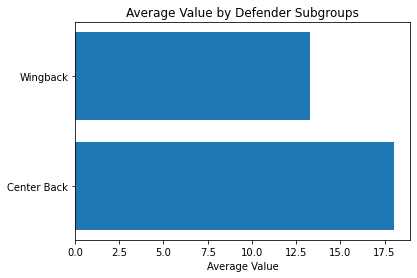

In [297]:
plt.figure()
plt.barh(defender_df.groupby('Position Subgroup').mean()['Market Values in Millions'].index,
        defender_df.groupby('Position Subgroup').mean()['Market Values in Millions'].values)
plt.title('Average Value by Defender Subgroups')
plt.xlabel('Average Value')
plt.show()

Center backs are valued by almost $5 million more dollars than wingbacks. In my **Capstone EDA and Testing** notebook, this found to be a statistically significant difference. 

#### Boxplots and Summary statistics

In [298]:
#summary statistics for center backs
print('Market value summary statistics of Center Backs')
print("_______________________________________________________")
defender_df[defender_df['Position Subgroup'] == 'Center Back'].describe()['Market Values in Millions']

Market value summary statistics of Center Backs
_______________________________________________________


count    246.000000
mean      18.030163
std       16.585417
min        2.200000
25%        5.500000
50%       11.000000
75%       24.200000
max       82.500000
Name: Market Values in Millions, dtype: float64

In [299]:
#summary statistics for wing backs
print('Market value summary statistics of Wingbacks')
print("_______________________________________________________")
defender_df[defender_df['Position Subgroup'] == 'Wingback'].describe()['Market Values in Millions']

Market value summary statistics of Wingbacks
_______________________________________________________


count    238.000000
mean      13.278109
std       13.828331
min        2.200000
25%        4.400000
50%        8.800000
75%       16.500000
max       88.000000
Name: Market Values in Millions, dtype: float64

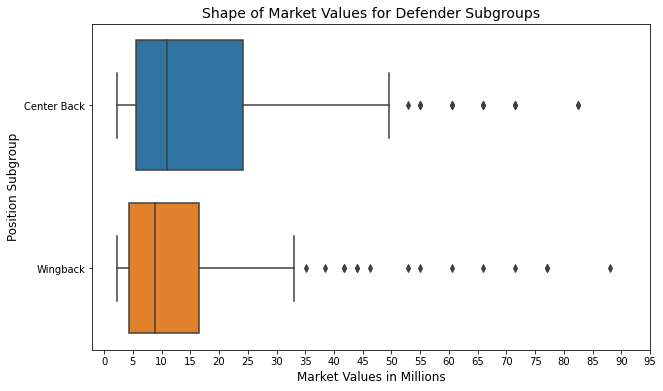

In [300]:
#boxplot of defender subgroup
plt.figure(figsize=(10,6))
sns.boxplot(data = defender_df, x='Market Values in Millions', y = 'Position Subgroup')
#details
plt.title('Shape of Market Values for Defender Subgroups', fontsize =14)
plt.xlabel('Market Values in Millions', fontsize =12)
plt.ylabel('Position Subgroup', fontsize =12)
plt.xticks(range(0, 100, 5))
plt.show()

*Wingbacks* are again shown to be valued less, as their interquartile range is **7 million** less than *centerbacks*. However, the top end at both positions is comparable. The gap in the median is also notably less than the gap in average. 

### Converting `Position Subgroup` to dummy variables
We are done analyzing the subgroups, we can covert them to dummy variables. To avoid perfect collinearity between these dummy columns, I am going to set drop_first to true. Because there are only **2** subgroups, the column that is left will be binary where 1 is being that subgroup and 0 in being the other subgroup

In [376]:
#creating copy for futurue use
defender_df_master = defender_df.copy()

In [302]:
#coverting to dummies
defender_df = pd.get_dummies(defender_df, prefix = ['subg'], columns = ['Position Subgroup'], drop_first=True)

#check
defender_df.columns

Index(['Name', 'Age', 'Market Values in Millions', '90s', 'Gls/90', 'Ast/90',
       'PK/90', 'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90', 'xG/90',
       'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate',
       'Carr

The **center back** subgroup was dropped. If `subg_Wingback` = 1, the player is **wingback**. If `subg_Wingback` = 0, the player is **center back**. 

## Dropping `Position Group` and `Name`  
`Position Group` is still in the columns list. I can drop that as all of the players in this data frame are *defenders*. Name does not provide useful information for the model. 

In [303]:
#dropping the name
defender_df.drop(columns = ['Name','Position Group'], inplace = True)

## Shape of Target and Features
The final step before modeling is looking at the distributions of the feature and target variables. First the target needs to be separated from the feature variables. This makes modeling a little easier, and needs to be done once modeling starts, so I am just going to split the target and feature variables now. 

### Splitting up Target and Features
Note that there are two splits going on for the feature variables but only one for the target variables. I am splitting the stats only data frame for the baseline and the defender frame I will be using for the other models. The target set is the same for both. 

In [304]:
#target variable
y_defender = defender_df['Market Values in Millions']

#feature variable
X_defender = defender_df.drop(columns = ['Market Values in Millions'])
X_so_defender = defender_stats.drop(columns = ['Market Values in Millions'])


### Target Variable Distributon


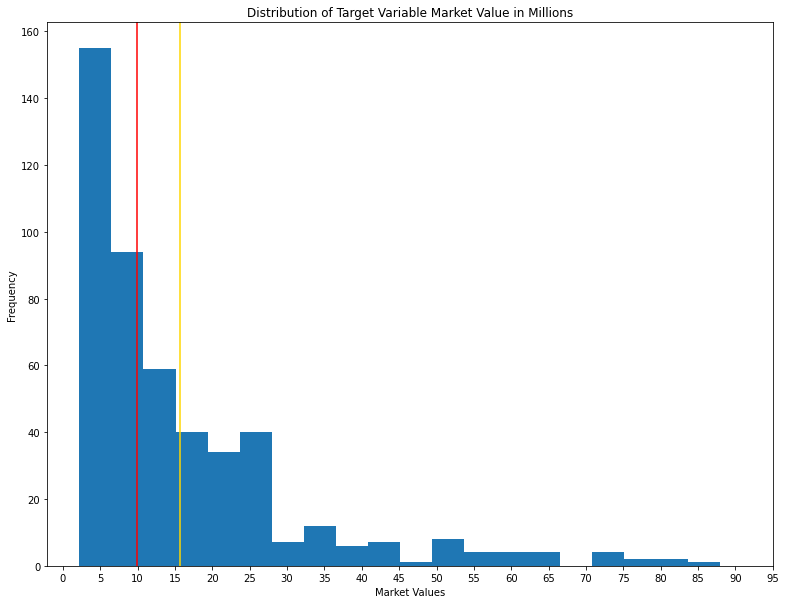

In [305]:
plt.figure(figsize = (13,10))
plt.hist(y_defender, bins = 20)
plt.title('Distribution of Target Variable Market Value in Millions')
plt.xlabel('Market Values')
plt.ylabel('Frequency')
plt.axvline(defender_df['Market Values in Millions'].median(), c = 'r')
plt.axvline(defender_df['Market Values in Millions'].mean(), c = 'gold')
plt.xticks(range(0, 100, 5))
plt.show()

There is heavy right skew in the market values of the defenders in this data set. I predict that this will be the case for all of the position groups. Most of the players will be to the left of the mean market value, and a select few superstars will create a long tail off to the right of the distribution. The skew of this data could be removed by taking the natural logarithm of the target variable.

### Feature Variable Distribution

In [306]:
#importing skew
from scipy.stats import skew

#creating box plot feature function
def Boxplot_Features(dataframe):
    '''
    Takes a data frame. Pulls out numeric features and returns a boxplot and the skewness of each column
    
    Inputs: dataframe - a dataframe of your choice
    
    Returns: Boxplots and skewness of each numeric column in your dataframe
    '''
    #pulling all numeric columns
    numeric_columns = dataframe.select_dtypes(include = 'number')
    #box plots for each columns
    for column in numeric_columns.columns:
        skewness = skew(numeric_columns[column])
        print(f'The skewness for {column} is: {skewness}')
        plt.figure()
        sns.boxplot(data = numeric_columns, x = column, orient='h')
        plt.title(f'Distribution of {column}')
        plt.show()
        print('')

The skewness for Age is: 0.18079361280052364


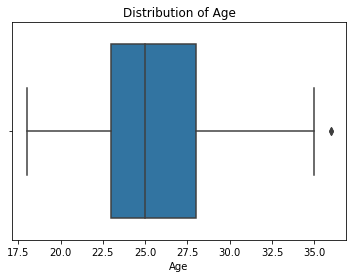


The skewness for 90s is: -0.1601864428027604


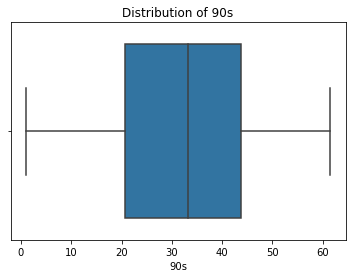


The skewness for Gls/90 is: 1.5340339388928865


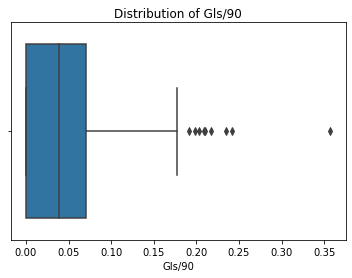


The skewness for Ast/90 is: 1.4554125277877419


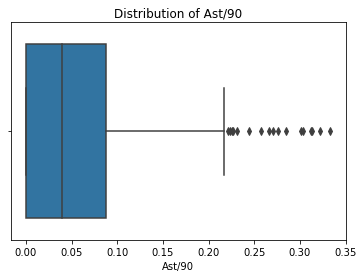


The skewness for PK/90 is: 11.831169247025754


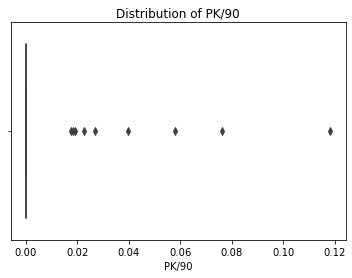


The skewness for Non PK Gls/90 is: 1.524756088072687


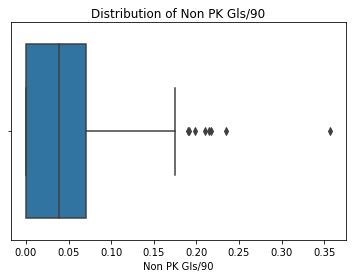


The skewness for Yellow Cards/90 is: 4.266463789159519


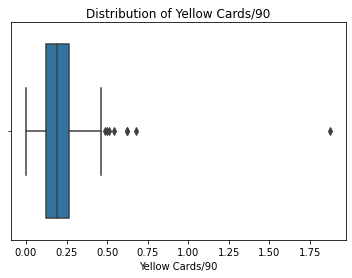


The skewness for Red Cards/90 is: 5.548878911386148


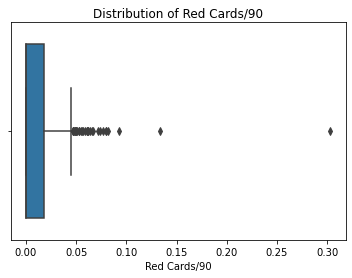


The skewness for xG/90 is: 1.6599132249415467


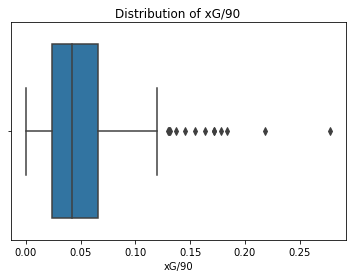


The skewness for non PK xG/90 is: 1.9547888542619682


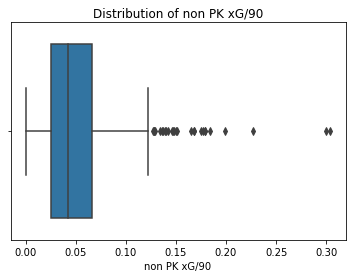


The skewness for xA/90 is: 1.8406312932561169


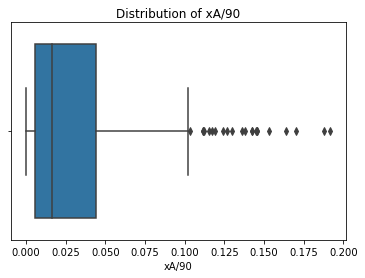


The skewness for Shots/90 is: 1.0586606474285105


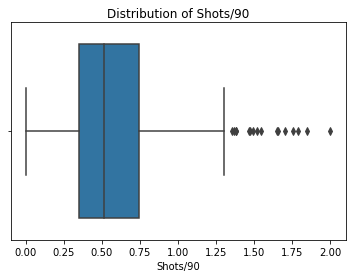


The skewness for Shots on Target/90 is: 1.649104729364631


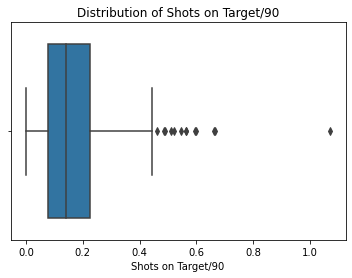


The skewness for Free Kicks/90 is: 4.950372114730685


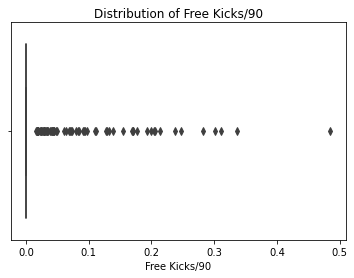


The skewness for Pass Cmp/90 is: 0.40877890636838454


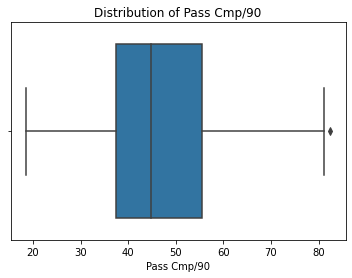


The skewness for Pass Cmp Pctg is: -0.4048824321999204


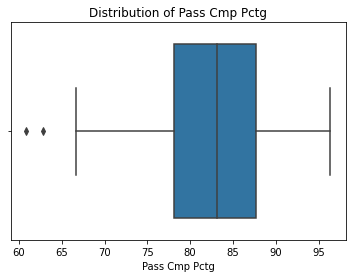


The skewness for Short Pass Cmp/90 is: 0.6395982732600848


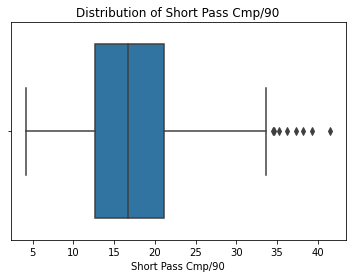


The skewness for Short Pass Cmp Pctg is: -0.7786335993328317


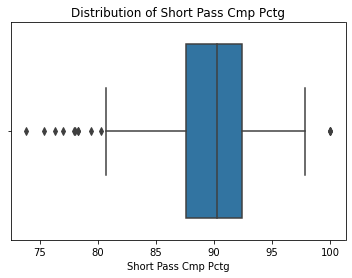


The skewness for Medium Pass Cmp/90 is: 0.621657626712185


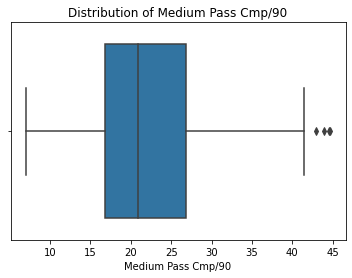


The skewness for Medium Pass Cmp Pctg is: -0.5871906279081366


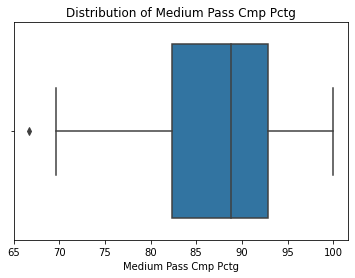


The skewness for Long Pass Cmp/90 is: 0.7618431539201949


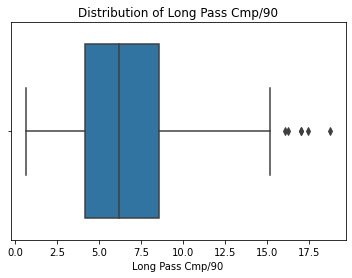


The skewness for Long Pass Cmp Pctg is: -0.0736725098802072


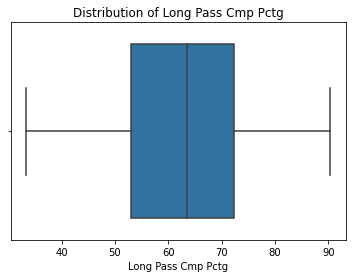


The skewness for Attacking Passes/90 is: 0.8836613571328203


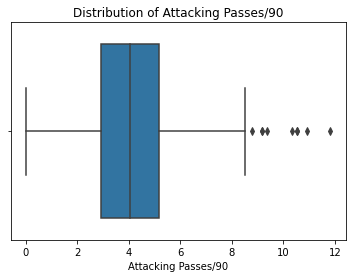


The skewness for Successful Box Crosses/90 is: 1.259829753821193


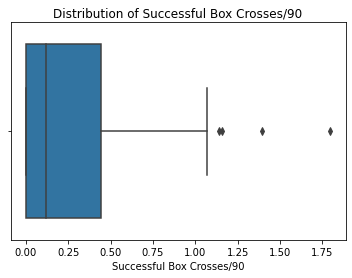


The skewness for Progressing Passes/90 is: 0.6431983000496071


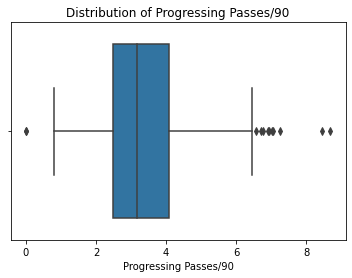


The skewness for Through Balls/90 is: 2.69705918985464


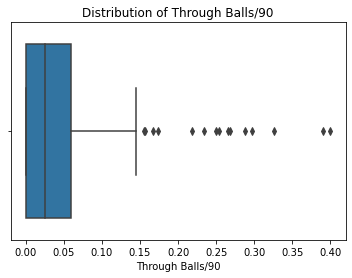


The skewness for Passes under pressure/90 is: 0.640115935403542


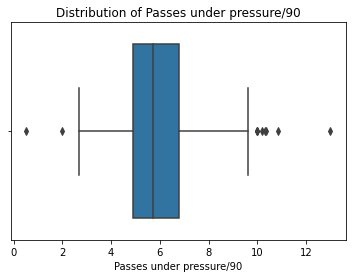


The skewness for Switches/90 is: 1.2383955269148397


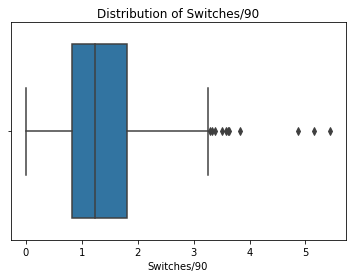


The skewness for Crosses/90 is: 0.8735236220642204


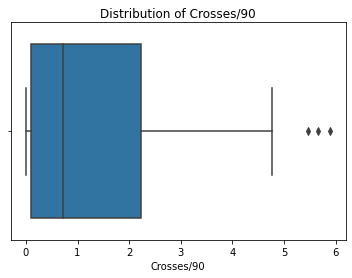


The skewness for Bad Passes/90 is: 0.3752584695632893


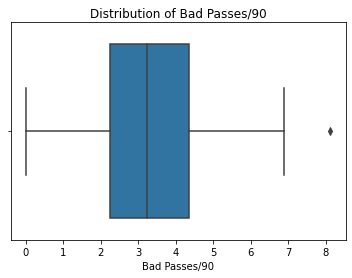


The skewness for SCA/90 is: 0.9700765034760173


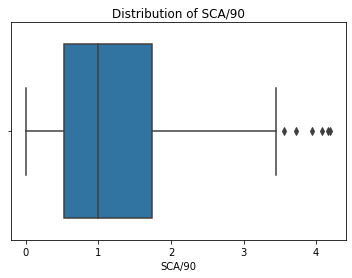


The skewness for GCA/90 is: 1.0583997967905734


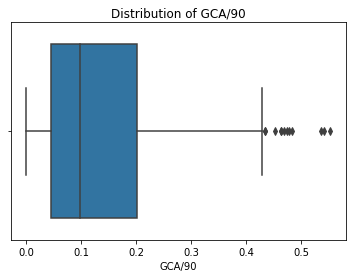


The skewness for Tkl Won/90 is: 0.5493020785697634


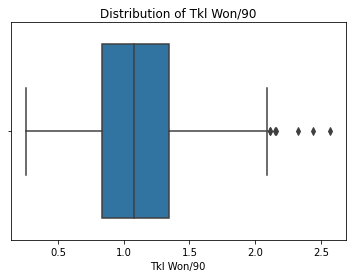


The skewness for Tkl Success Rate is: 0.42548331941104567


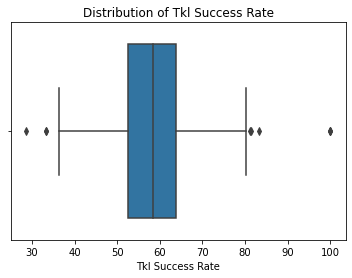


The skewness for Tkl vs Dribbles/90 is: 0.765881545413302


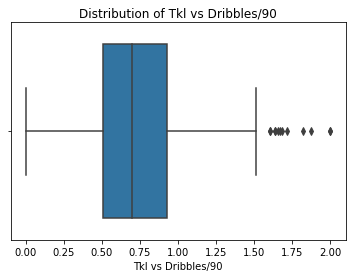


The skewness for Tkl vs. dribbles Success Rate is: -0.03629247380292033


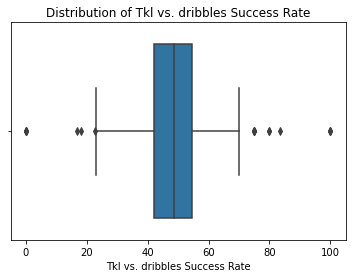


The skewness for Successful Presses/90 is: 0.5131576999364268


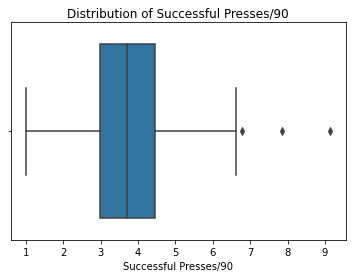


The skewness for Press Success Rate is: 0.06610103182314235


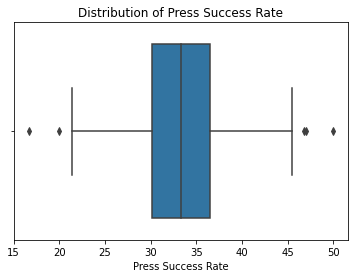


The skewness for Blocks/90 is: 1.5340745872561612


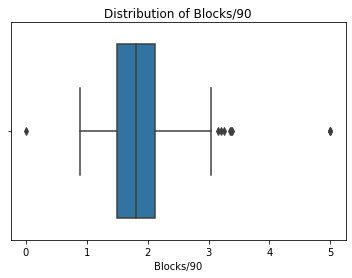


The skewness for Int/90 is: 0.8281596055585401


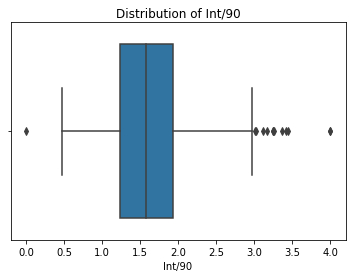


The skewness for Clearances/90 is: 0.8467785328738382


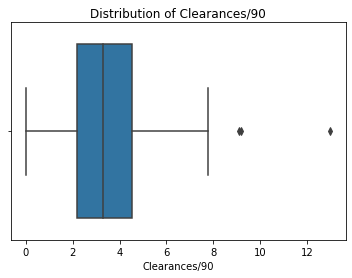


The skewness for Errors/90 is: 7.886852966592305


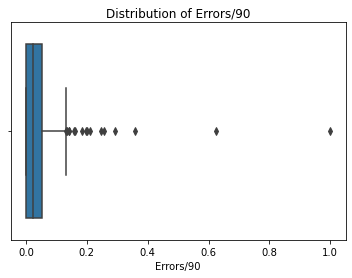


The skewness for Touches/90 is: 0.33940111246107774


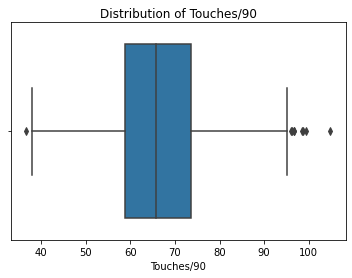


The skewness for Mid 3rd Touches/90 is: 0.7001762771054816


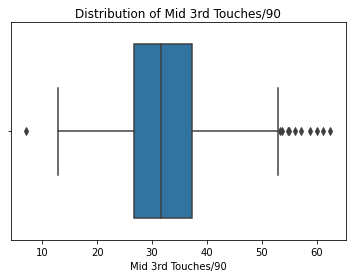


The skewness for Att 3rd Touchs/90 is: 0.567093038588498


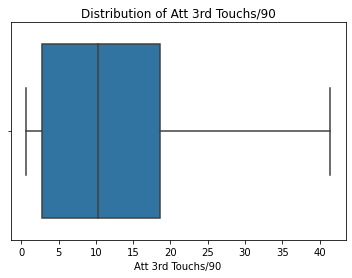


The skewness for Att Pen Touches/90 is: 1.2701471045749217


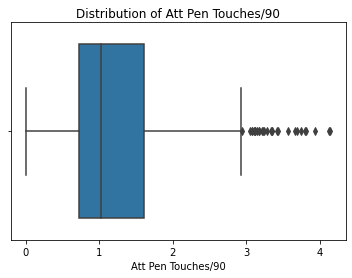


The skewness for Successful Dribbles/90 is: 1.7592444984763145


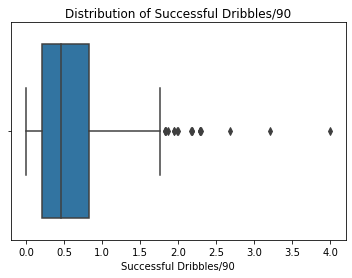


The skewness for Dribble Success Rate is: -0.5865026501504064


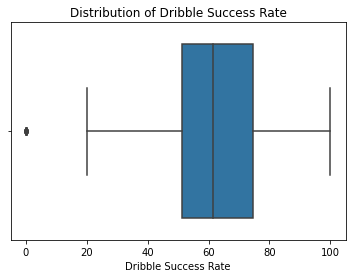


The skewness for Carries/90 is: 0.38758184674752616


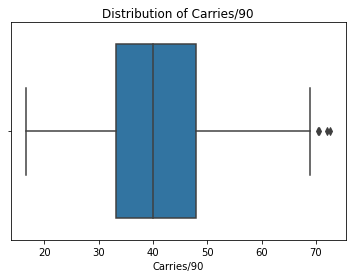


The skewness for Progressive Carries/90 is: 0.5311938587141289


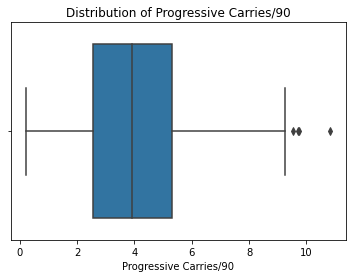


The skewness for Attacking Carries/90 is: 0.7241970802519141


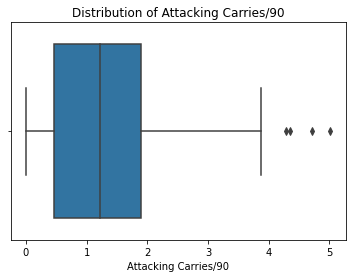


The skewness for Bad Dribbles /90 is: 1.4592391966101104


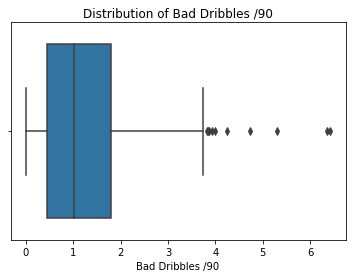


The skewness for Rec/90 is: 0.39962934779395265


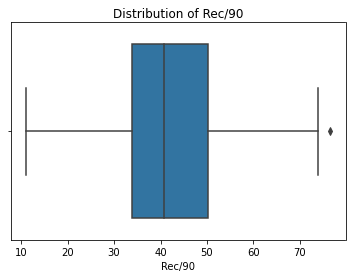


The skewness for Rec Success Rate is: -0.9923103277427306


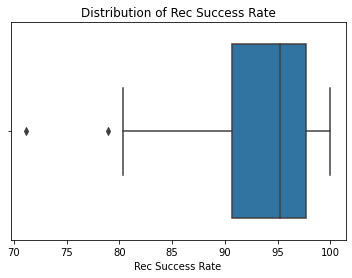


The skewness for Fouls Committed/90 is: 1.7652872436542753


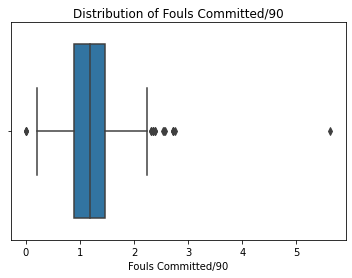


The skewness for Fouls drawn/90 is: 1.1040222067835554


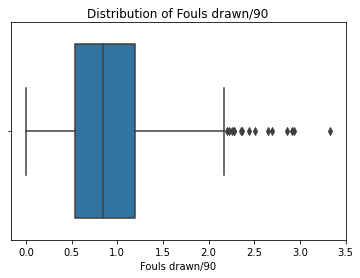


The skewness for PKs won/90 is: 3.174595219012109


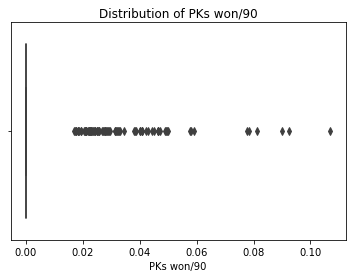


The skewness for PKs conceded/90 is: 1.5624727134251124


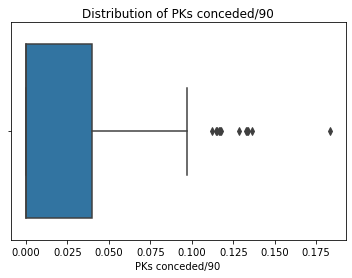


The skewness for Loose Balls Recov/90 is: 0.4594994960905194


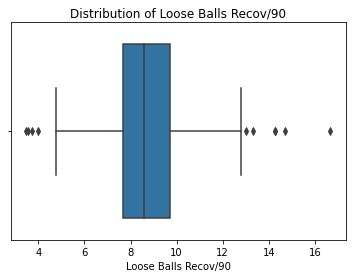


The skewness for Aerial Battles Won/90 is: 0.48209259590780246


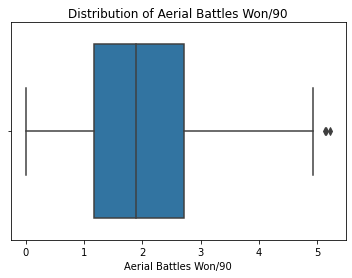


The skewness for Aerial Battle Success Rate is: -0.7285852846371087


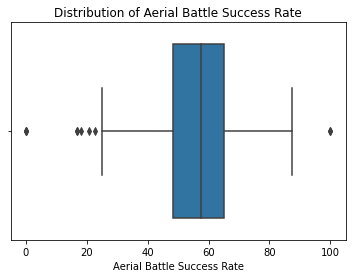


The skewness for Club Tier is: 0.09930603879771802


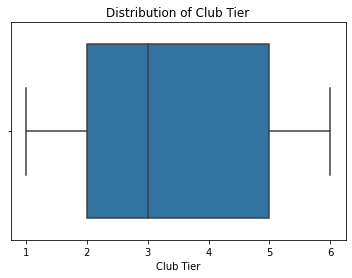


The skewness for European is: -1.246483912128763


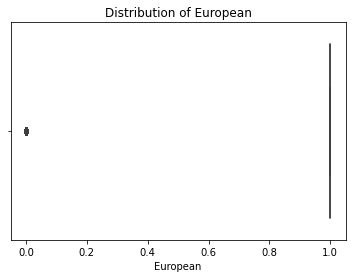


The skewness for subg_Wingback is: 0.03306236795662397


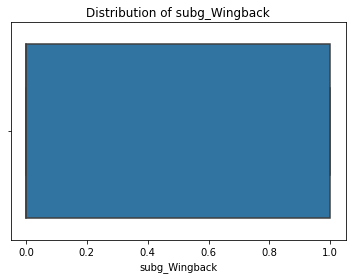

In [307]:
#feature box plots
Boxplot_Features(X_defender)

There is a lot of skewness in the features as well. The passing and dribbling stats are all skewed, which make sense as most center backs are nowhere near as involved in the offense as **wingbacks**. It is the opposite for things like clearances and blocks, where center backs more commonly perform those tasks. 

I could transform the skewed of these features, but for ease of interpretation, I am not going to.

### Outliers

There are also a lot of outliers in the data set as well. They fall into 2 categories, which are described below. 

1) **Elite Production**
* These players just produce more of a single stat than anybody else. These are instructive and will not be altered. 

2a) **Low 90s - Per 90 minutes statistics**
* If they have played the minimum amount of 90s (1) than all the stats produced in that time will represent their per 90 stats. For the purposes of this, it will be anybody with less than *2* `90s`

2b) **Low 90s - 100% or 0% Success Rate**
* These are players who have succeeded on all or none of their respective tackles, dribbles etc. Obviously, not even the best defender in the world wins every tackle or aerial battle, so these are not representative of these players. These players have played so little, that they have been able to complete all or none of the actions they took. Which is why they fall under the same category as **Low 90s**

Below are examples of these outliers. I used my excel spreadsheet to check these categories, which is how I know which category they fall under. 

#### Elite Production Outliers - `xG/90`

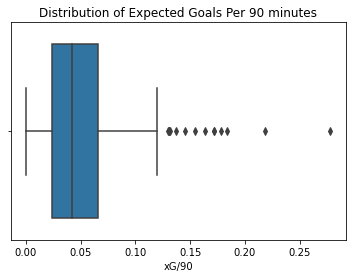

In [308]:
#plotting box plot
plt.figure()
sns.boxplot(data = defender_df, x = 'xG/90', orient='h')
plt.title(f'Distribution of Expected Goals Per 90 minutes')
plt.show()

We can see that there are two extreme outliers past 0.2 expected goals per minutes. They are shown in the plot below.

In [309]:
#over 0.2 xg defenders
defender_df_master[defender_df_master['xG/90'] > 0.2][['Name', '90s', 'Market Values in Millions', 'xG/90']]

,Name,90s,Market Values in Millions,xG/90
708,Sergio Ramos,16.9,8.8,0.278107
1116,Alberto Moreno,15.1,5.5,0.218543


These players have played enough games that we can believe in there statistics.  

#### Low 90s - Yellow Cards/90 

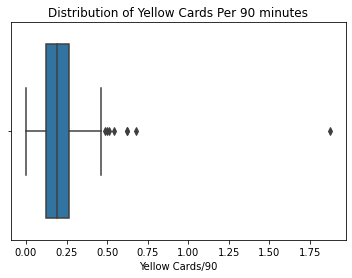

In [310]:
#plotting box plot
plt.figure()
sns.boxplot(data = defender_df, x = 'Yellow Cards/90', orient='h')
plt.title(f'Distribution of Yellow Cards Per 90 minutes')
plt.show()

There is a huge outlier in this data set. He is shown below.

In [311]:
#yellow card outlier
defender_df_master[defender_df_master['Yellow Cards/90'] > 0.8][['Name','Age', '90s','Market Values in Millions', 'Yellow Cards/90']]

,Name,Age,90s,Market Values in Millions,Yellow Cards/90
1161,Riccardo Calafiori,19,1.6,4.4,1.875


This is a player who undoubtedly would have his yellow cards per 90 fall back to the pack if they played in more games.

#### What To Do With These Outliers
The short answer is nothing, at least not right now. For the *elite production* outliers, obviously we can't change or impute any new values. Those statistics are earned. For the *Low 90s* outliers, I want to see if the model can pick up on their value, because it must be coming from somewhere. I am going to wait and see if models can determine the source of the value. If I had to guess it's age. These players are usually developmental projects, young upstarts who have a lot of natural talent but are not quite ready to receive regular playing time. If I don't think the model is picking up on the outliers, I will come back to this issue and resolve it a different way.  

## Baseline Model
I am going to create a baseline model. I will only be using statistics from the data set, none of the features I engineered above. This will serve as the measuring stick for the final model. I will use a Linear Regression model for my baseline. 

### Train test split
I need to split my data into a training set and a test set. Because this is a small dataset, I will be using a 60-40 train test split. The training score for the baseline model will give me an indication of how useful linear models will be. The test score will serve as the actual baseline. 

In [312]:
#importing train test split
from sklearn.model_selection import train_test_split

#splitting data set
X_defender_baseline_train,X_defender_baseline_test,y_defender_baseline_train,y_defender_baseline_test = train_test_split(X_so_defender,
                                                                                                                        y_defender,
                                                                                                                        test_size=0.4,
                                                                                                                        random_state = 21)

#checking shapes
print(f"There are {X_defender_baseline_train.shape[0]} observations and {X_defender_baseline_train.shape[1]} features in the feature training set")
print(f"There are {X_defender_baseline_test.shape[0]} observations and {X_defender_baseline_test.shape[1]} features in the feature training set")
print(f"There are {y_defender_baseline_train.shape[0]} observations in the target training set")
print(f"There are {y_defender_baseline_test.shape[0]} observations in the target training set")

There are 290 observations and 61 features in the feature training set
There are 194 observations and 61 features in the feature training set
There are 290 observations in the target training set
There are 194 observations in the target training set


The shapes match up, I can begin modeling.

### Defender Baseline

In [313]:
#importing linear regression
from sklearn.linear_model import LinearRegression

#instantiating
defender_baseline = LinearRegression()

#fitting
defender_baseline.fit(X_defender_baseline_train, y_defender_baseline_train)

#scoring
defender_base_train_score = round(defender_baseline.score(X_defender_baseline_train, y_defender_baseline_train) * 100, 2)
defender_base_test_score = round(defender_baseline.score(X_defender_baseline_test, y_defender_baseline_test) * 100, 2)

print(f"Train Score: {defender_base_train_score}%")
print(f"Test Score: {defender_base_test_score}%")

Train Score: 57.52%
Test Score: 12.84%


The model metric I will be using in this notebook will be r-squared. This measures the proportion of variance in the target that is measured by the model. 

There is clear over-fitting here, but the train r-squared of **57.52%** is promising for upcoming models. The test r-squared, **12.84** is bad, but it provides a lot of room for improvement. I'm going to add this test score to a list for future plotting. 

In [314]:
# creating baseline score list
baseline_r2 = [22.88]

## Defender Models with engineered features
I will now introduce engineered features to the data set to see if it is improving on the score

#### Train test split

In [315]:
#splitting
X_defender_train, X_defender_test, y_defender_train, y_defender_test = train_test_split(X_defender, y_defender, 
                                                                                        test_size=0.4,
                                                                                        random_state=21)

#checking shapes
print(f'There are {X_defender_train.shape[0]} rows and {X_defender_train.shape[1]} columns in X_defender_train')
print(f'There are {X_defender_test.shape[0]} rows and {X_defender_test.shape[1]} columns in X_defender_test')
print(f'There are {y_defender_train.shape[0]} rows y_defender_train')
print(f'There are {y_defender_test.shape[0]} rows in y_defender_test')

There are 290 rows and 64 columns in X_defender_train
There are 194 rows and 64 columns in X_defender_test
There are 290 rows y_defender_train
There are 194 rows in y_defender_test


#### Modeling

In [316]:
#instantiating
defender_linreg1 = LinearRegression()

#fitting
defender_linreg1.fit(X_defender_train, y_defender_train)

#scoring
defender_linreg1_train_score = round(defender_linreg1.score(X_defender_train, y_defender_train) * 100, 2)
defender_linreg1_test_score = round(defender_linreg1.score(X_defender_test, y_defender_test) * 100, 2)
print(f'The defender baseline train R-Squared is {defender_linreg1_train_score}%')
print(f'The defender baseline train R-Squared is {defender_linreg1_test_score}%')
print(f'Baseline Score: {defender_base_test_score}')

The defender baseline train R-Squared is 64.22%
The defender baseline train R-Squared is 38.64%
Baseline Score: 12.84


The test r-2 tripled to **38.64%**. The added features appear to be a success.

#### Diagnostics

Now I am going to perform some model diagnostics to see where the model is failing. First I am going to create a function to create the following plots

1. Distribution of Residuals
    - These should be a normal distribution, where the tail is tells me where the data is messing up
2. Scatter plot of fitted values and residuals
    - This should look like noise, evenly spaced and with no clear. Again, I want to see where the data is clustering will help me distinguish where the model is making mistakes
 
3. Scatter plot of fitted values and predicted values
    - This will give me an idea of how well the model is doing 

In [317]:
#functionizing model diagnostics
def LinRegDiagnostic(model, x_test, y_test):

    #creating predictions and redisuals
    predictions = model.predict(x_test)
    residuals = y_test - predictions

    plt.subplots(3,1, figsize = (10, 8))

    #plotting residuals
    plt.subplot(3,1,1)
    plt.hist(residuals, bins = 20)
    plt.xlabel('Residual')
    plt.ylabel('Frequency')
    plt.title('Distribution of Residuals for Linear Regression')


    #homoscedasticity plot
    plt.subplot(3,1,2)
    plt.scatter(predictions, residuals)
    plt.xlabel('Fitted values')
    #     plt.ylabel('Residuals')
    plt.ylabel('Residuals')
    plt.title('Size of Error Terms across Predicted Values ')
    
    
    plt.subplot(3,1,3)
    plt.scatter(predictions, y_test)
    plt.title('Predicted vs. Actual Market Values')
    plt.xlabel('Predicted Market Values')
    plt.ylabel('Actual Market Values')
    
    plt.tight_layout()
    plt.show()

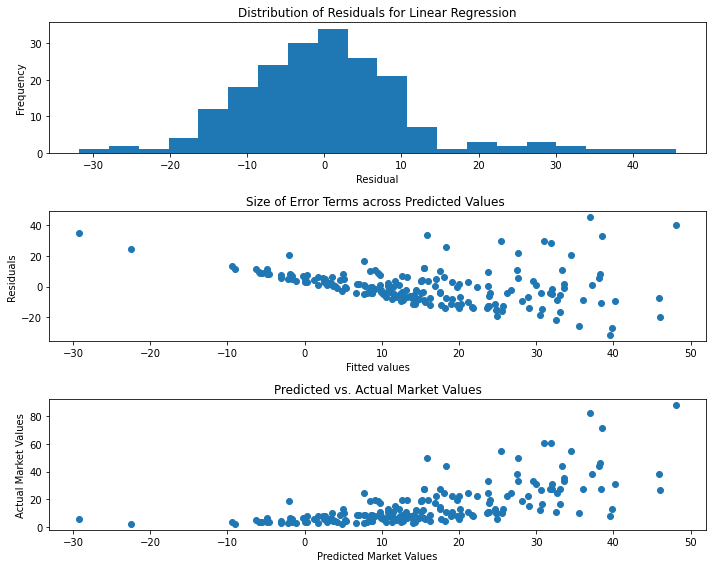

In [318]:
#running diagnostics
LinRegDiagnostic(defender_linreg1, X_defender_test, y_defender_test)

The plots above show that the model is struggling to predict data at higher values. 

The long tail on the residuals histogram tells me that is undervaluing players more than it is over valuing them. 

The scatter plot of fitted values and residuals shows two different that as fitted values increase, so does the variance between fitted values and residuals. The scatter plot between predicted and actual confirms. When actual values increase, the graph does a worse job of predicting them. 

I can also see that there are some negative fitted values. This does not make sense, as a player's value can't be less than zero. Earlier I stated that I did not want to transform my target or features if I did not have to, but using a logarithmic or root transformation would help to reduce the skew, so that will be my next step. . 

First, I want to look at the target variable in a 2D space, so I am going to use PCA to reduce the dimensionality to two dimensions. 

### Visualize data with PCA

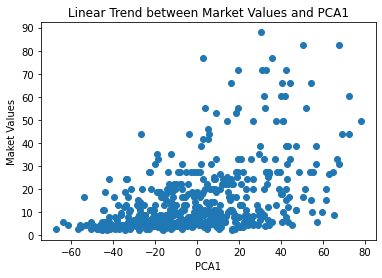

In [319]:
#importing PCA
from sklearn.decomposition import PCA


#instantiating pcA with 1 component
pca = PCA(n_components=1)
#transforming data
X_def_pca = pca.fit_transform(X_defender)

#plotting scatter plot
plt.figure()
plt.scatter(X_def_pca, y_defender)
plt.ylabel('Maket Values')
plt.xlabel('PCA1')
plt.yticks(range(0, 100, 10))
plt.title('Linear Trend between Market Values and PCA1')
plt.show()

This further confirms the takeaway from the diagnostic graph. There is a pretty strong linear trend up to **$30** million dollar valuations, where most of the data is. As the market values increase, the less of a trend there is. A transformation to the y-variable is necessary. 

## Linear Regression with Natural Logarithmic Transformed Target Variable
To solve the problem of skew I am going to use a natural logarithmic transformation of my target variable `Market Values in Millions`. I am going to transform, y_train, y_test, and y_defender (the pre-split version of the target data), as I will be using all of them at different points. This will also help eliminate negative values predictions.

### Transforming the target variable. 

In [320]:
#transforming unsplit series
log_y_defender = np.log(y_defender + 1)

#transforming train
log_y_defender_train = np.log(y_defender_train + 1)

#transforming test
log_y_defender_test = np.log(y_defender_test + 1)

### Visualizing Transformed Target Variable
In this section I am going to look at the histogram of the pre-split to see if the right skew has been improved. 

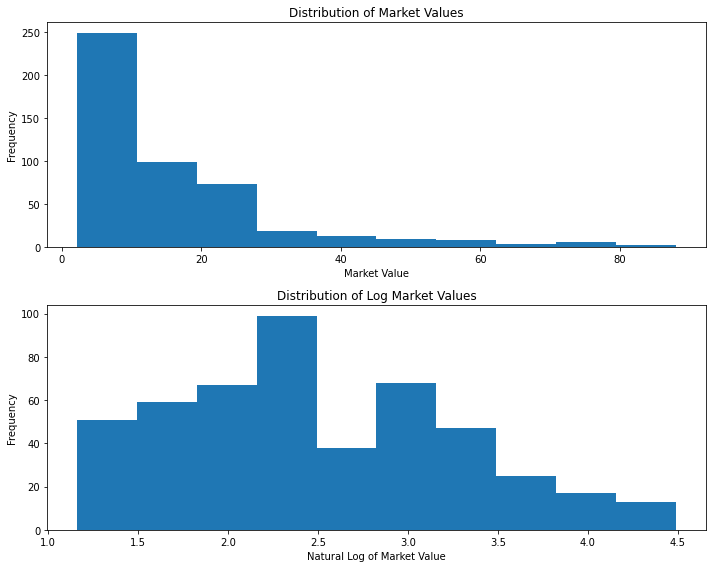

In [321]:
#creating grid
plt.subplots(2,1, figsize = (10,8))

#plotting in linear space
plt.subplot(2,1,1)
plt.hist(y_defender)
plt.xlabel('Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of Market Values')

#plotting in log space
plt.subplot(2,1,2)
plt.hist(log_y_defender)
plt.xlabel('Natural Log of Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of Log Market Values')

plt.tight_layout()
plt.show()

The transformation worked. The data is still right-skewed, but it certainly is less skewed then the untransformed data.

The next visualization will be a scatter plot with PCA1, to see if their is more linearity in the data. 

### Linearity between Features and Transformed Target with PCA1
The data has already been transformed for the baseline model, so I can reuse `x_def_scaled` in my plot. Again, I am not going to scale the data, as I am not going to use scaled data in this version of my model.

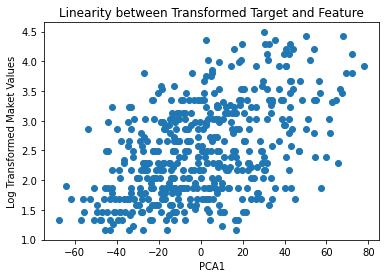

In [322]:
#plotting linear trend plot
plt.figure()
plt.scatter(X_def_pca, log_y_defender)
plt.title('Linearity between Transformed Target and Feature')
plt.ylabel('Log Transformed Maket Values')
plt.xlabel('PCA1')
plt.show()

The data appears to be more clustered than it was before. The trend is also more consistent. This bodes well for the model to come.

### Linear Regression Model with Transformed Target

I do not have to do the train/test split as the data is already split. There are no tranformations needed. I can proceed directly to modeling. 

In [323]:
#instantiate
defender_linreg_log = LinearRegression()

#fitting the model
defender_linreg_log.fit(X_defender_train, log_y_defender_train)

#scoring
training_score_log = defender_linreg_log.score(X_defender_train, log_y_defender_train)
test_score_log = defender_linreg_log.score(X_defender_test, log_y_defender_test)

print(f'Training score: {round(training_score_log * 100, 2)}%')
print(f'Testing score: {round(test_score_log * 100, 2)}%')
print(f'Previous score: {defender_linreg1_test_score}%')
print(f'Baseline score: {defender_base_test_score}')

Training score: 76.07%
Testing score: 54.62%
Previous score: 38.64%
Baseline score: 12.84


The model is still over fit, but the score jumped a significant amount again. I will move forward in log space. 

### Model Diagnostics

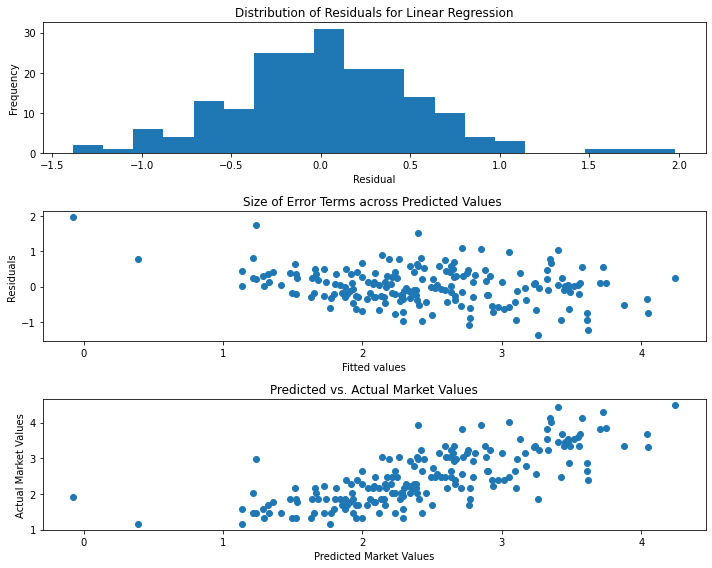

In [324]:
LinRegDiagnostic(defender_linreg_log, X_defender_test, log_y_defender_test)

These plots also look a lot better. The predicted values and market values follow a strong linear trend. The residuals have a much more normal shape to their distribution, and the plot of the error terms vs fitted values looks a lot more like noise. Now I'm going to see if some of the overfitting can be fixed by looking at the ten best predictors according to **f_regression

In [325]:
#importing ten best
from sklearn.feature_selection import SelectKBest, f_regression

#creating ten best predictors
log_ten_best = SelectKBest(f_regression, k = 10)

#transforming
X_defender_train_ten = log_ten_best.fit_transform(X_defender_train, log_y_defender_train)
X_defender_test_ten = log_ten_best.transform(X_defender_test)

#instantiating
defender_log_ten_best_lr = LinearRegression()

#fitting
defender_log_ten_best_lr.fit(X_defender_train_ten, log_y_defender_train)

#scoring
log_10_best_train_score = defender_log_ten_best_lr.score(X_defender_train_ten, log_y_defender_train) * 100
log_10_best_test_score = defender_log_ten_best_lr.score(X_defender_test_ten, log_y_defender_test) * 100

print(f'Training score: {round(log_10_best_train_score,2)}%')
print(f'Testing score: {round(log_10_best_test_score, 2)}%')

Training score: 59.95%
Testing score: 51.16%


The Model is less over-fit, and the score dropped only slightly. This means that removing features is a strategy that might be beneficial.

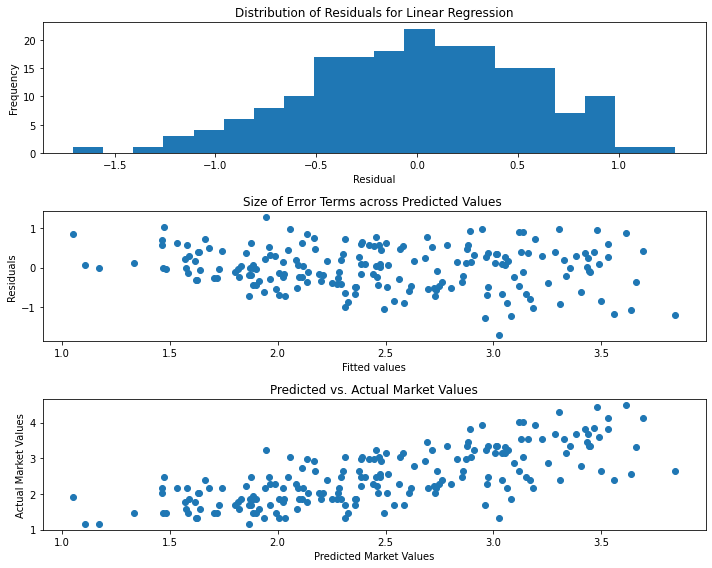

In [326]:
#checking diagnostics
LinRegDiagnostic(defender_log_ten_best_lr, X_defender_test_ten, log_y_defender_test)

The scoring is down, but the diagnostics look the same if not better, particularly the `Size of Error Terms across Predicted Values` scatter plot, which looks a lot more noisy. 

Now I am going to test this out with scaled data. I am going to use the **MinMaxScaler** to see if it improves R-squared. I am going to use the **MinMaxScaler** because I do not want any 0 values, as that does not make sense in the context of the problem. You can't have 0 for any of the feature variables.

In [327]:
#importing scaler
from sklearn.preprocessing import MinMaxScaler

#instantiating scaler
mm_scaler = MinMaxScaler()

#fitting scaler and transforming test and traing
X_defender_train_scaled = mm_scaler.fit_transform(X_defender_train)
X_defender_test_scaled = mm_scaler.transform(X_defender_test)

#running linear regression
scaled_defender_linreg = LinearRegression()
scaled_defender_linreg.fit(X_defender_train_scaled, log_y_defender_train)

#scoring
scaled_train_score = scaled_defender_linreg.score(X_defender_train_scaled, log_y_defender_train)
scaled_test_score = scaled_defender_linreg.score(X_defender_test_scaled, log_y_defender_test)
print(f"Training Score for Linreg with scaled features: {round(scaled_train_score * 100, 2)}")
print(f"Test Score for Linreg with scaled features: {round(scaled_test_score * 100, 2)}")

Training Score for Linreg with scaled features: 76.07
Test Score for Linreg with scaled features: 54.59


Did not improve the score. It is not worth investigating further or sacrificing intepretability.

From the unscaled linear regression we can see that attacking stats are again the top predictors. 5 of the 10 features with the highest coefficients are attacking stats (`Goals/90`, `Shots on Target/90`, `Successful Dribbles /90`, `Att Pen /90 (touches in the opponents penalty area`, and `xG`). 7 of the 10 most positively correlated, selected through **f_regression** are attacking stats as well. Another thing to point out is that is a lot of similar features within and across these two groups. There is probably a lot of collinearity happening in this model. To deal with this the next model that I am going use will be a Lasso Regression. This will serve two purposes.

1) It will help with feature selection. Lasso regression uses L1 penalty, which will zero out the coefficient of features it deems unimportant
2) It will help with collinearity. Lasso regressions take into account correlated features when assigning the penalty.



## Lasso Regression
I am going to continue to model on the natural logarithmic transformed target, as it performed much better. I am also going to use a grid search to optimize the hyper-parameter *alpha*, which effects how much regularization the model uses. The higher *alpha* is, the more regularization is taking place. The grid search will find the best model through cross validation. Because the training set is small, only 292 observations, I am only going to use 2 validation folds. That means that half of the data will be but into the validation set for each fold.


I am also going to use this opportunity to test scaling my features, but that will come later. I want to see what kind of score I get before scaling.

In [328]:
#importing gridsearch
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.pipeline import Pipeline

#creating pipeline
estimators = [('model', Lasso(random_state=21, max_iter=1000000))]
pipeline = Pipeline(estimators)

#creating parameter list
params = {'model__alpha': [10**-3, 10**-2, 10**-1, 1, 10**1, 10**2, 10**3]}
grid_search = GridSearchCV(pipeline, param_grid=params, cv=2)

#fitting grid
defender_fitted_search = grid_search.fit(X_defender_train, log_y_defender_train)

In [329]:
#pulling best model
defender_grid_best_model = defender_fitted_search.best_estimator_
defender_grid_best_model

Pipeline(steps=[('model', Lasso(alpha=0.1, max_iter=1000000, random_state=21))])

The best model had a regularization alpha of 0.1, so not a lot of regularization. Now to look the scoring of the model. Before doing that I have to retrain the one hot encoder to on the test and training set.

In [330]:
print(f"Lasso Training Score: {round(defender_grid_best_model.score(X_defender_train, log_y_defender_train)*100, 2)}%")
print(f"Lasso Test Score: {round(defender_grid_best_model.score(X_defender_test, log_y_defender_test)*100, 2)}%")
print(f"Previous Test Score: {round(test_score_log* 100, 2)}%")
print(f"Baseline Score: {defender_base_test_score}%")

Lasso Training Score: 66.88%
Lasso Test Score: 62.59%
Previous Test Score: 54.62%
Baseline Score: 12.84%


There was another score increase, this time by almost **8%** to **62.22%**.

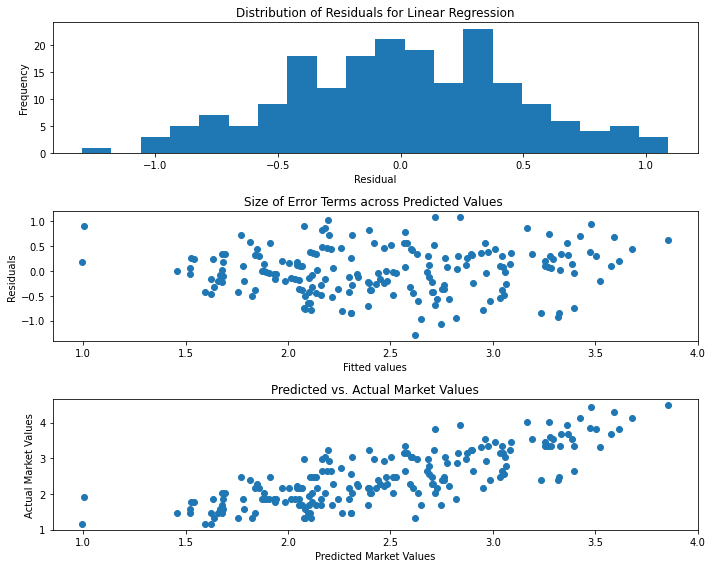

In [331]:
LinRegDiagnostic(defender_grid_best_model, X_defender_test, log_y_defender_test)

Again we see that the diagnostic models look pretty good. There residuals do not follow any trend, and there is a clear linear relationship between the predicted and the actual values. Now, let's see if the collinearity problem was solved. 

In [332]:
#creating lasso model
defender_lasso = Lasso(alpha=0.1, max_iter=1000000, random_state=21)
defender_lasso.fit(X_defender_train, y_defender_train)

#creating data frame of coefficients
lasso_coefficients_df = pd.DataFrame({'Feature': X_defender_train.columns,
                                     'Lasso Coef': defender_lasso.coef_})

#pulling number of non zero coefficients
no_zeroes_df = lasso_coefficients_df[lasso_coefficients_df['Lasso Coef'] != 0]

#printing number of zeroed out columns
print(f'There are {no_zeroes_df.shape[0]} with non-zero coefficients') 

There are 36 with non-zero coefficients


The test score has barely changed, the model lo longer seems to be over-fitting, and we are down to 40 features. 

In [333]:
#resetting index
no_zeroes_df.reset_index(drop=True, inplace=True)

#sorting coefficients
no_zeroes_df.sort_values('Lasso Coef', ascending = False)

,Feature,Lasso Coef
34,Club Tier,3.906584
24,Successful Dribbles/90,3.118588
9,Switches/90,2.020817
18,Int/90,1.057477
5,Medium Pass Cmp/90,0.912584
27,Progressive Carries/90,0.694698
32,Loose Balls Recov/90,0.684899
29,Rec/90,0.609323
17,Blocks/90,0.608710
1,90s,0.414048


Some of these do not make sense. It doesn't make sense that `Long Pass Cmp/90` has a negative coefficient and `Medium Pass Comp/90` has a positive one. I am going to pull columns that are similar in nature and look at pair plots between the all of them. This will help me determine which I should leave in the feature pool and which I should remove. I am going to do this for all of the similar features to avoid similar confusions downstream. 

All "bad" categories will be left out of these lists, as they are the only "negative" statistics in the dataset. 

For defenders, I am going to leave in all of the defensive stats, to see which of them are the most important. I am going to create the list for future use, but will not use it for this model. That includes the two tackles lists, the aerial list, and the other defensive stats list. If there are issues downstream, I will fix them when they arise. 


In [334]:
#creating lists
scoring  = ['Gls/90', 'Non PK Gls/90', 'xG/90', 'non PK xG/90', 'PK/90']
shooting = ['Shots/90', 'Shots on Target/90']
fouls = ['Yellow Cards/90', 'Red Cards/90','Fouls Committed/90',
        'Fouls drawn/90']
passing = ['Pass Cmp/90',
           'Pass Cmp Pctg', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg',
          'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90',
          'Long Pass Cmp Pctg', 'Progressing Passes/90']
crosses = ['Successful Box Crosses/90', 'Crosses/90']
creation = ['SCA/90', 'GCA/90']
assists = ['Ast/90', 'Through Balls/90', 'xA/90', 'Attacking Passes/90']
tackles = ['Tkl Won/90','Tkl Success Rate']
tackles_vs_dribbles = ['Tkl vs Dribbles/90','Tkl vs. dribbles Success Rate']
pressing = ['Successful Presses/90','Press Success Rate'] 
other_defensive_stats = ['Blocks/90', 'Int/90', 'Clearances/90']
touches = ['Mid 3rd Touches/90', 'Att 3rd Touchs/90','Att Pen Touches/90']
dribbles = ['Successful Dribbles/90', 'Dribble Success Rate']
carries = ['Carries/90', 'Progressive Carries/90', 'Attacking Carries/90']
recieving = ['Rec/90', 'Rec Success Rate']
aerial = ['Aerial Battles Won/90',
       'Aerial Battle Success Rate']

#creating list of the breakdowns for reference
stats_breakdown = ['scoring', 'fouls', 'passing', 'crosses',
                   'creation', 'assists', 'tackles', 'tackles_vs_dribbles',
                   'pressing', 'other_defensive_stats', 'touches', 'dribbles',
                   'carries', 'recieving', 'aerial']

In [335]:
#for my own reference for list creation above
X_defender.columns

Index(['Age', '90s', 'Gls/90', 'Ast/90', 'PK/90', 'Non PK Gls/90',
       'Yellow Cards/90', 'Red Cards/90', 'xG/90', 'non PK xG/90', 'xA/90',
       'Shots/90', 'Shots on Target/90', 'Free Kicks/90', 'Pass Cmp/90',
       'Pass Cmp Pctg', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg',
       'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90',
       'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate',
       'Carries/90', 'Progressive Carries/90', 'A

Now I will examine the lists created above to see which of the features within each should be kept. Again these lists will be used for future models as well.

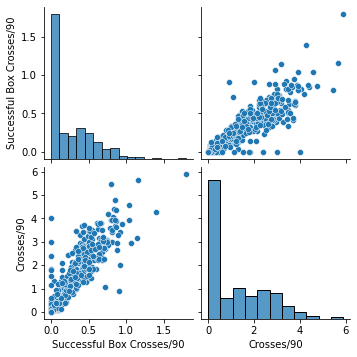

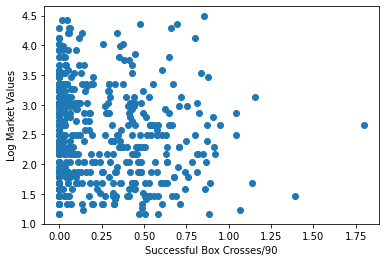

Corrlation coefficient between Successful Box Crosses/90 and log_y_defender (-0.11430788706196796, 0.011851869187893696)



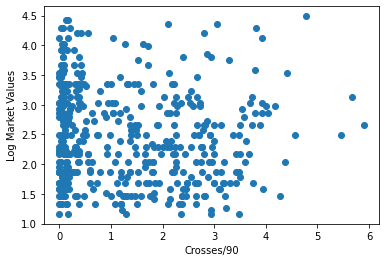

Corrlation coefficient between Crosses/90 and log_y_defender (-0.09469678699146912, 0.03728546754549782)



In [336]:
#istantiating for later use
drop_columns = []

from scipy.stats import pearsonr

#plotting crossing pair plots
sns.pairplot(data = X_defender, vars = crosses)

#scatter plots between features and targets
for col in crosses:
    plt.figure()
    plt.scatter(X_defender[col], log_y_defender)
    plt.xlabel(col)
    plt.ylabel('Log Market Values')
    plt.show()
    
    print(f'Corrlation coefficient between {col} and log_y_defender {pearsonr(X_defender[col], log_y_defender)}')
    print('')

I am going to keep `Crosses/90` as a stronger correlation coefficient. 

I am going to create a function to make this process more efficient.

In [337]:
#adding successful box crosses
drop_columns.append('Successful Box Crosses/90')

In [338]:
def CollinearityCheck(features_list):
    '''
    This function will help check for collinearity amongst feature variables. 
    It will also print out scatter plots and correlation coefficients for each feateure in the list and the target variable.
    inputs
    Feature List - A list of features in the dataset
    Output
    Pairplots of features in feature list and scatter plots and correlation coefficient between each feature and the target variable.
    
    '''
    
    
    sns.pairplot(data = X_defender, vars = features_list)

    #scatter plots
    for col in features_list:
        plt.figure(figsize = (5, 5))
        plt.scatter(X_defender[col], log_y_defender)
        plt.xlabel(col)
        plt.ylabel('Log Market Values')
        plt.show()
        
        print(f'Corrlation coefficient between {col} and log_y_defender {pearsonr(X_defender[col], log_y_defender)}')
        print('')

#### Defender Assists Collinearity Check

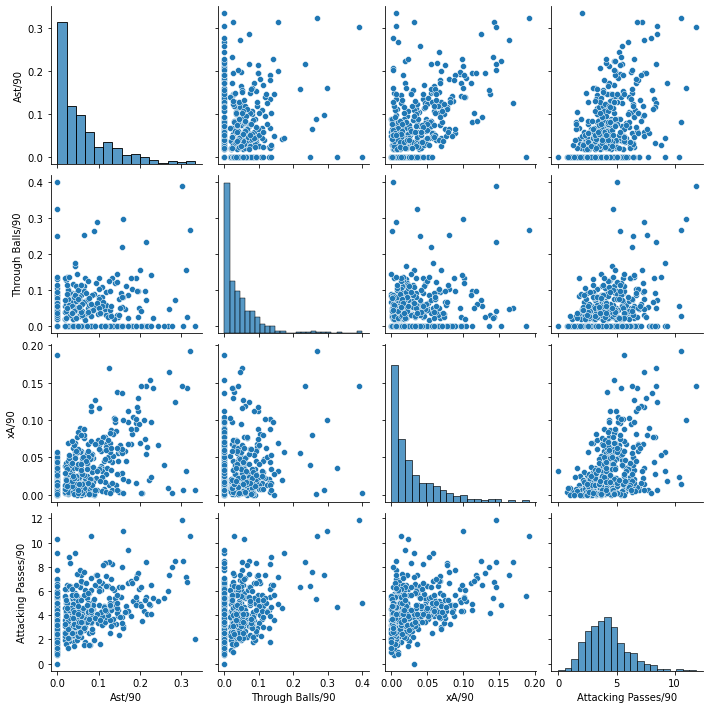

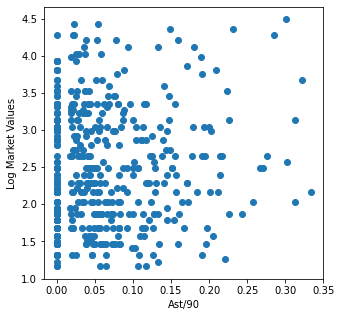

Corrlation coefficient between Ast/90 and log_y_defender (0.07015440583743886, 0.12324241852142764)



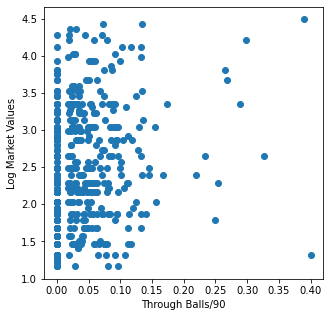

Corrlation coefficient between Through Balls/90 and log_y_defender (0.18942534899721297, 2.733318780085714e-05)



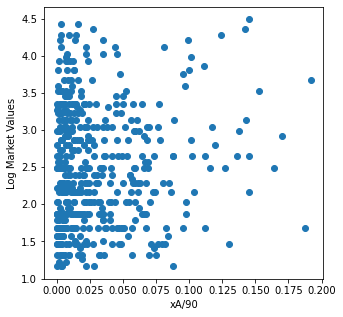

Corrlation coefficient between xA/90 and log_y_defender (0.08769504569675178, 0.05385286120933335)



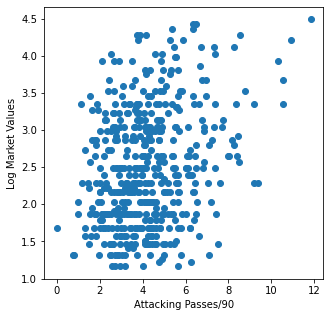

Corrlation coefficient between Attacking Passes/90 and log_y_defender (0.2940483761729592, 4.1456574815208754e-11)



In [339]:
#checking collinearity for assists related stats
CollinearityCheck(assists)

The pair plot and scatter plot do not offer enough information to determine the relationship of these variables to each other. I need to look at correlation coefficients to glean more information. 

In [340]:
#looping through lists
for i in range(0, len(assists)):
    
    #looping though every variable but the one at the ith position
    for j in range (i + 1, len(assists)):
        #pulling correlation
        corr, p_value = pearsonr(X_defender[assists[i]], X_defender[assists[j]])
        
        #rounding correlation and printing 
        corr = round(corr, 2)
        print(f"The pearson correlation coefficient between {assists[i]} & {assists[j]} is {corr}")

The pearson correlation coefficient between Ast/90 & Through Balls/90 is 0.19
The pearson correlation coefficient between Ast/90 & xA/90 is 0.6
The pearson correlation coefficient between Ast/90 & Attacking Passes/90 is 0.45
The pearson correlation coefficient between Through Balls/90 & xA/90 is 0.21
The pearson correlation coefficient between Through Balls/90 & Attacking Passes/90 is 0.38
The pearson correlation coefficient between xA/90 & Attacking Passes/90 is 0.51


I am going to drop `Ast/90` and `xA/90` as they have the weakest correlation coefficients, and a sizable correlation with `Attacking Passes/90`. 

In [341]:
#adding to drop columns list
drop_columns.append('Ast/90')
drop_columns.append('xA/90')

#### Defender Passing Collinearity Check

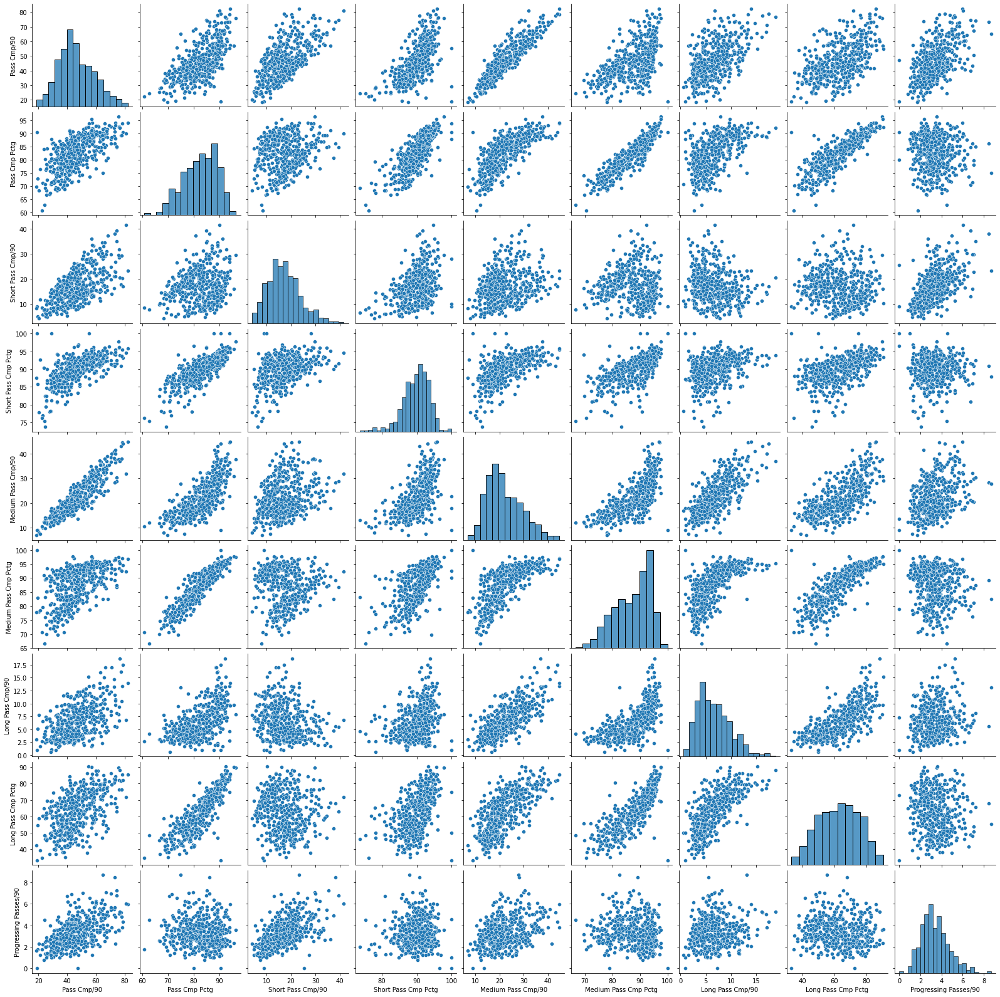

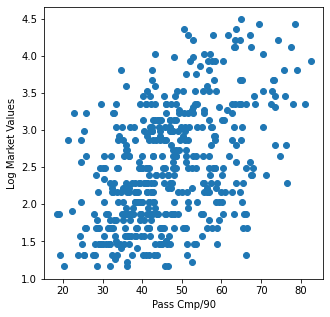

Corrlation coefficient between Pass Cmp/90 and log_y_defender (0.4811351116119278, 2.0720202587124576e-29)



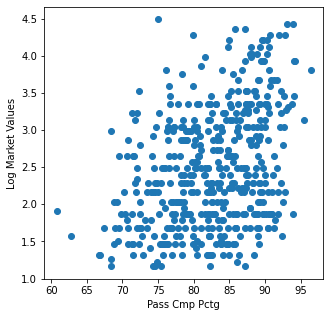

Corrlation coefficient between Pass Cmp Pctg and log_y_defender (0.35892130737254146, 3.670993892586544e-16)



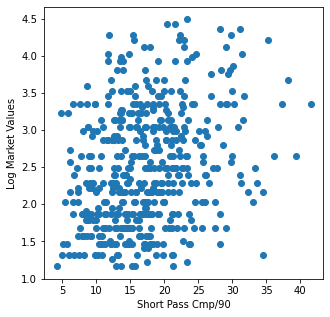

Corrlation coefficient between Short Pass Cmp/90 and log_y_defender (0.28781384635405627, 1.0997395832270822e-10)



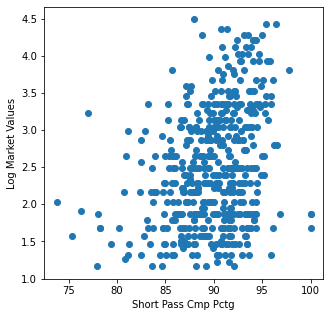

Corrlation coefficient between Short Pass Cmp Pctg and log_y_defender (0.3048514369296311, 7.22224960351423e-12)



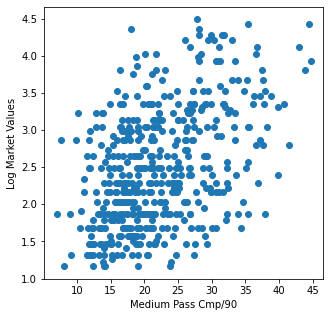

Corrlation coefficient between Medium Pass Cmp/90 and log_y_defender (0.45633302310410734, 2.8749611965602423e-26)



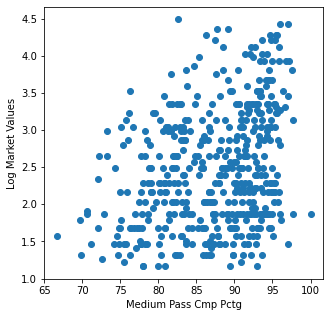

Corrlation coefficient between Medium Pass Cmp Pctg and log_y_defender (0.31013272379029955, 2.9927272675443824e-12)



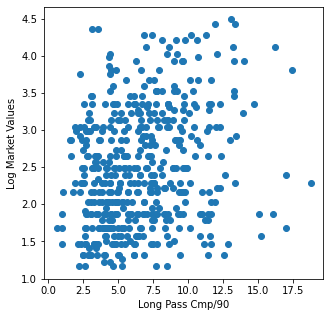

Corrlation coefficient between Long Pass Cmp/90 and log_y_defender (0.25221809883659013, 1.848076920425352e-08)



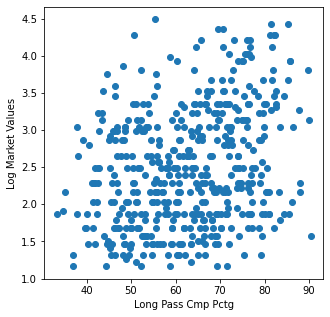

Corrlation coefficient between Long Pass Cmp Pctg and log_y_defender (0.28605609769156415, 1.441716508265971e-10)



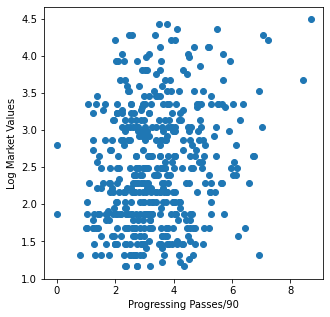

Corrlation coefficient between Progressing Passes/90 and log_y_defender (0.22330294465318717, 6.949717478116827e-07)



In [342]:
CollinearityCheck(passing)

The pair plots show linear trends across just about all of the passing statistics. I am going to keep the one with the strongest correlation to the target statistic which is `Pass Cmp/90`.

In [343]:
#for reference
passing

['Pass Cmp/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90']

In [344]:
#adding final dropped columns
drop_columns = drop_columns + passing[1:]

In [345]:
# checking drop columns
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90']

#### Defender Scoring Collinearity Check

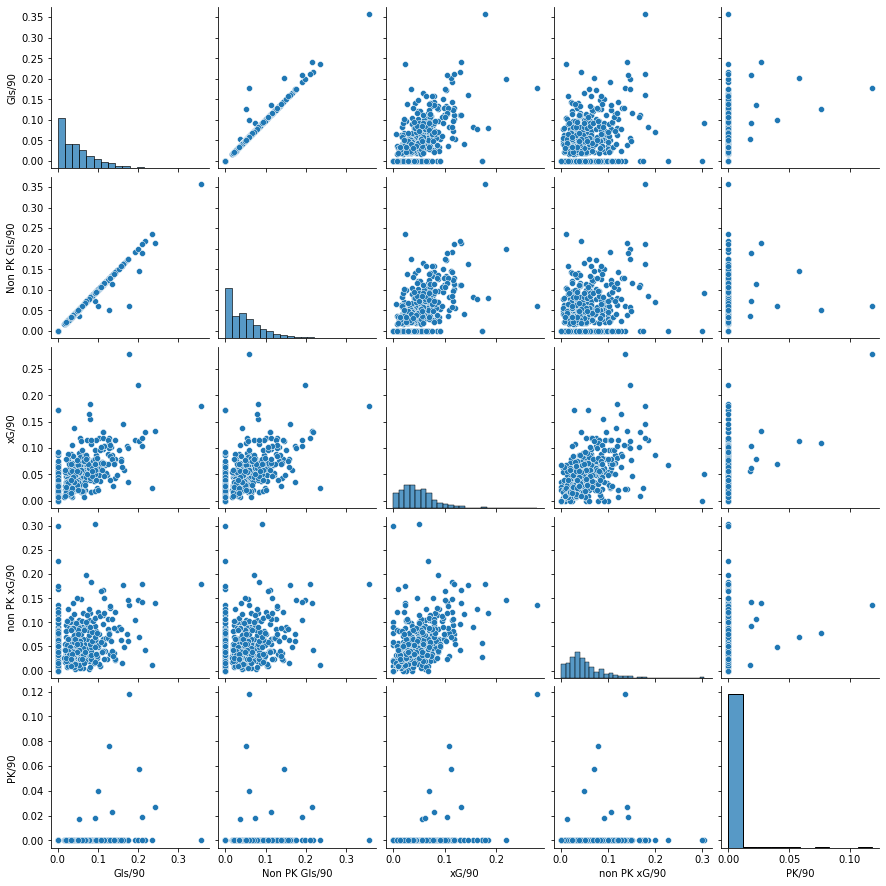

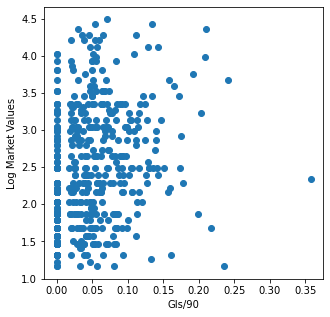

Corrlation coefficient between Gls/90 and log_y_defender (0.22511828988480542, 5.61027748061267e-07)



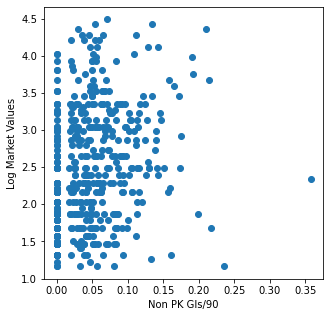

Corrlation coefficient between Non PK Gls/90 and log_y_defender (0.2269789328033205, 4.496458365972213e-07)



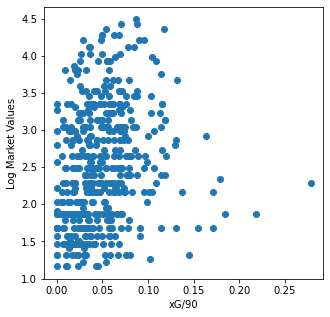

Corrlation coefficient between xG/90 and log_y_defender (0.20833584570346758, 3.7941141662553425e-06)



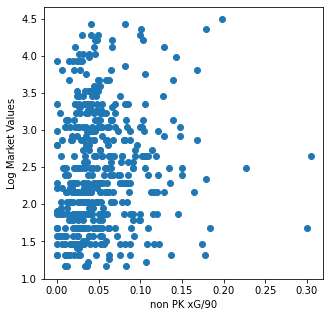

Corrlation coefficient between non PK xG/90 and log_y_defender (0.1059121946794745, 0.019774364029670158)



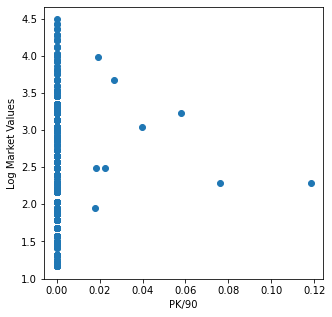

Corrlation coefficient between PK/90 and log_y_defender (0.02691698221864065, 0.5546883040726629)



In [346]:
CollinearityCheck(scoring)

Here we can see a strong correlation between the three goal categories. There is almost no correlation, between the the target and `PK/90`. I am going to keep `non PK Gls/90` it has the strongest correlation with the target.

In [347]:
#for reference
scoring

['Gls/90', 'Non PK Gls/90', 'xG/90', 'non PK xG/90', 'PK/90']

In [348]:
#appending
drop_columns = drop_columns + ['Gls/90'] + scoring[2:]

#check
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'PK/90']

#### Defender Collinearity Check Creation Stats

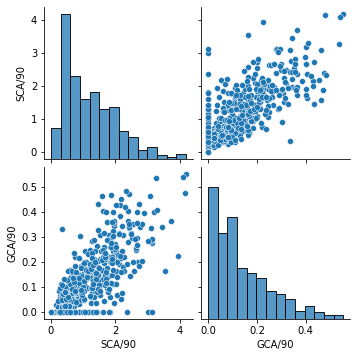

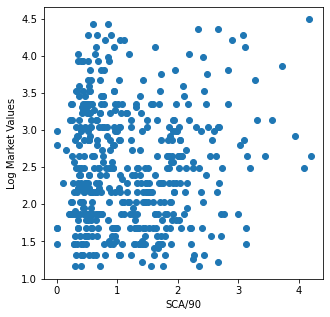

Corrlation coefficient between SCA/90 and log_y_defender (0.05342384945033867, 0.24074627343049718)



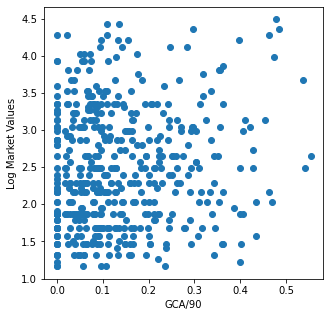

Corrlation coefficient between GCA/90 and log_y_defender (0.10556788400897553, 0.02018008802516905)



In [349]:
CollinearityCheck(creation)

Going to keep `GCA/90` as it has the stronger correlation coefficient

In [350]:
#appending
drop_columns.append('SCA/90')


#checking
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'PK/90',
 'SCA/90']

#### Touches Collinearity Check

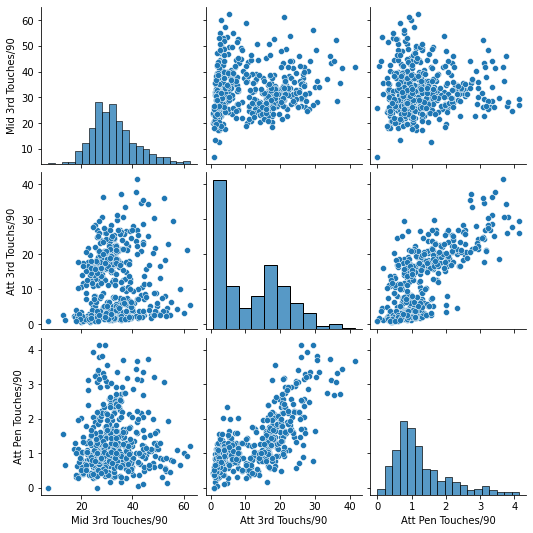

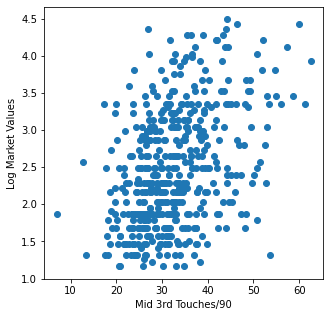

Corrlation coefficient between Mid 3rd Touches/90 and log_y_defender (0.4088817522216149, 6.259219567385137e-21)



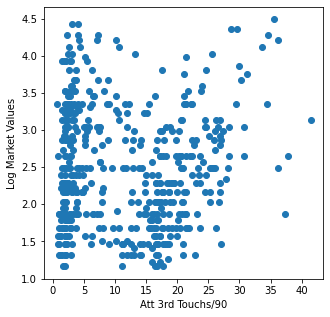

Corrlation coefficient between Att 3rd Touchs/90 and log_y_defender (0.029295594323078027, 0.5202405913340484)



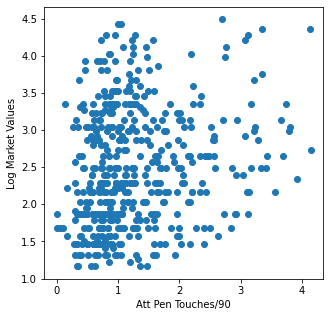

Corrlation coefficient between Att Pen Touches/90 and log_y_defender (0.2018092072826404, 7.661135693423874e-06)



In [351]:
CollinearityCheck(touches)

I am going to drop `Att 3rd Touchs/90`. There does not appear to be a strong linear trend amongst `Mid 3rd Touches/90` and the two attacking touches category, and since `Att Pen Touches/90` has the strongest correlation coefficient with the target, it is going to be kept.

In [352]:
#adding attacking third touches
drop_columns.append('Att 3rd Touchs/90')

#check step
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'PK/90',
 'SCA/90',
 'Att 3rd Touchs/90']

#### Defender Collinearity Check Dribbles

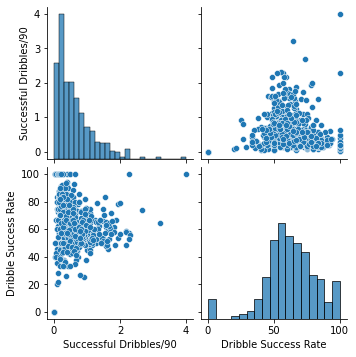

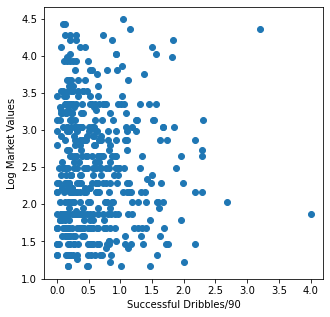

Corrlation coefficient between Successful Dribbles/90 and log_y_defender (0.001910065493490716, 0.966568193757903)



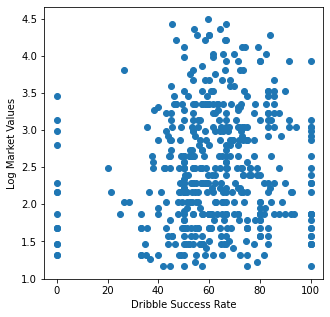

Corrlation coefficient between Dribble Success Rate and log_y_defender (0.08568760664737031, 0.059603034585713505)



In [353]:
CollinearityCheck(dribbles)

Based on the extremely low correlation coefficient with the target variable, I am going to drop `Successful Dribbles/90`.

In [354]:
#dropping Successful Dribbles/90
drop_columns.append('Successful Dribbles/90')

#checkstep
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'PK/90',
 'SCA/90',
 'Att 3rd Touchs/90',
 'Successful Dribbles/90']

#### Defender Carries Collinearity

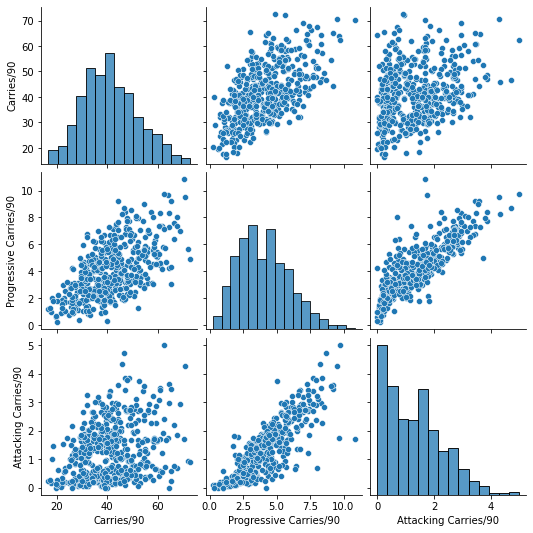

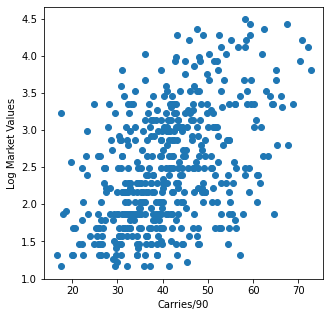

Corrlation coefficient between Carries/90 and log_y_defender (0.4806113631446276, 2.4290597829087794e-29)



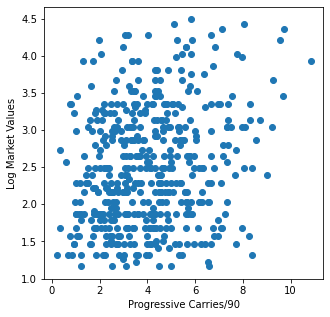

Corrlation coefficient between Progressive Carries/90 and log_y_defender (0.22670785645590597, 4.644345578533088e-07)



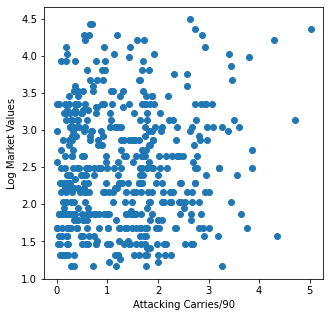

Corrlation coefficient between Attacking Carries/90 and log_y_defender (0.07251812431451031, 0.1110767847716782)



In [355]:
CollinearityCheck(carries)

`Carries/90` has the strongets correlation coefficient. The pair plots show a strong linear correlation amongst all the features in this list, so the other two will be dropped. 

In [356]:
#for reference
carries

['Carries/90', 'Progressive Carries/90', 'Attacking Carries/90']

In [357]:
#dropping 'Progressive Carries/90', 'Attacking Carries/90'
drop_columns = drop_columns + carries[1:]

#check step
drop_columns

['Successful Box Crosses/90',
 'Ast/90',
 'xA/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'PK/90',
 'SCA/90',
 'Att 3rd Touchs/90',
 'Successful Dribbles/90',
 'Progressive Carries/90',
 'Attacking Carries/90']

#### Defender Receiving Collinearity Check

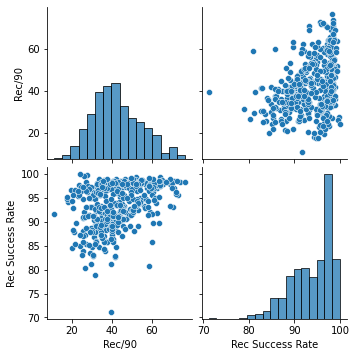

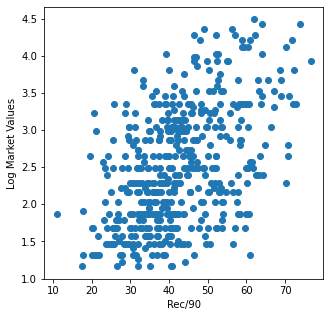

Corrlation coefficient between Rec/90 and log_y_defender (0.4970563281869105, 1.4442676078238935e-31)



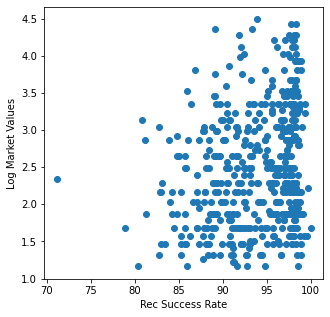

Corrlation coefficient between Rec Success Rate and log_y_defender (0.2245177807703408, 6.023224550013584e-07)



In [358]:
CollinearityCheck(recieving)

Both of these features can be kepts. There is not a strong linear trend between them and they both have significant correlations with the target variable.

## Lasso Part  2
The first step is to remove the columns above. I am going to do this from the train and test sets of X_defender.

In [359]:
#train
X_defender_train_2 = X_defender_train.drop(columns=drop_columns)
#test
X_defender_test_2 = X_defender_test.drop(columns=drop_columns)

In [360]:
#checking
X_defender_train_2.columns

Index(['Age', '90s', 'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90',
       'Shots/90', 'Shots on Target/90', 'Free Kicks/90', 'Pass Cmp/90',
       'Attacking Passes/90', 'Through Balls/90', 'Passes under pressure/90',
       'Switches/90', 'Crosses/90', 'Bad Passes/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att Pen Touches/90',
       'Dribble Success Rate', 'Carries/90', 'Bad Dribbles /90', 'Rec/90',
       'Rec Success Rate', 'Fouls Committed/90', 'Fouls drawn/90',
       'PKs won/90', 'PKs conceded/90', 'Loose Balls Recov/90',
       'Aerial Battles Won/90', 'Aerial Battle Success Rate', 'Club Tier',
       'European', 'subg_Wingback'],
      dtype='object')

### Fitting Model
I am going to use the same parameters as the first Lasso, so direct comparisons can be made. Those parameters are: **alpha = 0.1**, **max_iterations = 1,000,000** and **random state = 21**.

In [361]:
#instantiating
defender_lasso_pt2 = Lasso(alpha=0.1, max_iter=1000000, random_state=21)

#fitting
defender_lasso_pt2.fit(X_defender_train_2, log_y_defender_train)

#scoring
lasso_2_train_score = round(defender_lasso_pt2.score(X_defender_train_2, log_y_defender_train)* 100, 2)
lasso_2_test_score = round(defender_lasso_pt2.score(X_defender_test_2, log_y_defender_test) * 100, 2)

#printing scores
print(f"Lasso 2 Training Score: {lasso_2_train_score}%")
print(f"Lasso 2 Testing Score: {lasso_2_test_score}%")
print(f"Previous Test Score: {round(defender_grid_best_model.score(X_defender_test, log_y_defender_test)*100, 2)}%")
print(f"Baseline Score: {defender_base_test_score}%")

Lasso 2 Training Score: 66.83%
Lasso 2 Testing Score: 62.63%
Previous Test Score: 62.59%
Baseline Score: 12.84%


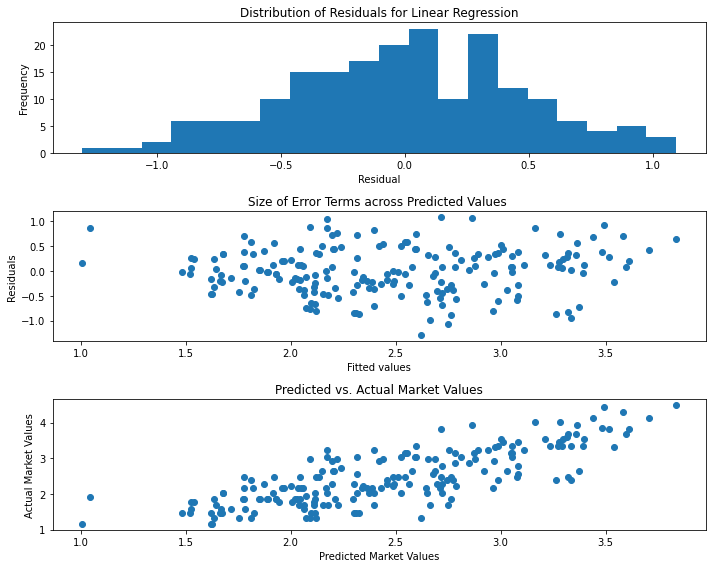

In [362]:
LinRegDiagnostic(defender_lasso_pt2, X_defender_test_2, log_y_defender_test)

The score jumped slightly. There are two points very far away from the pack in the **Predicted vs. Actual Market Values** plot, but they appear to be in the right neighborhood. No need to investigate any further.

In [363]:
#checking columns that were dropped
print(f'There are {X_defender_test.shape[1]} in the original set')
print(f'There are {X_defender_test_2.shape[1]} in the new set')

There are 64 in the original set
There are 44 in the new set


The test set accuracy score stayed the same, despite dropping 20 columns. Now let's look at the sorted coefficients, to see if any discrepancies remain. First I am going to create a sorting function

In [364]:
#defining sorting function
def SortedCoef(model, feature_dataframe):
    
    '''
    This function takes a model and a set of features and sorts them in descending order by coefficient
    Inputs
    model - the model from which you are pulling coefficients
    feature dataframe - the feature set used in the model
    
    Prints
    number of features zeroed out
    number of features remaining
    
    Returns
    Sorted data frame by coefficient size in descending order
    '''
    
    #creating coefficients data frame
    coefficients_df = pd.DataFrame({'Feature': feature_dataframe.columns,
                                     'Coefficient': model.coef_})

    #pulling out non zero coefficients
    no_zeroes_df = coefficients_df[coefficients_df['Coefficient'] != 0]
    
    #assigning zeroed out coefficients
    zeroed_out = feature_dataframe.shape[1] - no_zeroes_df.shape[0]
    
    #printing number of zeroes out coefficients and remaining coefficients
    print(f'There are {no_zeroes_df.shape[0]} with non-zero coefficients') 
    print(f'{zeroed_out} features were zeroes out from L1 penalty')
    
    #sorting and returning dataframe
    sorted_no_zeroes_df = no_zeroes_df.sort_values('Coefficient', ascending=False)
    return sorted_no_zeroes_df

In [365]:
#sorting coefficients
lasso2_coef = SortedCoef(defender_lasso_pt2, X_defender_train_2)
lasso2_coef

There are 12 with non-zero coefficients
32 features were zeroes out from L1 penalty


,Feature,Coefficient
41,Club Tier,0.217579
1,90s,0.022683
32,Rec/90,0.011557
40,Aerial Battle Success Rate,0.007131
8,Pass Cmp/90,0.004619
30,Carries/90,0.003699
17,Tkl Success Rate,0.002569
19,Tkl vs. dribbles Success Rate,0.001130
26,Touches/90,0.000569
29,Dribble Success Rate,-0.002814


Again we see some confounding results. It does not make any sense that `Touches/90` and `Mid 3rd Touches/90` have opposite coefficients. I am going to look at these together to see which has a stronger relationship with the target.

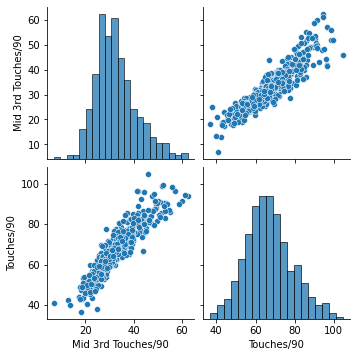

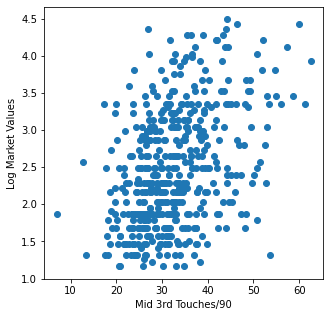

Corrlation coefficient between Mid 3rd Touches/90 and log_y_defender (0.4088817522216149, 6.259219567385137e-21)



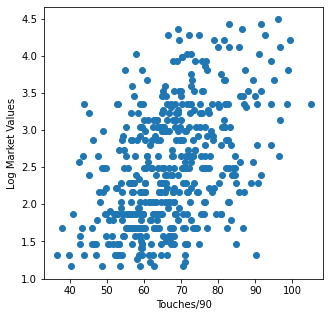

Corrlation coefficient between Touches/90 and log_y_defender (0.45992984573816376, 1.0440435675225613e-26)



In [366]:
#creating touches 2 list
touches_2 = ['Mid 3rd Touches/90', 'Touches/90']

#checking collinearity
CollinearityCheck(touches_2)

I am going to drop `Mid 3rd Touches/90` from the data set, as it's correlation coefficient is weaker than `Touches/90`.

In [367]:
#creating new data frame without mid 3rd touches. Train and test
X_defender_train_3 = X_defender_train_2.drop('Mid 3rd Touches/90', axis = 1)
X_defender_test_3 = X_defender_test_2.drop('Mid 3rd Touches/90', axis = 1)

Now to run the model again. 

## Defender Lasso 3 

In [368]:
#instantiating
defender_lasso_3 = Lasso(alpha=0.1, max_iter=1000000, random_state=21)

#fitting
defender_lasso_3.fit(X_defender_train_3, log_y_defender_train)

#scroing
lasso3_train = round(defender_lasso_3.score(X_defender_train_3, log_y_defender_train)*100, 2)
lasso3_test = round(defender_lasso_3.score(X_defender_test_3, log_y_defender_test)* 100, 2)

print(f"Training Score: {lasso3_train}%")
print(f" Test Score: {lasso3_test}%")
print(f"Previous Test Score: {lasso_2_test_score}%")
print(f"Baseline Test Score: {defender_base_test_score}%")
                                      

Training Score: 65.77%
 Test Score: 62.8%
Previous Test Score: 62.63%
Baseline Test Score: 12.84%


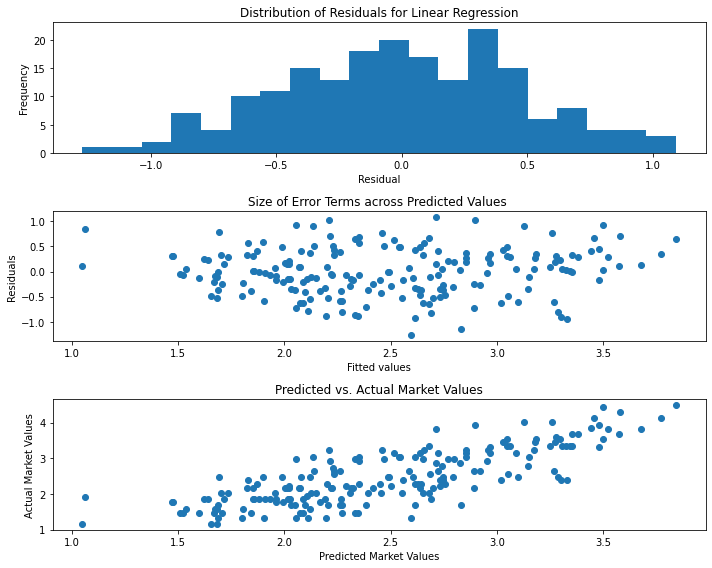

In [369]:
LinRegDiagnostic(defender_lasso_3, X_defender_test_3, log_y_defender_test)

Again there is a slight increase in test score.

In [370]:
#creating sorted coefficient data frame.
lasso3_coef = SortedCoef(defender_lasso_3, X_defender_train_3)

lasso3_coef

There are 8 with non-zero coefficients
35 features were zeroes out from L1 penalty


,Feature,Coefficient
40,Club Tier,0.221164
1,90s,0.022859
31,Rec/90,0.010149
39,Aerial Battle Success Rate,0.006585
17,Tkl Success Rate,0.002350
19,Tkl vs. dribbles Success Rate,0.000922
28,Dribble Success Rate,-0.002681
0,Age,-0.058381


This list makes sense, and is explainable. There are no similar features with opposite coefficients. All of these track and can be explained withing the context of the sport. Before that is done, these coefficients need to be illuminated even further. I am going to add a `Practical Effect` column to this data to put the coefficients in better context.  The transformation will look like this. $$(e^c - 1)*100$$. Where c represents the coefficient. This number represents the percent change of the target variable from a one unit increase in the corresponding feature. This is necessary because the target variable was transformed, so in order to see the effect on the actual `Market Value in Millions` we need to undo the transformation by taking the exponent of x. Multiplying by 100, simply gives us the value in percent form. 

In [371]:
#creating practical effect
lasso3_coef['Practical Effect'] = (np.expm1(lasso3_coef['Coefficient']) * 100)

#rounding
lasso3_coef['Practical Effect'] = round(lasso3_coef['Practical Effect'], 2)

#displaying
lasso3_coef

,Feature,Coefficient,Practical Effect
40,Club Tier,0.221164,24.75
1,90s,0.022859,2.31
31,Rec/90,0.010149,1.02
39,Aerial Battle Success Rate,0.006585,0.66
17,Tkl Success Rate,0.002350,0.24
19,Tkl vs. dribbles Success Rate,0.000922,0.09
28,Dribble Success Rate,-0.002681,-0.27
0,Age,-0.058381,-5.67


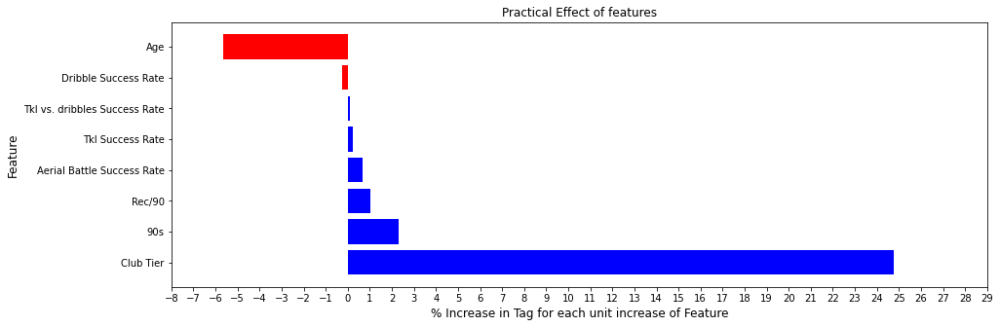

In [372]:
#plotting practical effect
plt.figure(figsize = (15, 5))
plt.barh(lasso3_coef['Feature'], lasso3_coef['Practical Effect'],
        color = ['b', 'b', 'b', 'b','b','b','r', 'r'])
plt.xlabel('% Increase in Tag for each unit increase of Feature', fontsize = 12)
plt.ylabel('Feature', fontsize = 12)
plt.title('Practical Effect of features', fontsize = 12)
plt.xticks(list(range(-8, 30, 1)))
plt.show()

This is what the coefficient tells me about what is valued in Soccer Players. 

**Positive Coefficients**
1. Availability and Club Level:
    * The amount you play and who you play for matter. If a defender is starting for a top tier team, he is obviously going to be worth a lot of money. 
2. Rec/90:
   * This explanation is two fold. First is defenders who are willing and able to join the attack, or control possession through passing in the back half of the field are valued. I also think this has to do with the quality of the team a defender plays on. Better teams have the ball more often. Better teams have the defenders worth more. Therefore those highly valued defenders touch the ball more often. Both factors are true.
3. Aerial Battle Success Rate , Tkl and Tkl vs dribbles Success Rate
    * These are the most important defensive statistics, and they directly tie in with the most important aspects for the two defender subgroups. The best Center Backs control the air around the goal and head the ball away from dangerous areas. The best wingbacks do not let skilled wingers get around them and into dangerous areas. 


**Negative Coefficients**

1. Dribble Success Rate
    * Looking at the box plot below we can see why this is the case. Center backs have a much higher `Dribble Success Rate` than wingbacks. This does not mean that center backs are better dribblers, It just means that they do it less, and only do it when they have a lot of space in front of them. Because center backs are more highly valued than wingbacks, the lower your `dribble success rate`, the lower the valuation

4. Age
    * If a player is contributing to a top flight team at a young age, then you can project even more growth and thus more value. This also shows that the model is finding the value of the outliers, as a low age is their only source of value

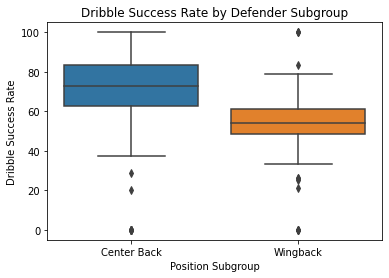

In [380]:
#PLOTTING DRIBBLE SUCCESS RATE
plt.figure()
sns.boxplot(data=defender_df_master, x = 'Position Subgroup', y = 'Dribble Success Rate')
plt.title('Dribble Success Rate by Defender Subgroup')
plt.show()

## R-squared between untransformed predicted and actual
Now I want to see how well my model does on non-transformed market values. To do this, first I need to combine the train and test set from the last model. Then I need to create predictions from these values and transform back into linear space by taking they're exponents. Then I will find the R-squared value between these predictions and the original market values. This will tell me how well my model does with predicting the real market values in the data set.

I have to concatenate my latest defender feature dataframe so I can get predictions on the whole set. The model expects this number of features otherwise I will get an error. I have to concatenate the target set so they match up with the predictions. 

I will perform the same process at the end of each optimized model. 

In [381]:
#concatenting x and y
X_defender_3 = pd.concat([X_defender_train_3, X_defender_test_3])
y_defender_3 = pd.concat([y_defender_train, y_defender_test])

#predictions in log space
y_log_pred = defender_lasso_3.predict(X_defender_3)

#predictions in linear space
y_pred = np.expm1(y_log_pred)


In [382]:
#importing r2
from sklearn.metrics import r2_score

#scoring predictions and actual market values

defender_true_r2 = round(r2_score(y_defender_3, y_pred)* 100, 2)

#appending for future plotting
true_r2 = [defender_true_r2]

#displaying
defender_true_r2



58.51

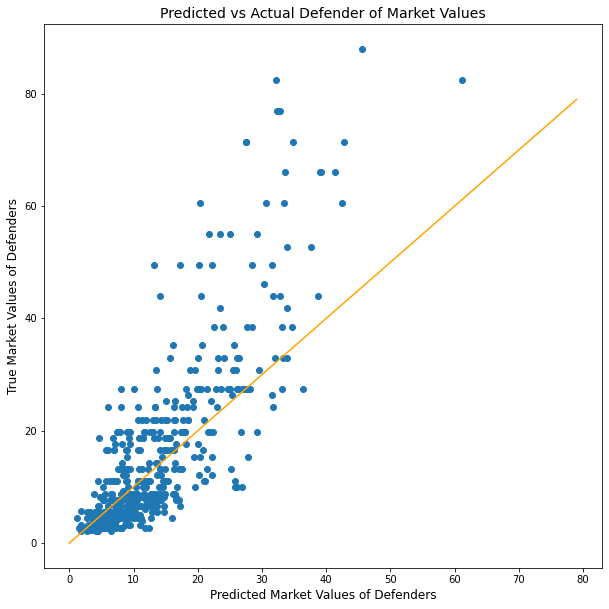

Correlation Coefficient: 0.82


In [477]:
#square graph for best comparisons
plt.figure(figsize=(10,10))
#scatter of predictied vs actual
plt.scatter(y_pred, y_defender_3)

#plotting perfect predictions line
plt.plot(range(0,80), range(0,80), c = 'orange', label = 'Perfect Predictions')

#details
plt.xlabel('Predicted Market Values of Defenders', fontsize = 12)
plt.ylabel('True Market Values of Defenders', fontsize = 12)
plt.title('Predicted vs Actual Defender of Market Values', fontsize = 14)
plt.show()

corr, p = pearsonr(y_pred, y_defender_3)
print(f"Correlation Coefficient: {round(corr, 2)}")

The model accurately accounts for **58.51%** of the variability in the model. You can see a strong linear trend between the actual and predicted values, however, the model is underestimating the values of the majority of players (shown by most of the points being above the orange line). This is because what I am going to call the **Elite Player Tax**. This is a lesson in scarcity. There are only so many elite defenders, and so there values are increased through being elite. The model does much better predicting players with lower values, because they are not as susceptible tot the elite tax. 

It is doing a good job on picking up on which points players should be valued highly, this is shown by the correlation coefficient.

## Trying non linear models

I am going to run the data through a *K-Nearest Neighbor Model*, a *Decision Tree* and a *Support Vector Machine*. I am going to use a grid search for all of these, to quickly see the test score on optimized hyper parameters.I am going to perform these in linear space to see how they compare to the true r-squared. These models will not be explored in this notebook. This is to see if any of these models are worth exploring in the future. I am only going to use 2 folds for cross validation, as the set is already pretty small. 

### Defender KNN Regression
My intuition tells me that this will work. I think that superstars who are worth more will invariable be the closest neighbors, and the average players will average out to values similar to their true market value. 

In [384]:
#importing regressor
from sklearn.neighbors import KNeighborsRegressor

#creating estimotor grid
k_estimators = [("scaler", MinMaxScaler()),
               ("model", KNeighborsRegressor())]

#instantiating pipeline
k_pipe = Pipeline(k_estimators)

#setting parameter grid
k_params = {"model": [KNeighborsRegressor()],
            "model__n_neighbors": list(range(5, 100, 5)),
            "model__weights": ['uniform', 'distance'],
            "scaler": [MinMaxScaler(), None]}

#fitting and scoring gird search
k_grid_search = GridSearchCV(k_pipe, k_params, cv = 2)
fitted_k_grid = k_grid_search.fit(X_defender_train, y_defender_train)

In [385]:
#pulling out best model.
best_k = fitted_k_grid.best_estimator_

best_k


Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', KNeighborsRegressor(weights='distance'))])

In [386]:
#scoring
print(best_k.score(X_defender_train, y_defender_train))
best_k.score(X_defender_test, y_defender_test)

1.0


0.37522177810293644

Much lower than the true r-squared. Not worth investigating further.  

## Defender Decision Tree Grid

In [391]:
#importing models
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

#screating non linear estimators
tree_estimators = [("model", DecisionTreeRegressor(random_state=21))]

#instantiating pipeling
tree_pipe = Pipeline(tree_estimators)

#creating decision tree parameter grid
tree_params = {"model__criterion": ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
               "model__max_depth": list(range(5, 50, 5)),
               "model__min_samples_leaf": list(range(1, 20)),
               "model__splitter": ['best', 'random']}


#creating and fitting tree grid                
tree_grid_search = GridSearchCV(tree_pipe, tree_params, cv = 2)
fitted_tree_grid = tree_grid_search.fit(X_defender_train, y_defender_train)             
fitted_tree_grid.best_estimator_

Pipeline(steps=[('model',
                 DecisionTreeRegressor(max_depth=5, min_samples_leaf=9,
                                       random_state=21, splitter='random'))])

In [392]:
#TODO clean up
print(f'{round(fitted_tree_grid.score(X_defender_train, y_defender_train)* 100, 2)}')
print(f'{round(fitted_tree_grid.score(X_defender_test, y_defender_test)*100, 2)}')

52.19
37.49


Not worth exploring later on. 

### Defender Support Vector Regressor

In [396]:
#screating non linear estimators
svr_estimators = [('scaler', MinMaxScaler())
                  ,("model", SVR(max_iter=1000000))]

#instantiating pipeling
svr_pipe = Pipeline(svr_estimators)

#creating decision tree parameter grid
svr_params = {"model__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
               "model__gamma": ['scale', 'auto'],
               "model__C": [0.01, 0.1, 1, 10, 100],
               "model__epsilon": np.arange(1, 10, 2)/10}


#creating and fitting tree grid                
svr_grid_search = GridSearchCV(svr_pipe, svr_params, cv = 2)
fitted_svr_grid = svr_grid_search.fit(X_defender_train, y_defender_train)             
fitted_svr_grid.best_estimator_

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model',
                 SVR(C=1, epsilon=0.9, kernel='poly', max_iter=1000000))])

In [399]:
#scoring
print(fitted_svr_grid.score(X_defender_train, y_defender_train))
print(fitted_svr_grid.score(X_defender_test, y_defender_test))

0.6601486742525926
0.5694216571017824


This comes close to the optimized true r-squared and is definitely worth examining in the future.

# Midfielders 
Before beginning to model, it is important to discuss the role of the **midfielders**. They are the connectors between offense and defense. The are responsible for middle half of the field (hence the name), working to make sure the ball does not get into their defensive third while simultaneously attempting to create offense into the attacking third.  I believe this duality will make **midfielders** the hardest `Position Group` of players to model. There are also starker contrast between the subgroups.

* Center Defensive Midfielders (CDM) 
    * Serve as the first line of defense. Often responsible for winning the ball back in advantageous areas of the field. Must be strong and rangy.

* Center Midfielders (CM) 
    * Responsible for maintaining possession of the ball, as well as winning it back. Probably the most complete players on the field. Need to be able to play passes forward and to defend as well. They need to be able to see the whole field. Serve roles of CDM and CAM at the same time.

* Center Attacking Midfielder (CAM)
    * They have to be technically gifted and offensively skilled. Their main roles are to maintain possession in attacking areas, and most importantly to create opportunities for themselves or others to score goals. They are the conductors of the offense, the orchestrators of the attack.
    
* Left/Right Midfielders (LM & RM)
    * Similar players on the opposites sides of the pitch. Honestly, very similar to **left wingers** and **right wingers** but they have more defensive responsibilities. They track back more often to defend their counterparts on the opposing team. However, their main role is to attack. To create opportunities and get behind the defense, working their way from the outside in. They key for these players is speed, dribbling and crossing. 
    

The first two midfielders above are *holding midfielders* and the bottom two are *attacking midfielders*. CDMs and CM are responsible for controlling possession of the ball, either by winning it back or keeping the other team from doing the same. CAMs, RMs and LMs are responsible for creating opportunities on offense, either through clever passing or relentless speed. 

In [400]:
#check
midfielder_df.head()

,Name,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,...,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Position Group,Position Subgroup,Club Tier,European
737,Phil Foden,21,93.5,33.9,0.471976,0.235988,0.00000,0.471976,0.029499,0.00000,...,1.887906,0.0000,0.000000,5.162242,0.560472,25.675676,Midfielder,Holding Midfielder,6,1
738,Paul Pogba,28,60.5,32.0,0.125000,0.343750,0.00000,0.125000,0.250000,0.03125,...,2.656250,0.0625,0.062500,9.781250,2.750000,59.459459,Midfielder,Holding Midfielder,6,1
739,Youri Tielemans,24,60.5,54.6,0.219780,0.109890,0.07326,0.146520,0.128205,0.00000,...,1.813187,0.0000,0.036630,10.421245,0.897436,50.000000,Midfielder,Holding Midfielder,5,1
740,Mateo Kovačić,27,49.5,32.9,0.060790,0.182371,0.00000,0.060790,0.212766,0.00000,...,2.553191,0.0000,0.000000,8.449848,0.455927,44.117647,Midfielder,Holding Midfielder,6,1
741,Pierre Højbjerg,26,44.0,60.5,0.066116,0.099174,0.00000,0.066116,0.181818,0.00000,...,1.586777,0.0000,0.016529,11.322314,1.305785,58.955224,Midfielder,Holding Midfielder,6,1


Everything looks as it should. Before modeling, I will run through the preliminary analysis steps done for defenders. 

## Midfielder Subgroups
A brief look into the `Position Subgroups` for **midfielders**.

### Value Counts

In [401]:
#checking value counts of subgroups
midfielder_df['Position Subgroup'].value_counts()

Holding Midfielder      364
Attacking Midfielder    155
Name: Position Subgroup, dtype: int64

There is a big gap between the number of **holding midfielders** and **attacking midfielders**. Every team plays at least 3 **holding midfielders** at a time (two CM and one AM). Some teams play only one **attacking midfielder** at a time (usually a lone CAM). This was shown in the data collection phase. In the value counts below you can see that there are only **40 LM/RMs** in the whole data set. These represent all of the **LM/RMs** in the big five European leagues, according to https://www.transfermarkt.us/. There are also twice as many **CMs** as **CDM** and **CAM**, reflecting again that each time plays **2 CMs and 1 CDM and CAM** each. As this is a regression problem, and not a classification problem, the imbalance is not a huge issue, but it is still worth noting. 

In [402]:
#midfielder position counts. 
market_values_master[market_values_master['Position Group'] =='Midfielder']['Position'].value_counts()

CM     241
CDM    123
CAM    115
LM      23
RM      17
Name: Position, dtype: int64

As stated in the **Capstone EDA and Testing Notebook** there is an imbalance between midfielders. There is not much to be done in this case, but it is worth acknowledging. 

### Market Values - Averages and Boxplots 

#### Average Market Values

In [406]:
#average value
midfielder_mv_avg = midfielder_df.groupby('Position Subgroup').mean()['Market Values in Millions']
midfielder_mv_avg

Position Subgroup
Attacking Midfielder    16.291355
Holding Midfielder      17.310041
Name: Market Values in Millions, dtype: float64

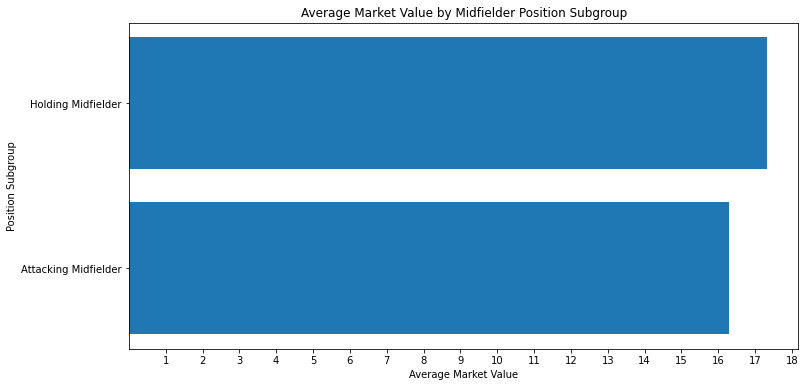

In [407]:
#plotting average value
plt.figure(figsize = (12, 6))
plt.barh(midfielder_mv_avg.index,
         midfielder_mv_avg.values)
plt.ylabel('Position Subgroup')
plt.xlabel('Average Market Value')
plt.title('Average Market Value by Midfielder Position Subgroup')
plt.xticks(range(1, 19))
plt.show()

**Holding midfielders** are values slightly more (**1.1 million**) on average. 

####  Boxplot and Summary Statistics for Market Value by Midfielder `Position Subgroup`s

In [408]:
#holding midfielder summary statistics
print('Market value summary statistics for Holding Midfielders')
print("_______________________________________________________")
midfielder_df[midfielder_df['Position Subgroup'] == 'Holding Midfielder'].describe()['Market Values in Millions']

Market value summary statistics for Holding Midfielders
_______________________________________________________


count    364.000000
mean      17.310041
std       18.119827
min        0.660000
25%        4.400000
50%       11.000000
75%       22.000000
max       93.500000
Name: Market Values in Millions, dtype: float64

In [409]:
#attacking midfielder summary statistics
print('Market value summary statistics for Attacking Midfielders')
print("_______________________________________________________")
midfielder_df[midfielder_df['Position Subgroup'] == 'Attacking Midfielder'].describe()['Market Values in Millions']

Market value summary statistics for Attacking Midfielders
_______________________________________________________


count    155.000000
mean      16.291355
std       19.976948
min        0.330000
25%        3.300000
50%        8.800000
75%       20.900000
max       99.000000
Name: Market Values in Millions, dtype: float64

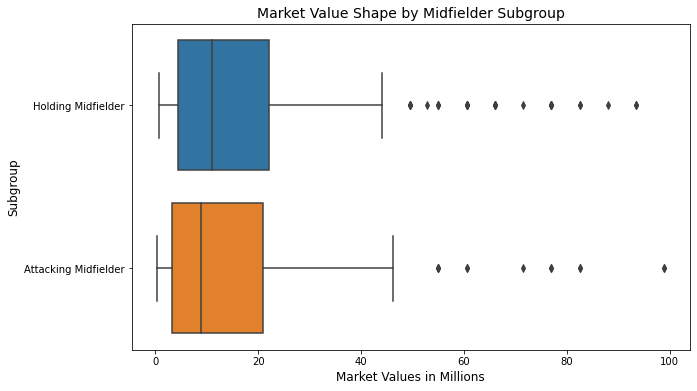

In [414]:
#plotting box plot of market values
plt.figure(figsize = (10, 6))
sns.boxplot(data = midfielder_df,
            x = 'Market Values in Millions',
            y = 'Position Subgroup')
plt.title('Market Value Shape by Midfielder Subgroup', fontsize =14)
plt.xlabel('Market Values in Millions',fontsize =12)
plt.ylabel('Subgroup',fontsize =12)
plt.show()

Holding midfielders are more highly valued than attacking midfielders. They have a higher median, quartile 1 (25%) and quartile 3 (75%) values. However, the size of their boxes above, the number of high value players, and the values of those players are very similar. This speaks the to the overall importance of holding midfielders**, not in terms of skill, but rather in terms of need, as teams simply need more holding midfielders than attacking midfielders. 

### Dropping position group
It is not needed as all players are midfielders. Going to create a master copy for future use.

In [415]:
#creating master copy
midfielder_df_master = midfielder_df.copy()

In [ ]:
#dropping position group
midfielder_df.drop(columns = ['Name','Position Group'], inplace=True)

#### Converting Position Subgroup to Dummy Variables
We are done analyzing the subgroups, we can covert them to dummy variables.

In [419]:
#creating dummies
midfielder_df = pd.get_dummies(midfielder_df, prefix = ['subg'], columns = ['Position Subgroup'], drop_first=True)


In [420]:
#check step
midfielder_df.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Club Tier,European,subg_Holding Midfielder
737,21,93.5,33.9,0.471976,0.235988,0.00000,0.471976,0.029499,0.00000,0.383481,...,0.884956,1.887906,0.0000,0.000000,5.162242,0.560472,25.675676,6,1,1
738,28,60.5,32.0,0.125000,0.343750,0.00000,0.125000,0.250000,0.03125,0.140625,...,2.718750,2.656250,0.0625,0.062500,9.781250,2.750000,59.459459,6,1,1
739,24,60.5,54.6,0.219780,0.109890,0.07326,0.146520,0.128205,0.00000,0.131868,...,1.556777,1.813187,0.0000,0.036630,10.421245,0.897436,50.000000,5,1,1
740,27,49.5,32.9,0.060790,0.182371,0.00000,0.060790,0.212766,0.00000,0.066869,...,1.428571,2.553191,0.0000,0.000000,8.449848,0.455927,44.117647,6,1,1
741,26,44.0,60.5,0.066116,0.099174,0.00000,0.066116,0.181818,0.00000,0.044628,...,1.719008,1.586777,0.0000,0.016529,11.322314,1.305785,58.955224,6,1,1


I am also going to reset the index of the data frame. This will make it easier to make changes later on. 

### Resetting Index

In [421]:
#resetting
midfielder_df.reset_index(drop=True, inplace=True)

#check
midfielder_df.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Club Tier,European,subg_Holding Midfielder
0,21,93.5,33.9,0.471976,0.235988,0.00000,0.471976,0.029499,0.00000,0.383481,...,0.884956,1.887906,0.0000,0.000000,5.162242,0.560472,25.675676,6,1,1
1,28,60.5,32.0,0.125000,0.343750,0.00000,0.125000,0.250000,0.03125,0.140625,...,2.718750,2.656250,0.0625,0.062500,9.781250,2.750000,59.459459,6,1,1
2,24,60.5,54.6,0.219780,0.109890,0.07326,0.146520,0.128205,0.00000,0.131868,...,1.556777,1.813187,0.0000,0.036630,10.421245,0.897436,50.000000,5,1,1
3,27,49.5,32.9,0.060790,0.182371,0.00000,0.060790,0.212766,0.00000,0.066869,...,1.428571,2.553191,0.0000,0.000000,8.449848,0.455927,44.117647,6,1,1
4,26,44.0,60.5,0.066116,0.099174,0.00000,0.066116,0.181818,0.00000,0.044628,...,1.719008,1.586777,0.0000,0.016529,11.322314,1.305785,58.955224,6,1,1


## Shape of Target and Feature Variables.
Before creating a baseline model, I need to get a feel for the target and feature variables. First, I going to create a functions that will show the shape of each feature and the target variable. Then I will split the target variable and feature variables into their own data frames.

### Splitting target and Features


In [422]:
#target variable
y_midfielder = midfielder_df['Market Values in Millions']

#feature variables
X_midfielder = midfielder_df.drop('Market Values in Millions', axis = 1)
X_midfielder_so = midfielder_stats.drop('Market Values in Millions', axis =1)

### Shape of Target Variable `Market Value in Millions`

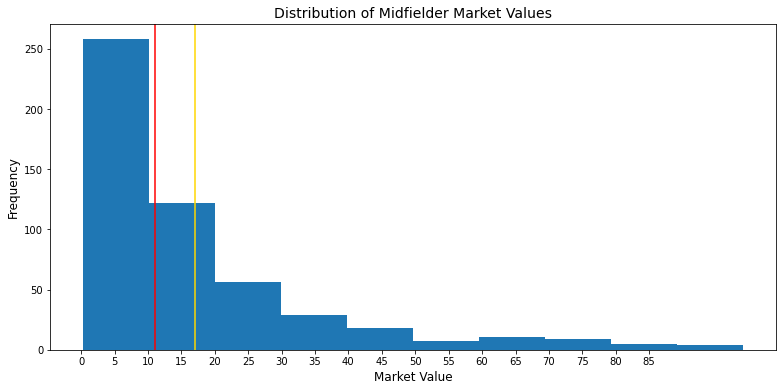

In [424]:
#plotting histogram of target variable
plt.figure(figsize=(13, 6))
plt.hist(y_midfielder)
plt.xlabel('Market Value', fontsize =12)
plt.ylabel('Frequency', fontsize =12)

#median lines
plt.axvline(y_midfielder.median(), c = 'r')
plt.axvline(y_midfielder.mean(), c = 'gold')

plt.title('Distribution of Midfielder Market Values', fontsize =14)
plt.xticks(range(0, 90, 5))
plt.show()

There is strong right skew in the `Market Values in Millions`. Another log transformation will probably be necessary when modeling commences to squeeze the values together.

### Shape of feature variables. 
I am going to look at the distributions of feature variables for midfielders. 

The skewness for Age is: 0.19987798525916942


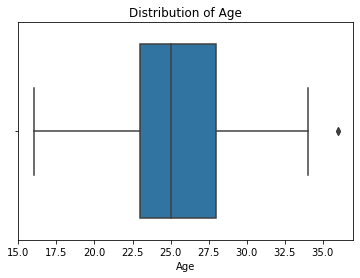


The skewness for 90s is: 0.05379961652424208


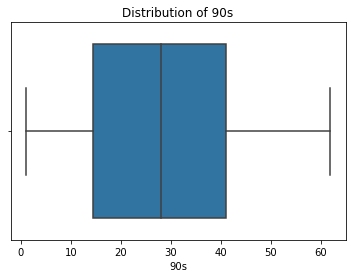


The skewness for Gls/90 is: 1.4366780374286643


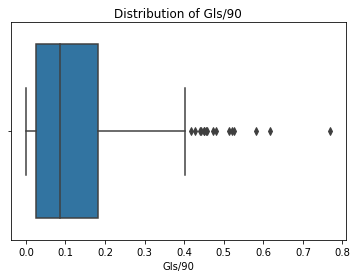


The skewness for Ast/90 is: 1.5706782478685546


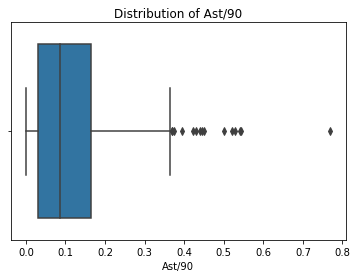


The skewness for PK/90 is: 4.463282857352413


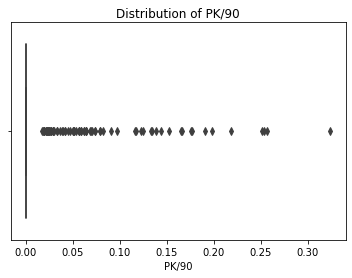


The skewness for Non PK Gls/90 is: 1.6240287288979314


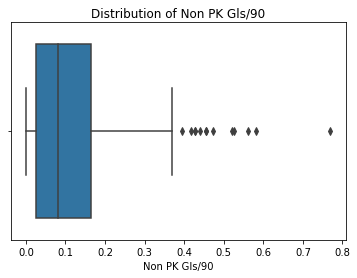


The skewness for Yellow Cards/90 is: 1.4394102460364444


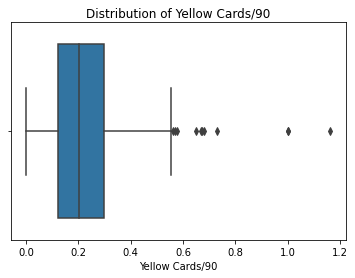


The skewness for Red Cards/90 is: 13.487852631393626


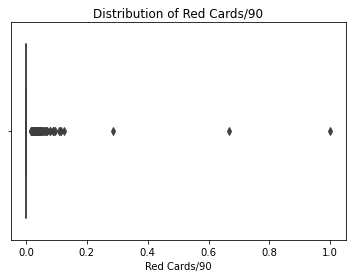


The skewness for xG/90 is: 1.7597721909574784


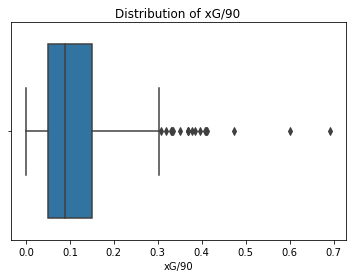


The skewness for non PK xG/90 is: 1.1284862355649463


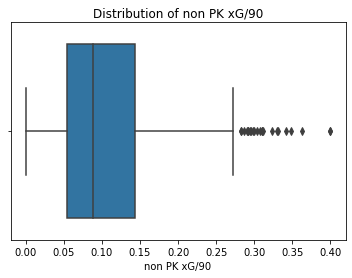


The skewness for xA/90 is: 15.59994388969996


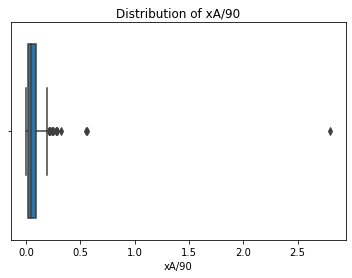


The skewness for Shots/90 is: 0.5734850660301529


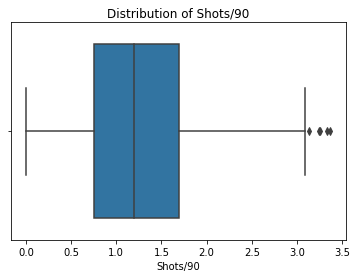


The skewness for Shots on Target/90 is: 1.1471805215960045


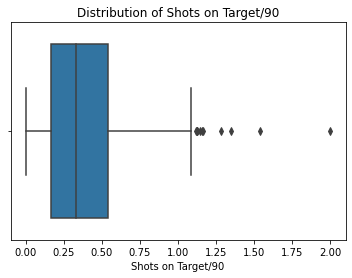


The skewness for Free Kicks/90 is: 2.6138419994031947


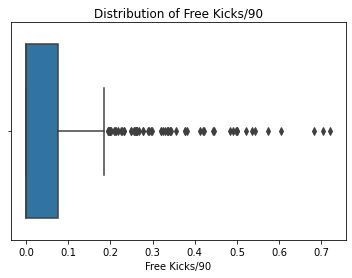


The skewness for Pass Cmp/90 is: 0.5889782736998402


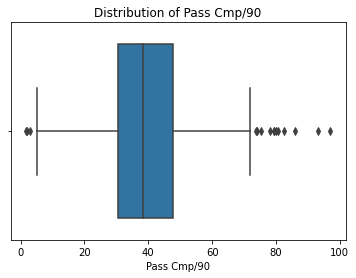


The skewness for Pass Cmp Pctg is: -0.4338356704639696


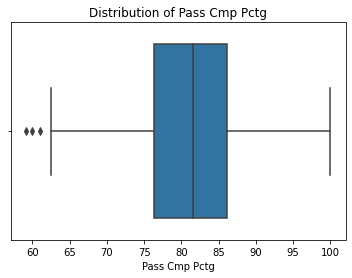


The skewness for Short Pass Cmp/90 is: 0.9388880601182554


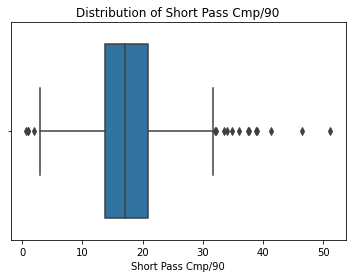


The skewness for Short Pass Cmp Pctg is: -0.6994823779936497


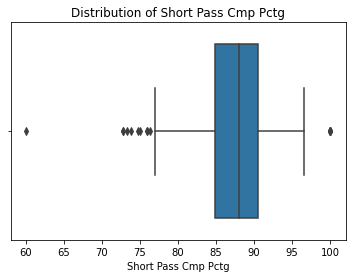


The skewness for Medium Pass Cmp/90 is: 0.5863867259521365


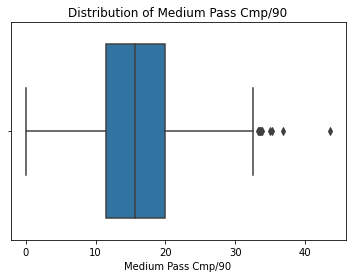


The skewness for Medium Pass Cmp Pctg is: -2.987683588377265


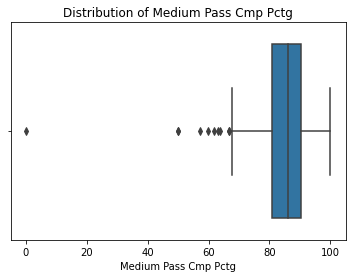


The skewness for Long Pass Cmp/90 is: 0.8726624249353829


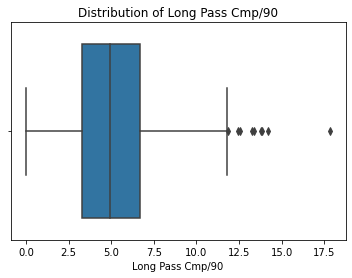


The skewness for Long Pass Cmp Pctg is: -0.796167063000091


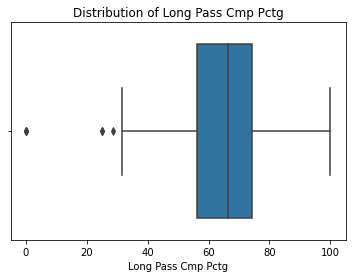


The skewness for Attacking Passes/90 is: 0.7103275389985128


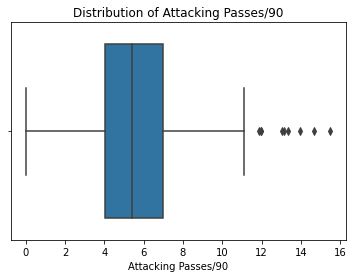


The skewness for Successful Box Crosses/90 is: 2.456980255081758


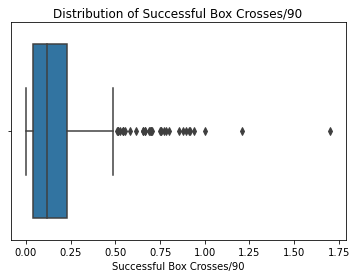


The skewness for Progressing Passes/90 is: 0.5584926000158568


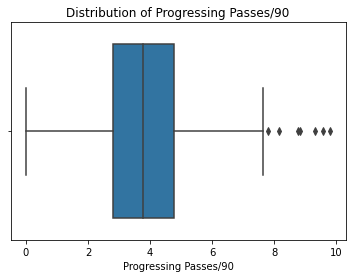


The skewness for Through Balls/90 is: 3.2616688205311792


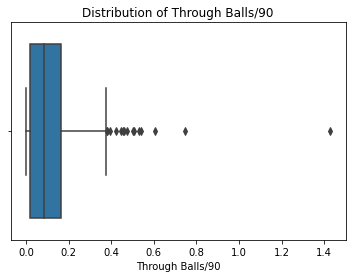


The skewness for Passes under pressure/90 is: -0.22063987278735056


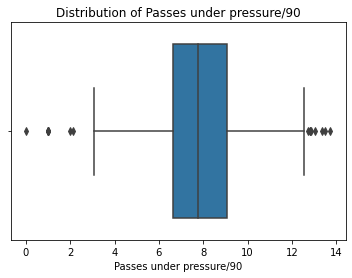


The skewness for Switches/90 is: 1.2792297944226003


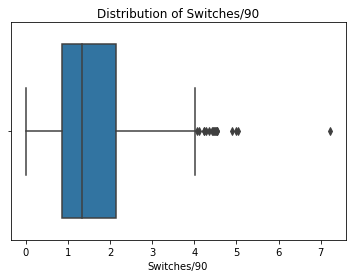


The skewness for Crosses/90 is: 1.8938001581884958


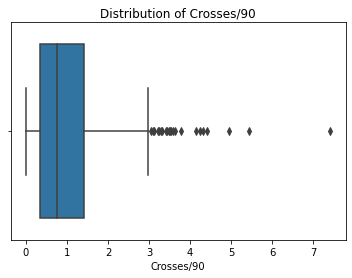


The skewness for Bad Passes/90 is: 0.1845286365830506


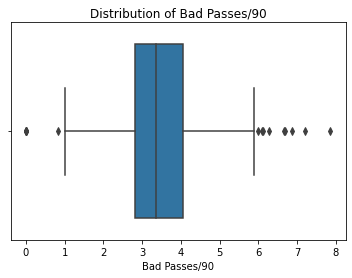


The skewness for SCA/90 is: 0.6016810719566514


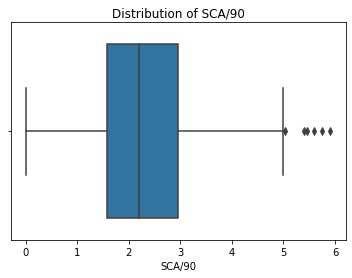


The skewness for GCA/90 is: 0.9178531646882505


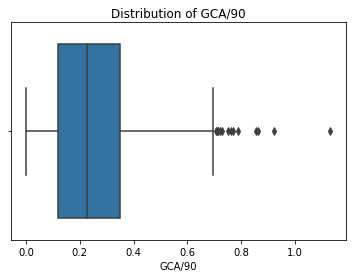


The skewness for Tkl Won/90 is: 0.23858268716099237


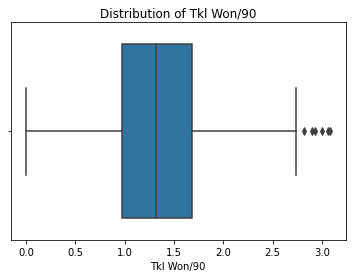


The skewness for Tkl Success Rate is: -2.0724383248852227


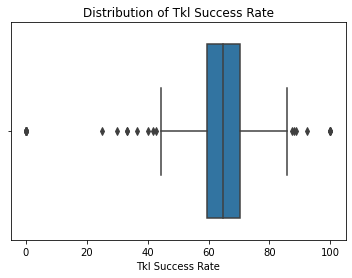


The skewness for Tkl vs Dribbles/90 is: 0.5409062095280214


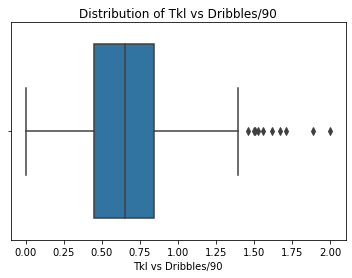


The skewness for Tkl vs. dribbles Success Rate is: 1.2845654272837357


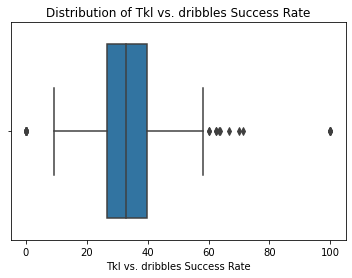


The skewness for Successful Presses/90 is: 0.04340509935301603


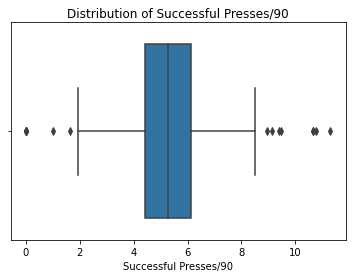


The skewness for Press Success Rate is: -1.992071004162529


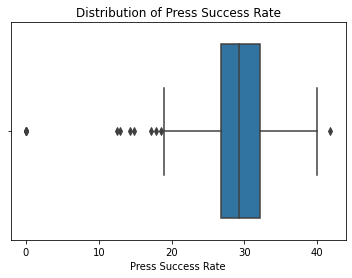


The skewness for Blocks/90 is: 0.46900851497654766


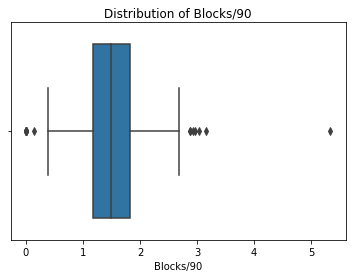


The skewness for Int/90 is: 0.5491633604768279


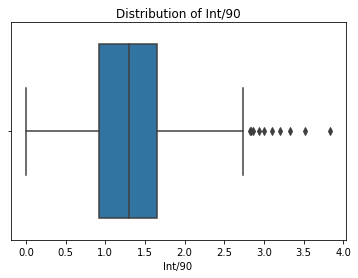


The skewness for Clearances/90 is: 1.2684383143580664


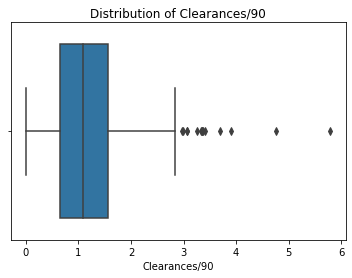


The skewness for Errors/90 is: 6.588632803003785


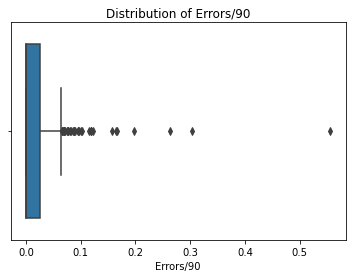


The skewness for Touches/90 is: 0.09080300023201167


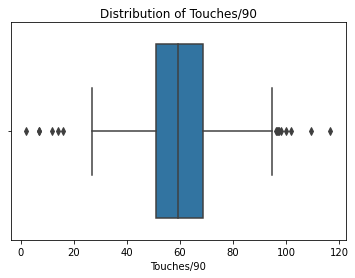


The skewness for Mid 3rd Touches/90 is: 0.4789875754687162


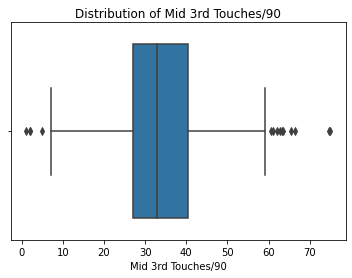


The skewness for Att 3rd Touchs/90 is: 0.4934811316692428


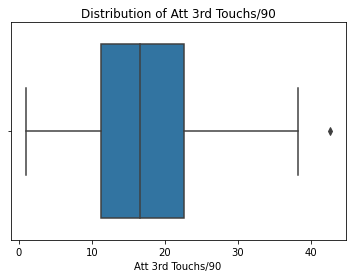


The skewness for Att Pen Touches/90 is: 1.349127835156913


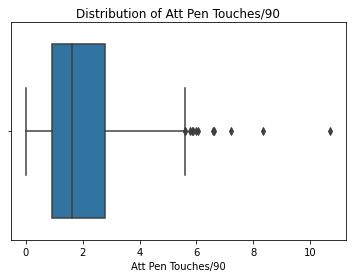


The skewness for Successful Dribbles/90 is: 1.3901654403069175


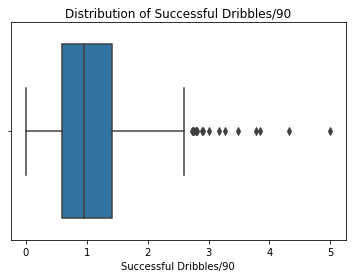


The skewness for Dribble Success Rate is: -1.0274890527811458


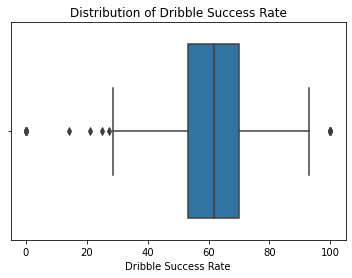


The skewness for Carries/90 is: 0.38142270121320704


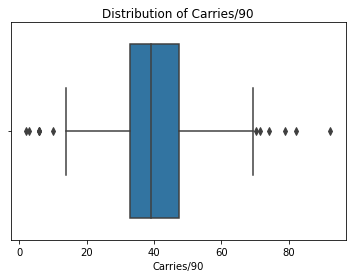


The skewness for Progressive Carries/90 is: 0.7649944393077432


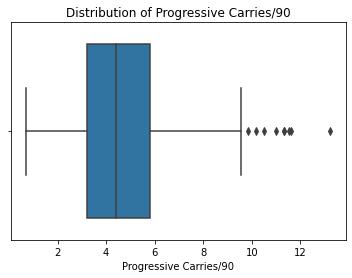


The skewness for Attacking Carries/90 is: 0.8782298689759415


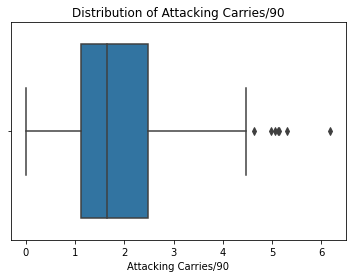


The skewness for Bad Dribbles /90 is: 0.8828196547826301


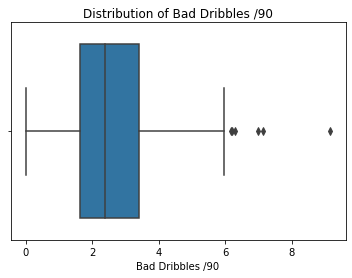


The skewness for Rec/90 is: 0.5687595664570727


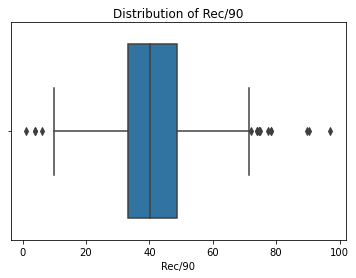


The skewness for Rec Success Rate is: -1.2088354214760335


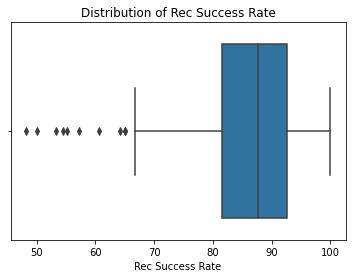


The skewness for Fouls Committed/90 is: 0.49637650047380055


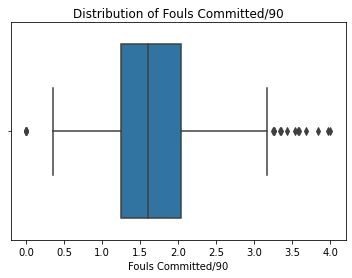


The skewness for Fouls drawn/90 is: 0.6466951419606717


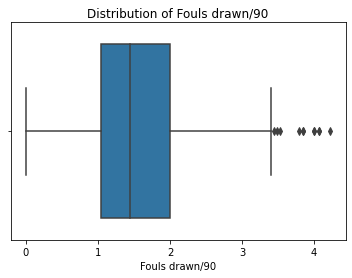


The skewness for PKs won/90 is: 3.600397596660723


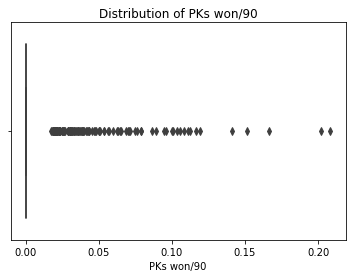


The skewness for PKs conceded/90 is: 4.44245301753624


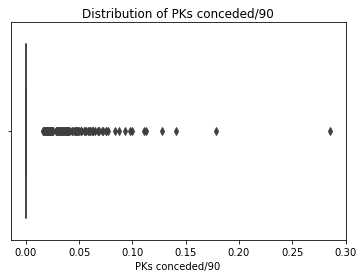


The skewness for Loose Balls Recov/90 is: -0.3713082258570481


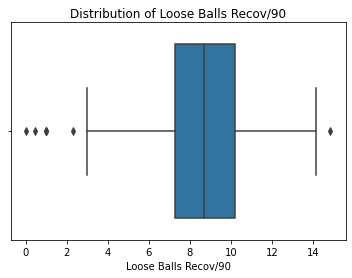


The skewness for Aerial Battles Won/90 is: 1.6013335940549718


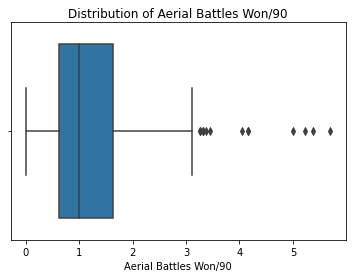


The skewness for Aerial Battle Success Rate is: -0.4090158006034734


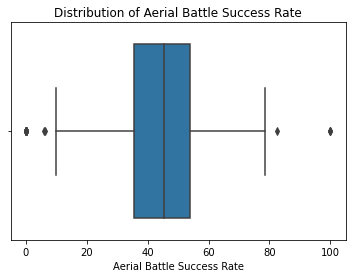


The skewness for Club Tier is: 0.3088834274857403


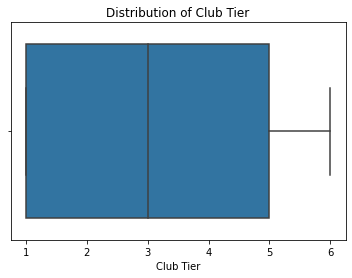


The skewness for European is: -1.236979488806508


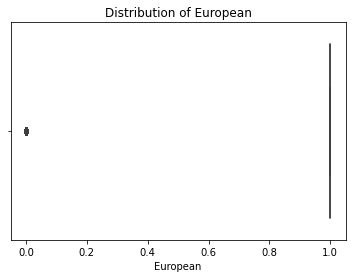


The skewness for subg_Holding Midfielder is: -0.879892761987714


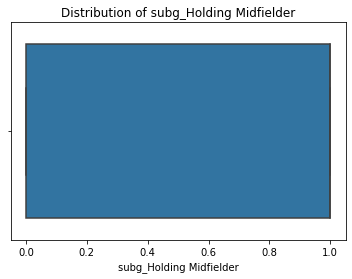

In [425]:
#plotting feature boxes
Boxplot_Features(X_midfielder)


Again we can see skew in the data set, but aligns with the different roles the different **midfielders** play. The defensive stats are skewed by *holding midfielders* and the attacking stats by *attacking midfielders*. Again, I am not going to transform the features, so as to maintain as much interpretability as possible. 

## Baseline Model
In this section I will be running a baseline model on the stats only data frame.

### Train test split

In [431]:
#splitting
X_midfielder_baesline_train, X_midfielder_baseline_test, y_midfielder_baseline_train, y_midfielder_baseline_test = train_test_split(X_midfielder_so,
                                                                                                                                    y_midfielder,
                                                                                                                                    test_size=0.4, 
                                                                                                                                    random_state=21)
#checking shapes
print(f"There are {X_midfielder_baesline_train.shape[0]} observations and {X_midfielder_baesline_train.shape[1]} features in the feature training set")
print(f"There are {X_midfielder_baseline_test.shape[0]} observations and {X_midfielder_baseline_test.shape[1]} features in the feature test set")
print(f"There are {y_midfielder_baseline_train.shape[0]} observations in the target training set")
print(f"There are {y_midfielder_baseline_test.shape[0]} observations in the target training set")

There are 311 observations and 61 features in the feature training set
There are 208 observations and 61 features in the feature test set
There are 311 observations in the target training set
There are 208 observations in the target training set


### Midfielder Baseline

In [432]:
#instantiating
midfielder_baseline = LinearRegression()

#fitting
midfielder_baseline.fit(X_midfielder_baesline_train, y_midfielder_baseline_train)

#scoring
mid_base_train_score = round(midfielder_baseline.score(X_midfielder_baesline_train, y_midfielder_baseline_train)* 100, 2)
mid_base_test_score = round(midfielder_baseline.score(X_midfielder_baseline_test, y_midfielder_baseline_test)* 100, 2)

print(f"Midfielder Baseline Training R-Squared: {mid_base_train_score}%")
print(f"Midfielder Baseline Training R-Squared: {mid_base_test_score}%")

Midfielder Baseline Training R-Squared: 58.95%
Midfielder Baseline Training R-Squared: 41.3%


A promising training score of **58.95%**. A much higher baseline of **41.3%**, but still room to improve. 

In [475]:
#appending for plotting
baseline_r2.append(mid_base_test_score)

## Midfielder Models With Engineered Features

### Train Test Split
I will be using the same 60/40 train test split as before, as this data set is too small for anything larger.

In [433]:
print(f" There are {X_midfielder.shape[0]} midfielder in this dataset")

 There are 519 midfielder in this dataset


In [434]:
#splitting
X_midfielder_train, X_midfielder_test, y_midfielder_train, y_midfielder_test = train_test_split(X_midfielder,
                                                                                                y_midfielder,
                                                                                                test_size=0.4,
                                                                                                random_state=21)
#checking shapes
print(f'There are {X_midfielder_train.shape[0]} rows and {X_midfielder_train.shape[1]} columns in X_midfielder_train')
print(f'There are {X_midfielder_test.shape[0]} rows and {X_midfielder_test.shape[1]} columns in X_midfielder_test')
print(f'There are {y_midfielder_train.shape[0]} values y_midfielder_train')
print(f'There are {y_midfielder_test.shape[0]} values in y_midfielder_test')

There are 311 rows and 64 columns in X_midfielder_train
There are 208 rows and 64 columns in X_midfielder_test
There are 311 values y_midfielder_train
There are 208 values in y_midfielder_test


The shapes line up and modeling can commence.

### Midfielder LInear Regression 1 Model

In [444]:
#instantiating
midfielder_linreg1 = LinearRegression()

#fitting
midfielder_linreg1.fit(X_midfielder_train, y_midfielder_train)

#scoring
midfielder_train_score = round(midfielder_linreg1.score(X_midfielder_train, y_midfielder_train) * 100, 2)
midfielder_test_score = round(midfielder_linreg1.score(X_midfielder_test, y_midfielder_test) * 100, 2)

print(f"Training r-squared: {midfielder_train_score}%")
print(f"Test r-squared: {midfielder_test_score}%")
print(f"Baseline r-squared: {mid_base_test_score}%")

Training r-squared: 66.27%
Test r-squared: 48.67%
Baseline r-squared: 41.3%


A jump from the baseline of more than **8%** to **48.67%**. The features are again working. 

###  Diagnostic

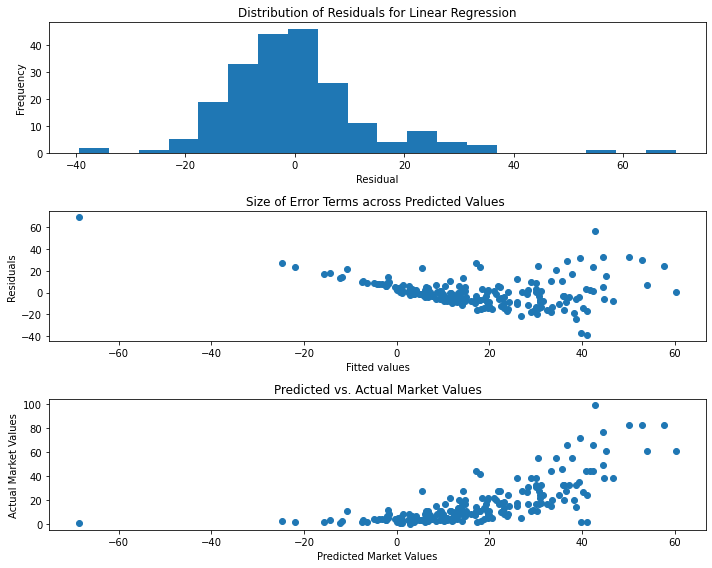

In [437]:
LinRegDiagnostic(midfielder_linreg1, X_midfielder_test, y_midfielder_test)

All of the diagnostic tests have failed. There are similar issues to the defender baseline. The model is performing worse as values increase and undervaluing players. The residuals do not appear normal, they also look to follow a linear trend. Let's Visualize the data using PCA transformations. We also see negative predicted values, which make no sense in this context.

### Visualizing with PCA

In [438]:
#instantiating scaler
pca_mid = PCA(n_components=1, random_state=21)

#scaling features
X_midfielder_pca = pca_mid.fit_transform(X_midfielder)

#checkstep
print(X_midfielder_pca.shape)
y_midfielder.shape

(519, 1)


(519,)

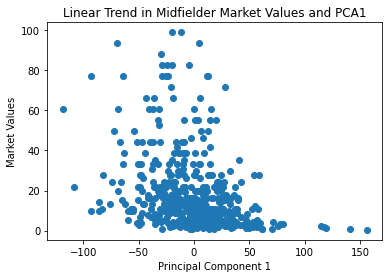

In [439]:
#plotting scatter plot
plt.figure()
plt.scatter(X_midfielder_pca, y_midfielder)
plt.ylabel('Market Values')
plt.xlabel('Principal Component 1')
plt.title('Linear Trend in Midfielder Market Values and PCA1')
plt.show()

Over the 40 million dollar mark the trend goes away. This again illustrates the separation between the average player and the elite midfielder, as the scarcity at the top of the graph is notable. My first thought is to use a the natural log to transform the target variable, to make the separation a less stark, and to remove any negative predicted values for the target variable..  

## Transforming the Target Variable `Market Values in Millions`
In this section, I will transform the target variable using the natural logarithm. Then I will compare the transformed distribution of the target variable to the previous distribution usings histograms. Finally, before modeling, I will look at the linear trend between the transformed target and the feature variables. 

In [440]:
#transforming whole target
log_y_midfielder = np.log(y_midfielder + 1)

#transforming training set
log_y_midfielder_train = np.log(y_midfielder_train+1)

#transforming test set
log_y_midfielder_test = np.log(y_midfielder_test+1)

### Comparing Transformed and Original Distributions of the Target Variable


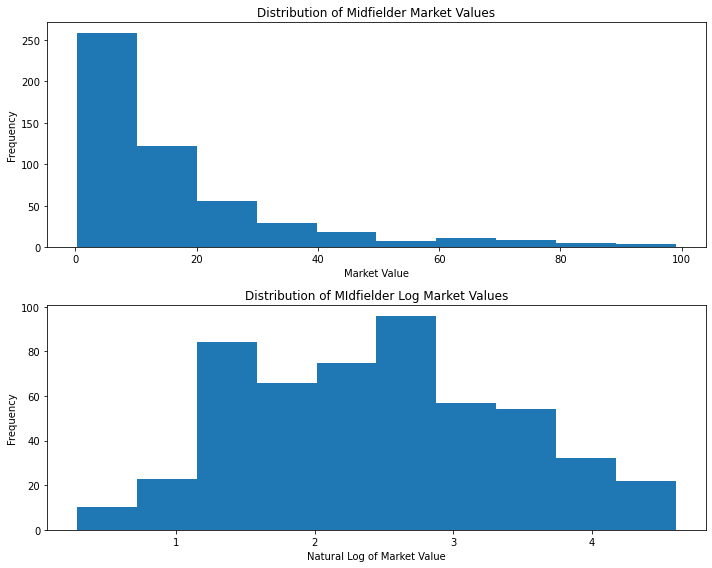

In [441]:
#grid
plt.subplots(2,1, figsize = (10,8))

#linear space histogram
plt.subplot(2,1,1)
plt.hist(y_midfielder)
plt.xlabel('Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of Midfielder Market Values')

#log space histogram
plt.subplot(2,1,2)
plt.hist(log_y_midfielder)
plt.xlabel('Natural Log of Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of MIdfielder Log Market Values')

plt.tight_layout()
plt.show()

Clearly, the transformation has created a less skewed target data set. It appears to be bimodal, but all in all it is much more centered than before

### Visualizing Transformed Target Variable with PCA

The first PCA component has already been created, so I can use that to see if there is a change in linear trend between the feature variables and the transfomred target variable. 

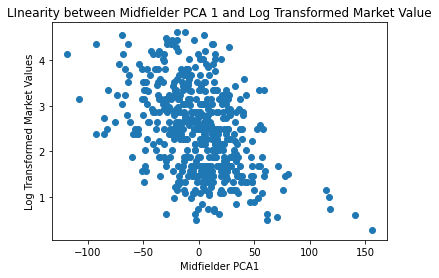

In [442]:
#plotting scatter plot of pca1 and transformed target
plt.figure()
plt.scatter(X_midfielder_pca, log_y_midfielder)
plt.ylabel('Log Transformed Market Values')
plt.xlabel('Midfielder PCA1')
plt.title('LInearity between Midfielder PCA 1 and Log Transformed Market Value')
plt.show()

The data is much more clustered. There are a few stray points in the top left and bottom right corners, but other than that there is a much stronger linear trend in this graph. 

## Linear Regression with Transformed Target Variable. 
The features have already been split into train and test sets. I do not need to create a validation set, as there are no parameters being optimized. 

In [445]:
#instantiating
midfielder_linreg_log = LinearRegression()

#fitting the model
midfielder_linreg_log.fit(X_midfielder_train, log_y_midfielder_train)

#scoring
train_score_log_mid = round(midfielder_linreg_log.score(X_midfielder_train, log_y_midfielder_train) * 100, 2)
test_score_log_mid = round(midfielder_linreg_log.score(X_midfielder_test, log_y_midfielder_test) * 100, 2)

print(f"Training R-Squared: {train_score_log_mid}%")
print(f"Test R-Squared: {test_score_log_mid}%")
print(f"Previous R-Squared: {midfielder_test_score}")
print(f"Baseline Score: {mid_base_test_score}")

Training R-Squared: 79.48%
Test R-Squared: 59.27%
Previous R-Squared: 48.67
Baseline Score: 41.3


The model is still extremely over-fit, but the test score increased to **59.27%**, an increase of more than 10% just by transforming the target variable. 

### Model Diagnostics 

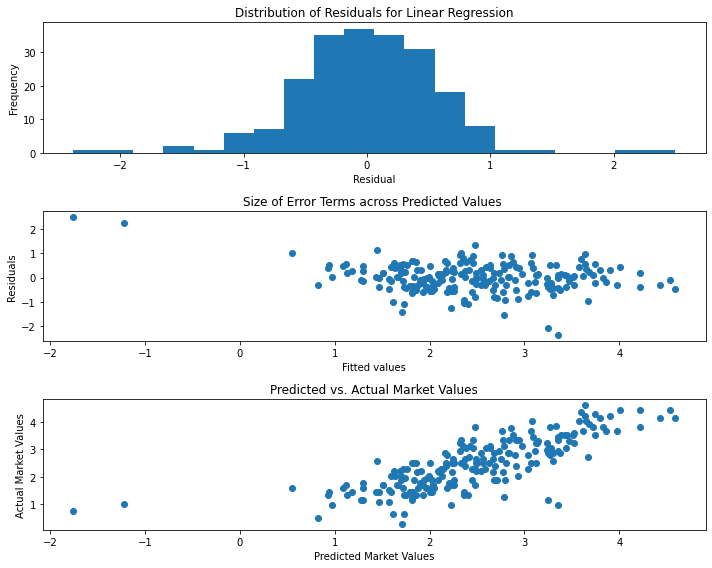

In [446]:
LinRegDiagnostic(midfielder_linreg_log, X_midfielder_test, log_y_midfielder_test)

There are two points that does not fit in with the rest of the data set. There are two massive points at the far end of the graph with negative predictions. I am not going to do anything with these points now, but if this continues I will investigate further. 

I am now going to see if the over-fitting can be fixed by taking the ten best features using SelectKBest with k = 10

In [447]:
#creating feature selector
ten_best = SelectKBest(f_regression, k = 10)

#fitting and transforming training set
X_mid_train_top10 = ten_best.fit_transform(X_midfielder_train,
                                          log_y_midfielder_train)

#transforming test
X_mid_test_top10 = ten_best.transform(X_midfielder_test)

#instantiating linear regression
mid_log_top10_linreg = LinearRegression()

#fitting
mid_log_top10_linreg.fit(X_mid_train_top10, log_y_midfielder_train)

#scoring
top10_train_score = mid_log_top10_linreg.score(X_mid_train_top10, 
                                              log_y_midfielder_train)

top10_test_score = mid_log_top10_linreg.score(X_mid_test_top10, 
                                              log_y_midfielder_test)

print(f"Training score for top 10 predictors: {round(top10_train_score *100, 2)}%")
print(f"Test score for top 10 predictors: {round(top10_test_score *100, 2)}%")

Training score for top 10 predictors: 63.84%
Test score for top 10 predictors: 60.53%


This is a really good result. The test accuracy improved from the previous model. Reducing features appears to work for midfielders as well. 

In [448]:
#pulling ten best columns
cols = ten_best.get_support(indices=True)
X_train_new_10 = X_midfielder_train.iloc[:,cols]

In [449]:
#new 10 features
X_train_new_10

,90s,Pass Cmp/90,Short Pass Cmp/90,Attacking Passes/90,Progressing Passes/90,Touches/90,Carries/90,Progressive Carries/90,Rec/90,Club Tier
496,21.8,28.256881,12.844037,3.532110,2.431193,54.816514,31.055046,4.770642,31.605505,1
87,11.1,44.414414,20.000000,6.036036,4.864865,60.810811,39.369369,5.315315,38.198198,2
302,30.1,29.933555,16.843854,6.079734,3.920266,50.863787,37.873754,6.179402,40.099668,3
380,38.9,37.532134,13.290488,2.930591,2.724936,54.652956,31.516710,1.902314,32.879177,1
19,8.6,47.093023,22.209302,5.813953,4.883721,68.488372,51.395349,7.674419,49.883721,6
...,...,...,...,...,...,...,...,...,...,...
419,44.0,51.750000,15.681818,7.500000,5.613636,71.340909,47.750000,4.363636,51.068182,4
120,33.1,29.909366,12.900302,4.531722,3.655589,53.051360,31.087613,4.320242,32.175227,3
368,41.4,39.879227,10.797101,4.396135,3.260870,56.714976,34.202899,3.043478,35.217391,4
48,4.1,32.195122,7.560976,3.902439,2.682927,43.902439,33.902439,2.439024,25.609756,2


In [450]:
#creating coefficients data frame
midfielder_coef_df = pd.DataFrame({"Feature": X_train_new_10.columns,
                                   "Coefficient": mid_log_top10_linreg.coef_})
midfielder_coef_df.sort_values('Coefficient')

,Feature,Coefficient
4,Progressing Passes/90,-0.034853
8,Rec/90,-0.023609
1,Pass Cmp/90,-0.016786
2,Short Pass Cmp/90,-0.004270
6,Carries/90,0.017335
5,Touches/90,0.022674
0,90s,0.024183
3,Attacking Passes/90,0.029630
7,Progressive Carries/90,0.064362
9,Club Tier,0.307205


Though the results are good, the data is not interpretable, as there are too many variables that do not match up. However 

The next step is to look at a Lasso Regression to see if some of these confounding coefficients will be eliminated through regularization.

## Lasso Regression

Again I will run this with a gridsearch to see which value of alpha is the best. 

In [451]:
#creating pipeline
mid_estimators = [('model', Lasso(random_state=21, max_iter=1000000))]
mid_pipeline = Pipeline(mid_estimators)

#creating parameter list
mid_params = {'model__alpha': [10**-3, 10**-2, 10**-1, 1, 10**1, 10**2, 10**3]}
mid_grid_search = GridSearchCV(mid_pipeline, param_grid=mid_params, cv=2)

midfielder_fitted_search = grid_search.fit(X_midfielder_train, log_y_midfielder_train)

In [452]:
#best estimator
best_lasso_mid = midfielder_fitted_search.best_estimator_
best_lasso_mid

Pipeline(steps=[('model', Lasso(alpha=0.1, max_iter=1000000, random_state=21))])

In [453]:
#training score
gs_mid_trainscore = midfielder_fitted_search.score(X_midfielder_train, log_y_midfielder_train)
print(f'Training score: {round(gs_mid_trainscore * 100, 2)}%')

Training score: 71.19%


In [455]:
#test score and prior test scores
gs_mid_testscore = midfielder_fitted_search.score(X_midfielder_test, log_y_midfielder_test)

print(f'Test Score: {round(gs_mid_testscore* 100, 2)}%') 
print(f'Previous Test Score: {test_score_log_mid}%')
print(f"Baseline Score: {mid_base_test_score}%")

Test Score: 67.36%
Previous Test Score: 59.27%
Baseline Score: 41.3%


**67.36%** is the best score I've gotten thus far. Now I want to see how the diagnostics look. 

### Diagnostics

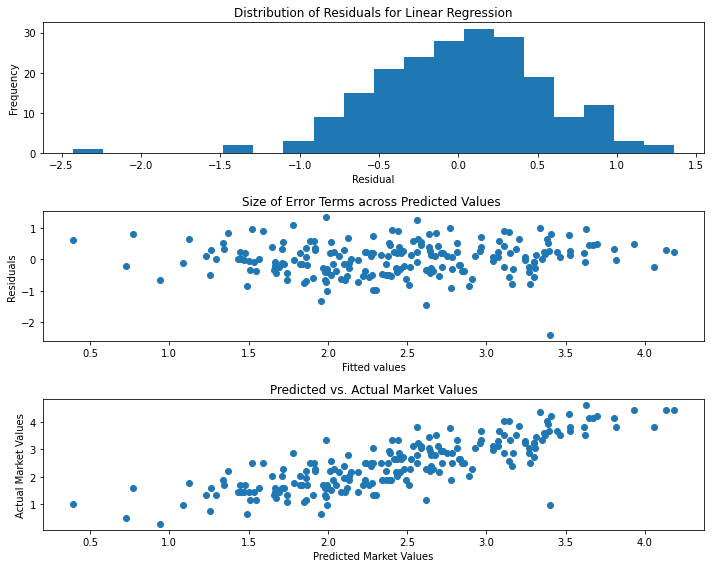

In [456]:
LinRegDiagnostic(midfielder_fitted_search,
                 X_midfielder_test,
                 log_y_midfielder_test)

All of the diagnostics look good. I will now manually fit the previous lasso so I can look at the coefficients.

In [457]:
#instantiating
mid_lasso1 = Lasso(alpha = 0.1, max_iter=1000000, random_state=21)

#fitting
mid_lasso1.fit(X_midfielder_train, log_y_midfielder_train)

#pulling coefficients
mid_lasso_coefficients_df = SortedCoef(mid_lasso1, X_midfielder_train)

mid_lasso_coefficients_df

There are 11 with non-zero coefficients
53 features were zeroes out from L1 penalty


,Feature,Coefficient
61,Club Tier,0.228713
1,90s,0.028239
44,Att 3rd Touchs/90,0.018396
48,Carries/90,0.007116
47,Dribble Success Rate,0.002887
33,Tkl Success Rate,0.002189
60,Aerial Battle Success Rate,0.002140
35,Tkl vs. dribbles Success Rate,0.001831
42,Touches/90,0.001615
19,Medium Pass Cmp Pctg,-0.003352


There is only one pair of variables here that explicitly don't match up, `Touches/90` and `Att 3rd Touches/90`. Below I am going to see which of the two has a stronger correlation between the two of them. First I need to update the function so that it can be used on this dataframe. In the previous iteration, I hard coded the defender target set into the function, so it needs to be fixed.

In [458]:
def CollinearityCheck2(features_list, X, y):
    '''
    This function will help check for collinearity amongst feature variables. 
    It will also print out scatter plots and correlation coefficients for each feateure in the list and the target variable.
    inputs
    Feature List - A list of features in the dataset
    X - feature variable data frame
    y- target variable data frame
    
    Output
    Pairplots of features in feature list and scatter plots and correlation coefficient between each feature and the target variable.
    '''
    #paiplots
    sns.pairplot(data = X, vars = features_list)
    
    
    #scatter plots with features and targets
    for col in features_list:
        plt.figure(figsize = (5, 5))
        plt.scatter(X[col], y)
        plt.xlabel(col)
        plt.ylabel('Log Market Values')
        plt.show()
        
        #correlation coefficients
        print(f'Corrlation coefficient between {col} and target: {pearsonr(X[col], y)}')
        print('')

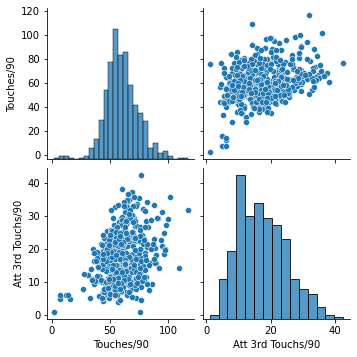

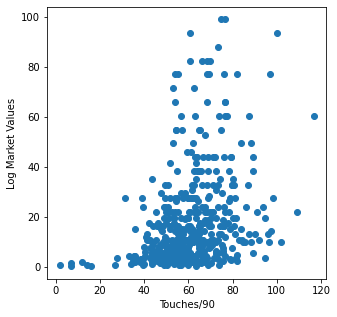

Corrlation coefficient between Touches/90 and target: (0.34959806781147074, 2.295889608453578e-16)



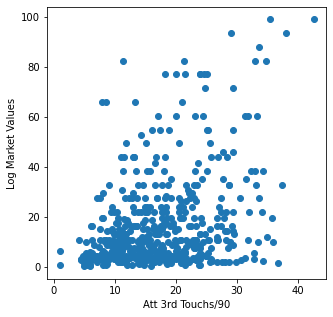

Corrlation coefficient between Att 3rd Touchs/90 and target: (0.35151780849431774, 1.5359139338427708e-16)



In [463]:
#touches list
touches = ['Touches/90', 'Att 3rd Touchs/90']

#collinearity check
CollinearityCheck2(touches, X_midfielder, y_midfielder)

`Touches/90` has the weaker correlation so it will be removed. 

In [466]:
#removing attacking third touches from the feature sets
X_midfielder_test_2 = X_midfielder_test.drop('Touches/90',
                                             axis = 1)

X_midfielder_train_2 = X_midfielder_train.drop('Touches/90',
                                             axis = 1)

## Midfielder Lasso 2

In [467]:
#instantiating
mid_lasso2 = Lasso(alpha = 0.1, max_iter=1000000, random_state=21)

#fitting
mid_lasso2.fit(X_midfielder_train_2, log_y_midfielder_train)


#scoring
mid_lasso_2_train_score = mid_lasso2.score(X_midfielder_train_2, 
                                           log_y_midfielder_train)

mid_lasso_2_test_score = mid_lasso2.score(X_midfielder_test_2, 
                                          log_y_midfielder_test)

print(f"Midfielder Lasso 2 Training Score: {round(mid_lasso_2_train_score*100, 2)}%")

print(f"Midfielder Lasso 2 R-Squared: {round(mid_lasso_2_test_score*100, 2)}%")
print(f"Previous R-Squared: {round(gs_mid_testscore* 100, 2)}%")
print(f"Baseline R-Squared: {mid_base_test_score}%")

#sorted coefficient df
SortedCoef(mid_lasso2, X_midfielder_train_2)

Midfielder Lasso 2 Training Score: 71.18%
Midfielder Lasso 2 R-Squared: 67.29%
Previous R-Squared: 67.36%
Baseline R-Squared: 41.3%
There are 11 with non-zero coefficients
52 features were zeroes out from L1 penalty


,Feature,Coefficient
60,Club Tier,0.228412
1,90s,0.028333
43,Att 3rd Touchs/90,0.018268
47,Carries/90,0.009049
46,Dribble Success Rate,0.002828
59,Aerial Battle Success Rate,0.002314
33,Tkl Success Rate,0.002168
35,Tkl vs. dribbles Success Rate,0.001867
22,Attacking Passes/90,0.000091
19,Medium Pass Cmp Pctg,-0.003468


There score dropped a little bit to **67.29%**, but the results are interpretable. This will be our final model. Now I will examine the practical effects of the above coefficients

In [468]:
#creating sorted coefficient frame
optimized_midfielder_lasso = SortedCoef(mid_lasso2, 
                                        X_midfielder_train_2)

#creating practical effect
optimized_midfielder_lasso['Practical Effect'] = (np.expm1(optimized_midfielder_lasso['Coefficient']) * 100)
optimized_midfielder_lasso['Practical Effect'] = round(optimized_midfielder_lasso['Practical Effect'], 2)

#displaying
optimized_midfielder_lasso

There are 11 with non-zero coefficients
52 features were zeroes out from L1 penalty


,Feature,Coefficient,Practical Effect
60,Club Tier,0.228412,25.66
1,90s,0.028333,2.87
43,Att 3rd Touchs/90,0.018268,1.84
47,Carries/90,0.009049,0.91
46,Dribble Success Rate,0.002828,0.28
59,Aerial Battle Success Rate,0.002314,0.23
33,Tkl Success Rate,0.002168,0.22
35,Tkl vs. dribbles Success Rate,0.001867,0.19
22,Attacking Passes/90,0.000091,0.01
19,Medium Pass Cmp Pctg,-0.003468,-0.35


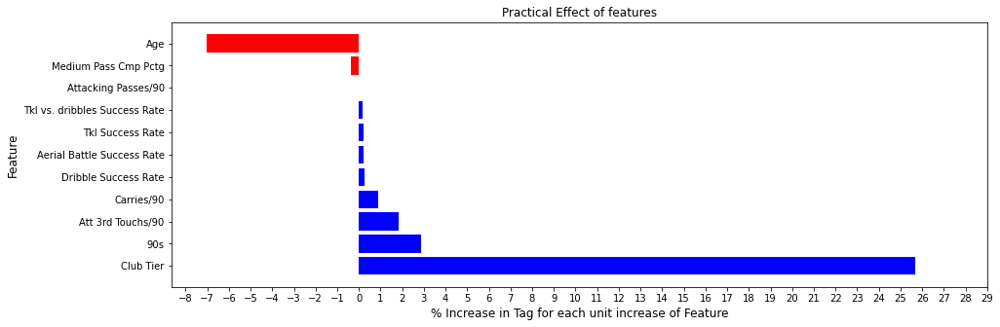

In [541]:
#plotting practical effect
plt.figure(figsize = (15, 5))
plt.barh(optimized_midfielder_lasso['Feature'], optimized_midfielder_lasso['Practical Effect'],
        color = ['b', 'b', 'b', 'b','b','b','b','b','b','r', 'r'])
plt.xlabel('% Increase in Tag for each unit increase of Feature', fontsize = 12)
plt.ylabel('Feature', fontsize = 12)
plt.title('Practical Effect of features', fontsize = 12)
plt.xticks(list(range(-8, 30, 1)))
plt.show()

Notes on the plot above.

* `Club Tier` and `90s` again have the biggest positive effect. If you play a lot and you play for a good team, you're value will go up.

* `Age` is again the biggest negative factor. The model doing its job. Those players with no playing time must derive their value from somewhere, and the model is determining it is from there young ages. 

* `Att 3rd Touches/90` has the fourth largest net effect. You want players who are able to get the balls into goal scoring areas. I think also has to do with `Club Tier`. Better teams get more chances for there players in attacking areas. 

* Keeping possession and getting possession back for your team are the most important skills for this team. The ability to move the ball forward are represented by `Dribble Success Rate` and `Carries/90`. The tackle statistics represent getting the ball back for your team. This also neatly illustrates the roles of the two types of midfielders. 

* `Medium Pass Cmp Pctg` and `Aerial Battle Success Rate` are examined below.



* `Attacking Passes/90` effects are practically zero. 

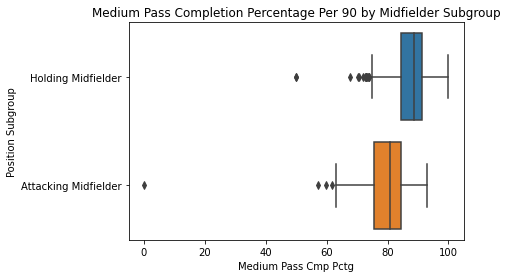

In [470]:
plt.figure()
sns.boxplot(data=midfielder_df_master, x = 'Medium Pass Cmp Pctg', y = 'Position Subgroup')
plt.title('Medium Pass Completion Percentage Per 90 by Midfielder Subgroup')
plt.show()

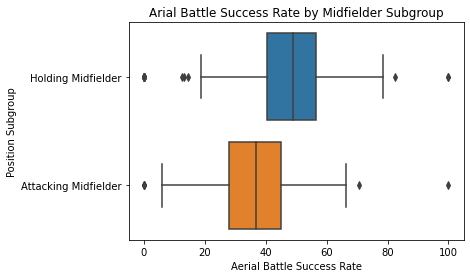

In [471]:
plt.figure()
sns.boxplot(data=midfielder_df_master, x = 'Aerial Battle Success Rate', y = 'Position Subgroup')
plt.title('Arial Battle Success Rate by Midfielder Subgroup')
plt.show()

For `Aerial Battle Success Rate` coefficients could be caused by outliers. I am not sure why `Medium Pass Cmp Pctg` has a negative coefficient, but since there are no directly contradicting variable, I am going to leave it in.

## True R-Squared

In [473]:
#concatenting x and y
X_midfielder_2 = pd.concat([X_midfielder_train_2, X_midfielder_test_2])
y_midfielder_2 = pd.concat([y_midfielder_train, y_midfielder_test])

#predictions in log space
y_mid_pred_log = mid_lasso2.predict(X_midfielder_2)

#predictions in linear space
y_mid_pred = np.expm1(y_mid_pred_log)

In [474]:
#scoring predictions and actual market values

midfielder_true_r2 = round(r2_score(y_midfielder_2, y_mid_pred)* 100, 2)

#appending for future plotting
true_r2.append(midfielder_true_r2)

#displaying
midfielder_true_r2

65.13

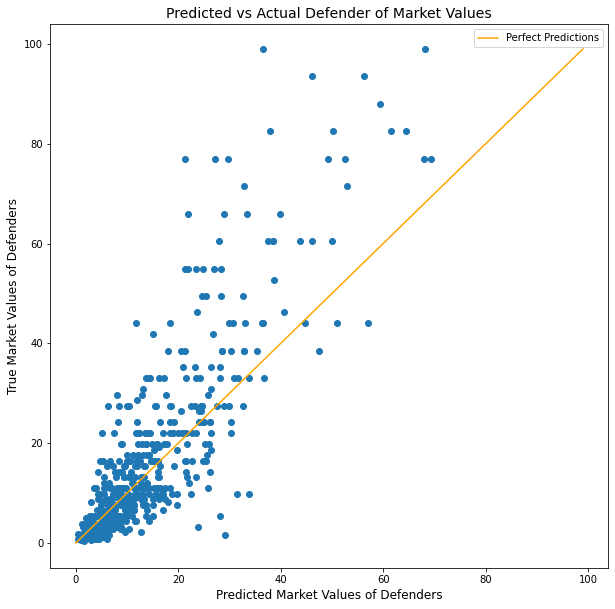

Correlation Coefficient: 0.85


In [478]:
#square graph for best comparisons
plt.figure(figsize=(10,10))
#scatter of predictied vs actual
plt.scatter(y_mid_pred, y_midfielder_2)

#plotting perfect predictions line
plt.plot(range(0,100), range(0,100), c = 'orange', label = 'Perfect Predictions')

#details
plt.xlabel('Predicted Market Values of Defenders', fontsize = 12)
plt.ylabel('True Market Values of Defenders', fontsize = 12)
plt.title('Predicted vs Actual Defender of Market Values', fontsize = 14)
plt.legend()
plt.show()

#printing correlation
corr, p = pearsonr(y_mid_pred, y_midfielder_2)
print(f"Correlation Coefficient: {round(corr, 2)}")

The model is struggling to predict higher values. The residuals are much higher as the actual values increase. It is doing a decent drop picking up on the linear trend, as shown by the strong correlation coefficient.

## Non Linear Models

To reiterate, I am only fitting in log space to compare against the optimal r-squared. I am also only doing this for future reference. This models will not be scored today. 

### Midfielder KNN Regressor

In [480]:
#creating estimotor grid
k__estimators = [("scaler", MinMaxScaler()),
               ("model", KNeighborsRegressor())]

#instantiating pipeline
k_pipe = Pipeline(k_estimators)

#setting parameter grid
k_params = {"model": [KNeighborsRegressor()],
            "model__n_neighbors": list(range(5, 100, 5)),
            "model__weights": ['uniform', 'distance'],
            "scaler": [MinMaxScaler(), None]}

#fitting and scoring gird search
k_grid_search = GridSearchCV(k_pipe, k_params, cv = 2)
fitted_k_grid = k_grid_search.fit(X_midfielder_train, y_midfielder_train)

In [481]:
#train score
fitted_k_grid.score(X_midfielder_train, y_midfielder_train)

1.0

In [482]:
#test score
fitted_k_grid.score(X_midfielder_test, y_midfielder_test)

0.4791304499778424

This KNN performed better than the defender KNN, but it is still not worth exploring in the future.

### Midfielder Decision Tree Regressor

In [483]:
#screating non linear estimators
tree_estimators = [("model", DecisionTreeRegressor(random_state=21))]

#instantiating pipeling
tree_pipe = Pipeline(tree_estimators)

#creating decision tree parameter grid
tree_params = {"model__criterion": ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
               "model__max_depth": list(range(5, 50, 5)),
               "model__min_samples_leaf": list(range(1, 20)),
               "model__splitter": ['best', 'random']}


#creating and fitting tree grid                
tree_grid_search = GridSearchCV(tree_pipe, tree_params, cv = 2)
fitted_tree_grid = tree_grid_search.fit(X_midfielder_train, y_midfielder_train)             
fitted_tree_grid.best_estimator_

Pipeline(steps=[('model',
                 DecisionTreeRegressor(max_depth=5, min_samples_leaf=13,
                                       random_state=21))])

In [484]:
#train score
fitted_tree_grid.score(X_midfielder_train, y_midfielder_train)   

0.7030242276523508

In [485]:
#test score
fitted_tree_grid.score(X_midfielder_test, y_midfielder_test)  

0.3323734838863335

Again, this model is not performing well and is not worth exploring further.

### Midfielder SVR

In [486]:
#screating non linear estimators
svr_estimators = [('scaler', MinMaxScaler())
                  ,("model", SVR(max_iter=1000000))]

#instantiating pipeling
svr_pipe = Pipeline(svr_estimators)

#creating decision tree parameter grid
svr_params = {"model__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
               "model__gamma": ['scale', 'auto'],
               "model__C": [0.01, 0.1, 1, 10, 100],
               "model__epsilon": np.arange(1, 10, 2)/10}


#creating and fitting tree grid                
svr_grid_search = GridSearchCV(svr_pipe, svr_params, cv = 2)
fitted_svr_grid = svr_grid_search.fit(X_midfielder_train, y_midfielder_train)             
fitted_svr_grid.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model',
                 SVR(C=1, epsilon=0.9, kernel='poly', max_iter=1000000))])

In [487]:
#train score
fitted_svr_grid.score(X_midfielder_train, y_midfielder_train)  

0.7089355969780593

In [488]:
#test score
fitted_svr_grid.score(X_midfielder_test, y_midfielder_test)  

0.6358129422828755

Again we see that support vector regressors are absolutely worth exploring. 

# Attackers 

Before beginning the process of modeling the third and final position group, I have come to one undeniable conclusion: the people who named positions in soccer were not very creative. Again, the name says at all. These players attack the opposing teams defenses. They are responsible for scoring goals, and thus they are the players who get the glory. Most of the biggest names in world football are attackers of some kind. Messi, Ronaldo, Neymar, Mbappe all attackers. 

Attackers have the least distinction between the subgroups. Wings can be played at striker, strikers can be moved out to the wings. Here are the players within the **Attackers** group.

* Center Forward/Striker (CF/ST)
    * Technically these are two different positions, but the differences are nuanced and not really worth going into. Center forward carries a little more cache than striker, but they both play in the center of the field and get into scoring positions through some combination of skill, positioning, strength and movement. Sometimes they are tasked for holding the ball while the teammates get up the field. 
    
* Right Winger and Left Winger (RW/LW)
    * These players attack from the wings. They send crosses to waiting strikers or try to break down the defense with speed and skill. The still need to be able to finish, but these players are often better operating in space. They play the same position on opposite sides of the pitch.
    
**CFs/STs** are classified as central attackers. **RW/LWs** will grouped together as wingers.



## Attacker Supgroups

A quick dive into the differences between subgroups. 

### Value Counts

In [489]:
#value counts
attacker_df['Position Subgroup'].value_counts()

Central Attacker    259
Winger              232
Name: Position Subgroup, dtype: int64

There is a little bit of an imbalance here but not much. There are only **27** more **central attackers** than **wingers**. This is made less important as these players are often interchangeable. 

### Market Values - Averages and Boxplots

#### Average Market Values

In [490]:
#creating  average value data frame
attacker_mv_avg = attacker_df.groupby('Position Subgroup').mean()['Market Values in Millions']


#printing
print('The average market value for Attacker Subgroups')
print('_______________________________________________')
attacker_mv_avg

The average market value for Attacker Subgroups
_______________________________________________


Position Subgroup
Central Attacker    16.952741
Winger              19.967371
Name: Market Values in Millions, dtype: float64

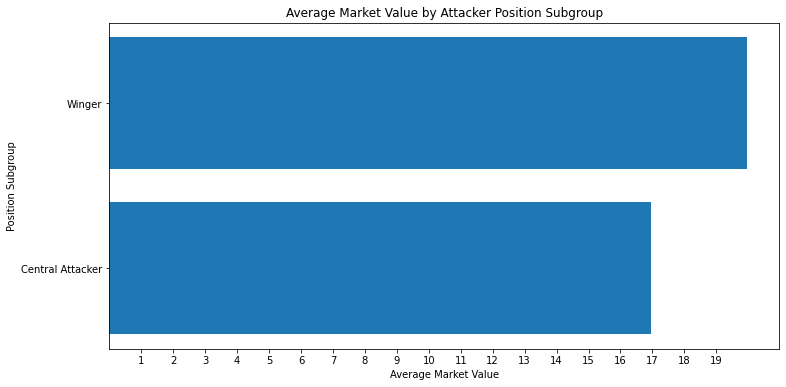

In [491]:
#plotting average values
plt.figure(figsize=(12,6))
plt.barh(attacker_mv_avg.index,
         attacker_mv_avg.values)
plt.ylabel('Position Subgroup')
plt.xlabel('Average Market Value')
plt.title('Average Market Value by Attacker Position Subgroup')
plt.xticks(range(1,20))
plt.show()

We can see there is a pretty sizable gap, almost exactly **3 million dollars** between the value of wingers and the value of Central Attackers. I would guess that this is due to the fact that most teams play 2 **wingers** at a time, as opposed to only 1 **central attacker**. This difference was not found to be statistically significant when run through a t-test.   

### Dropping Position Group

In [492]:
#creating master copy
attacker_df_master = attacker_df.copy()

In [493]:
#Dropping position group
attacker_df.drop(['Name', 'Position Group'],
                 axis = 1, inplace = True)

#checkstep
'Position Group' in attacker_df.columns

/var/folders/q0/d4gqykqs2_z_10gmvbxcf1gc0000gn/T/ipykernel_12291/3481312938.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  attacker_df.drop(['Name', 'Position Group'],


False

### Converting `Position Subgroup to Dummy Variables`

In [494]:
#creating dummies
attacker_df = pd.get_dummies(attacker_df, prefix = ['subg'],
                            columns=['Position Subgroup'], drop_first=True)

In [495]:
#check step
attacker_df.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Club Tier,European,subg_Winger
0,28,110.0,45.1,0.643016,0.243902,0.133038,0.509978,0.088692,0.0,0.603104,...,0.953437,1.396896,0.022173,0.0,2.793792,1.596452,42.105263,6,1,0
1,29,110.0,57.3,0.715532,0.261780,0.174520,0.541012,0.017452,0.0,0.584642,...,0.558464,0.907504,0.069808,0.0,5.689354,0.541012,26.956522,6,0,1
2,28,110.0,57.1,0.542907,0.297723,0.087566,0.455342,0.070053,0.0,0.544658,...,1.033275,1.873905,0.035026,0.0,4.325744,2.732049,43.454039,6,1,0
3,24,93.5,41.8,0.358852,0.263158,0.000000,0.358852,0.143541,0.0,0.277512,...,0.789474,1.794258,0.047847,0.0,4.521531,0.789474,44.594595,6,1,1
4,21,93.5,37.5,0.266667,0.346667,0.026667,0.240000,0.000000,0.0,0.266667,...,0.213333,0.826667,0.000000,0.0,7.120000,0.186667,16.279070,6,1,1


In [496]:
#check step again
attacker_df.columns

Index(['Age', 'Market Values in Millions', '90s', 'Gls/90', 'Ast/90', 'PK/90',
       'Non PK Gls/90', 'Yellow Cards/90', 'Red Cards/90', 'xG/90',
       'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Int/90', 'Clearances/90',
       'Errors/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att 3rd Touchs/90',
       'Att Pen Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate',
       'Carries/90',

All columns were dropped successfully. Now I will reset the index. 

### Resetting Index

In [497]:
#resetting index
attacker_df.reset_index(drop=True, inplace = True)

#check
attacker_df.head()

,Age,Market Values in Millions,90s,Gls/90,Ast/90,PK/90,Non PK Gls/90,Yellow Cards/90,Red Cards/90,xG/90,...,Fouls Committed/90,Fouls drawn/90,PKs won/90,PKs conceded/90,Loose Balls Recov/90,Aerial Battles Won/90,Aerial Battle Success Rate,Club Tier,European,subg_Winger
0,28,110.0,45.1,0.643016,0.243902,0.133038,0.509978,0.088692,0.0,0.603104,...,0.953437,1.396896,0.022173,0.0,2.793792,1.596452,42.105263,6,1,0
1,29,110.0,57.3,0.715532,0.261780,0.174520,0.541012,0.017452,0.0,0.584642,...,0.558464,0.907504,0.069808,0.0,5.689354,0.541012,26.956522,6,0,1
2,28,110.0,57.1,0.542907,0.297723,0.087566,0.455342,0.070053,0.0,0.544658,...,1.033275,1.873905,0.035026,0.0,4.325744,2.732049,43.454039,6,1,0
3,24,93.5,41.8,0.358852,0.263158,0.000000,0.358852,0.143541,0.0,0.277512,...,0.789474,1.794258,0.047847,0.0,4.521531,0.789474,44.594595,6,1,1
4,21,93.5,37.5,0.266667,0.346667,0.026667,0.240000,0.000000,0.0,0.266667,...,0.213333,0.826667,0.000000,0.0,7.120000,0.186667,16.279070,6,1,1


## Shape of Target and Feature Varialbes

Before creating a baseline, I am going to examine what the shape of the feature variables and the target variable.

### Splitting Features and Targets

In [502]:
#target
y_attacker = attacker_df['Market Values in Millions']

#features
X_attacker = attacker_df.drop('Market Values in Millions', axis = 1)
X_attacker_so = attacker_stats.drop('Market Values in Millions', axis = 1)

### Shape of Target Variable

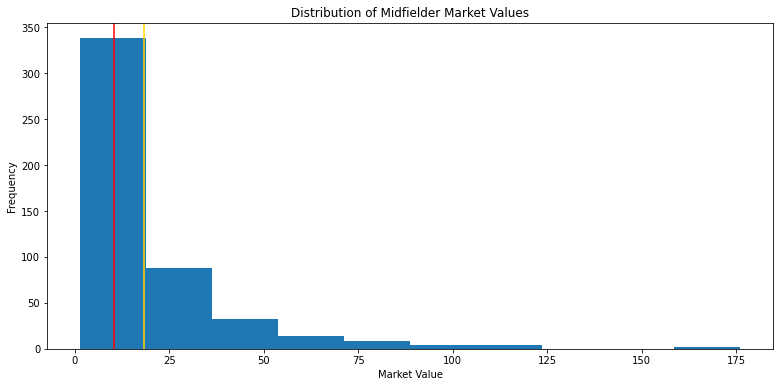

In [503]:
#plotting histogram of attacker market values
plt.figure(figsize=(13, 6))
plt.hist(y_attacker)
plt.xlabel('Market Value')
plt.ylabel('Frequency')
plt.axvline(y_attacker.median(), c = 'r')
plt.axvline(y_attacker.mean(), c = 'gold')
plt.title('Distribution of Midfielder Market Values')
plt.show()

Same as before. A heavy right skew in `Market Values in Millions`.

### Shape of Feature Variables

The skewness for Age is: 0.3288810015346381


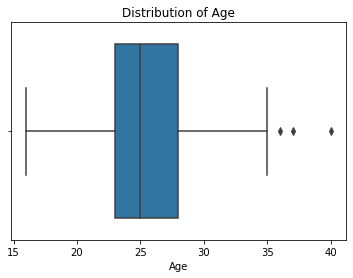


The skewness for 90s is: 0.2592388694902547


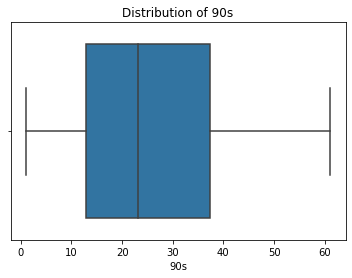


The skewness for Gls/90 is: 1.1799069900414036


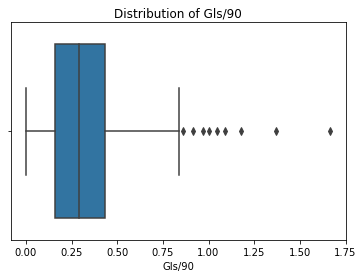


The skewness for Ast/90 is: 1.3186846968966632


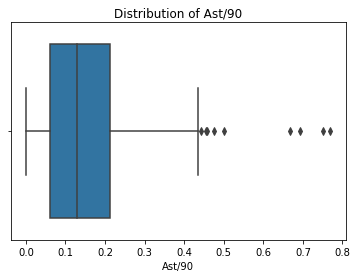


The skewness for PK/90 is: 2.4573763148095233


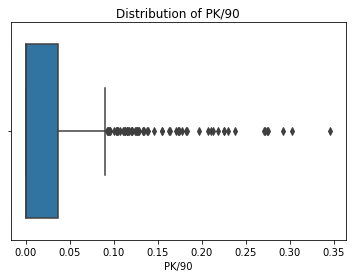


The skewness for Non PK Gls/90 is: 1.3967347911623753


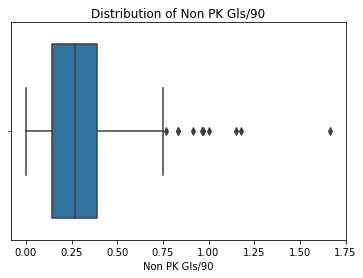


The skewness for Yellow Cards/90 is: 4.076445871914378


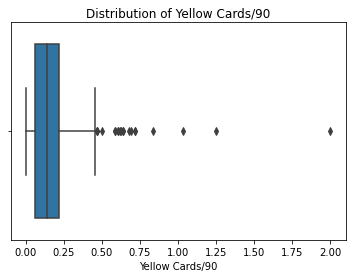


The skewness for Red Cards/90 is: 15.24772164850925


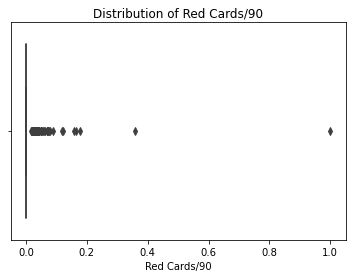


The skewness for xG/90 is: 1.1229007269761515


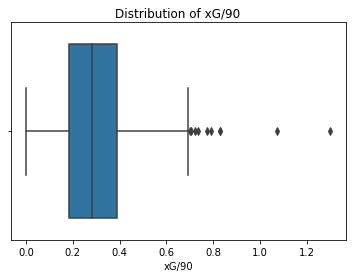


The skewness for non PK xG/90 is: 0.6546743862944577


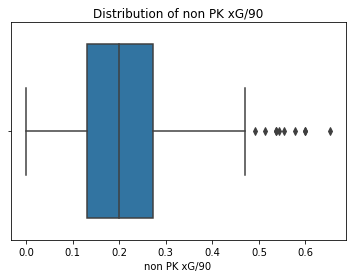


The skewness for xA/90 is: 8.191557271316473


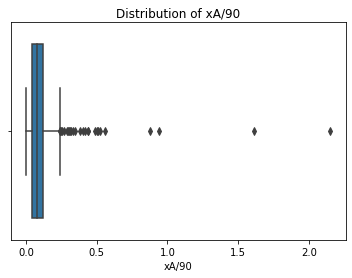


The skewness for Shots/90 is: 0.5137906956299879


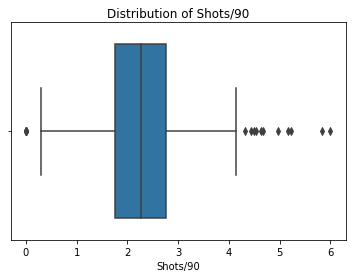


The skewness for Shots on Target/90 is: 0.890262546328924


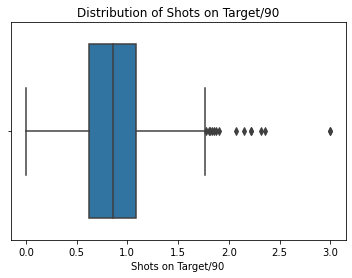


The skewness for Free Kicks/90 is: 3.5639765567236115


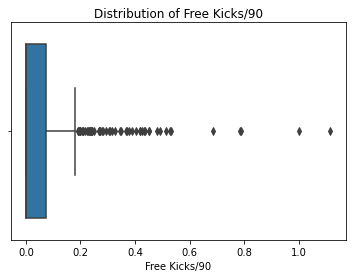


The skewness for Pass Cmp/90 is: 1.2640944546669137


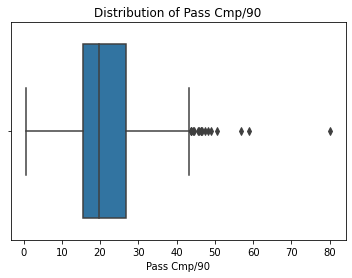


The skewness for Pass Cmp Pctg is: -0.01735991611701593


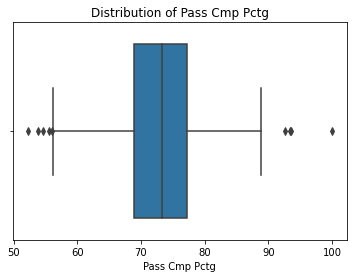


The skewness for Short Pass Cmp/90 is: 1.1195149380563032


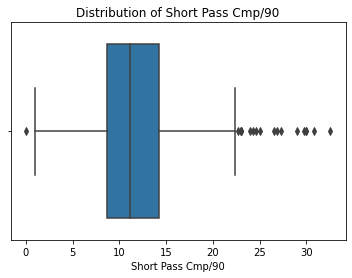


The skewness for Short Pass Cmp Pctg is: -2.7909656856215252


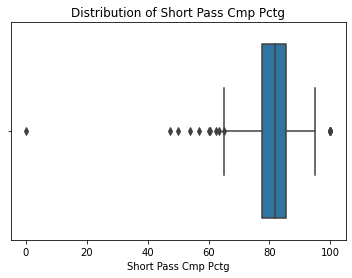


The skewness for Medium Pass Cmp/90 is: 1.531799706939749


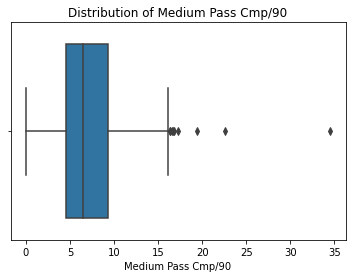


The skewness for Medium Pass Cmp Pctg is: -1.2899338830542315


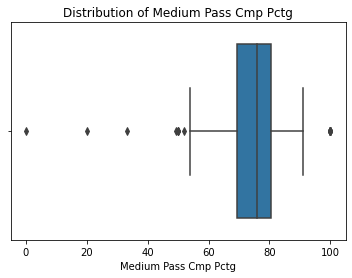


The skewness for Long Pass Cmp/90 is: 2.076341477967683


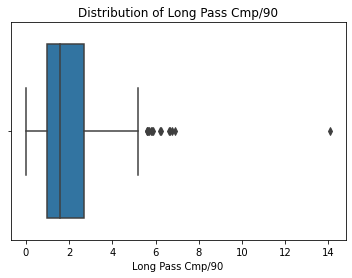


The skewness for Long Pass Cmp Pctg is: -0.5747766051701898


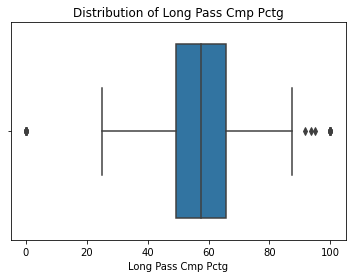


The skewness for Attacking Passes/90 is: 1.8926665792731918


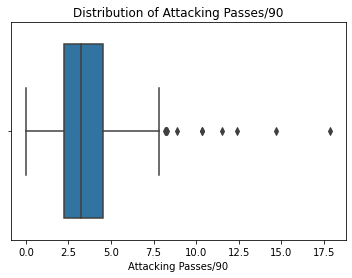


The skewness for Successful Box Crosses/90 is: 1.773005923599042


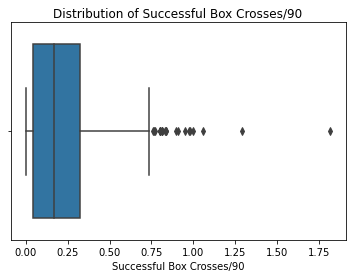


The skewness for Progressing Passes/90 is: 1.8407525298759233


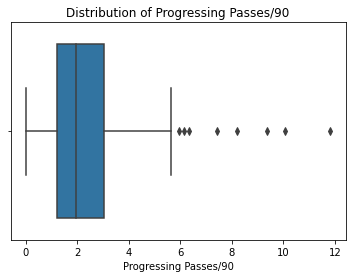


The skewness for Through Balls/90 is: 2.323833007955144


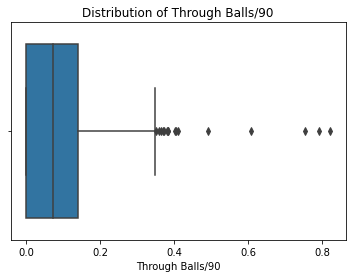


The skewness for Passes under pressure/90 is: 0.2579697740389016


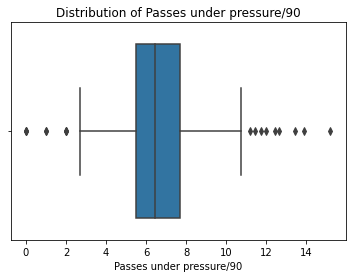


The skewness for Switches/90 is: 1.3153106427269157


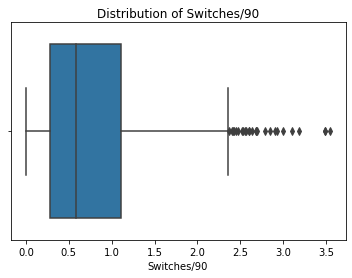


The skewness for Crosses/90 is: 0.8768617755411949


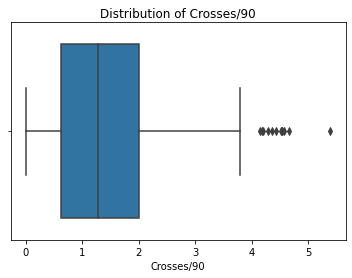


The skewness for Bad Passes/90 is: 0.40924231813278594


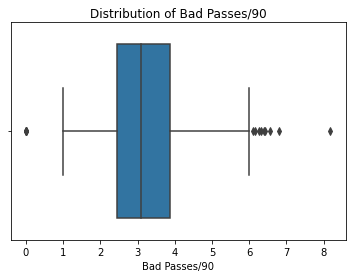


The skewness for SCA/90 is: 0.6644946187015149


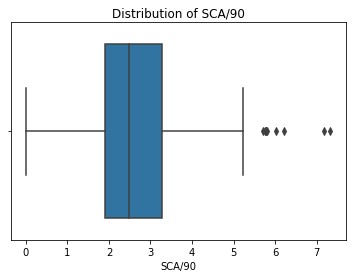


The skewness for GCA/90 is: 0.686225536294683


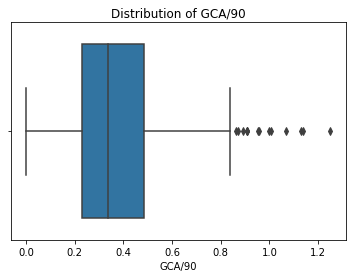


The skewness for Tkl Won/90 is: 1.5709627461230569


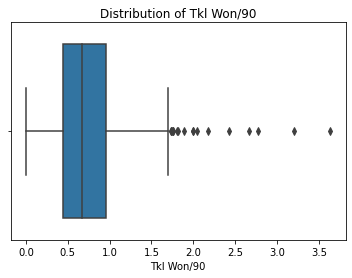


The skewness for Tkl Success Rate is: -1.1242738037704878


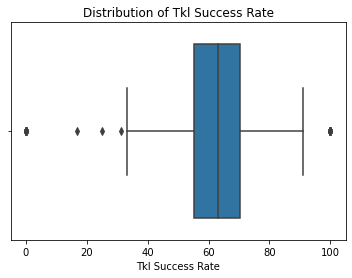


The skewness for Tkl vs Dribbles/90 is: 2.2120804855263003


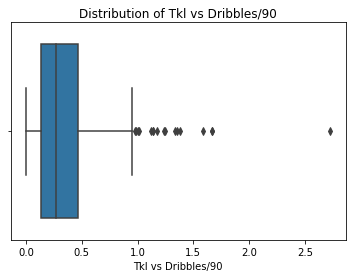


The skewness for Tkl vs. dribbles Success Rate is: 1.0868775374485307


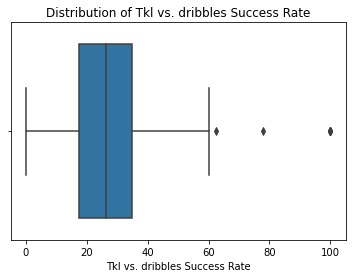


The skewness for Successful Presses/90 is: 0.7418509664971175


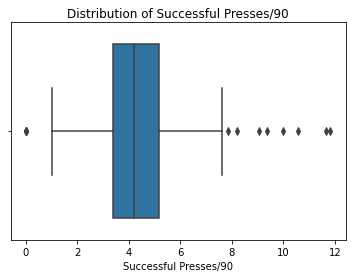


The skewness for Press Success Rate is: -1.4237850332670472


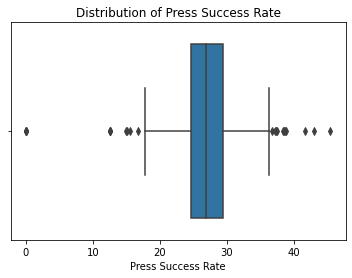


The skewness for Blocks/90 is: 1.3998488925502022


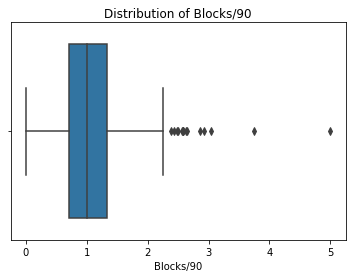


The skewness for Int/90 is: 1.389122853193953


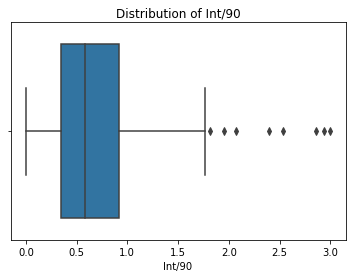


The skewness for Clearances/90 is: 1.2604800004819645


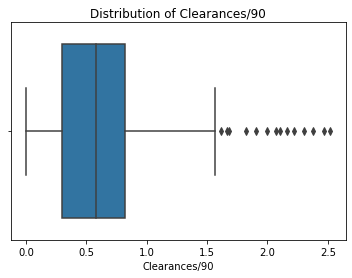


The skewness for Errors/90 is: 3.1724438827050827


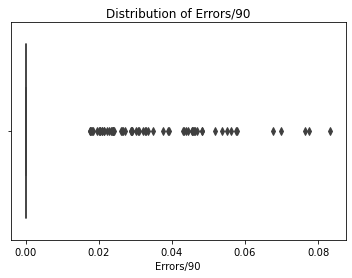


The skewness for Touches/90 is: 0.5070377156659335


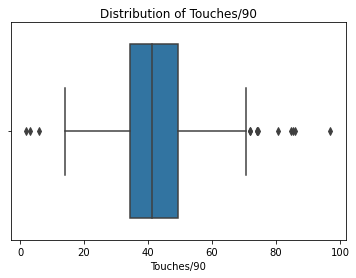


The skewness for Mid 3rd Touches/90 is: 0.47674753698470457


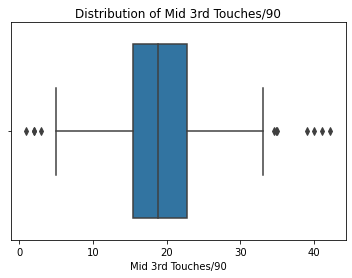


The skewness for Att 3rd Touchs/90 is: 1.0458349523467654


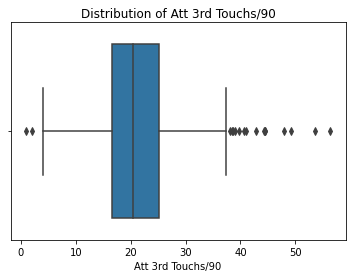


The skewness for Att Pen Touches/90 is: 0.6517205530545133


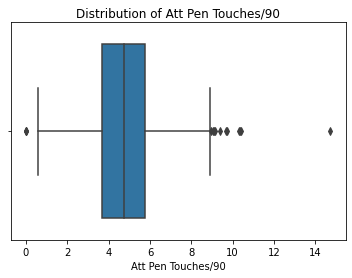


The skewness for Successful Dribbles/90 is: 1.574135036604967


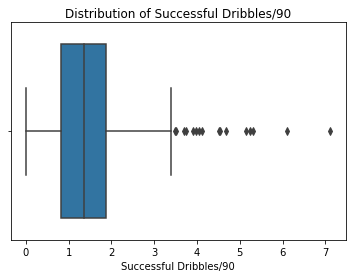


The skewness for Dribble Success Rate is: -1.3483319252280128


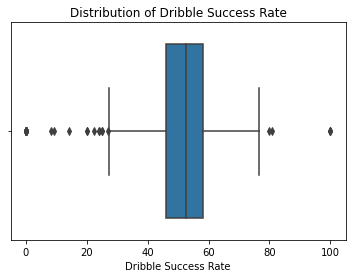


The skewness for Carries/90 is: 0.616743154727148


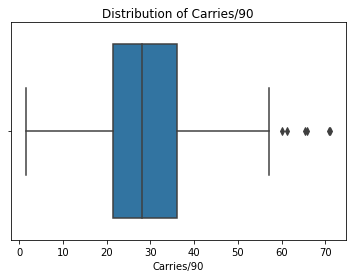


The skewness for Progressive Carries/90 is: 0.85705909814244


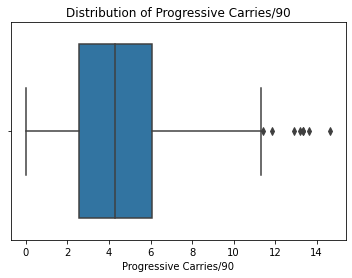


The skewness for Attacking Carries/90 is: 0.7925597386204335


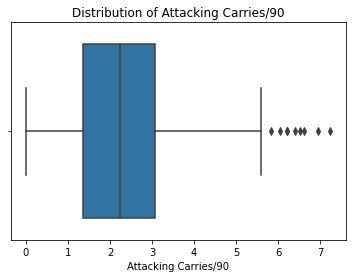


The skewness for Bad Dribbles /90 is: 1.0318925869081321


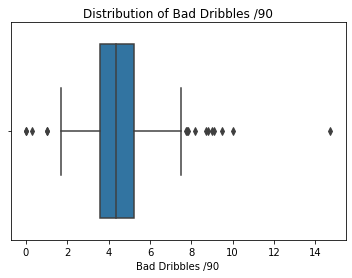


The skewness for Rec/90 is: 0.8925366851586357


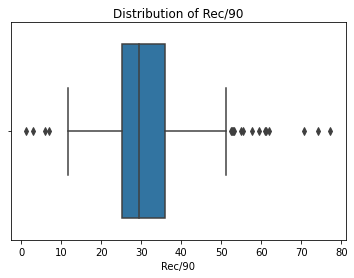


The skewness for Rec Success Rate is: -0.1612200084724807


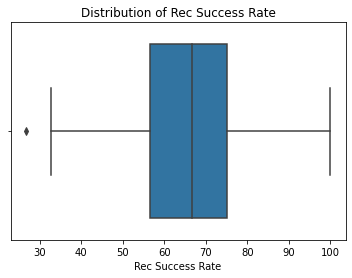


The skewness for Fouls Committed/90 is: 0.6513576556689106


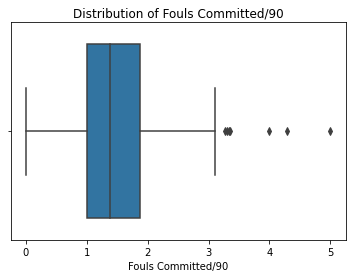


The skewness for Fouls drawn/90 is: 1.1286850302493965


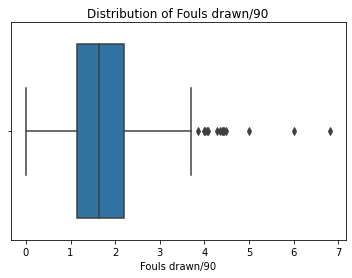


The skewness for PKs won/90 is: 4.0737793140365115


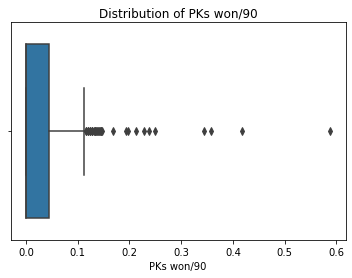


The skewness for PKs conceded/90 is: 11.116692651178369


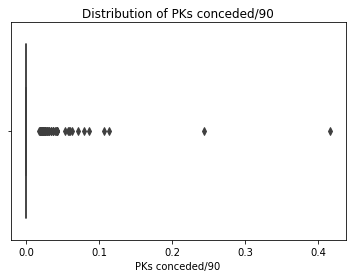


The skewness for Loose Balls Recov/90 is: 0.8734445458162418


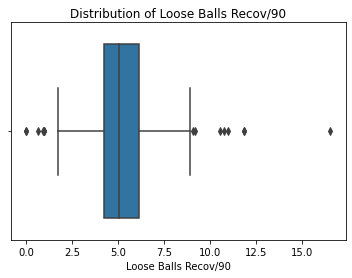


The skewness for Aerial Battles Won/90 is: 2.2707195809824965


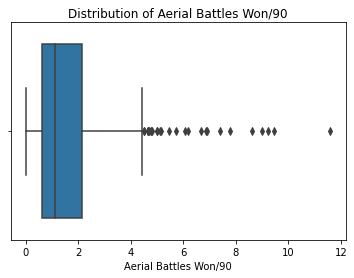


The skewness for Aerial Battle Success Rate is: 0.254453196290084


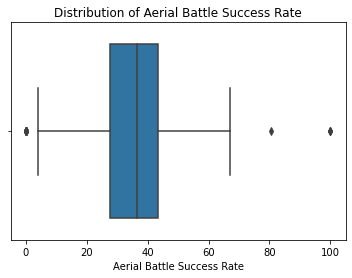


The skewness for Club Tier is: 0.2896300991078461


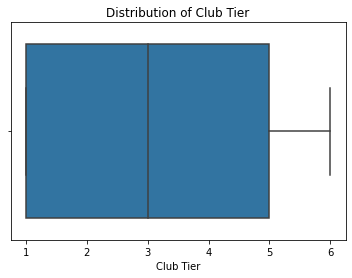


The skewness for European is: -0.6275636348361447


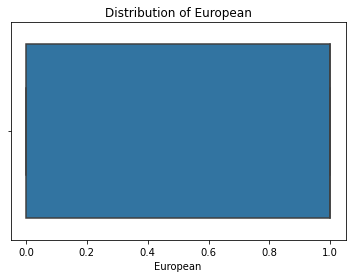


The skewness for subg_Winger is: 0.11014629407167267


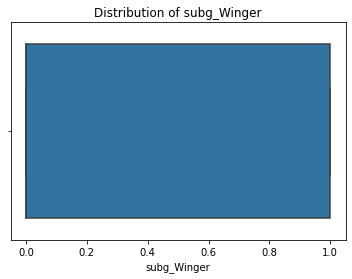

In [504]:
#plotting features
Boxplot_Features(X_attacker)

There is less skewness in the data set for attackers, though some is certainly still present. These players have the simplest roles, attack the goal, and are the most similar subgroups across all `Position Groups`

## Baseline Model 

### Train Test Split

In [505]:
X_attacker_so_train, X_attacker_so_test, y_attacker_so_train, y_attacker_so_test = train_test_split(X_attacker_so,
                                                                                                    y_attacker,
                                                                                                   test_size=0.4,
                                                                                                   random_state=21)
#checking shapes
print(f"There are {X_attacker_so_train.shape[0]} observations and {X_attacker_so_train.shape[1]} features in the feature training set")
print(f"There are {X_attacker_so_test.shape[0]} observations and {X_attacker_so_test.shape[1]} features in the feature test set")
print(f"There are {y_attacker_so_train.shape[0]} observations in the target training set")
print(f"There are {y_attacker_so_test.shape[0]} observations in the target training set")


There are 294 observations and 61 features in the feature training set
There are 197 observations and 61 features in the feature test set
There are 294 observations in the target training set
There are 197 observations in the target training set


### Attacker Baseline Linear Regression

In [506]:
#instantiating
attacker_baseline = LinearRegression()

#fitting
attacker_baseline.fit(X_attacker_so_train, y_attacker_so_train)

#scoring
baseline_attacker_train = round(attacker_baseline.score(X_attacker_so_train, y_attacker_so_train) * 100, 2)
baseline_attacker_test = round(attacker_baseline.score(X_attacker_so_test, y_attacker_so_test) * 100, 2)

print(f"Attacker Baseline Train R-Squared {baseline_attacker_train}%")
print(f"Attacker Baseline Test R-Squared {baseline_attacker_test}%")

Attacker Baseline Train R-Squared 58.86%
Attacker Baseline Test R-Squared 38.64%


This baseline r-squared of **38.64%** is closer to the midfielder baseline than the defender baseline. The baseline trainig score is again promising.

In [553]:
#appending for later
baseline_r2.append(baseline_attacker_test)

## Attacker Linear Regression 1

### Train Test Split

A 60-40 split will be used due to the size of the dataset. 

In [507]:
print(f"There are {y_attacker.shape[0]} attackers in this dataset")

There are 491 attackers in this dataset


In [508]:
X_attacker_train, X_attacker_test, y_attacker_train, y_attacker_test = train_test_split(X_attacker,
                                                                                                y_attacker,
                                                                                                test_size=0.4,
                                                                                                random_state=21)

print(f'There are {X_attacker_train.shape[0]} rows and {X_attacker_train.shape[1]} columns in X_attacker_train')
print(f'There are {X_attacker_test.shape[0]} rows and {X_attacker_test.shape[1]} columns in X_attacker_test')
print(f'There are {y_attacker_train.shape[0]} values y_attacker_train')
print(f'There are {y_attacker_test.shape[0]} values in y_attackerr_test')

There are 294 rows and 64 columns in X_attacker_train
There are 197 rows and 64 columns in X_attacker_test
There are 294 values y_attacker_train
There are 197 values in y_attackerr_test


The values match up so I can proceed.  

### Creating Model

In [511]:
#instantiating
attacker_linreg1 = LinearRegression()

#fitting
attacker_linreg1.fit(X_attacker_train, y_attacker_train)

#scoring
attacker_train_score = round(attacker_linreg1.score(X_attacker_train, y_attacker_train)* 100, 2)
attacker_test_score = round(attacker_linreg1.score(X_attacker_test, y_attacker_test)* 100, 2)

print(f"Training R-Squared: {attacker_train_score}%")
print(f"Test R-Squared: {attacker_test_score}%")
print(f"Baseline R-Squared: {baseline_attacker_test}%")


Training R-Squared: 67.59%
Test R-Squared: 47.87%
Baseline R-Squared: 38.64%


The r-squared has jumped over to **10%** to **48.87%**. There is over fitting but this will be fixed later on. 

### Baseline Diagnostic

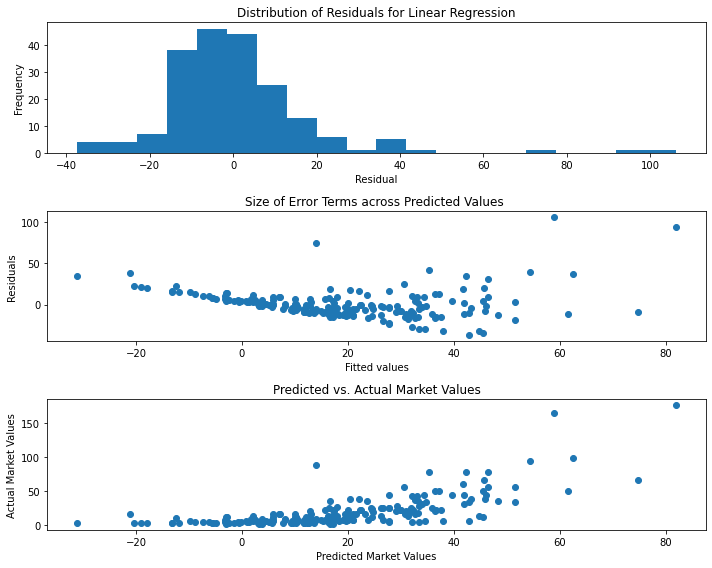

In [513]:
LinRegDiagnostic(attacker_linreg1, X_attacker_test, y_attacker_test)

These models give the same information as the two previous models. The model is under-predicting values, especially as the values increase.

### Visualizing With PCA

Again, I want to see what the data looks like in a 2D space. I am going to use Principal Component Analysis to look at the first level of PCA against the target variable.

In [514]:
#instantiating
pca_attacker = PCA(n_components=1, random_state=21)

#scaling feature
X_attacker_pca = pca_mid.fit_transform(X_attacker)

#checkstep
print(X_attacker_pca.shape)
y_attacker.shape

(491, 1)


(491,)

The shape matches. Now I can plot. 

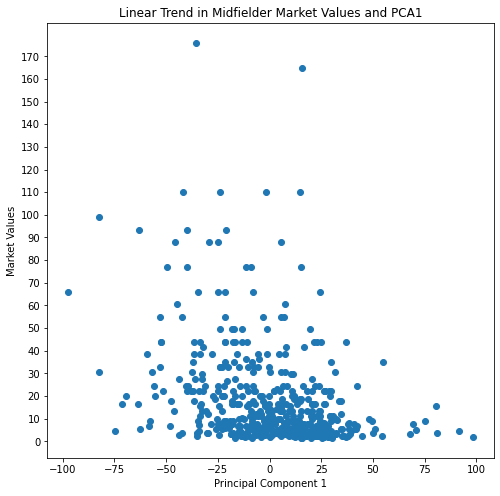

In [515]:
plt.figure(figsize=(8, 8))
plt.scatter(X_attacker_pca, y_attacker)
plt.ylabel('Market Values')
plt.xlabel('Principal Component 1')
plt.title('Linear Trend in Midfielder Market Values and PCA1')
plt.yticks(range(0, 180, 10))
plt.show()

Here we can see that the **30 million dollar** line is where the linearity starts to dissolve. This becomes even more stark around the **40 million dollar** mark. 

Again, a log transformation is necessary. 

## Tranforming the Target Variable `Market Values in Millions`

Before transforming the target variable, I will briefly repeat the reasoning behind this transformation.
1. It will reduce the skew of the target variables
2. It will prevent predicted values from being negative, which does not make sense in this problem state. 

I will transforming the entire target set, the train set and the test set. 

In [516]:
#whole set
log_y_attacker = np.log(y_attacker + 1)

#training set
log_y_attacker_train = np.log(y_attacker_train + 1)

#test set
log_y_attacker_test = np.log(y_attacker_test + 1)

### Comparing Transformed and Original Distributions of the Target

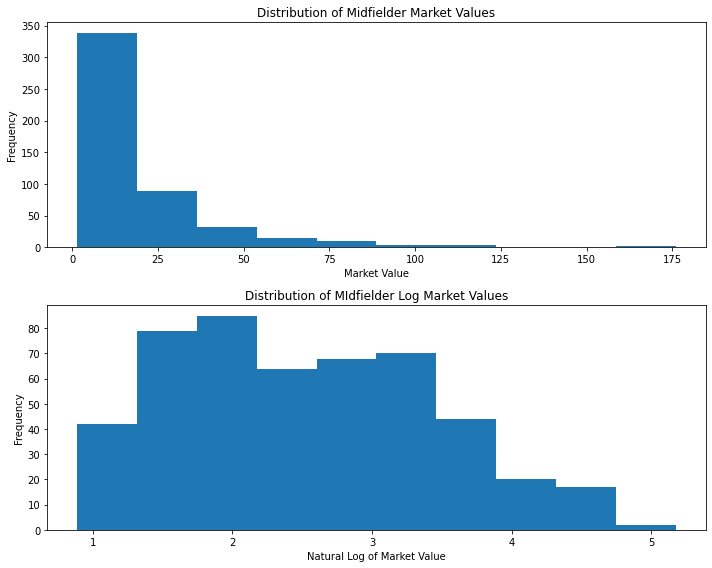

In [517]:
plt.subplots(2,1, figsize = (10,8))

#in linear space
plt.subplot(2,1,1)
plt.hist(y_attacker)
plt.xlabel('Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of Midfielder Market Values')

#in log space
plt.subplot(2,1,2)
plt.hist(log_y_attacker)
plt.xlabel('Natural Log of Market Value')
plt.ylabel('Frequency')
plt.title('Distribution of MIdfielder Log Market Values')

plt.tight_layout()
plt.show()

The tranformation appears to have worked. There is still some skew, and you can still see where the outliers are to the right, but the data is much more condensed.

### Visualizing Transformed Target Variable with PCA


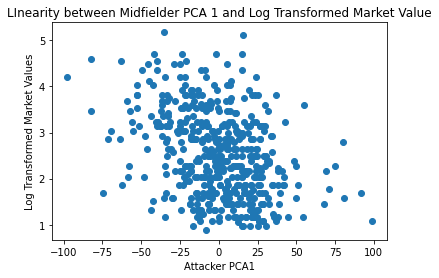

In [518]:
#plotting scatter plot
plt.figure()
plt.scatter(X_attacker_pca, log_y_attacker)
plt.ylabel('Log Transformed Market Values')
plt.xlabel('Attacker PCA1')
plt.title('LInearity between Midfielder PCA 1 and Log Transformed Market Value')
plt.show()

This scatter plot is a little bit more spread out than the previous iterations of this plot, as there are stray points on the left and right sides of the plot. However, it is markedly more linear than the plot of the untransformed market values of attackers.

## Linear Regression with Transformed Target Variable

In [519]:
#instnantiating
log_attacker_linreg = LinearRegression()

#fitting the model
log_attacker_linreg.fit(X_attacker_train, log_y_attacker_train)

#scoring
log_attacker_train_score = round(log_attacker_linreg.score(X_attacker_train, log_y_attacker_train)* 100, 2)
log_attacker_test_score = round(log_attacker_linreg.score(X_attacker_test, log_y_attacker_test)* 100, 2)

print(f"Training R-Squared: {log_attacker_train_score}%")
print(f"Test R-Squared: {log_attacker_test_score}%")
print(f"Previous Test R-Squared: {attacker_test_score}")
print(f"Baseline R-Squared: {baseline_attacker_test}")



Training Score: 77.3%
Test Score: 61.77%
Previous Test R-Squared: 47.87
Baseline R-Squared: 38.64


The r-squared of the model increased by almost 14 points to **61.77%**. The training accuracy jumped all the way to **77.3%**. The transformation clearly worked. 

### Diagnostics

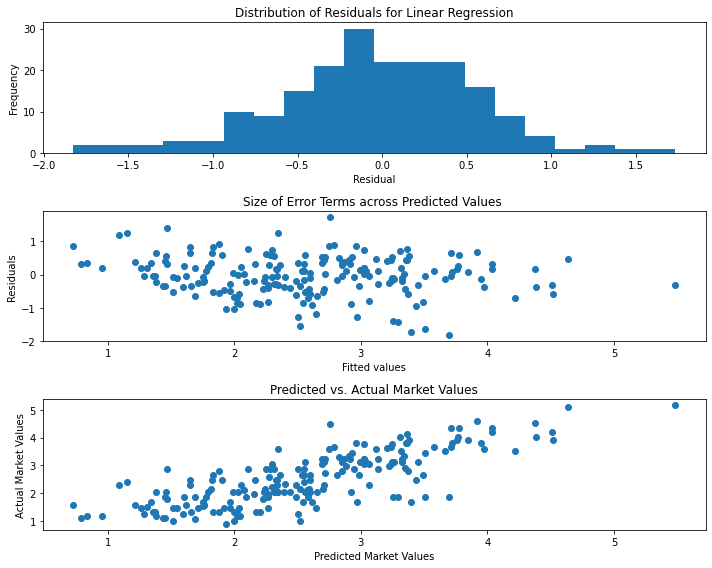

In [520]:
LinRegDiagnostic(log_attacker_linreg, X_attacker_test, log_y_attacker_test)

These diagnostics look good. The residual distribution appears to be relatively normal, with a a few notable outliers on each side.

The error terms, are more spread out than before, but there does appear to be some trend in the size of the residual size. They get more spread out as the predicted values increase.

## Lasso Regression

In [521]:
#creating pipeline
attacker_estimators = [('model', Lasso(random_state=21, max_iter=1000000))]
attacker_pipeline = Pipeline(attacker_estimators)

#creating parameter list
attacker_params = {'model__alpha': [10**-3, 10**-2, 10**-1, 1, 10**1, 10**2, 10**3]}
attacker_grid_search = GridSearchCV(attacker_estimators, param_grid=attacker_params, cv=2)

attacker_fitted_search = grid_search.fit(X_attacker_train, log_y_attacker_train)

In [522]:
#best estimator
best_lasso_attacker = attacker_fitted_search.best_estimator_
best_lasso_attacker

Pipeline(steps=[('model', Lasso(alpha=0.1, max_iter=1000000, random_state=21))])

In [523]:
#training score
attacker_grid_training_score = attacker_fitted_search.score(X_attacker_train,
                                                           log_y_attacker_train)

print(f"Training Score: {round(attacker_grid_training_score * 100, 2)}")

Training Score: 69.56


In [525]:
#test score
attacker_grid_test_score = round(attacker_fitted_search.score(X_attacker_test, log_y_attacker_test) * 100, 2)

print(f"Test R-Squared: {attacker_grid_test_score}")
print(f"Previous Test R-Squared: {log_attacker_test_score}")
print(f"Baseline Test R-Squared: {baseline_attacker_test}")

Training R-Squared: 65.2
Previous R-Squared: 61.77
Baseline R-Squared: 38.64


The model does not appear to be over fitting and the test score has increased by more than **3%** to **64.75%**. Let's examine the diagnostics.

### Diagnostics

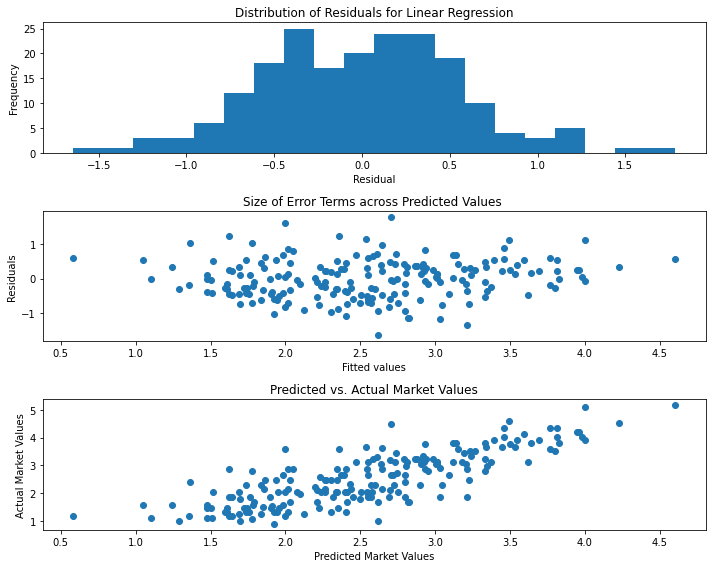

In [526]:
LinRegDiagnostic(attacker_fitted_search, X_attacker_test, log_y_attacker_test)

All of the diagnostics look good. The next step is to fit and see which features remain.

In [527]:
#instantiating
attacker_lasso_1 = Lasso(alpha = 0.1, max_iter=1000000, random_state=21)

#fitting
attacker_lasso_1.fit(X_attacker_train, log_y_attacker_train)

#sorted coefficients
attacker_lasso_1_sorted = SortedCoef(attacker_lasso_1, X_attacker_train)

There are 16 with non-zero coefficients
48 features were zeroes out from L1 penalty


In [528]:
attacker_lasso_1_sorted

,Feature,Coefficient
61,Club Tier,0.223872
1,90s,0.029113
44,Att 3rd Touchs/90,0.015357
45,Att Pen Touches/90,0.012623
37,Press Success Rate,0.011038
52,Rec/90,0.010136
19,Medium Pass Cmp Pctg,0.006604
15,Pass Cmp Pctg,0.003843
47,Dribble Success Rate,-0.000529
60,Aerial Battle Success Rate,-0.001711


There are a lot of confounding coefficients here. I am going to run some collinearity checks on receptions and tackle stats below to see which variables to remove. 

I am not going to check the touches stats. I have a pretty good idea as to why `Middle 3rd Touches/90` has a negative coefficient.

#### Passing Collinearity Check

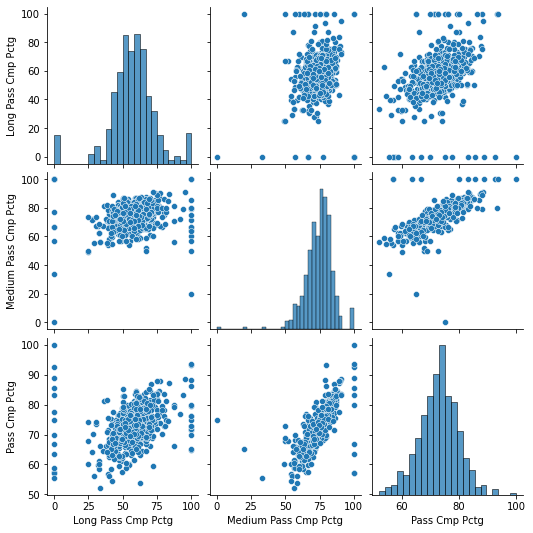

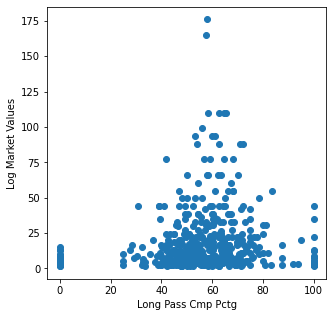

Corrlation coefficient between Long Pass Cmp Pctg and target: (0.09389592945398494, 0.03753574263611031)



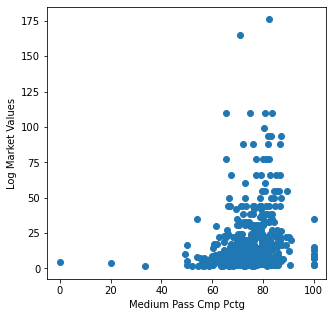

Corrlation coefficient between Medium Pass Cmp Pctg and target: (0.21798923231157114, 1.0783350912476649e-06)



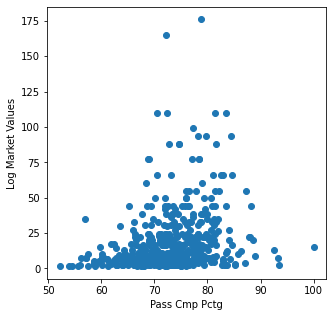

Corrlation coefficient between Pass Cmp Pctg and target: (0.26413250983335546, 2.785816119937945e-09)



In [530]:
#instantiating empty list
drop_columns_attakcers = []

#pulling columns from above
colin_check1 = ['Long Pass Cmp Pctg', 'Medium Pass Cmp Pctg', 'Pass Cmp Pctg']

CollinearityCheck2(colin_check1, X_attacker, y_attacker)


Going to `Rec Success Rate` to the drop column list, as it has a weaker coefficient.

In [531]:
#adding Tkl Success Rate to drop columns list
drop_columns_attakcers = colin_check1[:-1]

#### Receiving Colinearity Check

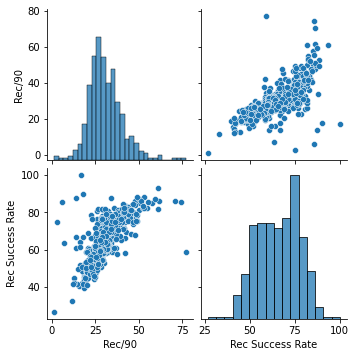

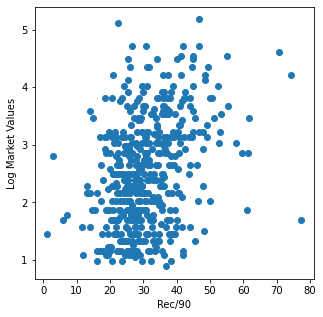

Corrlation coefficient between Rec/90 and target: (0.34299771946692903, 5.307375866299575e-15)



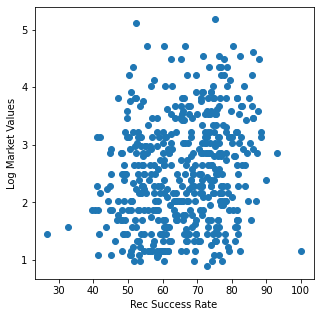

Corrlation coefficient between Rec Success Rate and target: (0.21611171810174543, 1.339862940677993e-06)



In [532]:
CollinearityCheck2(recieving, X_attacker, log_y_attacker)

Going to drop `Rec Success Rate` from the data set.

In [533]:
#appending Rec Success Rate to drop columns list
drop_columns_attakcers.append('Rec Success Rate')

In [536]:
#dropping from train
X_attacker_train_2 = X_attacker_train.drop(drop_columns_attakcers, axis = 1)

#dropping from test
X_attacker_test_2 = X_attacker_test.drop(drop_columns_attakcers, axis = 1)

Now the second Lasso regression can be fitted. 


## Attacker Lasso 2

In [537]:
#instantiating
attacker_lasso2 = Lasso(alpha = 0.1, max_iter=1000000, random_state=21)

#fitting
attacker_lasso2.fit(X_attacker_train_2, log_y_attacker_train)

#scoring
attack2_train_score = round(attacker_lasso2.score(X_attacker_train_2, log_y_attacker_train)* 100, 2)
attack2_test_score = round(attacker_lasso2.score(X_attacker_test_2, log_y_attacker_test)* 100, 2)

print(f"Training R-Squared: {attack2_train_score}%")
print(f"Test R-Squared: {attack2_test_score}%")
print(f"Previous R-Squared:{attacker_grid_test_score}%")
print(f"Baseline R-Squared:  {baseline_attacker_test}%")


Training R-Squared: 68.9%
Test R-Squared: 65.54%
Previous R-Squared:65.2%
Baseline R-Squared:  38.64%


The score increased slightly and the model is not overfit. 

In [538]:
#sorted coefficients
SortedCoef(attacker_lasso2, X_attacker_train_2)

There are 14 with non-zero coefficients
47 features were zeroes out from L1 penalty


,Feature,Coefficient
58,Club Tier,0.225978
1,90s,0.029115
42,Att 3rd Touchs/90,0.015059
43,Att Pen Touches/90,0.013037
35,Press Success Rate,0.010035
50,Rec/90,0.008766
15,Pass Cmp Pctg,0.006490
31,Tkl Success Rate,0.000436
45,Dribble Success Rate,-0.000267
57,Aerial Battle Success Rate,-0.002049


The attacker model has been optimized with a test r-squared of 65.2%.

In [539]:
#creating practical effect
optimized_attacker = SortedCoef(attacker_lasso2, X_attacker_train_2)

optimized_attacker['Practical Effect'] = (np.expm1(optimized_attacker['Coefficient']) * 100)
optimized_attacker['Practical Effect'] = round(optimized_attacker['Practical Effect'], 2)
optimized_attacker

There are 14 with non-zero coefficients
47 features were zeroes out from L1 penalty


,Feature,Coefficient,Practical Effect
58,Club Tier,0.225978,25.35
1,90s,0.029115,2.95
42,Att 3rd Touchs/90,0.015059,1.52
43,Att Pen Touches/90,0.013037,1.31
35,Press Success Rate,0.010035,1.01
50,Rec/90,0.008766,0.88
15,Pass Cmp Pctg,0.006490,0.65
31,Tkl Success Rate,0.000436,0.04
45,Dribble Success Rate,-0.000267,-0.03
57,Aerial Battle Success Rate,-0.002049,-0.20


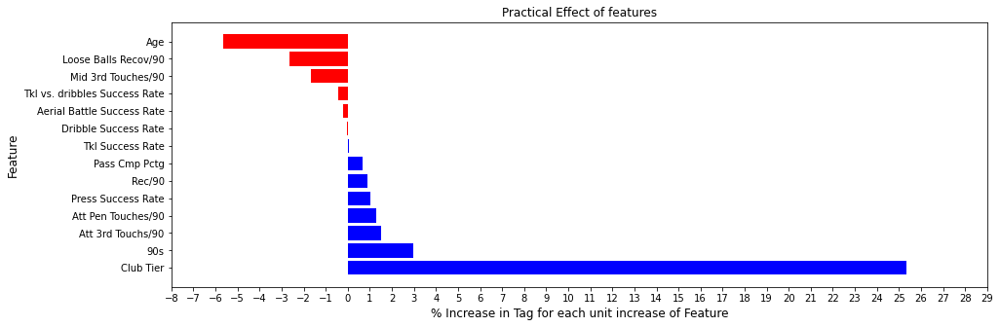

In [544]:
#plotting practical effect
plt.figure(figsize = (15, 5))
plt.barh(optimized_attacker['Feature'], optimized_attacker['Practical Effect'],
        color = ['b', 'b', 'b', 'b','b','b','b','b','r', 'r','r', 'r','r', 'r'])
plt.xlabel('% Increase in Tag for each unit increase of Feature', fontsize = 12)
plt.ylabel('Feature', fontsize = 12)
plt.title('Practical Effect of features', fontsize = 12)
plt.xticks(list(range(-8, 30, 1)))
plt.show()

Notes on the optimized Coefficients

* Club Tier and 90s are the best indicators. Same reasons as above. An additional reason will be explained below
* Att 3rd Touches/90 & Att Pen Touches/90 - This is related to Club Tier, better teams have the ball more often in the attacking third. However, it does make sense that attackers that are able to get themselves more involved would be valued more highly. 
* Press Success Rate Players who can get the ball back in attacking areas will be valued more
* Pass Cmp Pctg - Offenses need to keep the ball, you need attackers who are going to be able to keep possession in the opposing half, even more so if they are able to make difficult and creative passes to spring players into space
* Rec/90 - Need players who can handle passes with defenders draped around them


Too Small Not Worth Commenting on
* Tkl Success Rate
* Dribble Success Rate


Negative Coefficients
* Aerial Battle Success Rate - Central attackers who win in the air are more valuable than those who don't. It is often these players who can turn half chances into goals. Central attackers are also worth less on average. 
* Loose Balls Recov/90 - Opposite of Rec/90, if you are chasing down loose balls, you might have missed an opportunity to receive a pass 
* Age - Again, those players with low 90s, the ones who often cause outliers, are often low in age and value. This is the model working to find the value of these players.

## True R-Squared


In [549]:
#combining train and test
X_attacker_2 = pd.concat([X_attacker_train_2,
                           X_attacker_test_2])

y_attacker_2 = pd.concat([y_attacker_train, y_attacker_test])

#predictions in log space
y_log_attacker_prediction = attacker_lasso2.predict(X_attacker_2)

#predictions in linear space
attacker_predictions = np.expm1(y_log_attacker_prediction)

#r-squared
attacker_true_r2 = round(r2_score(y_attacker_2, attacker_predictions), 2)
attacker_true_r2

0.62

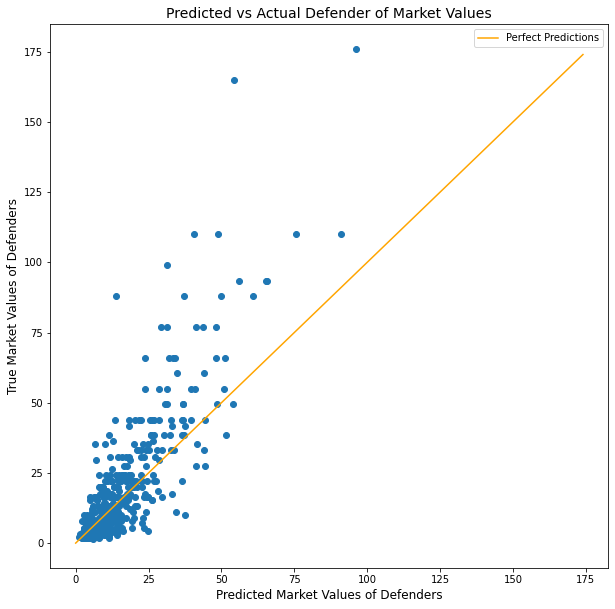

Correlation Coefficient: 0.84


In [550]:
#square graph for best comparisons
plt.figure(figsize=(10,10))
#scatter of attacker_predictions vs actual
plt.scatter(attacker_predictions, y_attacker_2)

#plotting perfect predictions line
plt.plot(range(0,175), range(0,175), c = 'orange', label = 'Perfect Predictions')

#details
plt.xlabel('Predicted Market Values of Defenders', fontsize = 12)
plt.ylabel('True Market Values of Defenders', fontsize = 12)
plt.title('Predicted vs Actual Defender of Market Values', fontsize = 14)
plt.legend()
plt.show()

#printing correlation
corr, p = pearsonr(attacker_predictions, y_attacker_2)
print(f"Correlation Coefficient: {round(corr, 2)}")

In [559]:
true_r2.append(attacker_true_r2* 100)

Practically identical to the plots above. The lasso models have done a good job improving on baseline scores, all of which achieving respectable r-squared scores, but have been unable to solve the problem that elite players present.

## Non Linear Models

### Attacker KNN Regressor

In [564]:
#creating estimotor grid
k__estimators = [("scaler", MinMaxScaler()),
               ("model", KNeighborsRegressor())]

#instantiating pipeline
k_pipe = Pipeline(k_estimators)

#setting parameter grid
k_params = {"model": [KNeighborsRegressor()],
            "model__n_neighbors": list(range(5, 100, 5)),
            "model__weights": ['uniform', 'distance'],
            "scaler": [MinMaxScaler(), None]}

#fitting and scoring gird search
k_grid_search = GridSearchCV(k_pipe, k_params, cv = 2)
fitted_k_grid = k_grid_search.fit(X_attacker_train, y_attacker_train)

In [565]:
#training score
fitted_k_grid.score(X_attacker_train, y_attacker_train)

0.6805320179184181

In [566]:
#test score
fitted_k_grid.score(X_attacker_test, y_attacker_test)

0.4336960475211984

Not worth exploring further. 

### Attacker Decision Tree Regressor

In [567]:
#screating non linear estimators
tree_estimators = [("model", DecisionTreeRegressor(random_state=21))]

#instantiating pipeling
tree_pipe = Pipeline(tree_estimators)

#creating decision tree parameter grid
tree_params = {"model__criterion": ['squared_error', 'friedman_mse', 'absolute_error', 'poisson'],
               "model__max_depth": list(range(5, 50, 5)),
               "model__min_samples_leaf": list(range(1, 20)),
               "model__splitter": ['best', 'random']}


#creating and fitting tree grid                
tree_grid_search = GridSearchCV(tree_pipe, tree_params, cv = 2)
fitted_tree_grid = tree_grid_search.fit(X_attacker_train, y_attacker_train)             
fitted_tree_grid.best_estimator_

Pipeline(steps=[('model',
                 DecisionTreeRegressor(max_depth=5, min_samples_leaf=9,
                                       random_state=21, splitter='random'))])

In [568]:
#training score
fitted_tree_grid.score(X_attacker_train, y_attacker_train)

0.6135168467214043

In [569]:
#training score
fitted_tree_grid.score(X_attacker_test, y_attacker_test)

0.30039867485532823

Not worth exploring further

### Attacker SVR

In [570]:
#screating non linear estimators
svr_estimators = [('scaler', MinMaxScaler())
                  ,("model", SVR(max_iter=1000000))]

#instantiating pipeling
svr_pipe = Pipeline(svr_estimators)

#creating decision tree parameter grid
svr_params = {"model__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
               "model__gamma": ['scale', 'auto'],
               "model__C": [0.01, 0.1, 1, 10, 100],
               "model__epsilon": np.arange(1, 10, 2)/10}


#creating and fitting tree grid                
svr_grid_search = GridSearchCV(svr_pipe, svr_params, cv = 2)
fitted_svr_grid = svr_grid_search.fit(X_attacker_train, y_attacker_train)             
fitted_svr_grid.best_estimator_

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('model', SVR(C=100, epsilon=0.5, max_iter=1000000))])

In [571]:
#training score
fitted_svr_grid.score(X_attacker_train, y_attacker_train)

0.8982282624678666

In [572]:
#training score
fitted_svr_grid.score(X_attacker_test, y_attacker_test)

0.5729421960479567

Support vector regressors will be explored in the future. They have shown that they have some predictive power in this data set. 

# Model Improvement
Below is a graph of the baseline scores and the final true r-squared scores. 

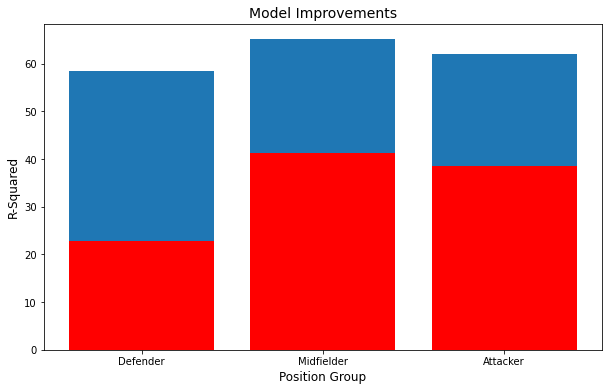

In [563]:
#creating position group list
position_groups = ['Defender', 'Midfielder', 'Attacker']

plt.figure(figsize=(10, 6))
plt.bar(position_groups, true_r2)
plt.bar(position_groups, baseline_r2, color = 'r')
plt.title('Model Improvements', fontsize = 14)
plt.xlabel('Position Group', fontsize = 12)
plt.ylabel('R-Squared', fontsize = 12)
plt.show()

Each model improved it's r-squared score by **20%**. Besides the struggle modeling elite players. There is one other problem.

# The Club Tier Problem
I have stated before that European Soccer is a plutocracy. Only a few clubs have the ability to buy and keep the best players. Because these teams have the best players, they have the ball more often. Their players are able to accrue more statistics. `Club Tier` was by far the best predictor in every model. It was not even close. This is not a coincidence. The models run so far in this notebook were able to see that `Club Tier` correlated positively with these statistics. On one hand, this means the feature I engineered worked. `Club Tier` has a lot of predictive power. On the other hand, one of the main goals of this project is to determine which statistics are the most important, and `Club Tier` swallowed the effects of all of these statistics. To achieve the goal of determining which statistics are most valuable, I am now going to run statistical linear regressions on all of th subgroups, with `Club Tier` removed from the dataset. 

# Statistical Linear Regressions
I am going to use statistical linear regression techniques to find the most predictive statistics. The only EDA I will be do is comparing correlations between variables.  First, I am going to 

I will use a backwards selection process until all independent variables are statistically significant and the variance inflation factor is reasonable between each 

I will be skipping right to using the logged transformed dependent variable. Though results are not the most important part of this process, I do think it will give a more accurate picture of what's important because the regression will fit better. 

I will not be splitting the data up into train and test sets, as I will not be using machine learning models, but rather a more statistics based approach. 

I will start with the defender model. 

## Defender Linear Regression
The first step is to examine related variables and determine which should be kept in and which should be removed. 

In [618]:
#dropping clubtier
drop_cols = ['Club Tier']

#dropping insignificant corellations
for col in X_defender.columns:
    fval, pval = pearsonr(X_defender[col], log_y_defender)
    if pval > 0.05:
        drop_cols.append(col)
        
#checking drop cols
print(len(drop_cols))
drop_cols

18


['Club Tier',
 'Ast/90',
 'PK/90',
 'Red Cards/90',
 'xA/90',
 'Free Kicks/90',
 'SCA/90',
 'Int/90',
 'Clearances/90',
 'Errors/90',
 'Att 3rd Touchs/90',
 'Successful Dribbles/90',
 'Dribble Success Rate',
 'Attacking Carries/90',
 'Fouls drawn/90',
 'PKs won/90',
 'PKs conceded/90',
 'European']

All of these independent variables do not have a significant correlation to the dependent variable, so they can be dropped. First I'm going to make a new copy of the X_defender data frame to use in this model. 

In [619]:
#making copies
X_defender_stat = X_defender.copy()

#dropping columns
X_defender_stat.drop(columns=drop_cols,
                     inplace = True)

print(len(X_defender_stat.columns))
X_defender_stat.columns

46


Index(['Age', '90s', 'Gls/90', 'Non PK Gls/90', 'Yellow Cards/90', 'xG/90',
       'non PK xG/90', 'Shots/90', 'Shots on Target/90', 'Pass Cmp/90',
       'Pass Cmp Pctg', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg',
       'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90',
       'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Successful Box Crosses/90', 'Progressing Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Touches/90', 'Mid 3rd Touches/90',
       'Att Pen Touches/90', 'Carries/90', 'Progressive Carries/90',
       'Bad Dribbles /90', 'Rec/90', 'Rec Success Rate', 'Fouls Committed/90',
       'Loose Balls Recov/90', 'Aerial Battles Won/90',
       'Aerial Battle Success Rate', 'subg_Wingback'],
      dtype='ob

I have already examined a lot of the potential sources of collinearity in Section 3. I can use that list to eliminate more independent variables. First I will need to check to see if they are still in the columns list of `X_defender_stat.columns`.

In [620]:
#checking to see if potential sources of collinearity are still in the list
#appending to new list if not
drop_cols_2 = []

for cols in drop_columns:
    if cols not in X_defender_stat.columns:
        continue
    else:
        drop_cols_2.append(cols)

print(len(drop_cols_2))
drop_cols_2

13


['Successful Box Crosses/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Progressing Passes/90',
 'Gls/90',
 'xG/90',
 'non PK xG/90',
 'Progressive Carries/90']

In [621]:
#dropping columns
X_defender_stat.drop(columns=drop_cols_2,
                     inplace = True)

print(len(X_defender_stat.columns))
X_defender_stat.columns

33


Index(['Age', '90s', 'Non PK Gls/90', 'Yellow Cards/90', 'Shots/90',
       'Shots on Target/90', 'Pass Cmp/90', 'Attacking Passes/90',
       'Through Balls/90', 'Passes under pressure/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'GCA/90', 'Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Blocks/90', 'Touches/90', 'Mid 3rd Touches/90',
       'Att Pen Touches/90', 'Carries/90', 'Bad Dribbles /90', 'Rec/90',
       'Rec Success Rate', 'Fouls Committed/90', 'Loose Balls Recov/90',
       'Aerial Battles Won/90', 'Aerial Battle Success Rate', 'subg_Wingback'],
      dtype='object')

Now with 33 columns left, I will look at other potential sources of collinearity in the data set. 

### Collinearity Checks

I will start by looking at the shooting statistics.

##### Defender Shooting Collinearity Check

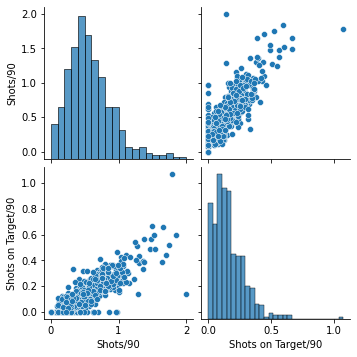

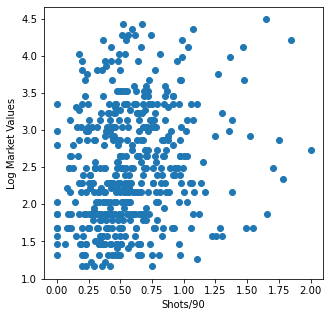

Corrlation coefficient between Shots/90 and target: (0.2115688258327415, 2.6564588107388903e-06)



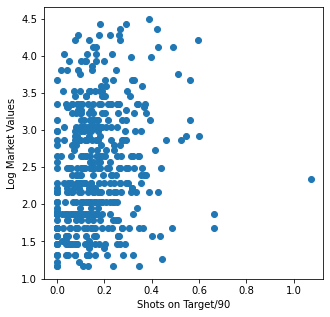

Corrlation coefficient between Shots on Target/90 and target: (0.2187110564733017, 1.1849327504761025e-06)



In [622]:
CollinearityCheck2(shooting, X_defender_stat, log_y_defender)

As there is a clear independent trend between these independent variables and `Shots/90` has a weaker correlation, it will be dropped. 

In [623]:
#adding Shots/90 to drop columns list
drop_cols3 = ['Shots/90']

##### Defender Tackles Collinearity checks
Now I will look at all tackling related statistics. 

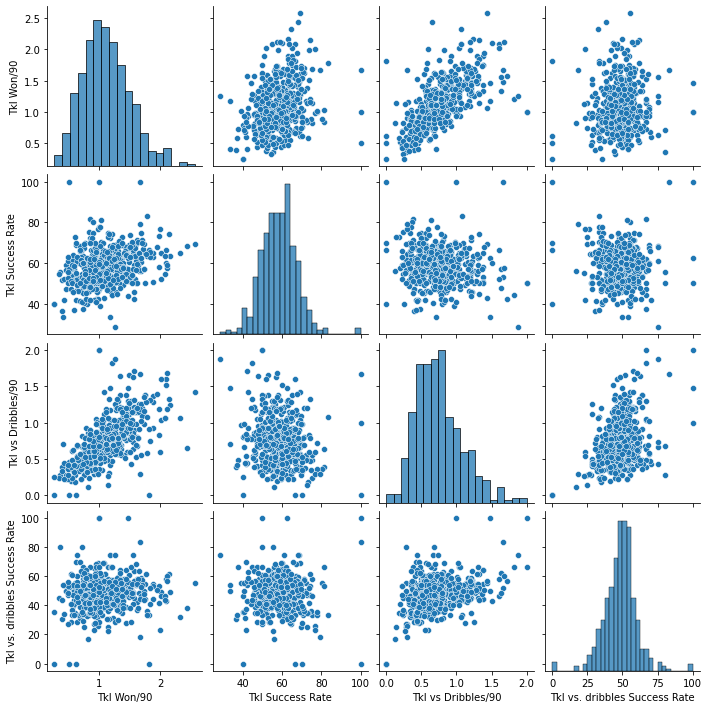

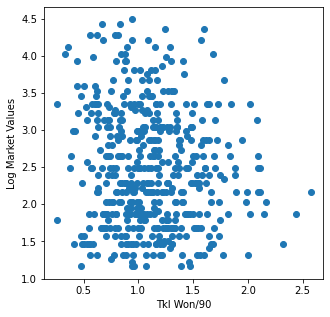

Corrlation coefficient between Tkl Won/90 and target: (-0.10988371047549765, 0.015583852755364865)



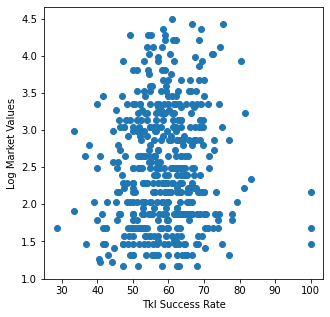

Corrlation coefficient between Tkl Success Rate and target: (0.09237607356382713, 0.0422180941199842)



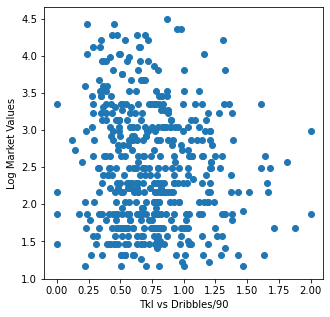

Corrlation coefficient between Tkl vs Dribbles/90 and target: (-0.11387008638242663, 0.012182177360519613)



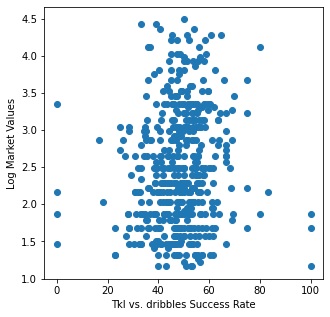

Corrlation coefficient between Tkl vs. dribbles Success Rate and target: (0.11014424452791982, 0.015338439645254344)



In [624]:
#tkls list
tkls = ['Tkl Won/90',
       'Tkl Success Rate', 'Tkl vs Dribbles/90',
       'Tkl vs. dribbles Success Rate']

#colin check
CollinearityCheck2(tkls, X_defender_stat, log_y_defender)

The only independent variable that will stay in the data set will be `Tkl vs Dribbles/90`. This has the strongest correlation to the dependent variable, and appears to have a linear relationship with all of the other independent variables. 

In [625]:
#making drop tackles list
drop_tkls = tkls[0:2]
drop_tkls.append('Tkl vs. dribbles Success Rate')

#checking
print(drop_tkls)

['Tkl Won/90', 'Tkl Success Rate', 'Tkl vs. dribbles Success Rate']


In [626]:
#appending
drop_cols3 = drop_cols3 + drop_tkls

#dropping
drop_cols3

['Shots/90', 'Tkl Won/90', 'Tkl Success Rate', 'Tkl vs. dribbles Success Rate']

##### Defender Other defensive stats Collinearity Check

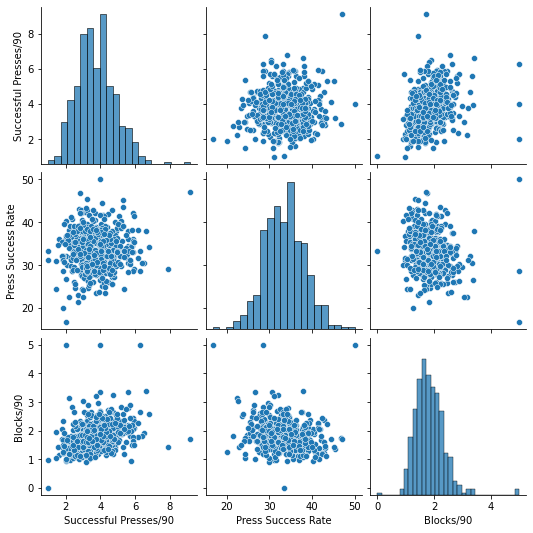

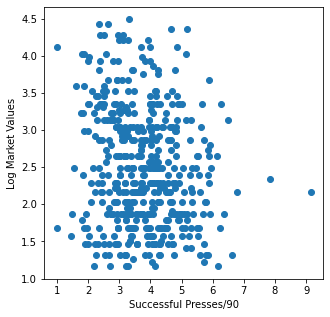

Corrlation coefficient between Successful Presses/90 and target: (-0.16432137019009646, 0.0002829500144008694)



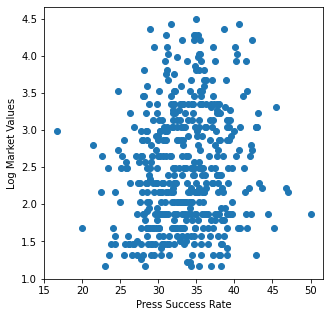

Corrlation coefficient between Press Success Rate and target: (0.14949113032554526, 0.0009707965704703818)



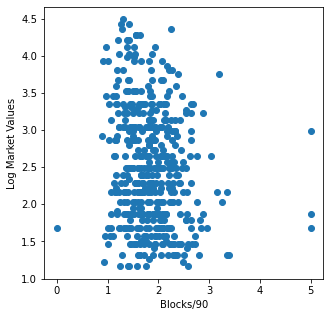

Corrlation coefficient between Blocks/90 and target: (-0.16292593193309668, 0.00031922339441096465)



In [627]:
#defensive stats list
other_def = ['Successful Presses/90',
       'Press Success Rate', 'Blocks/90']

#colin check
CollinearityCheck2(other_def, X_defender_stat, log_y_defender)

I am going to drop `Blocks/90`. `Press Success Rate` does not have a linear relationship with the other two, and `Successful Presses/90` has the strongest correlation coefficient.

In [628]:
#appending Blocks/90
drop_cols3.append('Blocks/90')

#check
drop_cols3

['Shots/90',
 'Tkl Won/90',
 'Tkl Success Rate',
 'Tkl vs. dribbles Success Rate',
 'Blocks/90']

##### Defender Aerial Collinearity check

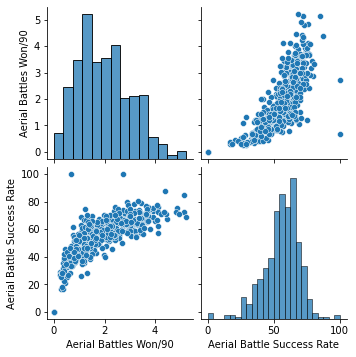

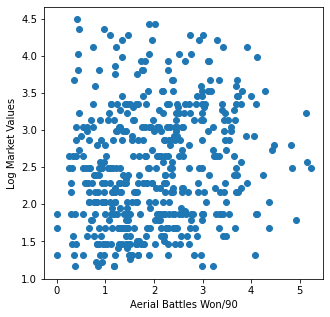

Corrlation coefficient between Aerial Battles Won/90 and target: (0.16824353045069199, 0.00020054831454382089)



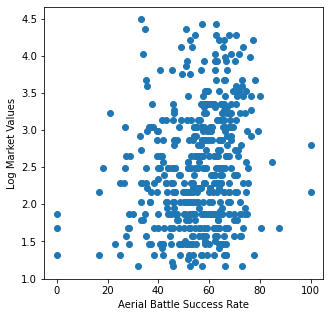

Corrlation coefficient between Aerial Battle Success Rate and target: (0.20166661907565558, 7.777706363269776e-06)



In [629]:
#list already made
CollinearityCheck2(aerial, X_defender_stat, log_y_defender)

`Aerial Battles Won/90` will be dropped. 

In [630]:
#appending
drop_cols3.append('Aerial Battles Won/90')

#check
drop_cols3

['Shots/90',
 'Tkl Won/90',
 'Tkl Success Rate',
 'Tkl vs. dribbles Success Rate',
 'Blocks/90',
 'Aerial Battles Won/90']

##### Defender Fouls Collinearity

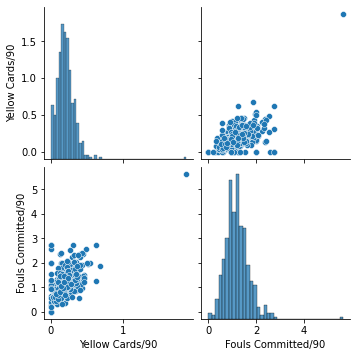

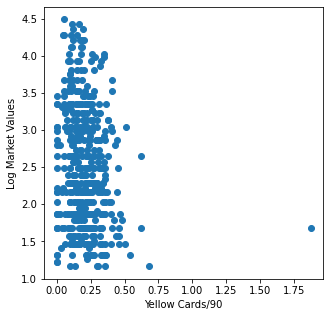

Corrlation coefficient between Yellow Cards/90 and target: (-0.15276765761525798, 0.0007462142455832404)



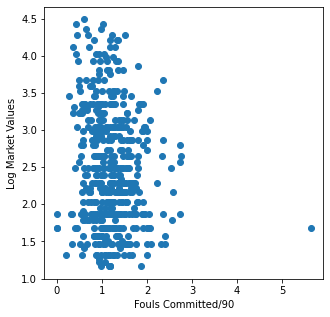

Corrlation coefficient between Fouls Committed/90 and target: (-0.13070625064011648, 0.003970843015481278)



In [631]:
#fouling list
fouling = ['Yellow Cards/90', 'Fouls Committed/90']

#collinearity check
CollinearityCheck2(fouling, X_defender_stat, log_y_defender)

`Fouls Committed/90` will be dropped. 

In [632]:
#appending
drop_cols3.append('Fouls Committed/90')

#check
drop_cols3

['Shots/90',
 'Tkl Won/90',
 'Tkl Success Rate',
 'Tkl vs. dribbles Success Rate',
 'Blocks/90',
 'Aerial Battles Won/90',
 'Fouls Committed/90']

Now I can drop all of the above columns. Note that the touches related statistics have been checked above in section 3.  

In [633]:
#dropping columns
X_defender_stat.drop(columns=drop_cols3, inplace=True)



In [634]:
#checking length
print(len(X_defender_stat.columns))
X_defender_stat.columns

26


Index(['Age', '90s', 'Non PK Gls/90', 'Yellow Cards/90', 'Shots on Target/90',
       'Pass Cmp/90', 'Attacking Passes/90', 'Through Balls/90',
       'Passes under pressure/90', 'Switches/90', 'Crosses/90',
       'Bad Passes/90', 'GCA/90', 'Tkl vs Dribbles/90',
       'Successful Presses/90', 'Press Success Rate', 'Touches/90',
       'Mid 3rd Touches/90', 'Att Pen Touches/90', 'Carries/90',
       'Bad Dribbles /90', 'Rec/90', 'Rec Success Rate',
       'Loose Balls Recov/90', 'Aerial Battle Success Rate', 'subg_Wingback'],
      dtype='object')

Now there are 26 remaining independent variables, less than half of what we started with. The last thing that I am going to do before beginning to model is remove remaining feature variables with low correlation coefficients.

In [635]:
#creating corr coef list
corr_coefs = []
#looping through columns
for col in X_defender_stat.columns:
    #pulling corr coefficient
    corr, pval = pearsonr(X_defender_stat[col], log_y_defender)
    
    #appending
    corr_coefs.append(corr)
    
    
#creating corr_coefs as an array
corr_array = np.array(corr_coefs)
abs_corr = np.abs(corr_array)
#creating data frame
corr_defender_df = pd.DataFrame({'Independent Variable' : X_defender_stat.columns,
                                 'Correlation Coefficient': corr_coefs,
                                 'Absolute Value Correlation': abs_corr})

corr_defender_df.head()

,Independent Variable,Correlation Coefficient,Absolute Value Correlation
0,Age,-0.119541,0.119541
1,90s,0.364311,0.364311
2,Non PK Gls/90,0.226979,0.226979
3,Yellow Cards/90,-0.152768,0.152768
4,Shots on Target/90,0.218711,0.218711


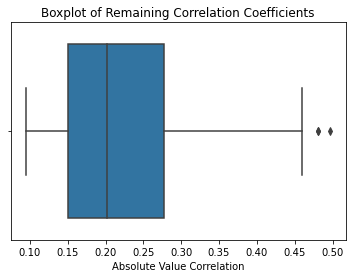

Median of Absolute Correlations = 0.2


In [636]:
#boxplot of remaining coefficients
plt.figure()
plt.title('Boxplot of Remaining Correlation Coefficients')
sns.boxplot(data = corr_defender_df, x = 'Absolute Value Correlation')
plt.show()

#printing median
abs_med = corr_defender_df['Absolute Value Correlation'].median()

print(f"Median of Absolute Correlations = {round(abs_med, 2)}")

The final drop that I am going to make will be every independent variable whose absolute relationship is weaker than the median absolute relationship. So any independent variable with that has a correlation weaker than 0.2 with the dependent variable.

In [637]:
#new drop list
drop_cols_4 = []

#looping through columns
for col in X_defender_stat.columns:
    #pulling corr coefficient
    corr, pval = pearsonr(X_defender_stat[col], log_y_defender)
    
    if np.abs(corr) < 0.2:
    #appending
        drop_cols_4.append(col)

print(len(drop_cols_4))
drop_cols_4

12


['Age',
 'Yellow Cards/90',
 'Through Balls/90',
 'Crosses/90',
 'Bad Passes/90',
 'GCA/90',
 'Tkl vs Dribbles/90',
 'Successful Presses/90',
 'Press Success Rate',
 'Bad Dribbles /90',
 'Loose Balls Recov/90',
 'subg_Wingback']

In [638]:
#dropping columns
X_defender_stat.drop(columns=drop_cols_4, inplace=True)

print(f"There are {len(X_defender_stat.columns)} independent variables remaining")


There are 14 independent variables remaining


In [639]:
#check
X_defender_stat.columns

Index(['90s', 'Non PK Gls/90', 'Shots on Target/90', 'Pass Cmp/90',
       'Attacking Passes/90', 'Passes under pressure/90', 'Switches/90',
       'Touches/90', 'Mid 3rd Touches/90', 'Att Pen Touches/90', 'Carries/90',
       'Rec/90', 'Rec Success Rate', 'Aerial Battle Success Rate'],
      dtype='object')

Before beginning model testing I am going to update the correlation dataframe. 

In [640]:
#creating correlation dataframe
corr_defender_df = corr_defender_df[corr_defender_df['Independent Variable'].isin(drop_cols_4) == False]

corr_defender_df

,Independent Variable,Correlation Coefficient,Absolute Value Correlation
1,90s,0.364311,0.364311
2,Non PK Gls/90,0.226979,0.226979
4,Shots on Target/90,0.218711,0.218711
5,Pass Cmp/90,0.481135,0.481135
6,Attacking Passes/90,0.294048,0.294048
8,Passes under pressure/90,0.229250,0.229250
9,Switches/90,0.206852,0.206852
16,Touches/90,0.459930,0.459930
17,Mid 3rd Touches/90,0.408882,0.408882
18,Att Pen Touches/90,0.201809,0.201809


In [641]:
#sorting by correlation coefficient and resetting index for cosmetic purposes
corr_defender_df = corr_defender_df.sort_values('Correlation Coefficient', ascending=False)

#reseting index
corr_defender_df.reset_index(drop=True, inplace=True)

corr_defender_df

,Independent Variable,Correlation Coefficient,Absolute Value Correlation
0,Rec/90,0.497056,0.497056
1,Pass Cmp/90,0.481135,0.481135
2,Carries/90,0.480611,0.480611
3,Touches/90,0.459930,0.459930
4,Mid 3rd Touches/90,0.408882,0.408882
5,90s,0.364311,0.364311
6,Attacking Passes/90,0.294048,0.294048
7,Passes under pressure/90,0.229250,0.229250
8,Non PK Gls/90,0.226979,0.226979
9,Rec Success Rate,0.224518,0.224518


In [642]:
def CorrDF_Creator(ind_vars, dep_var):
    '''
    Creates a list of sorted correlations
    
    Inputs
    ind_vars - dataframe of indpendent variables
    dep_var - dataframe of dependent variables
    
    returns - data frame of feature names and correlation coeficients
    '''
    corr_list = []
    for col in ind_vars.columns:
        corr, pval = pearsonr(ind_vars[col], dep_var)
        corr_list.append(corr)
        #creating dataframe
    corr_df = pd.DataFrame({'Independent Variable': ind_vars.columns,
                                           'Correlation': corr_list})
    corr_df.reset_index(drop = True, inplace=True)
    corr_df = corr_df.sort_values('Correlation')
    return corr_df

### Pre Model Testing

Before running the model, I need to test a few things. 

1. I need to look and see if the independent variables have a linear relationship with the dependent variable.
    * Rather than plot 14 scatter, we can just examine the data frame above. 6 of the 14 independent variables have moderately strong linear relationships with the dependent variables. The other 9 are relatively weak, but still stronger than half of the independent variables with significant coefficients. 
    
2. I need to check for collinearity amongst the independent variables. 
    * I will look at variance inflation factor (VIF). This measures how much the variance of an independent variable is effected by it's interaction with the other independent variables. The lower the number, the less collinearity, which is good. 

#### Checking Multicollinearity with VIF

In [643]:
#VIF finder
from statsmodels.stats.outliers_influence import variance_inflation_factor
print('VIFs for our target variables are shown below')
pd.Series([variance_inflation_factor(X_defender_stat.values, i) 
               for i in range(X_defender_stat.shape[1])], 
              index=X_defender_stat.columns)

VIFs for our target variables are shown below


90s                             6.857006
Non PK Gls/90                   3.603139
Shots on Target/90              6.614122
Pass Cmp/90                   299.435178
Attacking Passes/90            19.548813
Passes under pressure/90       32.362832
Switches/90                     6.485614
Touches/90                    519.777245
Mid 3rd Touches/90            159.337535
Att Pen Touches/90              8.492500
Carries/90                    515.950172
Rec/90                        669.539696
Rec Success Rate               94.929672
Aerial Battle Success Rate     29.178386
dtype: float64

There are some very high VIFs. I am not going to remove any of these variables yet. I am going to run the first model and remove an insignificant variables. From there I will look to see if this still remains a problem. This will make it easier to determine which variables are directly influencing eachother. 

### Linear Regression
First I am going to create a function that will create linear regression for me, as well as create diagnostic tests.

In [644]:
from scipy import stats
import statsmodels.api as sm

#function
def LinReg_Creator(dataframe, target):
    '''
    Creates a linear regression and diagnostics
    
    Inputs
    dataframe - independent variable dataframe
    target - dependent variable dataframe
    
    Outputs
    Linear regression summary
    Diagnostic tests
    '''
    #assertions
    
    X_constant = sm.add_constant(dataframe)

    #instantiating and fitting (fs =forward selection)
    X_linreg = sm.OLS(target, X_constant).fit()

    print(X_linreg.summary())
    
    #creating subplot
    plt.subplots(3,1, figsize = (12,10))
    

    

    
    #histogram of residuals
    plt.subplot(3,1,1)
    plt.hist(X_linreg.resid, bins = 20)
    plt.xlabel('Residuals')
#     plt.ylabel('Frequency')
    plt.title('Distribution of Residuals for Linear Regression')

    
    #QQ plot
    plt.subplot(3,1,2)
    prob_plot = stats.probplot(X_linreg.resid, dist="norm", plot = plt)
    plt.title('QQ Plot')
    
    #homoscedasticity plot
    plt.subplot(3,1,3)
    plt.scatter(X_linreg.fittedvalues, X_linreg.resid)
    plt.xlabel('Fitted values')
#     plt.ylabel('Residuals')
    plt.title('Size of Error Terms across Predicted Values ')
    
    plt.tight_layout()
    plt.show()

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.426
Model:                                   OLS   Adj. R-squared:                  0.409
Method:                        Least Squares   F-statistic:                     24.91
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           3.74e-48
Time:                               01:07:38   Log-Likelihood:                -435.74
No. Observations:                        484   AIC:                             901.5
Df Residuals:                            469   BIC:                             964.2
Df Model:                                 14                                         
Covariance Type:                   nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

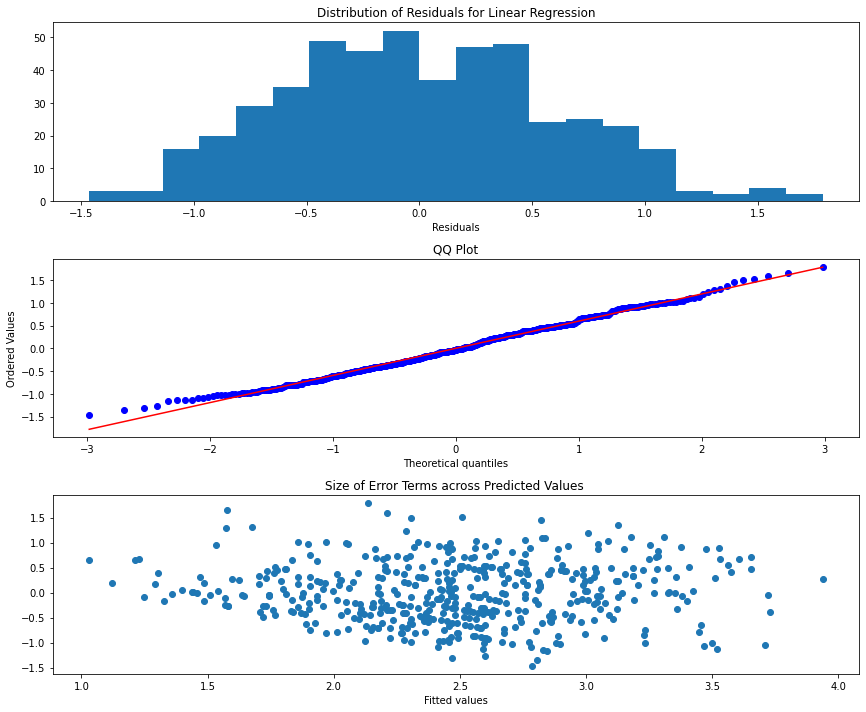

In [645]:
LinReg_Creator(X_defender_stat, log_y_defender)

Looking at the summary for the regression, I am going to drop 3 independent variables. 
1. `Shots on Target/90`
2. `Attacking Passes/90`
3. `Rec/90`


These 3 independent variables all have p-values greater than 0.5. Once they are dropped, I will check the VIF again to see if it has gone down. 

In [646]:
#dropping insignificant variables
X_defender_stat_2 = X_defender_stat.drop(columns = ['Shots on Target/90', 
                                                    'Attacking Passes/90', 
                                                    'Rec/90'])


#check
X_defender_stat_2.columns

Index(['90s', 'Non PK Gls/90', 'Pass Cmp/90', 'Passes under pressure/90',
       'Switches/90', 'Touches/90', 'Mid 3rd Touches/90', 'Att Pen Touches/90',
       'Carries/90', 'Rec Success Rate', 'Aerial Battle Success Rate'],
      dtype='object')

In [647]:
#new correlation dataframe
CorrDF_Creator(X_defender_stat_2, log_y_defender)

,Independent Variable,Correlation
10,Aerial Battle Success Rate,0.201667
7,Att Pen Touches/90,0.201809
4,Switches/90,0.206852
9,Rec Success Rate,0.224518
1,Non PK Gls/90,0.226979
3,Passes under pressure/90,0.229250
0,90s,0.364311
6,Mid 3rd Touches/90,0.408882
5,Touches/90,0.459930
8,Carries/90,0.480611


In [648]:
#functionizing VIF finder
def VIF_Finder(X_df): 
    print('VIFs for our target variables are shown below')
    vifs = pd.Series([variance_inflation_factor(X_df.values, i) 
               for i in range(X_df.shape[1])], 
              index=X_df.columns)
    return vifs

In [649]:
VIF_Finder(X_defender_stat_2)

VIFs for our target variables are shown below


90s                             6.614081
Non PK Gls/90                   2.259065
Pass Cmp/90                   207.252587
Passes under pressure/90       29.283492
Switches/90                     5.691582
Touches/90                    484.829096
Mid 3rd Touches/90            143.159743
Att Pen Touches/90              6.601256
Carries/90                    239.484334
Rec Success Rate               83.127213
Aerial Battle Success Rate     25.374362
dtype: float64

Of the independent variables with the highest with extremely high VIFs (VIF > 100), the independent variable with the highest coefficient p-value in the previous regression is `Touches/90`. I think removing this will greatly decrease the VIFs for many of these features. It make sense that the number of times a player touches a ball would greatly influence other statistics, as they'll have more or less opportunities to pass, carry, dribble etc.

In [650]:
#dropping touches/90
X_defender_stat_2.drop(['Touches/90'], inplace=True, axis = 1)

#finding VIFs
VIF_Finder(X_defender_stat_2)

VIFs for our target variables are shown below


90s                             6.563418
Non PK Gls/90                   2.227092
Pass Cmp/90                   190.486346
Passes under pressure/90       24.735054
Switches/90                     5.517164
Mid 3rd Touches/90            123.607446
Att Pen Touches/90              5.430561
Carries/90                    217.926824
Rec Success Rate               51.335712
Aerial Battle Success Rate     25.359454
dtype: float64

Some effect can be seen, but not to the extent that I had anticipated. I am going to run another regression to look at updated coefficients, and then I will decide which to remove. 

### Defender Linear Regression 2

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.425
Model:                                   OLS   Adj. R-squared:                  0.413
Method:                        Least Squares   F-statistic:                     34.96
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           6.60e-51
Time:                               01:07:42   Log-Likelihood:                -436.37
No. Observations:                        484   AIC:                             894.7
Df Residuals:                            473   BIC:                             940.7
Df Model:                                 10                                         
Covariance Type:                   nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

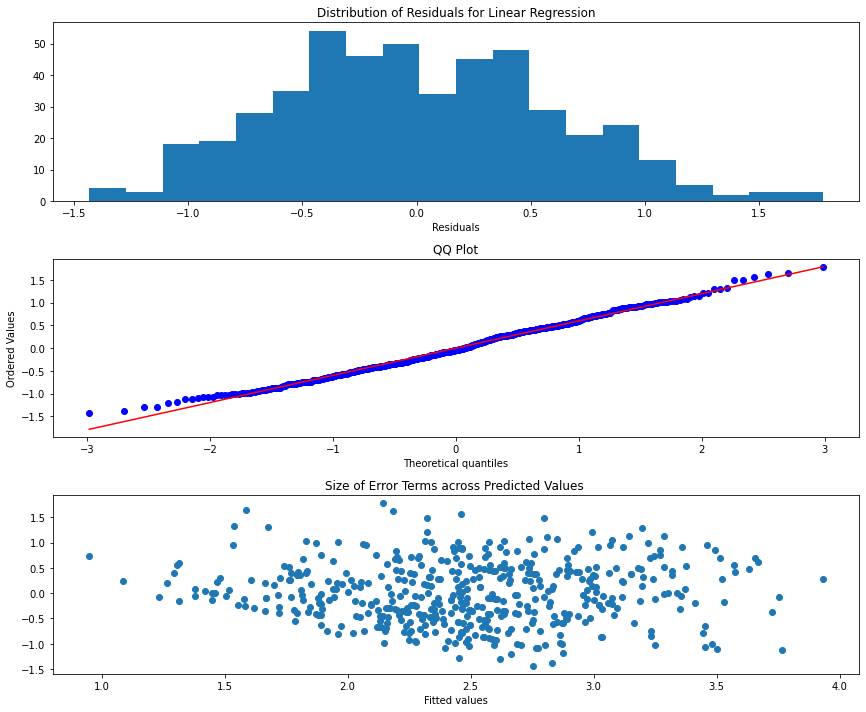

In [651]:
LinReg_Creator(X_defender_stat_2, log_y_defender)

Diagnostics looks good. There is only one insignificant coefficient. It belongs to `Pass Cmp/90`. This variable will be removed.

In [652]:
#drop
X_defender_stat_3 = X_defender_stat_2.drop(['Pass Cmp/90'], axis = 1)

#VIF finder
VIF_Finder(X_defender_stat_3)

VIFs for our target variables are shown below


90s                             6.545005
Non PK Gls/90                   2.226929
Passes under pressure/90       24.409648
Switches/90                     5.512450
Mid 3rd Touches/90            111.231564
Att Pen Touches/90              5.252490
Carries/90                    109.387826
Rec Success Rate               51.282241
Aerial Battle Success Rate     24.644476
dtype: float64

The VIFs for `Mid 3rd Touches/90` and `Carries/90` both decreased significantly. Their coefficients are both significant. The other less-problematic-but still problematic variables VIFs have not changed at all which means they are probably being effected by other variables in the data set. I will deal with these in a little, but first I am going to run another regression and see which of the two big problems should be dealt with. 

### Defender Linear Regression 3

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.423
Model:                                   OLS   Adj. R-squared:                  0.412
Method:                        Least Squares   F-statistic:                     38.57
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           2.55e-51
Time:                               01:07:45   Log-Likelihood:                -437.32
No. Observations:                        484   AIC:                             894.6
Df Residuals:                            474   BIC:                             936.5
Df Model:                                  9                                         
Covariance Type:                   nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

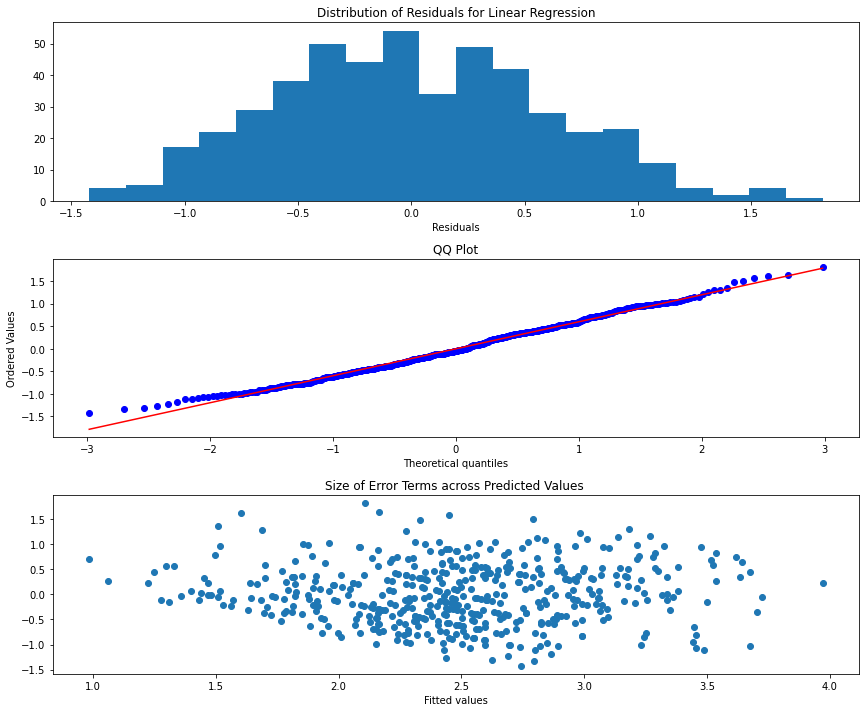

In [653]:
LinReg_Creator(X_defender_stat_3, log_y_defender)

I am going to pull the 5 independent variables that have VIFs > 20 and put them in a pair plot to look at there trends. 

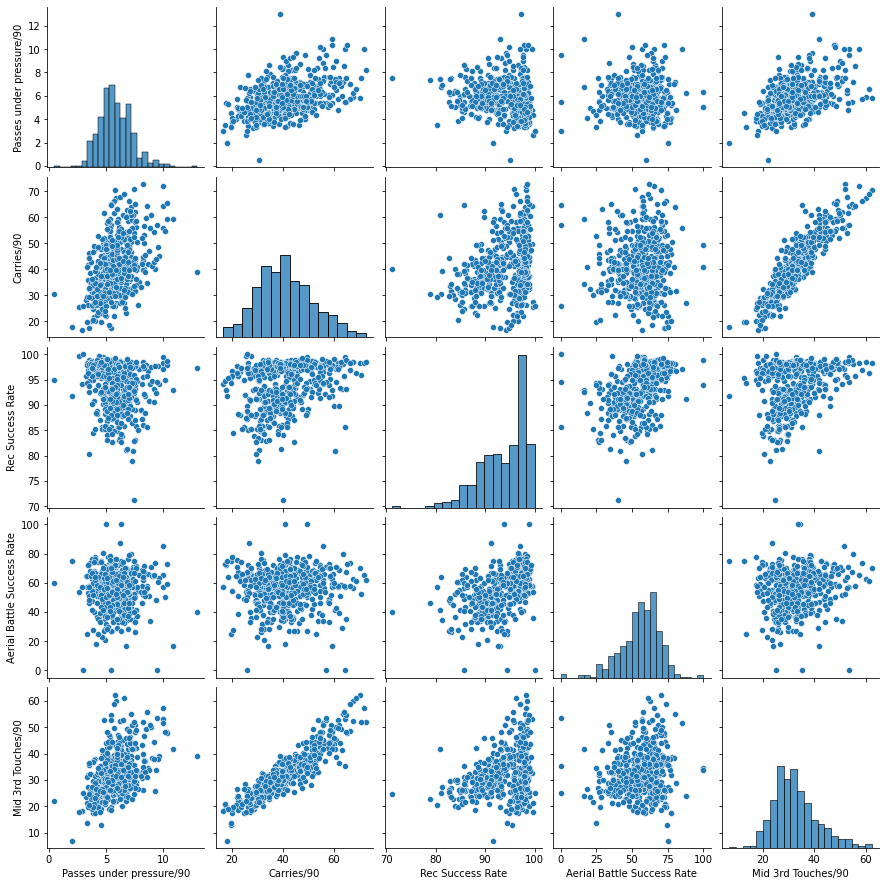

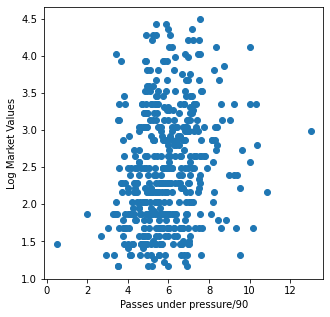

Corrlation coefficient between Passes under pressure/90 and target: (0.2292500274934854, 3.423248840144624e-07)



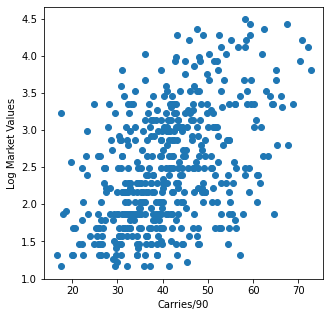

Corrlation coefficient between Carries/90 and target: (0.4806113631446276, 2.4290597829087794e-29)



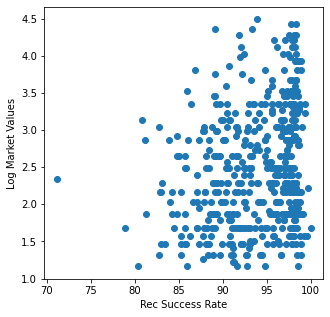

Corrlation coefficient between Rec Success Rate and target: (0.2245177807703408, 6.023224550013584e-07)



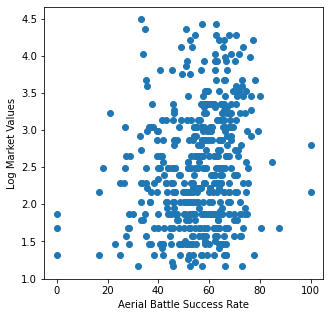

Corrlation coefficient between Aerial Battle Success Rate and target: (0.20166661907565558, 7.777706363269776e-06)



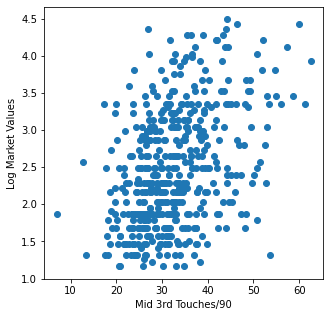

Corrlation coefficient between Mid 3rd Touches/90 and target: (0.4088817522216149, 6.259219567385137e-21)



In [656]:
high_vifs = ['Passes under pressure/90', 'Carries/90', 
             'Rec Success Rate', 'Aerial Battle Success Rate', 'Mid 3rd Touches/90']

CollinearityCheck2(high_vifs, X_defender_stat_3, log_y_defender)

I am going to drop `Passes under pressure/90`,  `Mid 3rd Touches` and `Rec Success Rate`.

`Carries/90` has the strongest correlation coefficient. There is a clear linear relationship between `Carries/90` and the three independent variables that are being removed. There does not appear to be a linear trend between `Carries/90` and `Aerial battle Success Rate`. There is a trend shown between `Rec Success Rate` and `Aerial battle Success Rate` on the pair plot, so hopefully when `Rec Success Rate` is dropped, the VIF for `Aerial Battle Success Rate` will decrease. 

In [657]:
#dropping
X_defender_stat_5 = X_defender_stat_3.drop(columns=['Passes under pressure/90','Rec Success Rate', 'Mid 3rd Touches/90'])

#checking VIF
VIF_Finder(X_defender_stat_5)

VIFs for our target variables are shown below


90s                            6.103227
Non PK Gls/90                  2.223488
Switches/90                    5.475112
Att Pen Touches/90             4.117013
Carries/90                    14.736114
Aerial Battle Success Rate    10.957029
dtype: float64

I am going to remove `Carries/90` as it has the highest VIF. This should bring every variable below the threshold. I will need to fit manually so I can pull the coefficients.

In [658]:
#fitting regression manually
X_defender_5_constant = sm.add_constant(X_defender_stat_5)

defender5 = sm.OLS(log_y_defender, X_defender_5_constant)
defender5_results = defender5.fit()

defender5_results.summary()

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     Market Values in Millions   R-squared:                       0.403
Model:                                   OLS   Adj. R-squared:                  0.396
Method:                        Least Squares   F-statistic:                     53.72
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.59e-50
Time:                               01:11:03   Log-Likelihood:                -445.35
No. Observations:                        484   AIC:                             904.7
Df Residuals:                            477   BIC:                             934.0
Df Model:                                  6                                         
Covariance Type:                   nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.2160      0.175     -1.233      0.218      -0.560       0.128
90s                            0.0164      0.002      8.242      0.000       0.012       0.020
Non PK Gls/90                  1.4872      0.620      2.400      0.017       0.270       2.705
Switches/90                   -0.0653      0.041     -1.589      0.113      -0.146       0.015
Att Pen Touches/90             0.1643      0.040      4.103      0.000       0.086       0.243
Carries/90                     0.0312      0.003     10.926      0.000       0.026       0.037
Aerial Battle Success Rate     0.0126      0.002      5.570      0.000       0.008       0.017
==============================================================================
Omnibus:                       10.586   Durbin-Watson:                   0.899
Prob(Omnibus):                  0.005   Jarque-Bera (JB):                8.147
Skew:                           0.218   Prob(JB):                       0.0170
Kurtosis:                       2.537   Cond. No.                     1.74e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.74e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We can see that swithces is no longer significant. It can be removed. 

In [659]:
#dropping switches
X_defender_6_constant = X_defender_5_constant.drop(columns='Switches/90')


defender6 = sm.OLS(log_y_defender, X_defender_6_constant)
defender6_results = defender6.fit()

defender6_results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     Market Values in Millions   R-squared:                       0.400
Model:                                   OLS   Adj. R-squared:                  0.394
Method:                        Least Squares   F-statistic:                     63.76
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           6.56e-51
Time:                               01:11:12   Log-Likelihood:                -446.63
No. Observations:                        484   AIC:                             905.3
Df Residuals:                            478   BIC:                             930.4
Df Model:                                  5                                         
Covariance Type:                   nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         -0.1922      0.175     -1.099      0.272      -0.536       0.151
90s                            0.0157      0.002      8.075      0.000       0.012       0.020
Non PK Gls/90                  1.4406      0.620      2.324      0.021       0.222       2.659
Att Pen Touches/90             0.1739      0.040      4.386      0.000       0.096       0.252
Carries/90                     0.0295      0.003     11.153      0.000       0.024       0.035
Aerial Battle Success Rate     0.0120      0.002      5.374      0.000       0.008       0.016
==============================================================================
Omnibus:                       10.891   Durbin-Watson:                   0.894
Prob(Omnibus):                  0.004   Jarque-Bera (JB):                8.033
Skew:                           0.204   Prob(JB):                       0.0180
Kurtosis:                       2.519   Cond. No.                     1.73e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.73e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

All variables are significant. Now I want to examine their practical effects on a players market value.

In [660]:
#creating final data frame
final_defender_df = pd.DataFrame({'Independent Variable': defender6_results.params.index,
                                 "Coefficient": defender6_results.params.values})


final_defender_df['Practical Effect'] = np.expm1(final_defender_df['Coefficient'])

final_defender_df

,Independent Variable,Coefficient,Practical Effect
0,const,-0.192193,-0.174852
1,90s,0.015746,0.015870
2,Non PK Gls/90,1.440639,3.223394
3,Att Pen Touches/90,0.173949,0.189994
4,Carries/90,0.029499,0.029938
5,Aerial Battle Success Rate,0.011978,0.012050


The only two variables with any real effect are `Non Pk Gls/90` and `Att Pen Touches/90`. It is surprising to see no defensive statistics here, but I suppose defenders on the best teams do not have to defend as much. 

Teams do need scoring from any source. Goals are hard to come by, and defenders who can score add a whole different element to a team. 

## Midfielder Statistical Regression

In this section I will perform similar statistical analyses on the midfielder `Position Group`.

### Removing Insignificant Correlations
In this section I am going to remove independent variables with insignificant correlation coefficients. I am assuming that these independent variables will not contribute to the model. 

I am going to start this list with `Club Tier` as the lone item, as the purposes of this exercise is to find statistics that most effect the dependent variable `Market Values in Millions`.

Again I will start with the transformed variable

In [661]:
#instantiating list
drop_cols_mid =['Club Tier']
#looping through columns
for col in X_midfielder.columns:
    fval, pval = pearsonr(X_midfielder[col], log_y_midfielder)
    
    if pval > 0.05:
        drop_cols_mid.append(col)
        
print(len(drop_cols_mid))
drop_cols_mid

19


['Club Tier',
 'Red Cards/90',
 'xA/90',
 'Free Kicks/90',
 'Successful Box Crosses/90',
 'Crosses/90',
 'Tkl vs Dribbles/90',
 'Tkl vs. dribbles Success Rate',
 'Blocks/90',
 'Int/90',
 'Clearances/90',
 'Errors/90',
 'Bad Dribbles /90',
 'Fouls Committed/90',
 'PKs won/90',
 'PKs conceded/90',
 'Aerial Battles Won/90',
 'European',
 'subg_Holding Midfielder']

The above independent varialbes will be dropped. I will first make a copy so the original dataframe is not modified.

### Checking for sources of collinearity
In this section I will look at similar independent variables to see which should be removed. If there exists clear linear trends, then the independent variable with a weaker correlation will be removed.   First I am going to create lists of all the  variables I will be checking.

In [663]:
#copying
X_midfielder_stats = X_midfielder.copy()

#dropping
X_midfielder_stats.drop(columns=drop_cols_mid, inplace=True)

#checking
X_midfielder_stats.columns

Index(['Age', '90s', 'Gls/90', 'Ast/90', 'PK/90', 'Non PK Gls/90',
       'Yellow Cards/90', 'xG/90', 'non PK xG/90', 'Shots/90',
       'Shots on Target/90', 'Pass Cmp/90', 'Pass Cmp Pctg',
       'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90',
       'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg',
       'Attacking Passes/90', 'Progressing Passes/90', 'Through Balls/90',
       'Passes under pressure/90', 'Switches/90', 'Bad Passes/90', 'SCA/90',
       'GCA/90', 'Tkl Won/90', 'Tkl Success Rate', 'Successful Presses/90',
       'Press Success Rate', 'Touches/90', 'Mid 3rd Touches/90',
       'Att 3rd Touchs/90', 'Att Pen Touches/90', 'Successful Dribbles/90',
       'Dribble Success Rate', 'Carries/90', 'Progressive Carries/90',
       'Attacking Carries/90', 'Rec/90', 'Rec Success Rate', 'Fouls drawn/90',
       'Loose Balls Recov/90', 'Aerial Battle Success Rate'],
      dtype='object')

In [664]:
#creating lists
mid_shooting_scoring = ['Gls/90', 'PK/90', 'Non PK Gls/90',
                        'Shots/90', 'Shots on Target/90', 'xG/90']
mid_attacking_passes = ['Ast/90','Attacking Passes/90',
                       'Progressing Passes/90','Through Balls/90']
mid_passing = ['Pass Cmp/90','Pass Cmp Pctg', 
               'Short Pass Cmp/90', 'Short Pass Cmp Pctg',
               'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 
               'Long Pass Cmp/90', 'Long Pass Cmp Pctg']
mid_creation = ['SCA/90', 'GCA/90']
mid_tkl = ['Tkl Won/90','Tkl Success Rate']
mid_pressing = ['Successful Presses/90','Press Success Rate']
mid_touches = ['Touches/90', 'Mid 3rd Touches/90', 
               'Att 3rd Touchs/90','Att Pen Touches/90']
mid_dribbles_carries = ['Successful Dribbles/90', 'Dribble Success Rate',
                        'Carries/90', 'Progressive Carries/90', 'Attacking Carries/90']
mid_rec = ['Rec/90', 'Rec Success Rate']

#creating list of list names for reference
mid_lists = ['mid_shooting_scoring', 'mid_attacking_passes', 'mid_passing',
            'mid_creation', 'mid_tkl', 'mid_pressing', 'mid_touches',
            'mid_dribbles_carries', 'mid_rec']

In [665]:
mid_lists

['mid_shooting_scoring',
 'mid_attacking_passes',
 'mid_passing',
 'mid_creation',
 'mid_tkl',
 'mid_pressing',
 'mid_touches',
 'mid_dribbles_carries',
 'mid_rec']

#### Midfielder Shooting and Scoring Collinearity Checks

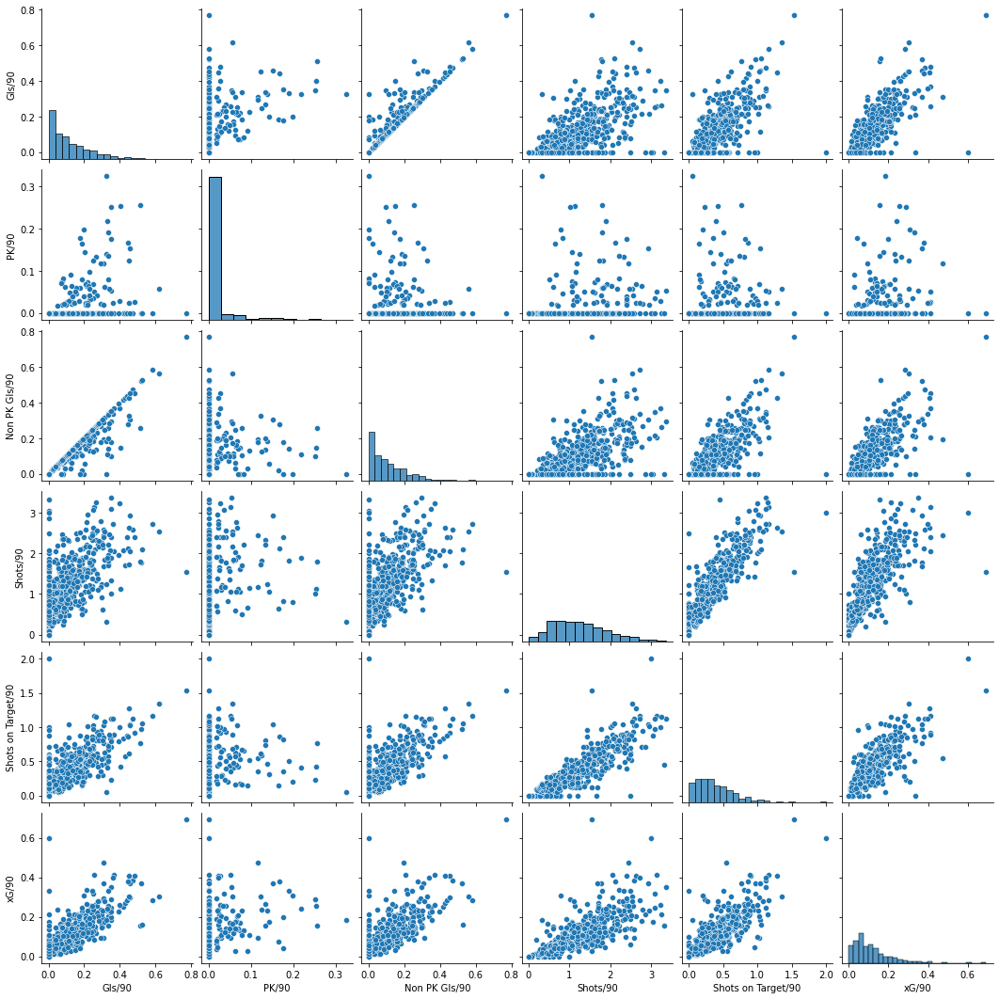

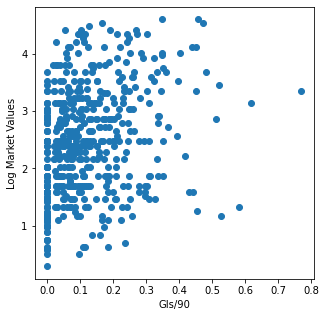

Corrlation coefficient between Gls/90 and target: (0.29670801114334955, 5.231890689647338e-12)



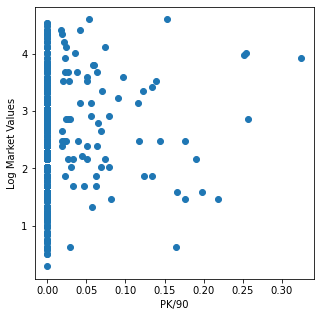

Corrlation coefficient between PK/90 and target: (0.10647148089710912, 0.015239352850775316)



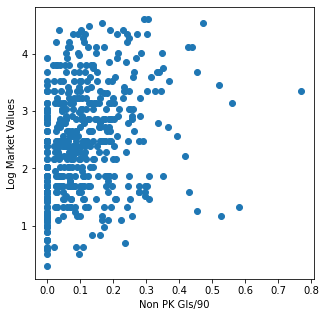

Corrlation coefficient between Non PK Gls/90 and target: (0.28643476109488564, 2.940343805238088e-11)



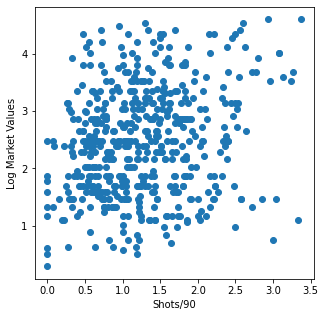

Corrlation coefficient between Shots/90 and target: (0.21937258217482253, 4.483075354208882e-07)



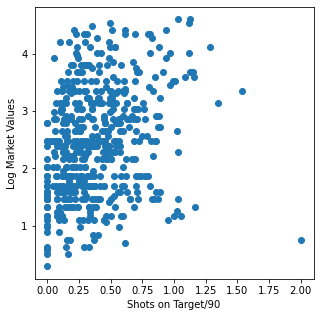

Corrlation coefficient between Shots on Target/90 and target: (0.2670009986757175, 6.386283052816356e-10)



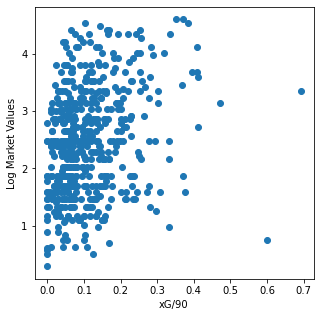

Corrlation coefficient between xG/90 and target: (0.27241535254582233, 2.775477691755513e-10)



In [666]:
CollinearityCheck2(mid_shooting_scoring, X_midfielder_stats, log_y_midfielder)

All of these independent variables are clearly linearly related. `Goals/90` has the highest correlation coefficient. This will be kept and the rest will be dropped.

In [667]:
#appending all but goals/90
drop_cols_mid2= mid_shooting_scoring[1:]

#check
drop_cols_mid2

['PK/90', 'Non PK Gls/90', 'Shots/90', 'Shots on Target/90', 'xG/90']

#### Midfielder Passes Collineary Check

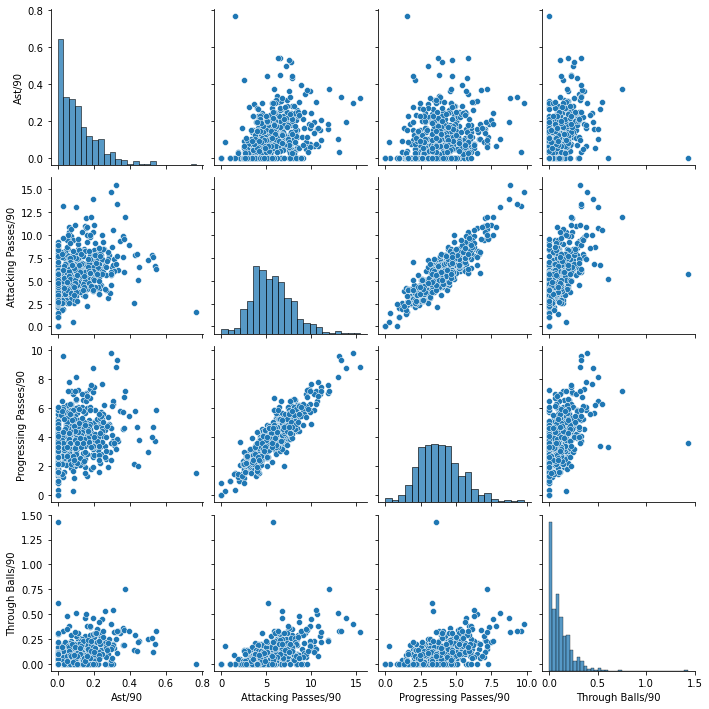

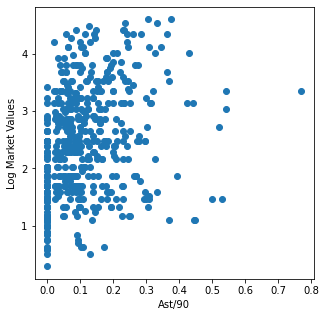

Corrlation coefficient between Ast/90 and target: (0.2771696844438294, 1.3148258774454669e-10)



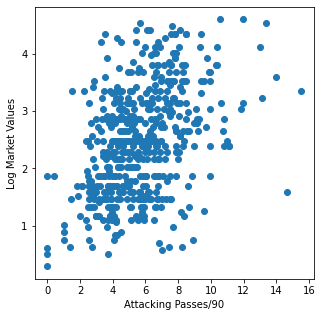

Corrlation coefficient between Attacking Passes/90 and target: (0.4218123942446247, 8.329018658226024e-24)



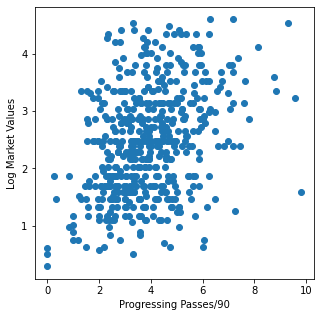

Corrlation coefficient between Progressing Passes/90 and target: (0.3586308694383772, 3.3806872518790904e-17)



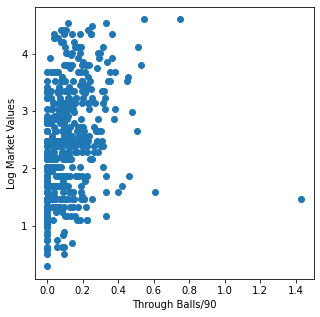

Corrlation coefficient between Through Balls/90 and target: (0.30332000186942015, 1.6595942032432154e-12)



In [671]:
CollinearityCheck2(mid_attacking_passes, X_midfielder_stats, log_y_midfielder)

`Progessing Passes/90` can be dropped as it has a weaker dependent variable correlation and an extremely clear linear relationship with `Attacking Passes/90`. I am going to examine the other three variables.

In [669]:
#looping through to see correlation coefficients
for i in range(0, len(mid_attacking_passes)-1):
    for j in range(1, len(mid_attacking_passes)):
        corr, pval = pearsonr(X_midfielder[mid_attacking_passes[i]],
                              X_midfielder[mid_attacking_passes[j]])
        
        print(f"The correlation between {mid_attacking_passes[i]} & {mid_attacking_passes[j]} is:")
        print(round(corr, 2))
        print('')

The correlation between Ast/90 & Attacking Passes/90 is:
0.36

The correlation between Ast/90 & Progressing Passes/90 is:
0.26

The correlation between Ast/90 & Through Balls/90 is:
0.38

The correlation between Attacking Passes/90 & Attacking Passes/90 is:
1.0

The correlation between Attacking Passes/90 & Progressing Passes/90 is:
0.9

The correlation between Attacking Passes/90 & Through Balls/90 is:
0.54

The correlation between Progressing Passes/90 & Attacking Passes/90 is:
0.9

The correlation between Progressing Passes/90 & Progressing Passes/90 is:
1.0

The correlation between Progressing Passes/90 & Through Balls/90 is:
0.48



I am going to keep `Ast/90` and `Attacking Passes/90`. Through balls has a strong correlation with both. This is a chance that this will cause collinearity later on, but I can sort that out later in the process.

In [670]:
#dropping
drop_cols_mid2.append('Through Balls/90')

#checking
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90']

#### Midfielder Passing Collinearity Checks

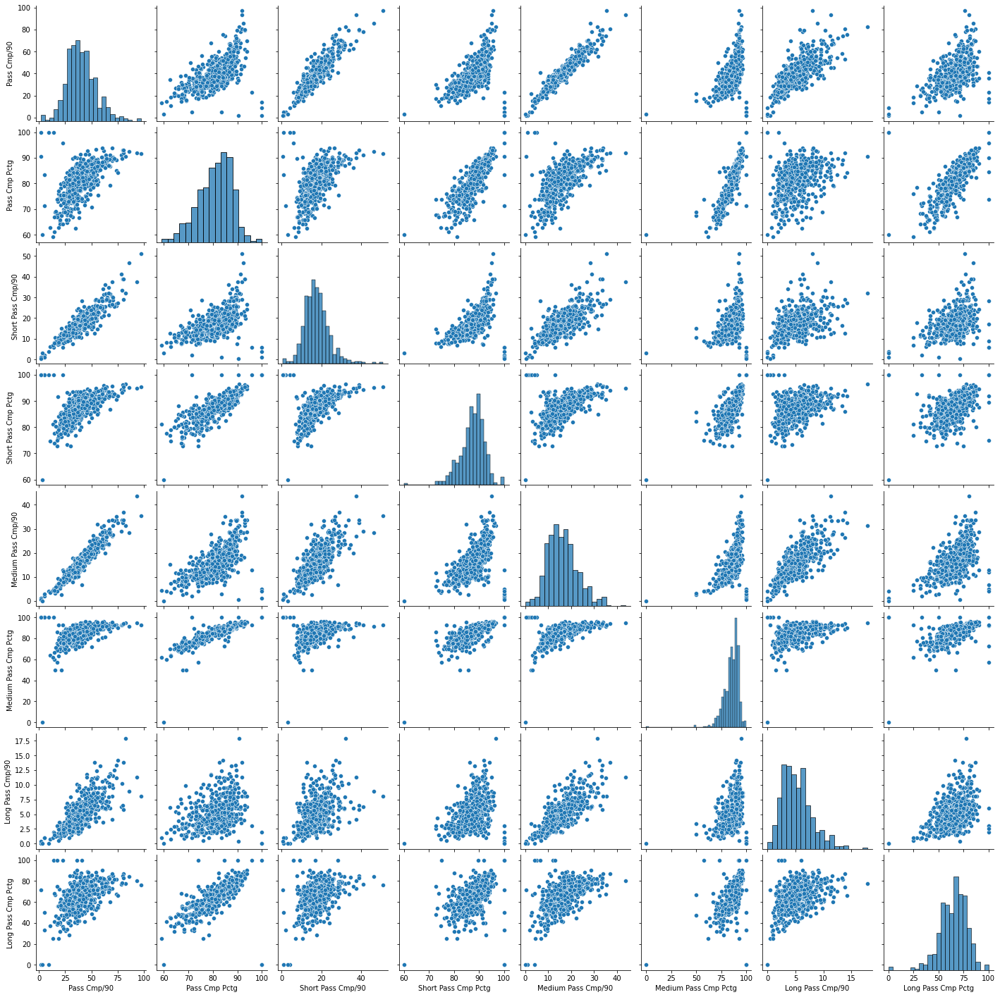

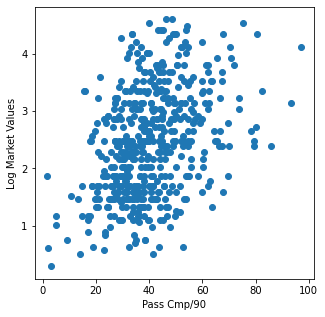

Corrlation coefficient between Pass Cmp/90 and target: (0.39421752979168434, 9.618906803115814e-21)



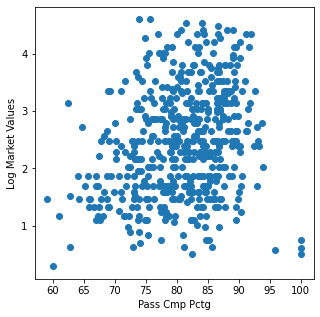

Corrlation coefficient between Pass Cmp Pctg and target: (0.2486628088461032, 9.373189831320027e-09)



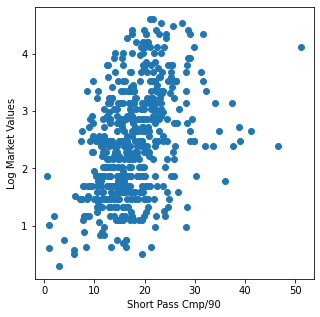

Corrlation coefficient between Short Pass Cmp/90 and target: (0.3990864093193488, 2.9062247569345736e-21)



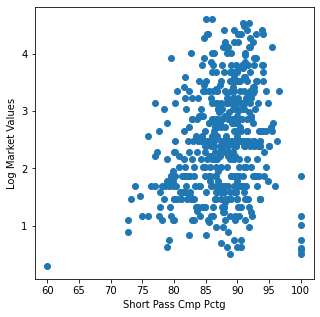

Corrlation coefficient between Short Pass Cmp Pctg and target: (0.23794868413039327, 4.093382478442359e-08)



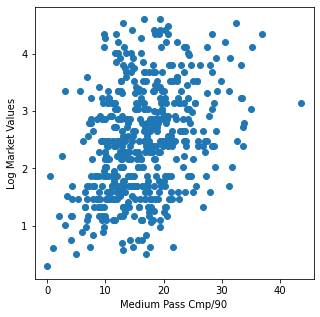

Corrlation coefficient between Medium Pass Cmp/90 and target: (0.3498608462331829, 2.1733223198007954e-16)



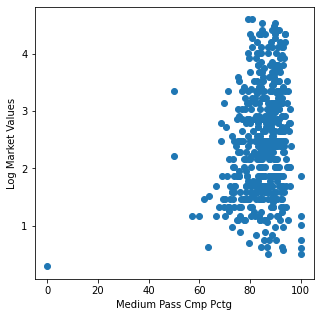

Corrlation coefficient between Medium Pass Cmp Pctg and target: (0.2072036590216027, 1.928213178341388e-06)



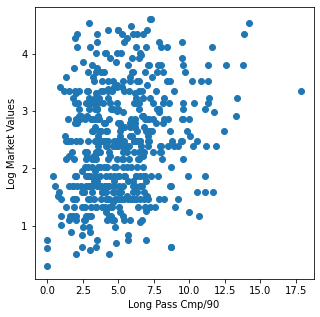

Corrlation coefficient between Long Pass Cmp/90 and target: (0.24064990781009293, 2.8412820988822358e-08)



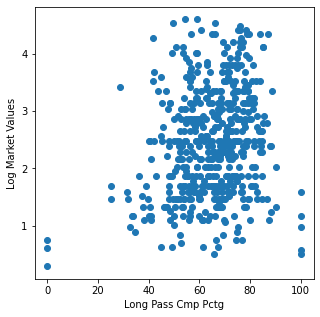

Corrlation coefficient between Long Pass Cmp Pctg and target: (0.20492462466585115, 2.510248392283751e-06)



In [672]:
CollinearityCheck2(mid_passing, X_midfielder_stats, log_y_midfielder)

A linear relationship exists amongst all of these variables. I am going to drop all but `Pass Cmp/90`. It does not have the highest correlation coefficient, but it is close enough to `Short Pass Cmp/90` that I am going to keep it as it is the broader stat of the two.

In [673]:
#dropping
drop_cols_mid2 = drop_cols_mid2 + mid_passing[1:]

#### MIdfielder Creation Collinearity Check

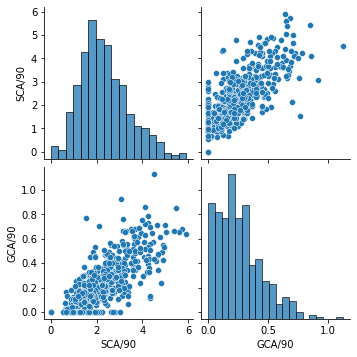

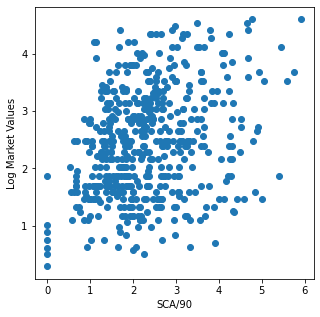

Corrlation coefficient between SCA/90 and target: (0.30953798576736846, 5.487418434027452e-13)



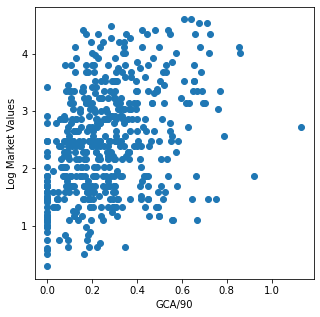

Corrlation coefficient between GCA/90 and target: (0.37094987470053137, 2.2427950314151212e-18)



In [674]:
CollinearityCheck2(mid_creation, X_midfielder_stats, log_y_midfielder)

I am going to drop `SCA/90`. There is a linear trend and this variables has the weaker correlation coefficient.

In [675]:
#appending
drop_cols_mid2.append('SCA/90')

#checking
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'SCA/90']

#### Midfielder Tackles Collinearity Check

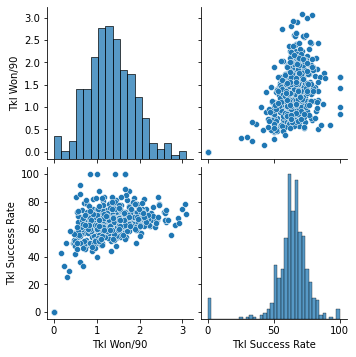

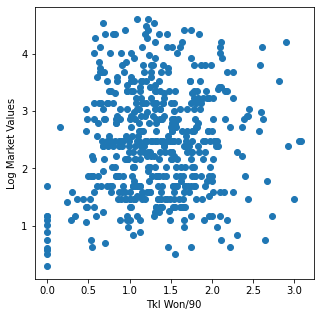

Corrlation coefficient between Tkl Won/90 and target: (0.11039082437750672, 0.011852420744616855)



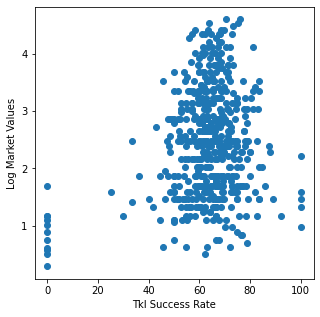

Corrlation coefficient between Tkl Success Rate and target: (0.1951895207324954, 7.493874141174671e-06)



In [676]:
CollinearityCheck2(mid_tkl, X_midfielder_stats, log_y_midfielder)

I am going to drop `Tkl Won/90`. There is a linear trend and this variables has the weaker correlation coefficient.

In [677]:
#appending
drop_cols_mid2.append('Tkl Won/90')

#checking
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'SCA/90',
 'Tkl Won/90']

#### Midfielder Pressing Collinearity Check

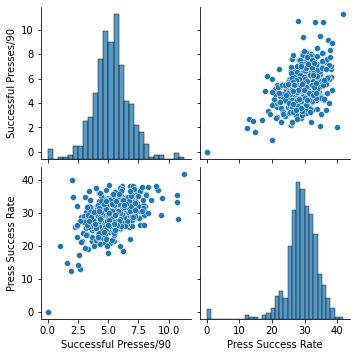

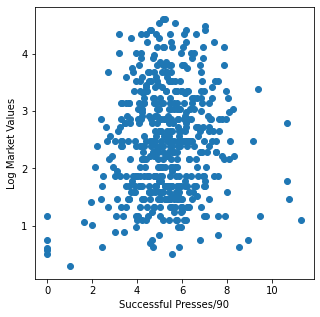

Corrlation coefficient between Successful Presses/90 and target: (0.11748100930332682, 0.007379117214405296)



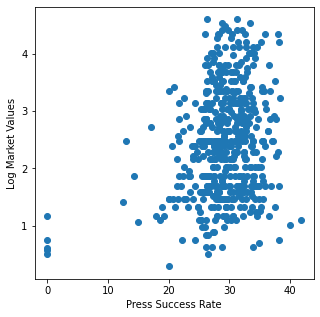

Corrlation coefficient between Press Success Rate and target: (0.24049768378255099, 2.9006870154086835e-08)



In [678]:
CollinearityCheck2(mid_pressing, X_midfielder_stats, log_y_midfielder)

I am going to drop `Successful Presses/90`. There is a linear trend and this variables has the weaker correlation coefficient.

In [679]:
#appending
drop_cols_mid2.append('Successful Presses/90')

#checking
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'SCA/90',
 'Tkl Won/90',
 'Successful Presses/90']

#### Midfielder Touches Collinearity Check

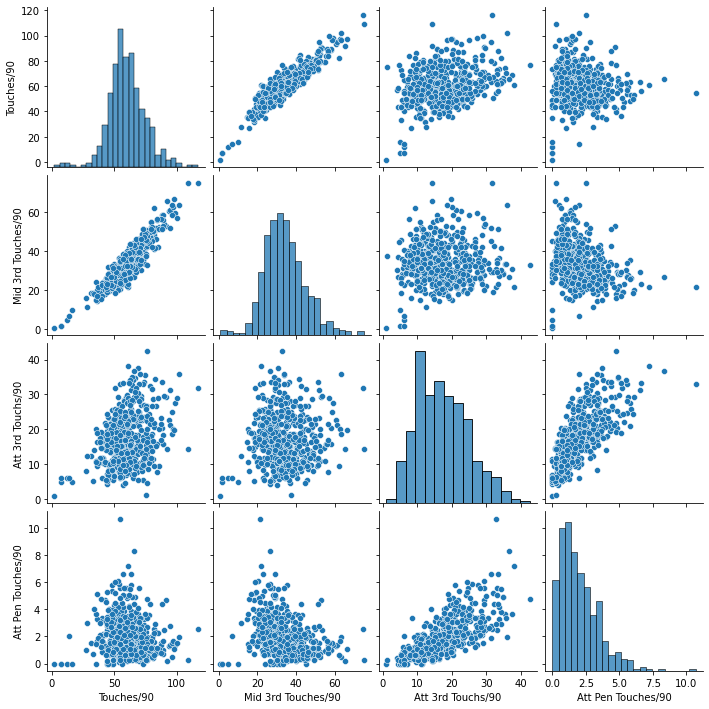

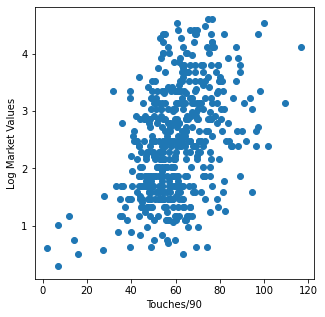

Corrlation coefficient between Touches/90 and target: (0.4163683495174789, 3.52813019614074e-23)



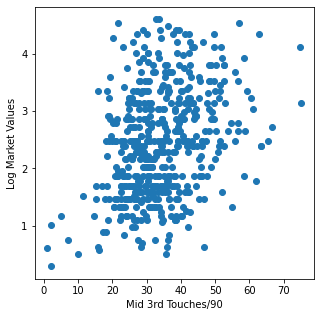

Corrlation coefficient between Mid 3rd Touches/90 and target: (0.3294542505236123, 1.323996366763168e-14)



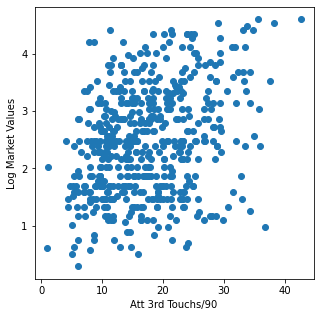

Corrlation coefficient between Att 3rd Touchs/90 and target: (0.31842964301620624, 1.0766765930798734e-13)



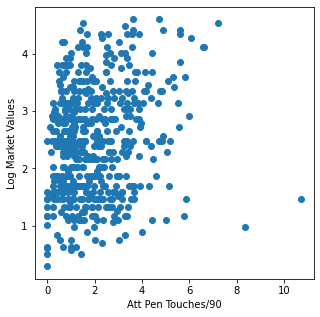

Corrlation coefficient between Att Pen Touches/90 and target: (0.21300797700534307, 9.717787071062767e-07)



In [680]:
CollinearityCheck2(mid_touches, X_midfielder_stats, log_y_midfielder)

I am going to drop `Mid 3rd Touches/90` and `Att 3rd Touches/90`. They have weaker correlation coefficients than `Touches/90` and have a linear relationship. I am going to examine the relationship between `Touches/90` and `Att Pen Touches/90`

In [681]:
#appending
drop_cols_mid2.append('Mid 3rd Touches/90')
drop_cols_mid2.append('Att 3rd Touchs/90')

#checking
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'SCA/90',
 'Tkl Won/90',
 'Successful Presses/90',
 'Mid 3rd Touches/90',
 'Att 3rd Touchs/90']

In [682]:
print('The correlation coefficent between Touches/90 and Att Pen Touches/90 is:')
#finding corr coefficients
corr, pval = pearsonr(X_midfielder[mid_touches[0]],
             X_midfielder[mid_touches[-1]])
print(round(corr, 2))

The correlation coefficent between Touches/90 and Att Pen Touches/90 is:
-0.1


Both can be kept. 

#### Midfielder Dribbles and Carries Collinearity Check

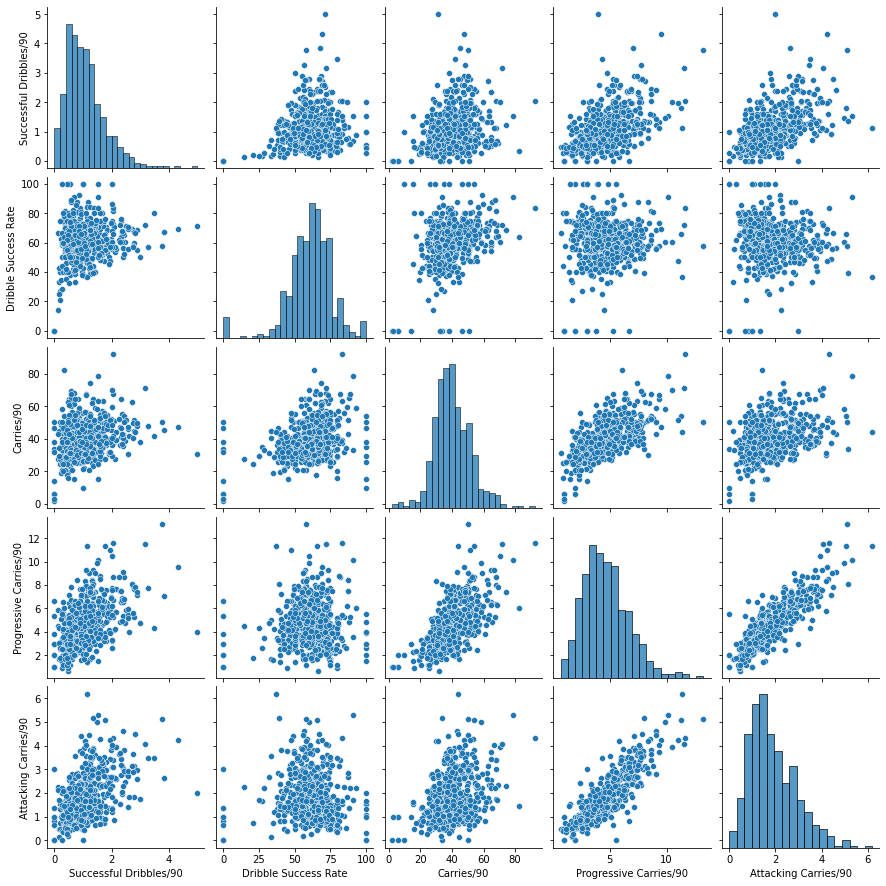

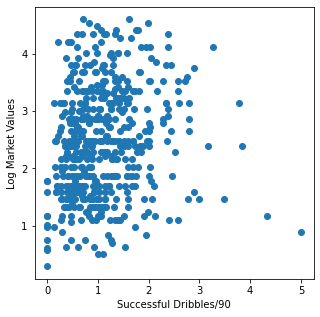

Corrlation coefficient between Successful Dribbles/90 and target: (0.17191187076311248, 8.273988118379762e-05)



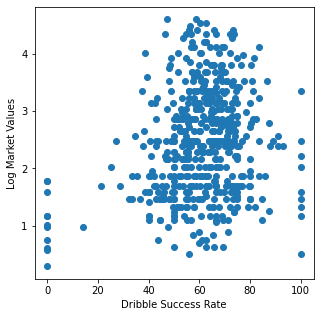

Corrlation coefficient between Dribble Success Rate and target: (0.20627250585225623, 2.1484092117355517e-06)



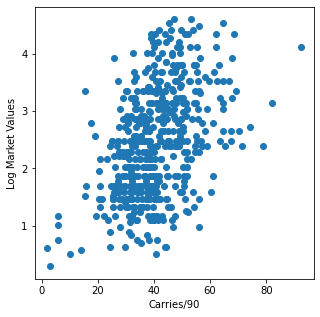

Corrlation coefficient between Carries/90 and target: (0.4404957385846471, 4.7880513210110585e-26)



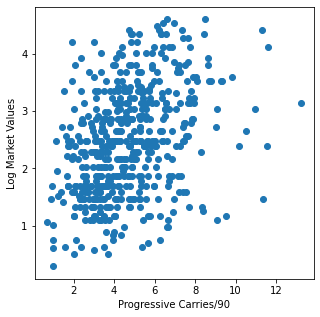

Corrlation coefficient between Progressive Carries/90 and target: (0.37175677865591483, 1.8699451990550082e-18)



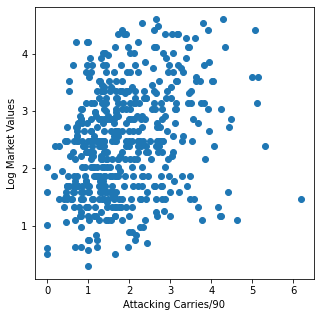

Corrlation coefficient between Attacking Carries/90 and target: (0.2978486438136358, 4.3007388726359944e-12)



In [683]:
CollinearityCheck2(mid_dribbles_carries, X_midfielder_stats, log_y_midfielder)

I am going to keep `Carries/90`. It has the strongest correlation with the dependent variable.

In [684]:
#removing carries from list
mid_dribbles_carries.remove('Carries/90')

#appending rest of list
drop_cols_mid2 = drop_cols_mid2 +mid_dribbles_carries

#chekc
drop_cols_mid2

['PK/90',
 'Non PK Gls/90',
 'Shots/90',
 'Shots on Target/90',
 'xG/90',
 'Through Balls/90',
 'Pass Cmp Pctg',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'SCA/90',
 'Tkl Won/90',
 'Successful Presses/90',
 'Mid 3rd Touches/90',
 'Att 3rd Touchs/90',
 'Successful Dribbles/90',
 'Dribble Success Rate',
 'Progressive Carries/90',
 'Attacking Carries/90']

#### Midfielder Receiving Collinearity Check

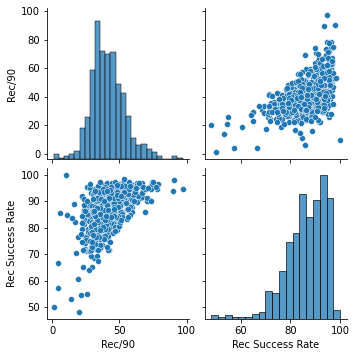

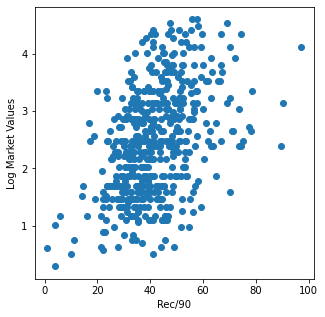

Corrlation coefficient between Rec/90 and target: (0.43655132374815886, 1.461619397539246e-25)



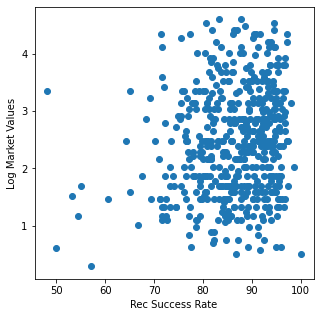

Corrlation coefficient between Rec Success Rate and target: (0.1613981082505029, 0.00022226002394477927)



In [685]:
CollinearityCheck2(mid_rec, X_midfielder_stats, log_y_midfielder)

I am going to remove Rec Success Rate. It has the weaker correlation with the dependent variable.

In [686]:
#dropping
drop_cols_mid2.append('Rec Success Rate')

Now that all of the different stat types have been checked. I can remove the necessary columns

In [687]:
#dropping
X_midfielder_stats2 = X_midfielder_stats.drop(columns = drop_cols_mid2)

#checking
print(len(X_midfielder_stats2.columns))
X_midfielder_stats2.columns

22


Index(['Age', '90s', 'Gls/90', 'Ast/90', 'Yellow Cards/90', 'non PK xG/90',
       'Pass Cmp/90', 'Attacking Passes/90', 'Progressing Passes/90',
       'Passes under pressure/90', 'Switches/90', 'Bad Passes/90', 'GCA/90',
       'Tkl Success Rate', 'Press Success Rate', 'Touches/90',
       'Att Pen Touches/90', 'Carries/90', 'Rec/90', 'Fouls drawn/90',
       'Loose Balls Recov/90', 'Aerial Battle Success Rate'],
      dtype='object')

With 22 independent variables left, I will now look at those with weak correlations.

### Removing Variables with a weak correlation
I am not going to use the median for this step as I did in the defender step. I am going to use the threshold of 0.2 again to keep things consistent. Again I am going to compare the absolute value of the correlation so strong negative correlations are not dropped. 

In [688]:
#creating correlations list
corr_mid = []

#creating drop columns list
drop_col_mid3 = []

#looping through columns
for col in X_midfielder_stats2.columns:
    #finding correlation
    corr, pval = pearsonr(X_midfielder_stats2[col], log_y_midfielder)
    #dropping if below threshold
    if np.abs(corr) < 0.2:
        drop_col_mid3.append(col)
    #keeping if above threshold
    else:
        corr_mid.append(corr)
        
#dropping columns
X_midfielder_stats2.drop(columns=drop_col_mid3, inplace=True)

#creating dataframe
corr_midfielder_df = pd.DataFrame({'Independent Variable': X_midfielder_stats2.columns,
                                   'Correlation': corr_mid})

corr_midfielder_df


,Independent Variable,Correlation
0,90s,0.482252
1,Gls/90,0.296708
2,Ast/90,0.277170
3,non PK xG/90,0.253761
4,Pass Cmp/90,0.394218
5,Attacking Passes/90,0.421812
6,Progressing Passes/90,0.358631
7,Passes under pressure/90,0.269584
8,GCA/90,0.370950
9,Press Success Rate,0.240498


Now, with 14 independent variables. I am ready to begin modeling

### Midfielder Statistical Linear Regression 1

#### Pre Model Vif Check

In [689]:
VIF_Finder(X_midfielder_stats2)

VIFs for our target variables are shown below


90s                           4.999267
Gls/90                        3.771785
Ast/90                        6.435549
non PK xG/90                  8.720694
Pass Cmp/90                 149.819046
Attacking Passes/90          61.779683
Progressing Passes/90        46.408041
Passes under pressure/90     31.995066
GCA/90                       11.753772
Press Success Rate           41.096961
Touches/90                  314.990556
Att Pen Touches/90            7.590022
Carries/90                  321.196021
Rec/90                      441.640137
Fouls drawn/90                6.616195
dtype: float64

Again we can see that there are some high VIFs here. These will be dealt with later, if they are still present after removing independent variables with insignificant regression coefficients.

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.462
Model:                                   OLS   Adj. R-squared:                  0.446
Method:                        Least Squares   F-statistic:                     28.76
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           3.57e-58
Time:                               01:20:49   Log-Likelihood:                -541.79
No. Observations:                        519   AIC:                             1116.
Df Residuals:                            503   BIC:                             1184.
Df Model:                                 15                                         
Covariance Type:                   nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

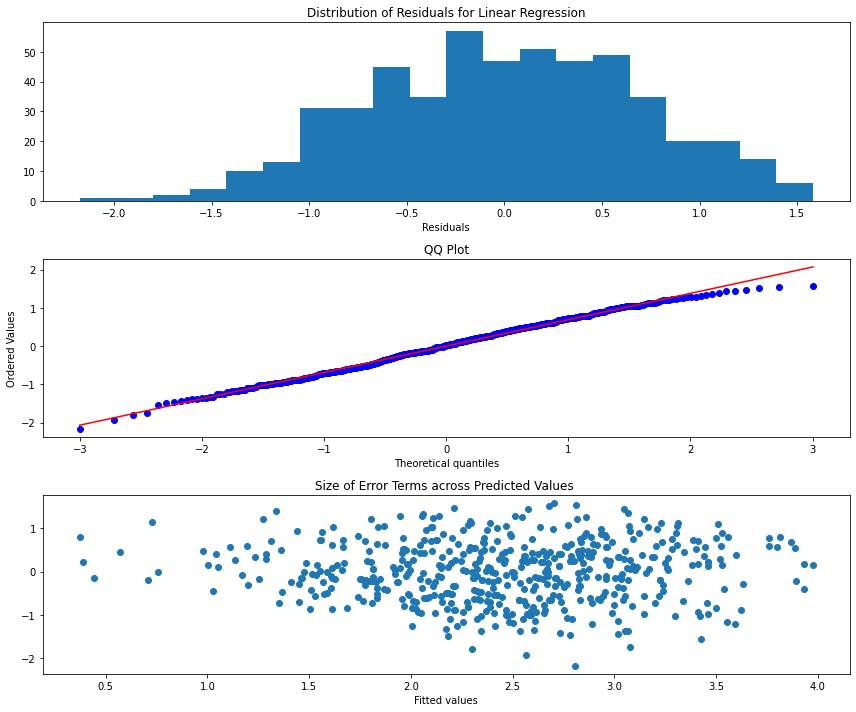

In [690]:
#creating linear regression
LinReg_Creator(X_midfielder_stats2, log_y_midfielder)

I am going to drop the following columns:

* `Ast/90`
* `Attacking Passes/90`
* `Press Success Rate`
* `Touches/90`

These are all the columns with p-values > 0.5.

In [691]:
#dropping
drop_mid4 = ['Ast/90', 'Attacking Passes/90', 
             'Press Success Rate', 'Touches/90']

#new dataframe
X_midfielder_stats3 = X_midfielder_stats2.drop(columns=drop_mid4)

X_midfielder_stats3.head()

,90s,Gls/90,non PK xG/90,Pass Cmp/90,Progressing Passes/90,Passes under pressure/90,GCA/90,Att Pen Touches/90,Carries/90,Rec/90,Fouls drawn/90
0,33.9,0.471976,0.294985,40.058997,3.303835,7.787611,0.678466,7.227139,45.427729,47.404130,1.887906
1,32.0,0.125000,0.171875,51.843750,5.812500,12.562500,0.500000,3.593750,55.437500,59.312500,2.656250
2,54.6,0.219780,0.113553,52.344322,5.641026,9.432234,0.421245,1.300366,49.249084,54.670330,1.813187
3,32.9,0.060790,0.109422,70.607903,7.355623,8.389058,0.303951,0.972644,67.659574,71.945289,2.553191
4,60.5,0.066116,0.039669,61.471074,5.305785,7.338843,0.198347,0.776860,54.181818,56.528926,1.586777


### Midfielder Statistical Linear Regerssion 2
First I am going to look at the correlations and VIFs for the remaining independent variables. 

In [692]:
#corr dataframe
CorrDF_Creator(X_midfielder_stats3, log_y_midfielder)

,Independent Variable,Correlation
7,Att Pen Touches/90,0.213008
10,Fouls drawn/90,0.219088
2,non PK xG/90,0.253761
5,Passes under pressure/90,0.269584
1,Gls/90,0.296708
4,Progressing Passes/90,0.358631
6,GCA/90,0.370950
3,Pass Cmp/90,0.394218
9,Rec/90,0.436551
8,Carries/90,0.440496


In [693]:
#vif checker
VIF_Finder(X_midfielder_stats3)

VIFs for our target variables are shown below


90s                           4.301308
Gls/90                        3.748075
non PK xG/90                  7.882621
Pass Cmp/90                 127.735833
Progressing Passes/90        20.393723
Passes under pressure/90     23.645002
GCA/90                        6.115358
Att Pen Touches/90            7.118284
Carries/90                  275.261957
Rec/90                      344.353812
Fouls drawn/90                6.564532
dtype: float64

The correlation data frame serves as the linearity check. The high VIFs will not be dealt with, just going to if removing insignificant coefficients will solve this problem.

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.461
Model:                                   OLS   Adj. R-squared:                  0.449
Method:                        Least Squares   F-statistic:                     39.36
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           4.46e-61
Time:                               01:21:22   Log-Likelihood:                -542.32
No. Observations:                        519   AIC:                             1109.
Df Residuals:                            507   BIC:                             1160.
Df Model:                                 11                                         
Covariance Type:                   nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------

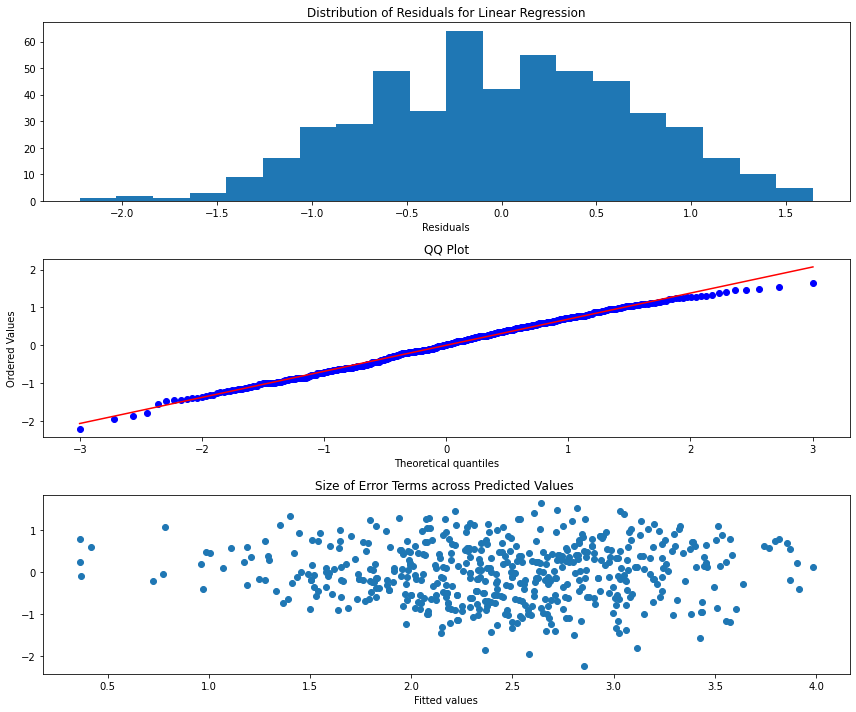

In [694]:
LinReg_Creator(X_midfielder_stats3, log_y_midfielder)

I am going to drop the following columns:
* `Non PK xG/90`
* `Passes under pressure/90`

They are the only two variables with insignificant coefficients. 

In [695]:
#columns to drop
drop_col_mid4 = ['non PK xG/90','Passes under pressure/90']

#new dataframe
X_midfielder_stats4 = X_midfielder_stats3.drop(columns=drop_col_mid4)

#check
X_midfielder_stats4.columns

Index(['90s', 'Gls/90', 'Pass Cmp/90', 'Progressing Passes/90', 'GCA/90',
       'Att Pen Touches/90', 'Carries/90', 'Rec/90', 'Fouls drawn/90'],
      dtype='object')

### #Midfielder Statistical Linear Regerssion 3

In [696]:
CorrDF_Creator(X_midfielder_stats4, log_y_midfielder)

,Independent Variable,Correlation
5,Att Pen Touches/90,0.213008
8,Fouls drawn/90,0.219088
1,Gls/90,0.296708
3,Progressing Passes/90,0.358631
4,GCA/90,0.370950
2,Pass Cmp/90,0.394218
7,Rec/90,0.436551
6,Carries/90,0.440496
0,90s,0.482252


In [697]:
VIF_Finder(X_midfielder_stats4)

VIFs for our target variables are shown below


90s                        4.278588
Gls/90                     3.454828
Pass Cmp/90              125.445033
Progressing Passes/90     19.150936
GCA/90                     5.557399
Att Pen Touches/90         5.821713
Carries/90               269.394078
Rec/90                   340.284319
Fouls drawn/90             5.971650
dtype: float64

Before creating our model I am going to examine the three independent variables with high VIFs.

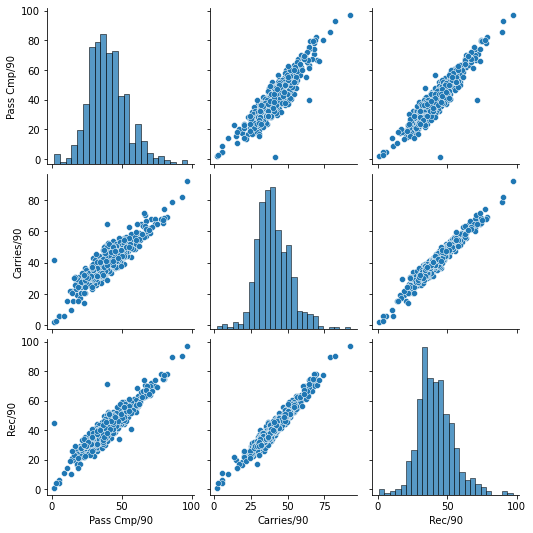

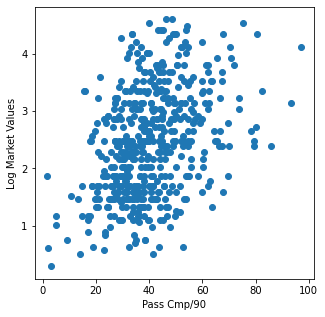

Corrlation coefficient between Pass Cmp/90 and target: (0.39421752979168434, 9.618906803115814e-21)



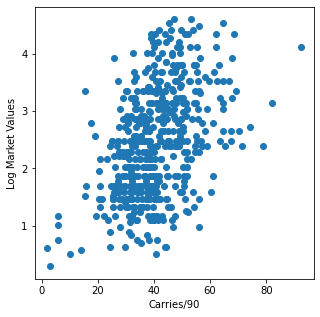

Corrlation coefficient between Carries/90 and target: (0.4404957385846471, 4.7880513210110585e-26)



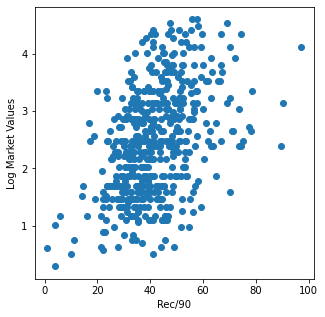

Corrlation coefficient between Rec/90 and target: (0.43655132374815886, 1.461619397539246e-25)



In [698]:
#creating list
high_vifs_mid = ['Pass Cmp/90', 'Carries/90', 'Rec/90']
#checking relationship
CollinearityCheck2(high_vifs_mid, X_midfielder_stats4, log_y_midfielder)

A clear linear trend is present amongst all variables. `Carries/90` will be kept as it has the strongest correlation with the dependent variable.

In [699]:
#creating list
drop_col_mid5 = ['Pass Cmp/90', 'Rec/90']

#dropping columns
X_midfielder_stats5 = X_midfielder_stats4.drop(columns = drop_col_mid5)

#check
X_midfielder_stats5.columns

Index(['90s', 'Gls/90', 'Progressing Passes/90', 'GCA/90',
       'Att Pen Touches/90', 'Carries/90', 'Fouls drawn/90'],
      dtype='object')

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.441
Model:                                   OLS   Adj. R-squared:                  0.433
Method:                        Least Squares   F-statistic:                     57.59
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.21e-60
Time:                               01:22:07   Log-Likelihood:                -551.59
No. Observations:                        519   AIC:                             1119.
Df Residuals:                            511   BIC:                             1153.
Df Model:                                  7                                         
Covariance Type:                   nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

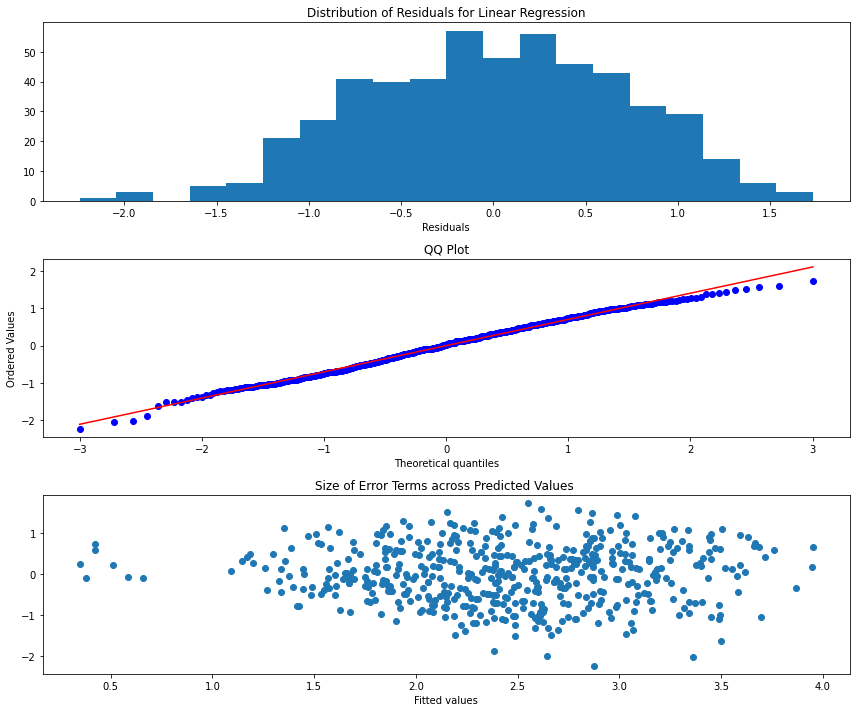

In [700]:
LinReg_Creator(X_midfielder_stats5, log_y_midfielder)

`Progressing Passes/90` has a p-value over the 0.05 threshold and will be dropped. `Att Pen Touches/90` also has a p-value over the threshold, but will be kept as it is lower than `Progressing Passes/90`. I want to see if it is significant once `Progressing Passes/90` is dropped.

In [701]:
#dropping
X_midfielder_stats6 = X_midfielder_stats5.drop('Progressing Passes/90', axis = 1)

#checking
X_midfielder_stats6.columns

Index(['90s', 'Gls/90', 'GCA/90', 'Att Pen Touches/90', 'Carries/90',
       'Fouls drawn/90'],
      dtype='object')

### Midfielder Statistical Linear Regerssion 4

In [702]:
CorrDF_Creator(X_midfielder_stats6, log_y_midfielder)

,Independent Variable,Correlation
3,Att Pen Touches/90,0.213008
5,Fouls drawn/90,0.219088
1,Gls/90,0.296708
2,GCA/90,0.370950
4,Carries/90,0.440496
0,90s,0.482252


In [703]:
VIF_Finder(X_midfielder_stats6)

VIFs for our target variables are shown below


90s                   4.067499
Gls/90                3.339469
GCA/90                5.008408
Att Pen Touches/90    4.557874
Carries/90            8.186017
Fouls drawn/90        5.283448
dtype: float64

All the VIFs are below 10, this is promising.

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.439
Model:                                   OLS   Adj. R-squared:                  0.432
Method:                        Least Squares   F-statistic:                     66.78
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           3.45e-61
Time:                               01:22:16   Log-Likelihood:                -552.51
No. Observations:                        519   AIC:                             1119.
Df Residuals:                            512   BIC:                             1149.
Df Model:                                  6                                         
Covariance Type:                   nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------

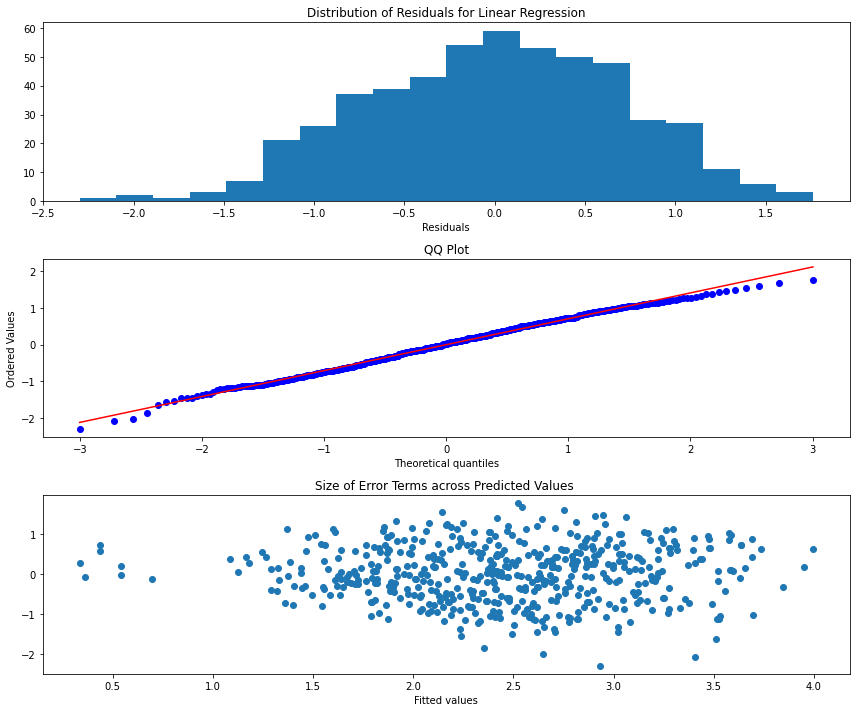

In [704]:
LinReg_Creator(X_midfielder_stats6, log_y_midfielder)

`Att Pen Touches/90` still has a p-value over the threshold and will be dropped. This next regression is likely to be the final regression for midfielders so I will fit it manually.

In [705]:
#dropping
X_final_midfielder = X_midfielder_stats6.drop('Att Pen Touches/90', axis = 1)

#checking
X_final_midfielder.columns

Index(['90s', 'Gls/90', 'GCA/90', 'Carries/90', 'Fouls drawn/90'], dtype='object')

### Final Regression
I am not going to check VIFs as I already know that they are below the threshold. Remvoing a variable will not make the VIFs increase.

In [706]:
#fitting manually
X_final_midfielder_constants = sm.add_constant(X_final_midfielder)

final_midfielder = sm.OLS(log_y_midfielder, X_final_midfielder_constants)
final_midfielder_results = final_midfielder.fit()

#summary
final_midfielder_results.summary()

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     Market Values in Millions   R-squared:                       0.435
Model:                                   OLS   Adj. R-squared:                  0.430
Method:                        Least Squares   F-statistic:                     79.12
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.90e-61
Time:                               01:22:32   Log-Likelihood:                -554.19
No. Observations:                        519   AIC:                             1120.
Df Residuals:                            513   BIC:                             1146.
Df Model:                                  5                                         
Covariance Type:                   nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.3229      0.126      2.568      0.010       0.076       0.570
90s                0.0231      0.002     11.322      0.000       0.019       0.027
Gls/90             1.3055      0.312      4.191      0.000       0.694       1.917
GCA/90             0.5751      0.206      2.791      0.005       0.170       0.980
Carries/90         0.0253      0.003      8.695      0.000       0.020       0.031
Fouls drawn/90     0.1017      0.042      2.420      0.016       0.019       0.184
==============================================================================
Omnibus:                        3.319   Durbin-Watson:                   0.904
Prob(Omnibus):                  0.190   Jarque-Bera (JB):                3.138
Skew:                          -0.135   Prob(JB):                        0.208
Kurtosis:                       2.732   Cond. No.                         554.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

All variables are significant. Now I want to examine their practical effects on a players market value.

In [707]:
#creating final dataframe
final_midfielder_df = pd.DataFrame({'Independent Variable': final_midfielder_results.params.index,
                                 "Coefficient": final_midfielder_results.params.values})


final_midfielder_df['Practical Effect'] = np.expm1(final_midfielder_df['Coefficient'])

final_midfielder_df

,Independent Variable,Coefficient,Practical Effect
0,const,0.322938,0.381180
1,90s,0.023145,0.023415
2,Gls/90,1.305503,2.689545
3,GCA/90,0.575051,0.777220
4,Carries/90,0.025316,0.025639
5,Fouls drawn/90,0.101703,0.107055


Again we see how important scoring is. The two strongest predictors are goal scoring and goal creation. If your play leads to goals, your value increases.

## Attacker Linear Regression

In this section I will perform a linear regression on the attacker `Position Group`.

### Removing Insignificant Correlations

As I have done in the previous, I am going to remove all independent variables whose correlations coefficients have a p-value above the significance threshold of 0.05. I will be dropping `Club Tier` as well

In [708]:
#instantiating list
drop_cols_attack =['Club Tier']
#looping through columns
for col in X_attacker.columns:
    fval, pval = pearsonr(X_attacker[col], log_y_attacker)
    
    if pval > 0.05:
        drop_cols_attack.append(col)
        
print(len(drop_cols_attack))
drop_cols_attack

17


['Club Tier',
 'Age',
 'Red Cards/90',
 'Successful Box Crosses/90',
 'Passes under pressure/90',
 'Tkl Success Rate',
 'Tkl vs. dribbles Success Rate',
 'Blocks/90',
 'Int/90',
 'Errors/90',
 'Bad Dribbles /90',
 'Fouls drawn/90',
 'PKs won/90',
 'PKs conceded/90',
 'Loose Balls Recov/90',
 'Aerial Battle Success Rate',
 'European']

These will be removed in the next step.

### Checking for Collinearity amongst similiar variables

The purpose of this section is to remove independent variables of similar statistics. 

In [709]:
#creating X_attacker_stats
X_attacker_stats = X_attacker.drop(columns=drop_cols_attack)

#Check
X_attacker_stats.columns

Index(['90s', 'Gls/90', 'Ast/90', 'PK/90', 'Non PK Gls/90', 'Yellow Cards/90',
       'xG/90', 'non PK xG/90', 'xA/90', 'Shots/90', 'Shots on Target/90',
       'Free Kicks/90', 'Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
       'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
       'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Attacking Passes/90',
       'Progressing Passes/90', 'Through Balls/90', 'Switches/90',
       'Crosses/90', 'Bad Passes/90', 'SCA/90', 'GCA/90', 'Tkl Won/90',
       'Tkl vs Dribbles/90', 'Successful Presses/90', 'Press Success Rate',
       'Clearances/90', 'Touches/90', 'Mid 3rd Touches/90',
       'Att 3rd Touchs/90', 'Att Pen Touches/90', 'Successful Dribbles/90',
       'Dribble Success Rate', 'Carries/90', 'Progressive Carries/90',
       'Attacking Carries/90', 'Rec/90', 'Rec Success Rate',
       'Fouls Committed/90', 'Aerial Battles Won/90', 'subg_Winger'],
      dtype='object')

Now I will create lists to put through the collinearity checks.

In [710]:
#creating lists
attack_scoring= ['Gls/90', 'PK/90', 'Non PK Gls/90',
                'xG/90', 'non PK xG/90']
attack_shooting = ['Shots/90', 'Shots on Target/90']
attack_attacking_passes = ['Ast/90','xA/90','Attacking Passes/90',
                            'Progressing Passes/90', 'Through Balls/90']
attack_passes = ['Pass Cmp/90', 'Pass Cmp Pctg', 'Short Pass Cmp/90',
                 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg',
                 'Long Pass Cmp/90', 'Long Pass Cmp Pctg']
attack_crosses_switches = ['Switches/90','Crosses/90']
attack_creation = ['SCA/90', 'GCA/90']
attack_defense = ['Tkl Won/90','Tkl vs Dribbles/90', 'Clearances/90']
attack_press = ['Successful Presses/90', 'Press Success Rate']
attack_touches = ['Touches/90', 'Mid 3rd Touches/90',
                   'Att 3rd Touchs/90', 'Att Pen Touches/90']
attack_dribbles_carries = ['Successful Dribbles/90','Dribble Success Rate', 
                           'Carries/90', 'Progressive Carries/90','Attacking Carries/90']
attack_rec = ['Rec/90', 'Rec Success Rate']
attack_fouls = ['Yellow Cards/90','Fouls Committed/90']

attack_lists = ['attack_scoring_shooting','attack_attacking_passes', 'attack_passes',
               'attack_crosses_switches', 'attack_creation', 'attack_defense',
               'atttack_press', 'attack_touches', 'attack_dribbles_carries',
               'attack_rec', 'attack_fouls']

In [711]:
#for reference
attack_lists

['attack_scoring_shooting',
 'attack_attacking_passes',
 'attack_passes',
 'attack_crosses_switches',
 'attack_creation',
 'attack_defense',
 'atttack_press',
 'attack_touches',
 'attack_dribbles_carries',
 'attack_rec',
 'attack_fouls']

##### Attacker Scoring Shooting Collinearity Check

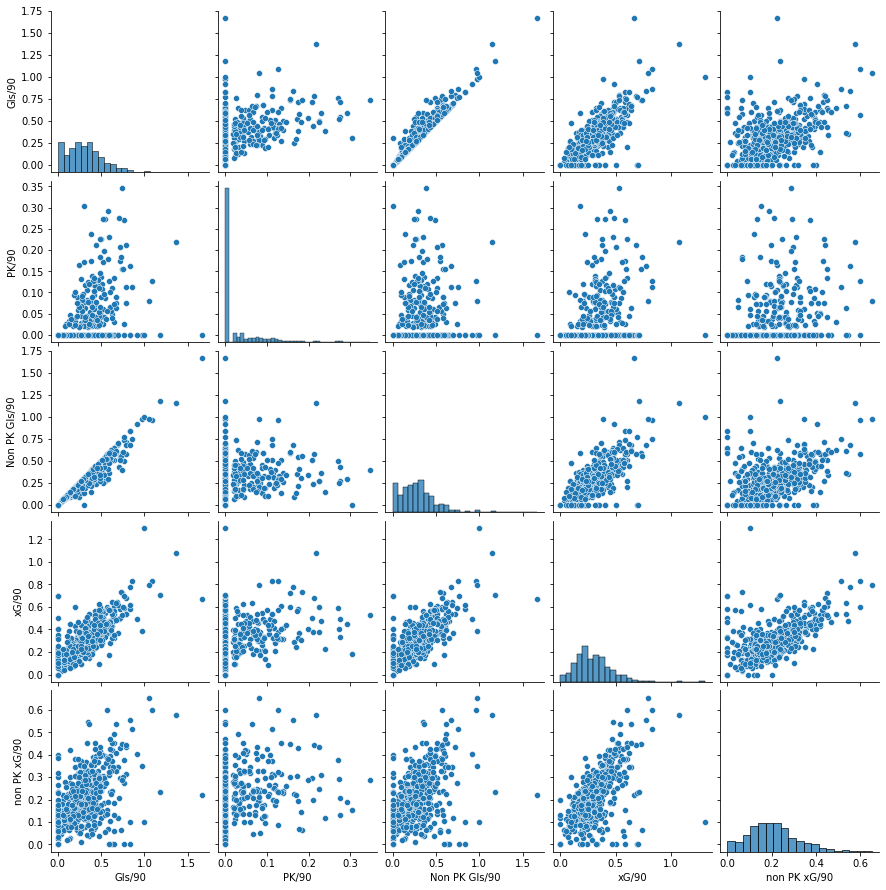

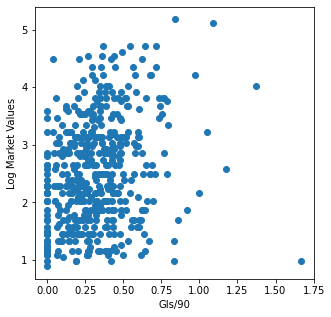

Corrlation coefficient between Gls/90 and target: (0.26429801111994333, 2.7208903012024218e-09)



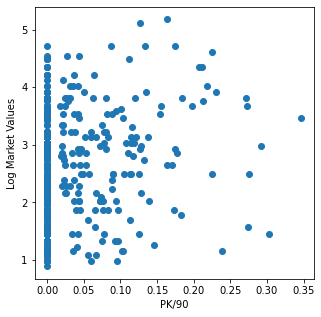

Corrlation coefficient between PK/90 and target: (0.21943876181362992, 9.106912786687882e-07)



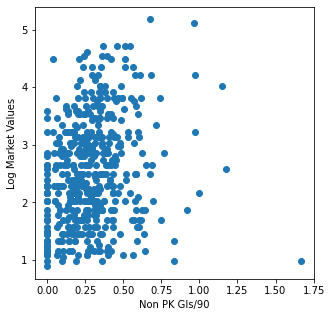

Corrlation coefficient between Non PK Gls/90 and target: (0.22604463863789084, 4.1551568008340797e-07)



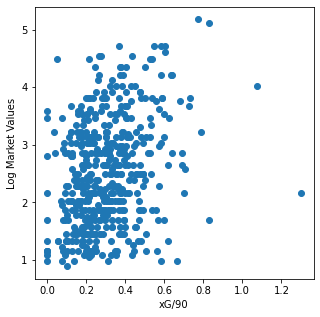

Corrlation coefficient between xG/90 and target: (0.30097946833892814, 9.704448914875246e-12)



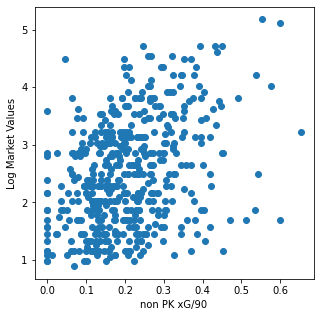

Corrlation coefficient between non PK xG/90 and target: (0.3686092651179458, 3.0080539613562565e-17)



In [712]:
CollinearityCheck2(attack_scoring, X_attacker_stats, log_y_attacker)

`non PK xG/90` will be kept it has the stronger correlation with the target variable. 

In [713]:
#creating and appending
drop_col_attack2 = attack_scoring[:-1]

#cheking
drop_col_attack2

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90']

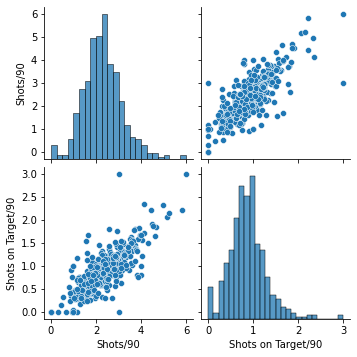

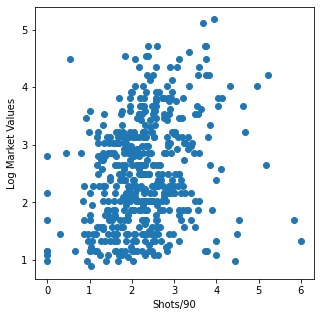

Corrlation coefficient between Shots/90 and target: (0.26874183778753563, 1.4357539620955084e-09)



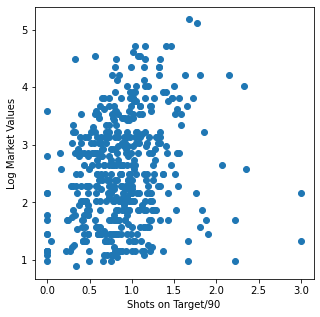

Corrlation coefficient between Shots on Target/90 and target: (0.23180713797642682, 2.054605034444095e-07)



In [714]:
CollinearityCheck2(attack_shooting, X_attacker_stats, log_y_attacker)

`Shots/90` has the stronger correlation coeffiecient so it will be kept. 

In [715]:
#appending
drop_col_attack2.append('Shots on Target/90')

#checking
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90']


Now I will check collinearity between the two remaining variables


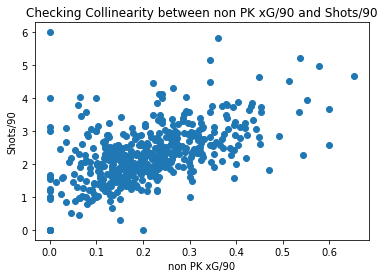

In [716]:
#scatter plot of non pk goals and shots/90
plt.figure()
plt.scatter(X_attacker_stats['non PK xG/90'],
            X_attacker_stats['Shots/90'])
plt.xlabel('non PK xG/90')
plt.ylabel('Shots/90')
plt.title('Checking Collinearity between non PK xG/90 and Shots/90')
plt.show()

There exists a clear linear trend, and above we see that `non PK xG/90` has a higher correlation coefficient with the dependent variable, so `Shots/90` will be dropped. 

In [717]:
#dropping
drop_col_attack2.append('Shots/90')

#checking
drop_col_attack2

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90']

#### Attacker Attacking Passes Collinearity Check

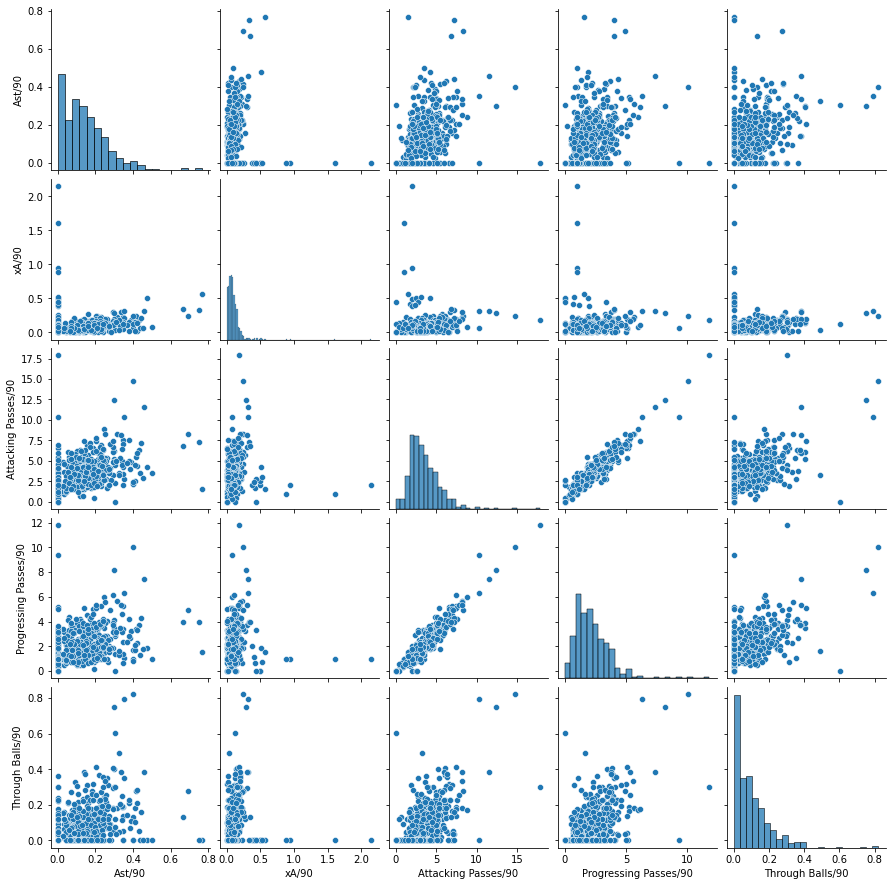

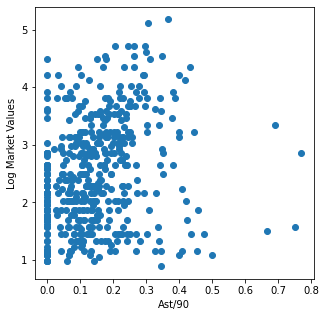

Corrlation coefficient between Ast/90 and target: (0.23856342450646303, 8.786745885389137e-08)



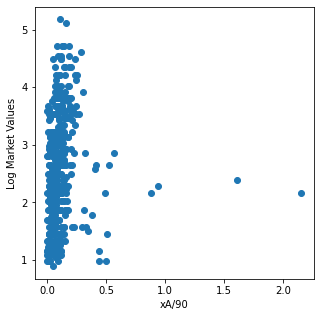

Corrlation coefficient between xA/90 and target: (0.09141397095967796, 0.04290061338935058)



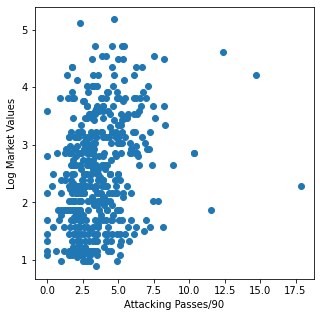

Corrlation coefficient between Attacking Passes/90 and target: (0.28086747435358767, 2.3623499832126617e-10)



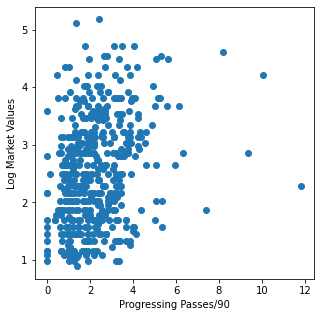

Corrlation coefficient between Progressing Passes/90 and target: (0.28708371437195646, 9.046758234886952e-11)



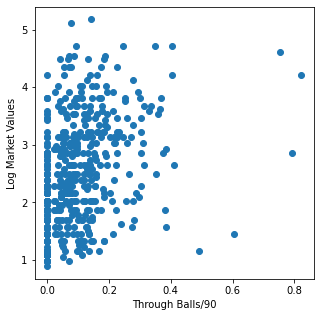

Corrlation coefficient between Through Balls/90 and target: (0.3393265957028952, 1.0725580983903769e-14)



In [718]:
CollinearityCheck2(attack_attacking_passes, X_attacker_stats, log_y_attacker)

`xA/90` can be dropped as it's coefficient is below 0.2, the threshold set in the defender statistical regression section. 

`Through Balls/90` has the highest correlation and will be the only one checked. From last section, I know that these variables will cause collinearity, so I'm just going to drop all but the highest. 

In [719]:
#appending
drop_col_attack2 = drop_col_attack2 + attack_attacking_passes[:-1]

#checking
drop_col_attack2

['Gls/90',
 'PK/90',
 'Non PK Gls/90',
 'xG/90',
 'Shots on Target/90',
 'Shots/90',
 'Ast/90',
 'xA/90',
 'Attacking Passes/90',
 'Progressing Passes/90']

#### Attacker Passing Collinearity Check

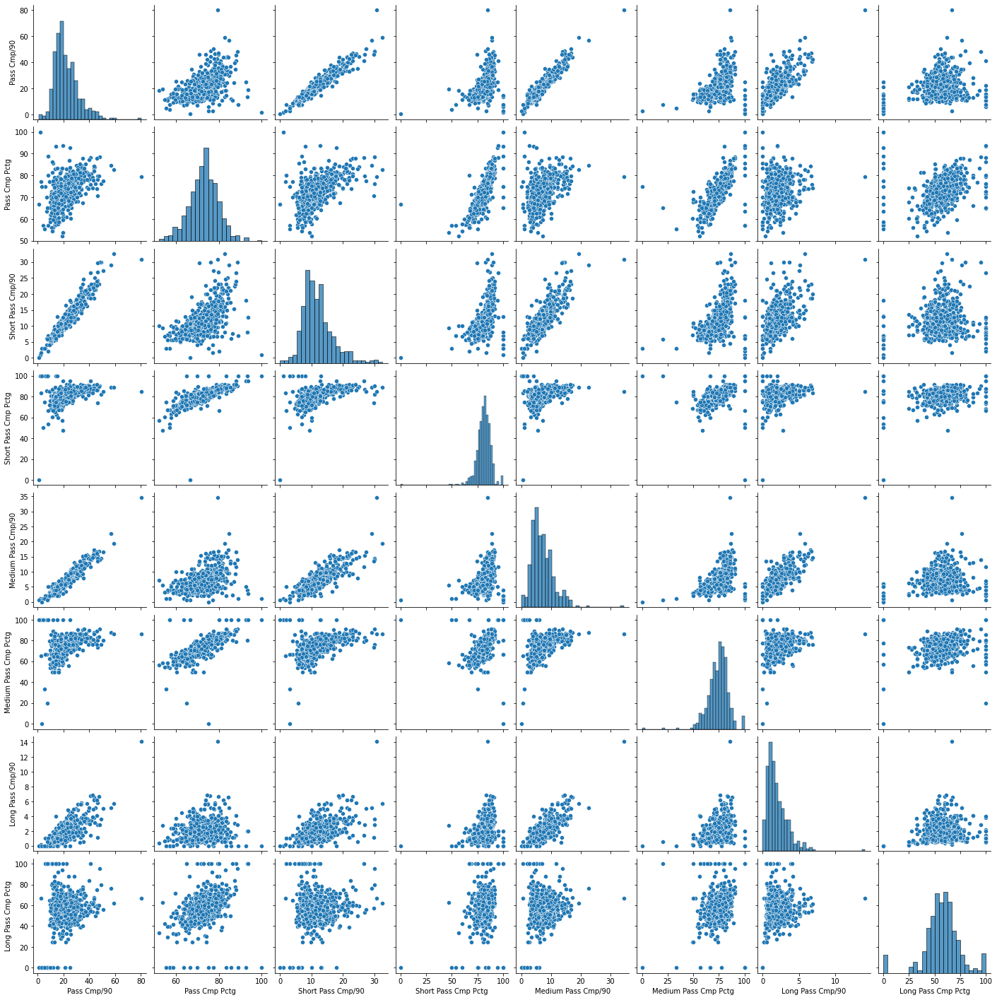

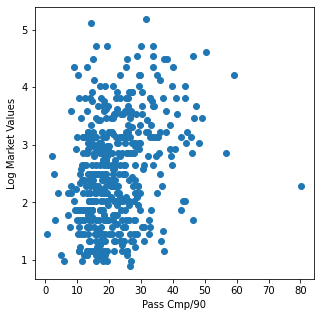

Corrlation coefficient between Pass Cmp/90 and target: (0.30430229823791843, 5.5885327871088666e-12)



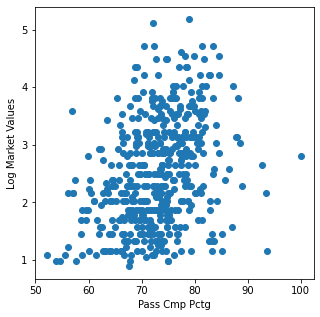

Corrlation coefficient between Pass Cmp Pctg and target: (0.332641374719692, 3.771293284805873e-14)



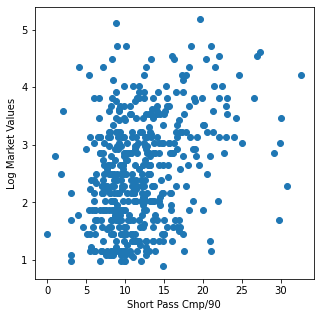

Corrlation coefficient between Short Pass Cmp/90 and target: (0.32577190237284426, 1.33012507846231e-13)



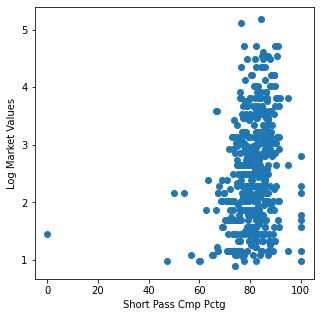

Corrlation coefficient between Short Pass Cmp Pctg and target: (0.24306333331866564, 4.919323975979365e-08)



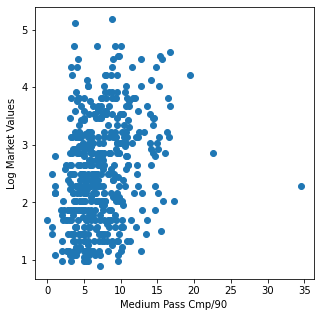

Corrlation coefficient between Medium Pass Cmp/90 and target: (0.2818879924829008, 2.0212329110456968e-10)



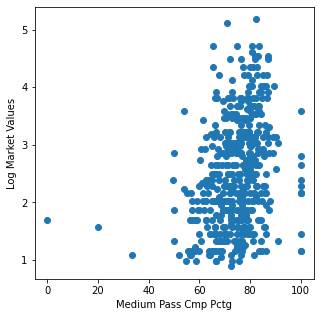

Corrlation coefficient between Medium Pass Cmp Pctg and target: (0.29381189776205463, 3.116155966279624e-11)



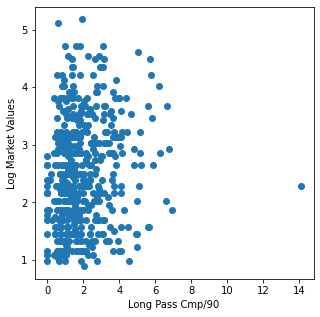

Corrlation coefficient between Long Pass Cmp/90 and target: (0.1402384414943529, 0.001839681864123959)



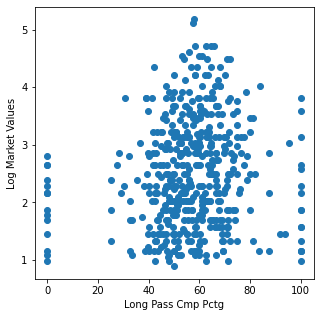

Corrlation coefficient between Long Pass Cmp Pctg and target: (0.10415877515290232, 0.020976698538970065)



In [720]:
CollinearityCheck2(attack_passes, X_attacker_stats, log_y_attacker)

I am going to keep `Passing Cmp Pctg`, it has the strongest correlation with the dependent variable.

In [721]:
#appending
drop_col_attack2.append('Pass Cmp/90')
drop_col_attack2 = drop_col_attack2 + attack_passes[2:]

#check
drop_col_attack2

['Gls/90',
 'PK/90',
 'Non PK Gls/90',
 'xG/90',
 'Shots on Target/90',
 'Shots/90',
 'Ast/90',
 'xA/90',
 'Attacking Passes/90',
 'Progressing Passes/90',
 'Pass Cmp/90',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg']

#### Attacker Crosses and Switches Collinearity Check

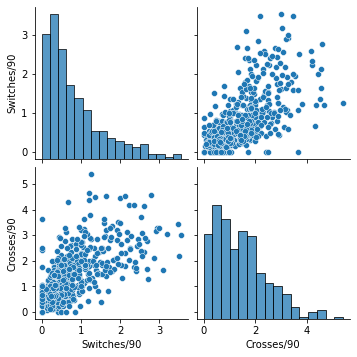

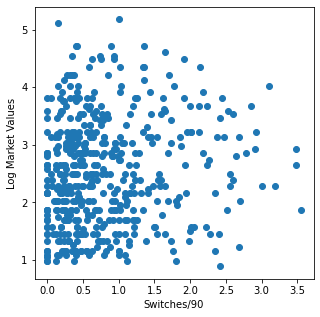

Corrlation coefficient between Switches/90 and target: (0.11711349189941636, 0.009393495700730689)



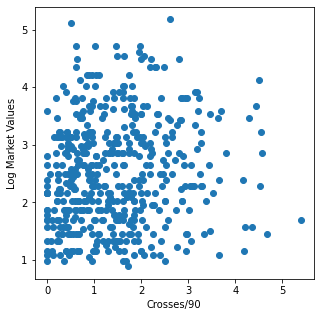

Corrlation coefficient between Crosses/90 and target: (0.12026140726771169, 0.007636992600303944)



In [722]:
CollinearityCheck2(attack_crosses_switches, X_attacker_stats, log_y_attacker)

Neither of these meet the threshold so they will be dropped.

In [723]:
#apppending
drop_col_attack2 = drop_col_attack2 + attack_crosses_switches

#checking
drop_col_attack2

['Gls/90',
 'PK/90',
 'Non PK Gls/90',
 'xG/90',
 'Shots on Target/90',
 'Shots/90',
 'Ast/90',
 'xA/90',
 'Attacking Passes/90',
 'Progressing Passes/90',
 'Pass Cmp/90',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Switches/90',
 'Crosses/90']

#### Attacker Creation Collinearity Check

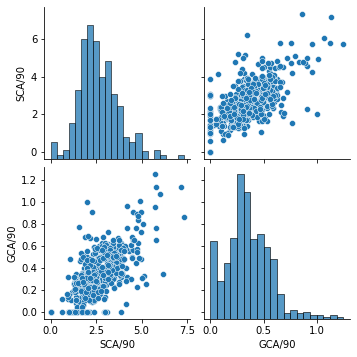

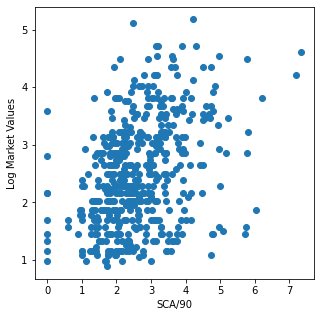

Corrlation coefficient between SCA/90 and target: (0.3703666632384346, 2.0728850059641197e-17)



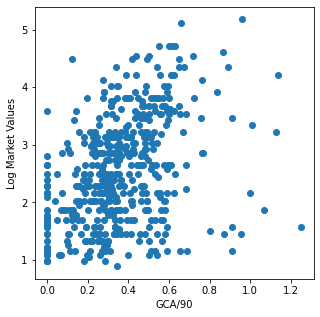

Corrlation coefficient between GCA/90 and target: (0.386326318552348, 6.339143692419981e-19)



In [724]:
CollinearityCheck2(attack_creation, X_attacker_stats, log_y_attacker)

`GCA` will be kept. It has the stronger correlation to the dependent variable.

In [725]:
#appending
drop_col_attack2.append('SCA/90')

#check
drop_col_attack2


['Gls/90',
 'PK/90',
 'Non PK Gls/90',
 'xG/90',
 'Shots on Target/90',
 'Shots/90',
 'Ast/90',
 'xA/90',
 'Attacking Passes/90',
 'Progressing Passes/90',
 'Pass Cmp/90',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Switches/90',
 'Crosses/90',
 'SCA/90']

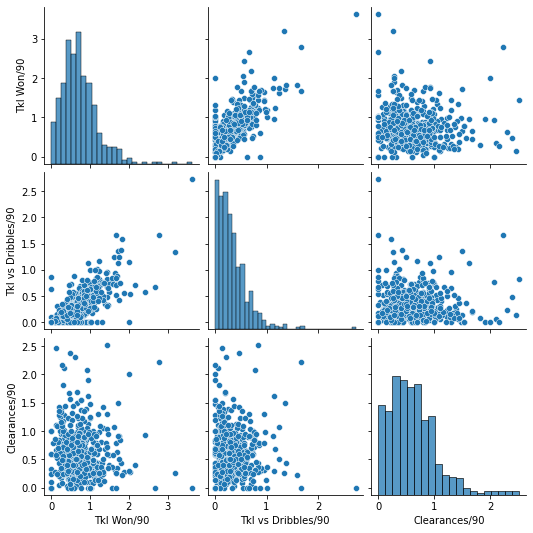

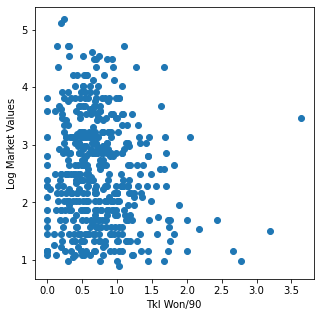

Corrlation coefficient between Tkl Won/90 and target: (-0.12468296278555771, 0.005665269460163609)



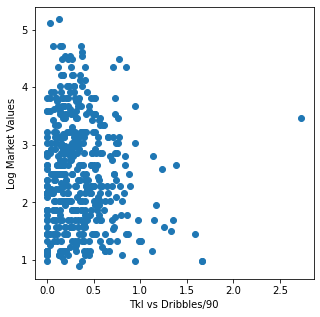

Corrlation coefficient between Tkl vs Dribbles/90 and target: (-0.08998681639070526, 0.046268328461002164)



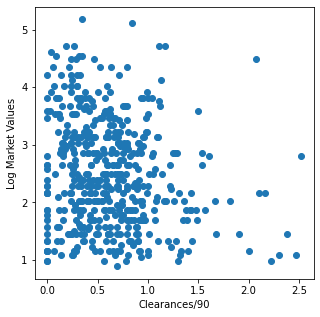

Corrlation coefficient between Clearances/90 and target: (-0.17109050971482948, 0.00013920606767189742)



In [726]:
CollinearityCheck2(attack_defense, X_attacker_stats, log_y_attacker)

None of these correlation coefficients are above 0.2 and thus all independent variables will be dropped.

In [729]:
#appending
drop_col_attack2 = drop_col_attack2 + attack_defense

#check
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90', 'Ast/90', 'xA/90', 'Attacking Passes/90', 'Progressing Passes/90', 'Pass Cmp/90', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Switches/90', 'Crosses/90', 'SCA/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90']


#### Attacker Pressing Collinearity Check

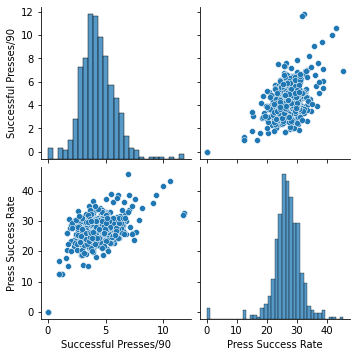

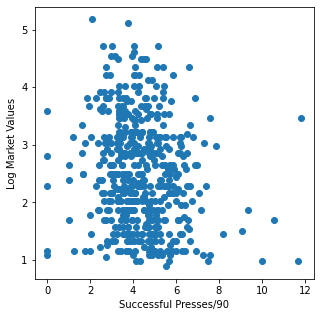

Corrlation coefficient between Successful Presses/90 and target: (-0.14475607484120592, 0.001298273925296075)



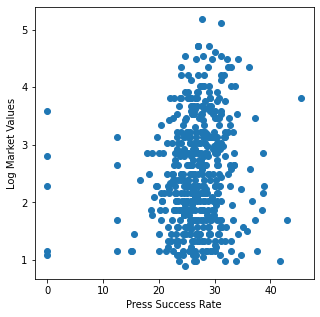

Corrlation coefficient between Press Success Rate and target: (0.1234167279536667, 0.00617695109237662)



In [730]:
CollinearityCheck2(attack_press, X_attacker_stats, log_y_attacker)

None of these correlation coefficients are above 0.2 and thus all independent variables will be dropped.

In [731]:
#appending
drop_col_attack2 = drop_col_attack2 + attack_press

#check
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90', 'Ast/90', 'xA/90', 'Attacking Passes/90', 'Progressing Passes/90', 'Pass Cmp/90', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Switches/90', 'Crosses/90', 'SCA/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Successful Presses/90', 'Press Success Rate']


#### Attacker Touches Collinearity Check

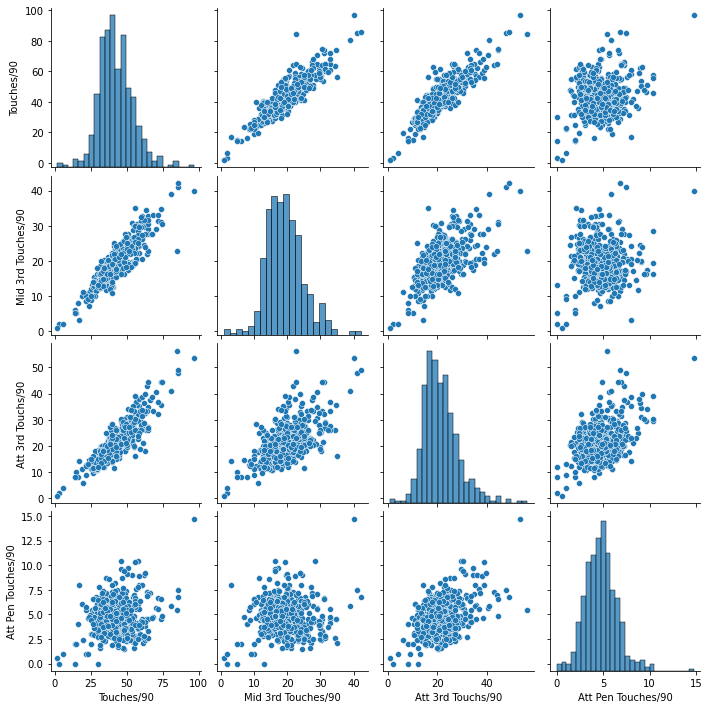

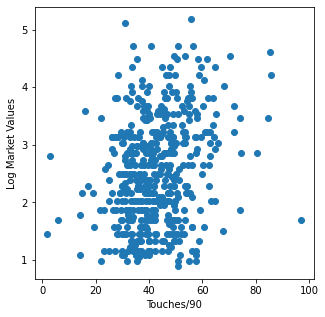

Corrlation coefficient between Touches/90 and target: (0.2585232057194259, 6.136355118796648e-09)



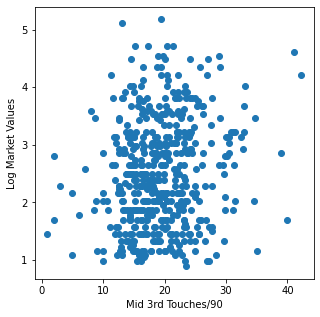

Corrlation coefficient between Mid 3rd Touches/90 and target: (0.15460530975389358, 0.000586493571959493)



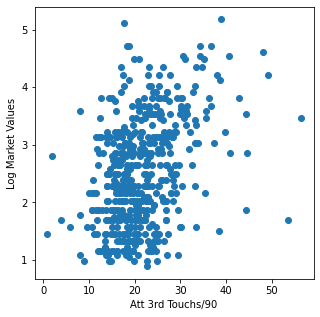

Corrlation coefficient between Att 3rd Touchs/90 and target: (0.37995203834834973, 2.611976828668765e-18)



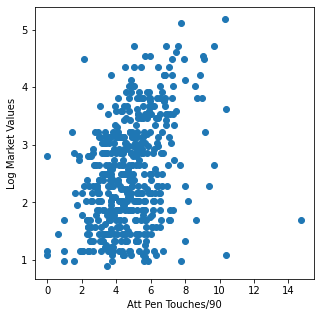

Corrlation coefficient between Att Pen Touches/90 and target: (0.35993595068218454, 1.8280053049462105e-16)



In [732]:
CollinearityCheck2(attack_touches, X_attacker_stats, log_y_attacker)

`Att 3rd Touchs/90` will remain. It has a linear relationship with the other independent variables and the strongest correlation to the dependent variable.

In [733]:
#appending
drop_col_attack2.append('Att Pen Touches/90')
drop_col_attack2 = drop_col_attack2 + attack_touches[:2]

#checkin
drop_col_attack2

['Gls/90',
 'PK/90',
 'Non PK Gls/90',
 'xG/90',
 'Shots on Target/90',
 'Shots/90',
 'Ast/90',
 'xA/90',
 'Attacking Passes/90',
 'Progressing Passes/90',
 'Pass Cmp/90',
 'Short Pass Cmp/90',
 'Short Pass Cmp Pctg',
 'Medium Pass Cmp/90',
 'Medium Pass Cmp Pctg',
 'Long Pass Cmp/90',
 'Long Pass Cmp Pctg',
 'Switches/90',
 'Crosses/90',
 'SCA/90',
 'Tkl Won/90',
 'Tkl vs Dribbles/90',
 'Clearances/90',
 'Tkl Won/90',
 'Tkl vs Dribbles/90',
 'Clearances/90',
 'Successful Presses/90',
 'Press Success Rate',
 'Att Pen Touches/90',
 'Touches/90',
 'Mid 3rd Touches/90']

#### Attacker Carries Collinearity Check

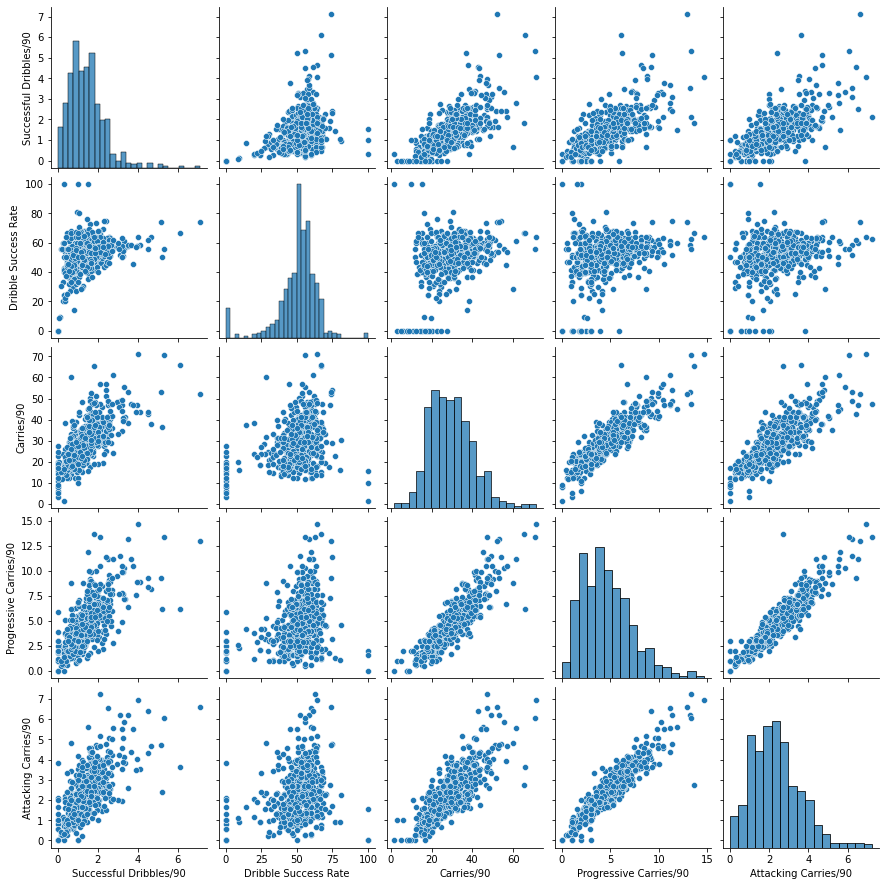

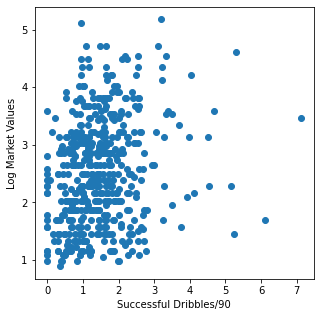

Corrlation coefficient between Successful Dribbles/90 and target: (0.22820968581496806, 3.196057646218697e-07)



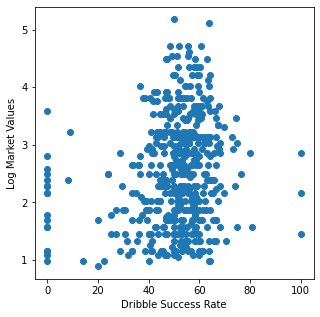

Corrlation coefficient between Dribble Success Rate and target: (0.1871056261343629, 3.0151460559045904e-05)



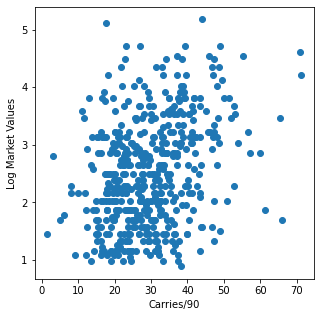

Corrlation coefficient between Carries/90 and target: (0.32001266158971253, 3.734719975767121e-13)



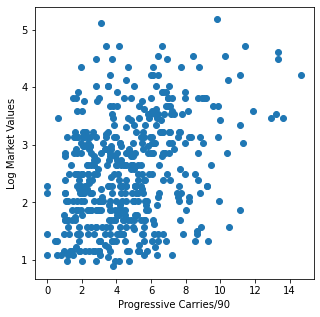

Corrlation coefficient between Progressive Carries/90 and target: (0.35147888014030526, 1.0078903544203182e-15)



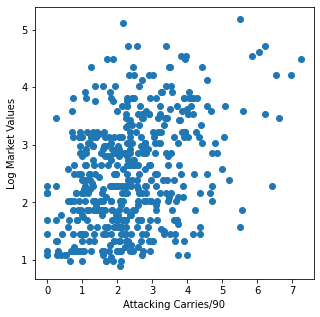

Corrlation coefficient between Attacking Carries/90 and target: (0.3658810346009881, 5.337917596786429e-17)



In [734]:
CollinearityCheck2(attack_dribbles_carries, X_attacker_stats, log_y_attacker)

`Attacking Carries/90` will remain. It has a linear relationship with all independent variables with correlations > 0.2, and the strongest correlation to the dependent variable.

In [735]:
#appending
drop_col_attack2 = drop_col_attack2 + attack_dribbles_carries[:-1]

#check
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90', 'Ast/90', 'xA/90', 'Attacking Passes/90', 'Progressing Passes/90', 'Pass Cmp/90', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Switches/90', 'Crosses/90', 'SCA/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Successful Presses/90', 'Press Success Rate', 'Att Pen Touches/90', 'Touches/90', 'Mid 3rd Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate', 'Carries/90', 'Progressive Carries/90']


#### Attacker Reception Collinearity Check

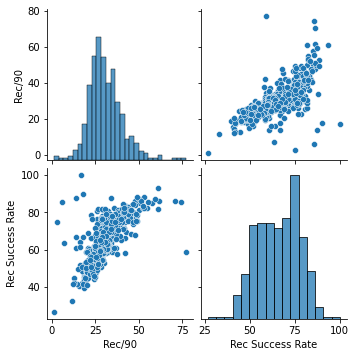

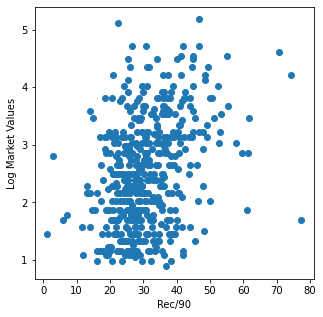

Corrlation coefficient between Rec/90 and target: (0.34299771946692903, 5.307375866299575e-15)



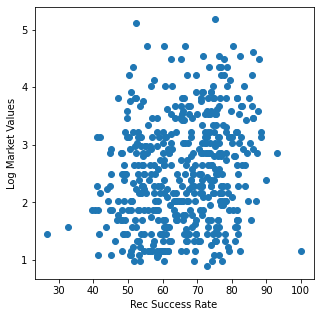

Corrlation coefficient between Rec Success Rate and target: (0.21611171810174543, 1.339862940677993e-06)



In [736]:
CollinearityCheck2(attack_rec, X_attacker_stats, log_y_attacker)

Rec Success Rate will be dropped

In [737]:
#append
drop_col_attack2.append('Rec Success Rate')

#check
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90', 'Ast/90', 'xA/90', 'Attacking Passes/90', 'Progressing Passes/90', 'Pass Cmp/90', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Switches/90', 'Crosses/90', 'SCA/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Successful Presses/90', 'Press Success Rate', 'Att Pen Touches/90', 'Touches/90', 'Mid 3rd Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate', 'Carries/90', 'Progressive Carries/90', 'Rec Success Rate']


#### Attacker Fouls Collinearity Check

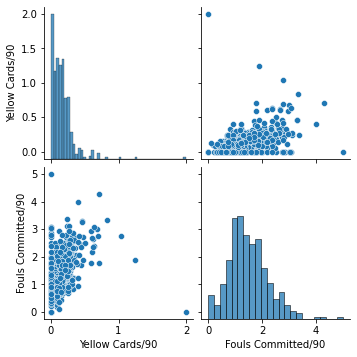

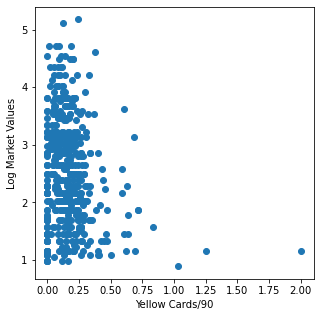

Corrlation coefficient between Yellow Cards/90 and target: (-0.1756472759308168, 9.12990834031138e-05)



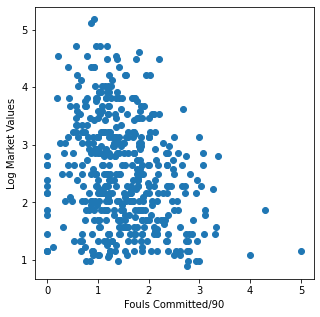

Corrlation coefficient between Fouls Committed/90 and target: (-0.24839847315070138, 2.43621848574138e-08)



In [738]:
CollinearityCheck2(attack_fouls, X_attacker_stats, log_y_attacker)

`Yellow Cards/90` does not meet the correlation threshold, and thus will be dropped. 

In [739]:
#appending

In [740]:
#appending
drop_col_attack2.append('Yellow Cards/90')

#checking
print(drop_col_attack2)

['Gls/90', 'PK/90', 'Non PK Gls/90', 'xG/90', 'Shots on Target/90', 'Shots/90', 'Ast/90', 'xA/90', 'Attacking Passes/90', 'Progressing Passes/90', 'Pass Cmp/90', 'Short Pass Cmp/90', 'Short Pass Cmp Pctg', 'Medium Pass Cmp/90', 'Medium Pass Cmp Pctg', 'Long Pass Cmp/90', 'Long Pass Cmp Pctg', 'Switches/90', 'Crosses/90', 'SCA/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Tkl Won/90', 'Tkl vs Dribbles/90', 'Clearances/90', 'Successful Presses/90', 'Press Success Rate', 'Att Pen Touches/90', 'Touches/90', 'Mid 3rd Touches/90', 'Successful Dribbles/90', 'Dribble Success Rate', 'Carries/90', 'Progressive Carries/90', 'Rec Success Rate', 'Yellow Cards/90']


Now I can drop these columns. 

In [741]:
#dropping
X_attacker_stats.drop(columns=drop_col_attack2, inplace = True)

#checking
X_attacker_stats.columns

Index(['90s', 'non PK xG/90', 'Free Kicks/90', 'Pass Cmp Pctg',
       'Through Balls/90', 'Bad Passes/90', 'GCA/90', 'Att 3rd Touchs/90',
       'Attacking Carries/90', 'Rec/90', 'Fouls Committed/90',
       'Aerial Battles Won/90', 'subg_Winger'],
      dtype='object')

In [742]:
print(f"There are {len(X_attacker_stats.columns)} independent variables remaining")

There are 13 independent variables remaining


### Checking for Low Correlations
Most of these variables have been removed, but some independent variables were not in any of the lists checked above, so I will check again. 

In [743]:
#creating correlations list
corr_attack = []

#creating drop columns list
drop_col_attack3 = []

#looping through columns
for col in X_attacker_stats.columns:
    #finding correlation
    corr, pval = pearsonr(X_attacker_stats[col], log_y_attacker)
    #dropping if below threshold
    if np.abs(corr) < 0.2:
        drop_col_attack3.append(col)
    #keeping if above threshold
    else:
        corr_attack.append(corr)
        
#dropping columns
X_attacker_stats.drop(columns=drop_col_attack3, inplace=True)

#creating dataframe
corr_attack_df = pd.DataFrame({'Independent Variable': X_attacker_stats.columns,
                                   'Correlation': corr_attack})

corr_attack_df

,Independent Variable,Correlation
0,90s,0.476423
1,non PK xG/90,0.368609
2,Pass Cmp Pctg,0.332641
3,Through Balls/90,0.339327
4,GCA/90,0.386326
5,Att 3rd Touchs/90,0.379952
6,Attacking Carries/90,0.365881
7,Rec/90,0.342998
8,Fouls Committed/90,-0.248398
9,Aerial Battles Won/90,-0.211923


Five varialbes were removed. Now we are ready to begin modeling. 

### Attacker Statistical Linear Regression 1

#### Premodel Check
We can use the data frame above to look at linearity. There appears to be some moderate linear relationships present in this model.

Now I will examine collinearity through VIFs.

In [744]:
#pulling
VIF_Finder(X_attacker_stats)

VIFs for our target variables are shown below


90s                       4.379128
non PK xG/90              6.400716
Pass Cmp Pctg            20.573976
Through Balls/90          2.592262
GCA/90                    6.370237
Att 3rd Touchs/90        78.415702
Attacking Carries/90     12.553122
Rec/90                   79.669085
Fouls Committed/90        5.516311
Aerial Battles Won/90     2.905497
dtype: float64

There are two highly collinear variables in the set of independent variables. I will wait to examine these two together to see if either of their coefficient will be insignificant.

### Attacker Regression 1

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.447
Model:                                   OLS   Adj. R-squared:                  0.435
Method:                        Least Squares   F-statistic:                     38.74
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.25e-55
Time:                               01:29:09   Log-Likelihood:                -512.71
No. Observations:                        491   AIC:                             1047.
Df Residuals:                            480   BIC:                             1094.
Df Model:                                 10                                         
Covariance Type:                   nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------

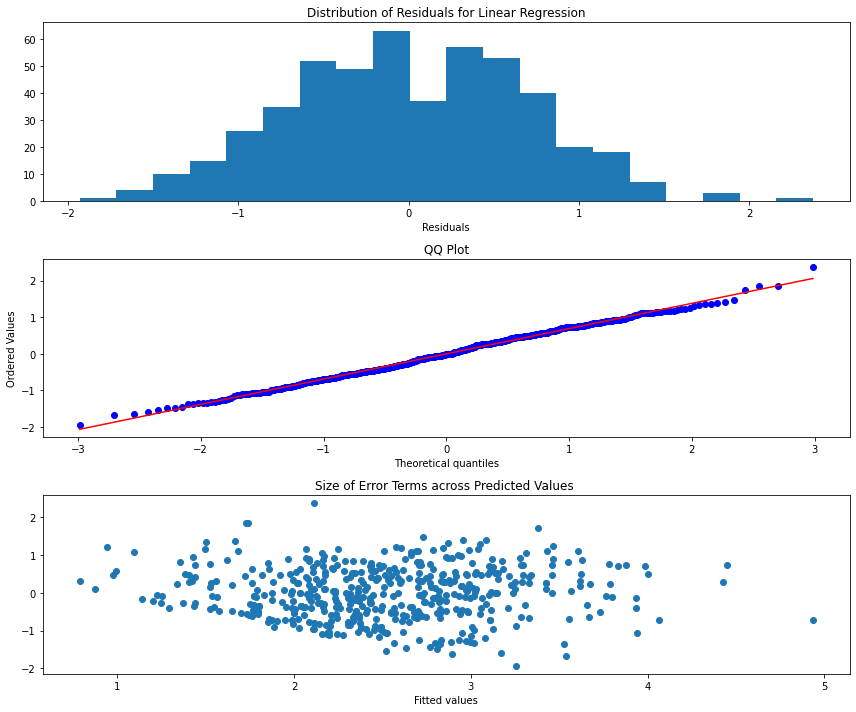

In [745]:
LinReg_Creator(X_attacker_stats, log_y_attacker)

I can remove `Aerial Battles Won/90` and `Fouls Committed/90` as their regression coefficients were not found to be statistically significant.

In [746]:
#dropping two above columns
X_attacker_stats2 = X_attacker_stats.drop(columns = ['Aerial Battles Won/90',
                                                     'Fouls Committed/90'])
#checking
X_attacker_stats2

,90s,non PK xG/90,Pass Cmp Pctg,Through Balls/90,GCA/90,Att 3rd Touchs/90,Attacking Carries/90,Rec/90
0,45.1,0.450111,72.379032,0.243902,0.598670,18.847007,2.572062,26.518847
1,57.3,0.431065,81.338360,0.349040,0.628272,34.240838,3.403141,41.815009
2,57.1,0.392294,70.524297,0.402802,0.612960,18.318739,2.311734,30.945709
3,41.8,0.267943,78.195977,0.071770,0.502392,30.478469,3.827751,41.363636
4,37.5,0.258667,79.806808,0.186667,0.720000,40.693333,5.840000,54.933333
...,...,...,...,...,...,...,...,...
486,2.9,0.206897,74.509804,0.000000,0.689655,17.931034,2.068966,22.068966
487,1.0,0.100000,70.000000,0.000000,0.000000,12.000000,2.000000,16.000000
488,28.7,0.156794,79.328165,0.000000,0.209059,19.721254,1.567944,27.630662
489,15.5,0.129032,71.907216,0.000000,0.193548,20.709677,3.741935,28.903226


### Attacker Linear Regression 2


#### Pre Model Checks

In [747]:
#correlation data frame
CorrDF_Creator(X_attacker_stats2, log_y_attacker)

,Independent Variable,Correlation
2,Pass Cmp Pctg,0.332641
3,Through Balls/90,0.339327
7,Rec/90,0.342998
6,Attacking Carries/90,0.365881
1,non PK xG/90,0.368609
5,Att 3rd Touchs/90,0.379952
4,GCA/90,0.386326
0,90s,0.476423


In [748]:
#VIF Finder
VIF_Finder(X_attacker_stats2)

VIFs for our target variables are shown below


90s                      4.290628
non PK xG/90             6.058367
Pass Cmp Pctg           16.523099
Through Balls/90         2.506624
GCA/90                   6.328765
Att 3rd Touchs/90       77.572910
Attacking Carries/90    11.229293
Rec/90                  75.666548
dtype: float64

Removing the two variables above did not effect the high VIFs of `rec/90` and `Att 3rd Touches/90`. I will now examine their relationship with eachother.

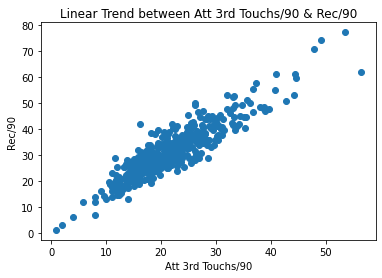

In [750]:
#relationship between above independent variables
plt.figure()
plt.scatter(X_attacker_stats2['Att 3rd Touchs/90'],
           X_attacker_stats2['Rec/90'])
plt.xlabel('Att 3rd Touchs/90')
plt.ylabel('Rec/90')
plt.title('Linear Trend between Att 3rd Touchs/90 & Rec/90')
plt.show()

As there is a clear linear trend between these independent variable, I am going to drop the independent variable with the weaker correlation to the dependent variable. Therefore, I will be dropping `Rec/90`.

In [751]:
#dropping
X_attacker_stats3 = X_attacker_stats2.drop(['Rec/90'], axis = 1)

#checking
X_attacker_stats3.head()

,90s,non PK xG/90,Pass Cmp Pctg,Through Balls/90,GCA/90,Att 3rd Touchs/90,Attacking Carries/90
0,45.1,0.450111,72.379032,0.243902,0.598670,18.847007,2.572062
1,57.3,0.431065,81.338360,0.349040,0.628272,34.240838,3.403141
2,57.1,0.392294,70.524297,0.402802,0.612960,18.318739,2.311734
3,41.8,0.267943,78.195977,0.071770,0.502392,30.478469,3.827751
4,37.5,0.258667,79.806808,0.186667,0.720000,40.693333,5.840000


#### Linear Regression 

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.427
Model:                                   OLS   Adj. R-squared:                  0.419
Method:                        Least Squares   F-statistic:                     51.43
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.29e-54
Time:                               01:29:58   Log-Likelihood:                -521.23
No. Observations:                        491   AIC:                             1058.
Df Residuals:                            483   BIC:                             1092.
Df Model:                                  7                                         
Covariance Type:                   nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

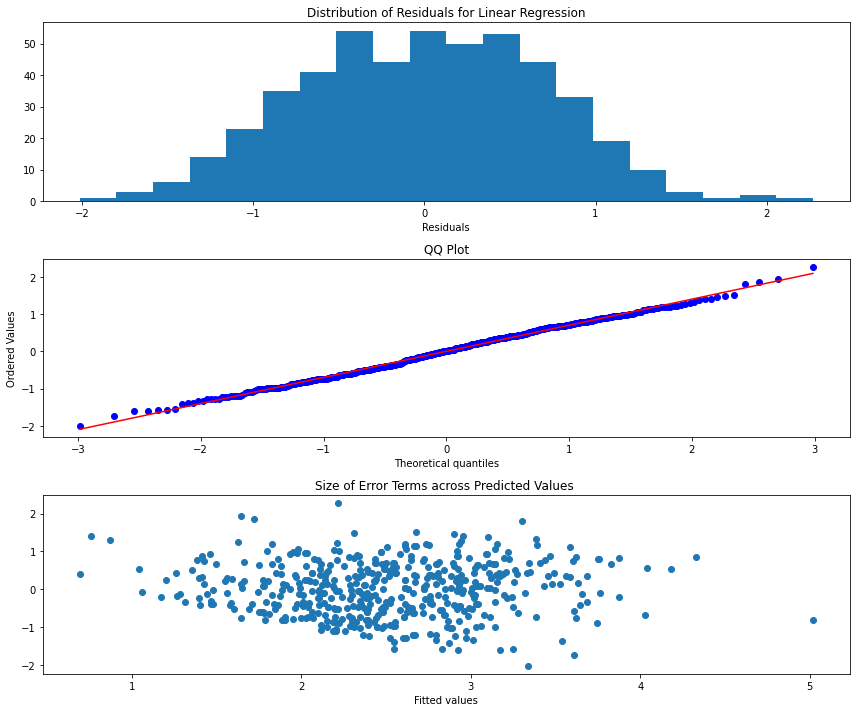

In [754]:
LinReg_Creator(X_attacker_stats3, log_y_attacker)

`Att 3rd Touches/90` and `Through Balls/90` both have coefficients that are not statistically significant. I am going to drop `Att 3rd Touches`, as it has the higher p-value, and will reassess `Through Balls/90` after the next model.

In [755]:
X_attacker_stats4 = X_attacker_stats3.drop('Att 3rd Touchs/90', axis = 1)

X_attacker_stats4.head()

,90s,non PK xG/90,Pass Cmp Pctg,Through Balls/90,GCA/90,Attacking Carries/90
0,45.1,0.450111,72.379032,0.243902,0.598670,2.572062
1,57.3,0.431065,81.338360,0.349040,0.628272,3.403141
2,57.1,0.392294,70.524297,0.402802,0.612960,2.311734
3,41.8,0.267943,78.195977,0.071770,0.502392,3.827751
4,37.5,0.258667,79.806808,0.186667,0.720000,5.840000


### Attacker Linear Regerssion 3

#### Premodel Checks

In [756]:
#correlation coefficient
CorrDF_Creator(X_attacker_stats4, log_y_attacker)

,Independent Variable,Correlation
2,Pass Cmp Pctg,0.332641
3,Through Balls/90,0.339327
5,Attacking Carries/90,0.365881
1,non PK xG/90,0.368609
4,GCA/90,0.386326
0,90s,0.476423


In [757]:
#VIF finder
VIF_Finder(X_attacker_stats4)

VIFs for our target variables are shown below


90s                     4.233761
non PK xG/90            5.804721
Pass Cmp Pctg           8.826098
Through Balls/90        2.314036
GCA/90                  5.814612
Attacking Carries/90    6.070690
dtype: float64

All VIFs are under the threshold this might be the final regression for the attackers. 

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


                                OLS Regression Results                               
Dep. Variable:     Market Values in Millions   R-squared:                       0.426
Model:                                   OLS   Adj. R-squared:                  0.419
Method:                        Least Squares   F-statistic:                     59.79
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           2.83e-55
Time:                               01:30:01   Log-Likelihood:                -521.82
No. Observations:                        491   AIC:                             1058.
Df Residuals:                            484   BIC:                             1087.
Df Model:                                  6                                         
Covariance Type:                   nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------

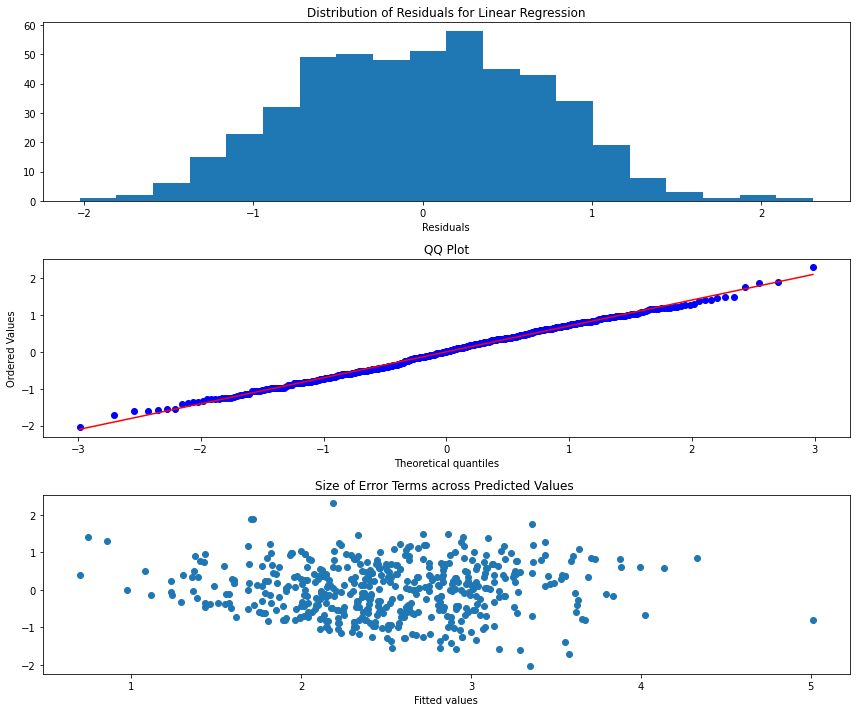

In [758]:
LinReg_Creator(X_attacker_stats4, log_y_attacker)

`Through Balls/90` still has a statistically insignificant coefficient. So it will be dropped. This next regression is likely to be the final one. 

In [759]:
#dropping though balls
X_attacker_final = X_attacker_stats4.drop(['Through Balls/90'], axis = 1)

#checking
X_attacker_final.head()

,90s,non PK xG/90,Pass Cmp Pctg,GCA/90,Attacking Carries/90
0,45.1,0.450111,72.379032,0.598670,2.572062
1,57.3,0.431065,81.338360,0.628272,3.403141
2,57.1,0.392294,70.524297,0.612960,2.311734
3,41.8,0.267943,78.195977,0.502392,3.827751
4,37.5,0.258667,79.806808,0.720000,5.840000


### Final Regression


In [760]:
#adding constants
X_final_attacker_constants = sm.add_constant(X_attacker_final)

#instantiating
final_attacker = sm.OLS(log_y_attacker, X_final_attacker_constants)

#fitting
final_attacker_results = final_attacker.fit()

final_attacker_results.summary()

/Users/benkatz/opt/anaconda3/envs/capstone/lib/python3.8/site-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                                OLS Regression Results                               
=====================================================================================
Dep. Variable:     Market Values in Millions   R-squared:                       0.423
Model:                                   OLS   Adj. R-squared:                  0.417
Method:                        Least Squares   F-statistic:                     71.05
Date:                       Mon, 04 Apr 2022   Prob (F-statistic):           1.05e-55
Time:                               01:30:03   Log-Likelihood:                -523.05
No. Observations:                        491   AIC:                             1058.
Df Residuals:                            485   BIC:                             1083.
Df Model:                                  5                                         
Covariance Type:                   nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -1.1194      0.354     -3.165      0.002      -1.814      -0.425
90s                      0.0227      0.002     10.037      0.000       0.018       0.027
non PK xG/90             1.1779      0.318      3.703      0.000       0.553       1.803
Pass Cmp Pctg            0.0318      0.005      6.361      0.000       0.022       0.042
GCA/90                   0.5373      0.184      2.923      0.004       0.176       0.899
Attacking Carries/90     0.1353      0.029      4.644      0.000       0.078       0.193
==============================================================================
Omnibus:                        2.071   Durbin-Watson:                   0.919
Prob(Omnibus):                  0.355   Jarque-Bera (JB):                1.798
Skew:                           0.006   Prob(JB):                        0.407
Kurtosis:                       2.704   Cond. No.                         860.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [761]:
final_attacker_df = pd.DataFrame({'Independent Variable': final_attacker_results.params.index,
                                 "Coefficient": final_attacker_results.params.values})


final_attacker_df['Practical Effect'] = np.expm1(final_attacker_df['Coefficient'])

final_attacker_df.sort_values('Practical Effect', ascending = False)

,Independent Variable,Coefficient,Practical Effect
2,non PK xG/90,1.177892,2.247520
4,GCA/90,0.537333,0.711436
5,Attacking Carries/90,0.135331,0.144916
3,Pass Cmp Pctg,0.031781,0.032291
1,90s,0.022708,0.022968
0,const,-1.119358,-0.673511


No surprise here, attackers are valued for scoring and creating goals.

## Linear Regression Conclusions
There are two main takeaways.

1) Scoring is paramount and valued across the field. Any player that can score will be valued more than other players.
2) There are a lot correlated independent variables. In my desire to find the most important statistics, I have missed the forest for the trees. For future analysis, I will create  composite statistics for each category, thus removing the collinearity from the dataset. 

# Notebook Conclusions
There was a lot learned in this notebook. 

The models made in this notebook performed well. Each one had an r-squared more than 20% above its baseline

Who you play for, and consequently with really matter. The best teams have the best players. They win the most games and accrue the most statistics. `Club Tier` is the strongest predictor of a players value. 

The models did well with the outliers, they were able to find their value even though it is mostly hypothetical. `Age` had a strong negative effect in each lasso model, and this is in part because of these young outliers. 

Scoring and chance creation are the most important indicators of value if `Club Tier` is removed from the data set

The models did not perform well with elite players. There statistics are not far enough away from there peers to pick up on the vast differences in market value. This might require more powerful models, which I will use in the next notebook. Before moving on I am going to save the data set created in this notebook to use in the next notebook. 

In [762]:
#seperating targets and features
X = market_values.drop(columns='Market Values in Millions')
y = market_values['Market Values in Millions']


#saving to CSV
X.to_csv('/Users/benkatz/Desktop/Capstone/CapstoneGit/population.csv',
                    header=True)
y.to_csv('/Users/benkatz/Desktop/Capstone/CapstoneGit/population_market_values.csv', 
                    header=True)
